<a href="https://colab.research.google.com/github/10100111/Display-of-HW1/blob/main/43_Pro_GANs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Задание Pro

Макс 10 баллов

Сделайте CGAN для генерации изображений Fashion Mnist, но label подавайте не индекс изображения, а рукописную цифру из Mnist картинкой 28 на 28.

Добейтесь максимальной детализации изображений, насколько получится.

Попробуйте сгенерировать образ по рукописным цифрам, нарисованным в paint.

In [7]:
# Подключение библиотек
from keras.datasets import mnist, cifar10, fashion_mnist # Mnist - набор рукописных цифр, cifar10 - изображения объектов 1-ти классов
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, BatchNormalization, Activation, MaxPooling2D, concatenate, Embedding, multiply # Базовые слои keras
from keras.layers.advanced_activations import LeakyReLU # LeakyReLU - функция активации
from keras.layers.convolutional import UpSampling2D, Conv2D # Сверточные слои keras
from keras.models import Sequential, Model # Формат модели keras

from tensorflow.keras.optimizers import Adam # Оптимизатор 
from keras.preprocessing import image
from PIL import Image

import matplotlib.pyplot as plt # Отображение графиков
import os
import numpy as np # Numpy массивы
import sys, random
from google.colab import files

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
img_rows = 28 # Высота изображения в пикселях
img_cols = 28 # Ширина изображения в пикселях
channels = 1 # Количество каналов (глубина изображения)
img_shape = (img_rows, img_cols, channels) # Размерность входных данных для набора Mnist
latent_dim = 400 # Размерность скрытого пространства
batch_size = 128 # Размер batch_size
num_classes = 10
optimizer = Adam(0.0002, 0.5) # Оптимайзер

lbl_eng = ['t-shirt','trouser','pullover','dress','coat','sandal','shirt','sneaker','bag','ankle boot']
lbl_rus = ['футболка','брюки','пуловер','платье','пальто','сандали','рубашка','кросовки','сумка','ботильоны']

In [9]:
!mkdir images # Создаем каталог 'images'

In [10]:
# Загружаем датасеты , только обучающие наборы данных

(xTrainMnist, yTrainMnist), (_, _) = mnist.load_data()  # Загружаем в X_train изображения рукописных цифр из mnist, в y_train соответсвующие номера классов
(xTrainMnistF, yTrainMnistF), (_, _) = fashion_mnist.load_data()
 

4431872/4422102 [==============================] - 0s 0us/step


In [11]:
# Преобразуем данные в диапазон от -1 до 1
xTrainMnist = xTrainMnist/ 127.5 - 1.0
xTrainMnistF = xTrainMnistF/ 127.5 - 1.0

xTrainMnist = np.expand_dims(xTrainMnist, axis=3)
xTrainMnistF = np.expand_dims(xTrainMnistF, axis=3)



In [12]:
print("MNIST - обучающий н.д.")
print('xTrainMnist', xTrainMnist.shape)
print('yTrainMnist', yTrainMnist.shape)
print()
print("Fashion MNIST - обучающий н.д.")
print('xTrainMnistF', xTrainMnistF.shape )
print('yTrainMnistF', yTrainMnistF.shape)
 

MNIST - обучающий н.д.
xTrainMnist (60000, 28, 28, 1)
yTrainMnist (60000,)

Fashion MNIST - обучающий н.д.
xTrainMnistF (60000, 28, 28, 1)
yTrainMnistF (60000,)


# Синхронизация наборов данных

In [10]:
# Cобираем все индексы меток по 10 классам в один массив
 
indxs = [] # объявляем переменную в которую будем записывать индексы
for i in range (num_classes): # обходим все классы
  mnist_indxs = np.array(np.where(yTrainMnist==i)) # выбираем из меток значения , соответствующие классу i
  # print(mnist_indxs)
  # print(mnist_indxs.shape[1])   
  indxs.append(mnist_indxs.reshape(-1)) # добавляем значения в список и решейпим до одномерных
indxs = np.array(indxs) # преобрзуем олученные данные в массив
indxs.shape


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  if __name__ == '__main__':


(10,)

In [11]:
indxs[0][:5] 

array([ 1, 21, 34, 37, 51])

In [12]:
# Сортируем изображения 
labels = np.zeros(10, dtype='int32')
 
lbl_xTrainMnist_sort = [] # здесь будут отсортированные картинки MNIST

for i in range(xTrainMnistF.shape[0]): # обходим массив данных длиной 60 000
  lbl_xTrainMnist_sort.append(xTrainMnist[indxs[yTrainMnistF[i]][labels[yTrainMnistF[i]] % labels[yTrainMnistF[i]].size]]) #собираем картинки базы MNIST по классам и меткам Fashion MNIST 
  # print(indxs[yTrainMnistF[i]]) 
  # print('*****************************************')
  # print(indxs[yTrainMnistF[i]][labels[yTrainMnistF[i]]])
  labels[yTrainMnistF[i]]+=1
lbl_xTrainMnist_sort = np.array(lbl_xTrainMnist_sort) 
lbl_xTrainMnist_sort.shape 
 

(60000, 28, 28, 1)

In [13]:
# print(lbl_xTrainMnist_sort[0])

# Генератор и дискриминатор (сверточная архитектура)

In [5]:
def create_conditional_generator():
  generator = Sequential()
  generator.add (Conv2D(32, (2,2), padding='same'))
  generator.add (LeakyReLU(alpha=0.2))
  generator.add (Conv2D(64, (2,2), padding='same'))
  generator.add (LeakyReLU(alpha=0.2))
  # generator.add (Conv2D (1, (7,7), activation='tanh', padding='same'))
  generator.add(Flatten())
  generator.add(Dense(np.prod(img_shape), activation='tanh'))
  generator.add(Reshape(img_shape)) 

  noise = Input(shape=(latent_dim,))
  noise_modify = Dense (batch_size * 7 * 7) (noise)
  noise_modify = LeakyReLU (alpha=0.2) (noise_modify)
  noise_modify = Reshape ((7,7,batch_size)) (noise_modify)
  
  label = Input(shape=(28,28,1))
  label_modify = Flatten() (label)
  label_modify = Dense (7*7) (label_modify)
  label_modify = Reshape ((7,7,1)) (label_modify)

  model_input = concatenate([noise_modify, label_modify])
  img = generator(model_input)

  generator = Model([noise, label], img)
  
  return generator

In [6]:
def create_conditional_discriminator():
  
  discriminator = Sequential()
  discriminator.add(Conv2D(64,(3,3),strides=(2,2), padding='same'))
  discriminator.add(LeakyReLU(alpha=0.2))
  discriminator.add(Conv2D(64,(3,3),strides=(2,2), padding='same'))
  discriminator.add(LeakyReLU(alpha=0.2))
  discriminator.add(Flatten())
  discriminator.add(Dense(32))
  discriminator.add(Dropout(0.4))
  discriminator.add(Dense(1,activation='sigmoid'))  
  
  img = Input(shape=img_shape)

  label = Input(shape=(28,28,1))

  label_modify = Reshape ((img_shape[0], img_shape[1], 1))(label)    
  model_input = concatenate([img,label_modify])

  #model_input = multiply([flat_img, label_embedding])
  validity = discriminator(model_input)

  discriminator = Model([img, label], validity)

  discriminator.compile(loss='binary_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

  discriminator.trainable = False

  return discriminator

# Обучение

In [14]:
def sample_images_conditional(epoch, gen):
  r, c = 2, 5
  noise = np.random.normal(0, 1, (r * c, latent_dim))
  sampled_labels=[]
  # Генерируем массив из 10 случайных меток (от 0 до 9)  
  for i in range(num_classes):    
    # Берём случайную метку из всех меток i-го класса
    sampled_labels.append(lbl_xTrainMnist_sort[yTrainMnistF==i][np.random.randint(0,lbl_xTrainMnist_sort[yTrainMnistF==i].shape[0])])
  sampled_labels = np.array(sampled_labels)
  gen_imgs = gen.predict([noise, sampled_labels])

  # Rescale images 0 - 1
  gen_imgs = 0.5 * gen_imgs + 0.5

  fig, axs = plt.subplots(r, c)
  cnt = 0
  for i in range(r):
      for j in range(c):
          axs[i,j].imshow(gen_imgs[cnt].reshape((28,28)), cmap='gray')
          axs[i,j].axis('off')
          cnt += 1
  plt.show()
  fig.savefig("images/%d.png" % epoch)
  plt.close()

In [15]:
def train_conditional(generator, discriminator, epochs=30000, batch_size=128, sample_interval = 200):
  valid = np.ones((batch_size, 1))
  fake = np.zeros((batch_size, 1))
  
  noise = Input(shape=(latent_dim,))
  label = Input(shape=img_shape)
  img = generator([noise, label])
  
  val = discriminator([img, label])
  
  combined = Model([noise, label], val)
  combined.compile(loss=['binary_crossentropy'],
      optimizer=optimizer)

  
  d_loss_list = []
  g_loss_list = []
  d_acc_list = []
  
  for epoch in range(epochs):
    # ---------------------
    #  Train Discriminator
    # ---------------------

    # Select a random batch of images
    
    idx1 = np.random.randint(0, xTrainMnistF.shape[0], batch_size)    
    imgs = xTrainMnistF[idx1]
    labels = lbl_xTrainMnist_sort[idx1]

    noise = np.random.normal(0, 1, (batch_size, latent_dim))

    # Generate a batch of new images
    gen_imgs = generator.predict([noise, labels])
    
    # Train the discriminator
    d_loss_real = discriminator.train_on_batch([imgs, labels], valid)
    d_loss_fake = discriminator.train_on_batch([gen_imgs, labels], fake)
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # ---------------------
    #  Train Generator
    # ---------------------

    idx2 = np.random.randint(0, lbl_xTrainMnist_sort.shape[0], batch_size)
    sampled_labels = lbl_xTrainMnist_sort[idx2]
    
    # Train the generator (to have the discriminator label samples as valid)
    g_loss = combined.train_on_batch([noise, sampled_labels], valid)

    # Plot the progress
    print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

    d_loss_list.append(d_loss[0])
    g_loss_list.append(g_loss)
    d_acc_list.append(100*d_loss[1])

    # If at save interval => save generated image samples
    if ((epoch % sample_interval == 0) | (epoch == epochs-1)):
        sample_images_conditional(epoch, generator)
        
  plt.plot(d_loss_list, label="Ошибка дискриминатора")
  plt.plot(g_loss_list, label="Ошибка генератора")
  plt.legend()
  plt.show()
  plt.plot(d_acc_list, label="Точность распознавания дискриминатора")
  plt.legend()
  plt.show()
    

In [16]:
conditional_generator = create_conditional_generator()
conditional_discriminator = create_conditional_discriminator()

In [17]:
conditional_generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 400)]        0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 dense_1 (Dense)                (None, 6272)         2515072     ['input_1[0][0]']                
                                                                                                  
 flatten_1 (Flatten)            (None, 784)          0           ['input_2[0][0]']                
                                                                                              

In [18]:
conditional_discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 reshape_3 (Reshape)            (None, 28, 28, 1)    0           ['input_4[0][0]']                
                                                                                                  
 concatenate_1 (Concatenate)    (None, 28, 28, 2)    0           ['input_3[0][0]',                
                                                                  'reshape_3[0][0]']        

0 [D loss: 0.741259, acc.: 35.55%] [G loss: 0.607594]


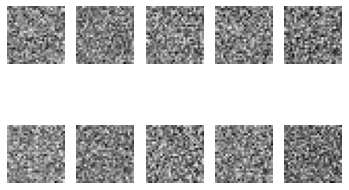

1 [D loss: 0.703255, acc.: 48.83%] [G loss: 0.604908]
2 [D loss: 0.708997, acc.: 49.22%] [G loss: 0.576814]
3 [D loss: 0.722818, acc.: 49.22%] [G loss: 0.559372]
4 [D loss: 0.746865, acc.: 50.00%] [G loss: 0.538233]
5 [D loss: 0.762287, acc.: 49.22%] [G loss: 0.505624]
6 [D loss: 0.807401, acc.: 48.83%] [G loss: 0.488368]
7 [D loss: 0.831080, acc.: 46.88%] [G loss: 0.489113]
8 [D loss: 0.812757, acc.: 46.09%] [G loss: 0.527798]
9 [D loss: 0.784383, acc.: 47.27%] [G loss: 0.599566]
10 [D loss: 0.723582, acc.: 48.83%] [G loss: 0.653562]
11 [D loss: 0.686383, acc.: 49.22%] [G loss: 0.734317]
12 [D loss: 0.661044, acc.: 54.69%] [G loss: 0.778204]
13 [D loss: 0.653620, acc.: 54.30%] [G loss: 0.807197]
14 [D loss: 0.647617, acc.: 60.55%] [G loss: 0.821781]
15 [D loss: 0.648880, acc.: 55.47%] [G loss: 0.829042]
16 [D loss: 0.634507, acc.: 62.11%] [G loss: 0.837665]
17 [D loss: 0.641217, acc.: 60.94%] [G loss: 0.848941]
18 [D loss: 0.642705, acc.: 64.06%] [G loss: 0.853907]
19 [D loss: 0.68208

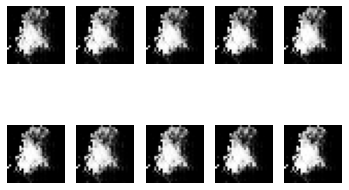

201 [D loss: 0.739648, acc.: 51.95%] [G loss: 0.855337]
202 [D loss: 0.758270, acc.: 53.52%] [G loss: 0.855849]
203 [D loss: 0.742543, acc.: 57.03%] [G loss: 0.885638]
204 [D loss: 0.726116, acc.: 59.38%] [G loss: 0.899999]
205 [D loss: 0.719845, acc.: 63.28%] [G loss: 0.913469]
206 [D loss: 0.706722, acc.: 64.84%] [G loss: 0.953728]
207 [D loss: 0.667569, acc.: 69.92%] [G loss: 0.971666]
208 [D loss: 0.646159, acc.: 69.53%] [G loss: 0.992055]
209 [D loss: 0.605822, acc.: 71.09%] [G loss: 1.014368]
210 [D loss: 0.592099, acc.: 72.66%] [G loss: 1.071230]
211 [D loss: 0.557461, acc.: 78.91%] [G loss: 1.097240]
212 [D loss: 0.541264, acc.: 82.42%] [G loss: 1.123976]
213 [D loss: 0.518490, acc.: 84.77%] [G loss: 1.184217]
214 [D loss: 0.476915, acc.: 90.62%] [G loss: 1.217383]
215 [D loss: 0.467056, acc.: 90.23%] [G loss: 1.250254]
216 [D loss: 0.454808, acc.: 89.45%] [G loss: 1.221898]
217 [D loss: 0.469923, acc.: 90.23%] [G loss: 1.202153]
218 [D loss: 0.460280, acc.: 90.23%] [G loss: 1.

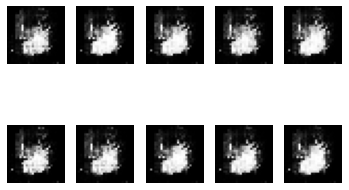

401 [D loss: 0.549917, acc.: 89.45%] [G loss: 1.029832]
402 [D loss: 0.560403, acc.: 83.98%] [G loss: 1.023379]
403 [D loss: 0.552668, acc.: 85.94%] [G loss: 1.025254]
404 [D loss: 0.563051, acc.: 83.20%] [G loss: 1.020815]
405 [D loss: 0.562346, acc.: 82.81%] [G loss: 1.005310]
406 [D loss: 0.585339, acc.: 80.86%] [G loss: 0.989252]
407 [D loss: 0.581251, acc.: 80.86%] [G loss: 0.979429]
408 [D loss: 0.575907, acc.: 81.25%] [G loss: 0.984175]
409 [D loss: 0.556174, acc.: 83.98%] [G loss: 0.996968]
410 [D loss: 0.579030, acc.: 79.30%] [G loss: 0.999221]
411 [D loss: 0.587495, acc.: 78.52%] [G loss: 0.986015]
412 [D loss: 0.600174, acc.: 76.17%] [G loss: 0.946427]
413 [D loss: 0.618114, acc.: 67.97%] [G loss: 0.920325]
414 [D loss: 0.609639, acc.: 66.41%] [G loss: 0.917707]
415 [D loss: 0.652109, acc.: 54.30%] [G loss: 0.891779]
416 [D loss: 0.658673, acc.: 60.16%] [G loss: 0.897725]
417 [D loss: 0.658511, acc.: 56.64%] [G loss: 0.876495]
418 [D loss: 0.717128, acc.: 49.22%] [G loss: 0.

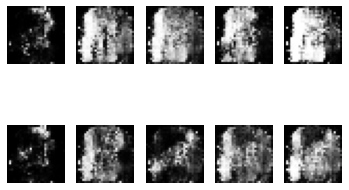

601 [D loss: 0.781087, acc.: 28.52%] [G loss: 0.645115]
602 [D loss: 0.793414, acc.: 25.39%] [G loss: 0.637100]
603 [D loss: 0.817283, acc.: 25.78%] [G loss: 0.660826]
604 [D loss: 0.773028, acc.: 28.91%] [G loss: 0.664467]
605 [D loss: 0.786125, acc.: 25.78%] [G loss: 0.693651]
606 [D loss: 0.768698, acc.: 33.98%] [G loss: 0.686448]
607 [D loss: 0.748401, acc.: 37.11%] [G loss: 0.727059]
608 [D loss: 0.720619, acc.: 48.05%] [G loss: 0.736384]
609 [D loss: 0.721234, acc.: 49.61%] [G loss: 0.742954]
610 [D loss: 0.724583, acc.: 46.48%] [G loss: 0.771715]
611 [D loss: 0.702814, acc.: 52.73%] [G loss: 0.758006]
612 [D loss: 0.703179, acc.: 57.03%] [G loss: 0.785148]
613 [D loss: 0.664353, acc.: 62.89%] [G loss: 0.788588]
614 [D loss: 0.696061, acc.: 50.39%] [G loss: 0.784605]
615 [D loss: 0.675908, acc.: 61.33%] [G loss: 0.781150]
616 [D loss: 0.669679, acc.: 60.16%] [G loss: 0.760232]
617 [D loss: 0.665581, acc.: 62.11%] [G loss: 0.774989]
618 [D loss: 0.673506, acc.: 61.72%] [G loss: 0.

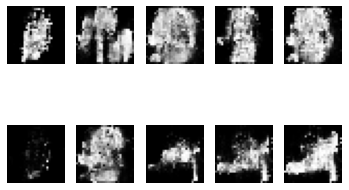

801 [D loss: 0.713086, acc.: 35.94%] [G loss: 0.715622]
802 [D loss: 0.706671, acc.: 41.80%] [G loss: 0.709179]
803 [D loss: 0.710518, acc.: 43.36%] [G loss: 0.696661]
804 [D loss: 0.713561, acc.: 39.06%] [G loss: 0.703008]
805 [D loss: 0.728519, acc.: 30.47%] [G loss: 0.693470]
806 [D loss: 0.723813, acc.: 33.98%] [G loss: 0.694257]
807 [D loss: 0.722452, acc.: 35.55%] [G loss: 0.693900]
808 [D loss: 0.722886, acc.: 32.03%] [G loss: 0.686181]
809 [D loss: 0.721495, acc.: 33.59%] [G loss: 0.680003]
810 [D loss: 0.734660, acc.: 30.47%] [G loss: 0.685023]
811 [D loss: 0.729952, acc.: 28.91%] [G loss: 0.685779]
812 [D loss: 0.734024, acc.: 27.34%] [G loss: 0.673063]
813 [D loss: 0.727803, acc.: 30.86%] [G loss: 0.673276]
814 [D loss: 0.727745, acc.: 28.52%] [G loss: 0.676016]
815 [D loss: 0.731555, acc.: 25.39%] [G loss: 0.676552]
816 [D loss: 0.736447, acc.: 23.44%] [G loss: 0.683064]
817 [D loss: 0.724821, acc.: 32.03%] [G loss: 0.683889]
818 [D loss: 0.731942, acc.: 23.83%] [G loss: 0.

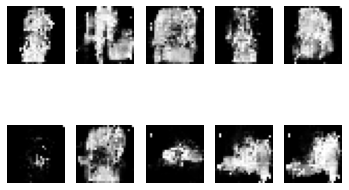

1001 [D loss: 0.706337, acc.: 41.80%] [G loss: 0.713041]
1002 [D loss: 0.701740, acc.: 45.70%] [G loss: 0.715387]
1003 [D loss: 0.703897, acc.: 41.80%] [G loss: 0.715044]
1004 [D loss: 0.710194, acc.: 40.23%] [G loss: 0.709156]
1005 [D loss: 0.706997, acc.: 39.45%] [G loss: 0.714862]
1006 [D loss: 0.708405, acc.: 37.89%] [G loss: 0.717665]
1007 [D loss: 0.704575, acc.: 40.62%] [G loss: 0.712705]
1008 [D loss: 0.703854, acc.: 46.48%] [G loss: 0.717522]
1009 [D loss: 0.713985, acc.: 35.94%] [G loss: 0.716480]
1010 [D loss: 0.709322, acc.: 40.23%] [G loss: 0.711570]
1011 [D loss: 0.707907, acc.: 38.28%] [G loss: 0.706524]
1012 [D loss: 0.707604, acc.: 37.89%] [G loss: 0.706252]
1013 [D loss: 0.706550, acc.: 41.41%] [G loss: 0.709792]
1014 [D loss: 0.703867, acc.: 40.23%] [G loss: 0.714393]
1015 [D loss: 0.708713, acc.: 40.23%] [G loss: 0.716959]
1016 [D loss: 0.706423, acc.: 38.28%] [G loss: 0.712931]
1017 [D loss: 0.705291, acc.: 40.23%] [G loss: 0.715640]
1018 [D loss: 0.705322, acc.: 4

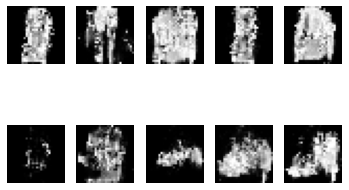

1201 [D loss: 0.692929, acc.: 49.22%] [G loss: 0.718651]
1202 [D loss: 0.691148, acc.: 50.78%] [G loss: 0.727041]
1203 [D loss: 0.694828, acc.: 48.44%] [G loss: 0.719595]
1204 [D loss: 0.700933, acc.: 41.80%] [G loss: 0.721144]
1205 [D loss: 0.695610, acc.: 49.22%] [G loss: 0.731296]
1206 [D loss: 0.701946, acc.: 43.36%] [G loss: 0.714137]
1207 [D loss: 0.692855, acc.: 48.05%] [G loss: 0.724069]
1208 [D loss: 0.695688, acc.: 48.44%] [G loss: 0.721284]
1209 [D loss: 0.698490, acc.: 45.31%] [G loss: 0.713490]
1210 [D loss: 0.694446, acc.: 44.53%] [G loss: 0.724872]
1211 [D loss: 0.695583, acc.: 46.88%] [G loss: 0.717661]
1212 [D loss: 0.699593, acc.: 43.75%] [G loss: 0.714474]
1213 [D loss: 0.699869, acc.: 44.92%] [G loss: 0.721536]
1214 [D loss: 0.707066, acc.: 38.67%] [G loss: 0.720391]
1215 [D loss: 0.697130, acc.: 48.44%] [G loss: 0.717073]
1216 [D loss: 0.696864, acc.: 49.61%] [G loss: 0.720288]
1217 [D loss: 0.696553, acc.: 49.22%] [G loss: 0.716584]
1218 [D loss: 0.697708, acc.: 4

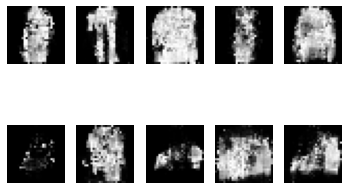

1401 [D loss: 0.693658, acc.: 49.61%] [G loss: 0.713357]
1402 [D loss: 0.698787, acc.: 44.92%] [G loss: 0.715942]
1403 [D loss: 0.695923, acc.: 51.17%] [G loss: 0.717552]
1404 [D loss: 0.701807, acc.: 45.31%] [G loss: 0.709978]
1405 [D loss: 0.699149, acc.: 46.09%] [G loss: 0.706363]
1406 [D loss: 0.695340, acc.: 48.83%] [G loss: 0.717953]
1407 [D loss: 0.697311, acc.: 45.31%] [G loss: 0.710026]
1408 [D loss: 0.699241, acc.: 47.27%] [G loss: 0.710746]
1409 [D loss: 0.697026, acc.: 48.05%] [G loss: 0.703724]
1410 [D loss: 0.698158, acc.: 48.83%] [G loss: 0.705625]
1411 [D loss: 0.699489, acc.: 44.53%] [G loss: 0.705561]
1412 [D loss: 0.702547, acc.: 42.97%] [G loss: 0.711599]
1413 [D loss: 0.702718, acc.: 41.02%] [G loss: 0.704268]
1414 [D loss: 0.702931, acc.: 44.14%] [G loss: 0.708917]
1415 [D loss: 0.701282, acc.: 42.58%] [G loss: 0.709406]
1416 [D loss: 0.704286, acc.: 42.58%] [G loss: 0.714751]
1417 [D loss: 0.703316, acc.: 42.97%] [G loss: 0.717506]
1418 [D loss: 0.700559, acc.: 4

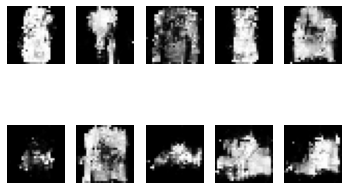

1601 [D loss: 0.696834, acc.: 47.27%] [G loss: 0.716040]
1602 [D loss: 0.698124, acc.: 42.19%] [G loss: 0.710525]
1603 [D loss: 0.702924, acc.: 39.45%] [G loss: 0.712792]
1604 [D loss: 0.705260, acc.: 36.72%] [G loss: 0.718964]
1605 [D loss: 0.695235, acc.: 45.70%] [G loss: 0.715731]
1606 [D loss: 0.701387, acc.: 41.02%] [G loss: 0.721090]
1607 [D loss: 0.697695, acc.: 42.58%] [G loss: 0.723308]
1608 [D loss: 0.700134, acc.: 42.97%] [G loss: 0.713041]
1609 [D loss: 0.701272, acc.: 44.53%] [G loss: 0.716139]
1610 [D loss: 0.704607, acc.: 39.84%] [G loss: 0.716938]
1611 [D loss: 0.701146, acc.: 42.19%] [G loss: 0.715918]
1612 [D loss: 0.702868, acc.: 42.58%] [G loss: 0.708931]
1613 [D loss: 0.705685, acc.: 38.28%] [G loss: 0.705697]
1614 [D loss: 0.705443, acc.: 42.58%] [G loss: 0.710889]
1615 [D loss: 0.706117, acc.: 43.36%] [G loss: 0.710575]
1616 [D loss: 0.709305, acc.: 40.23%] [G loss: 0.716579]
1617 [D loss: 0.706220, acc.: 41.80%] [G loss: 0.706847]
1618 [D loss: 0.705794, acc.: 3

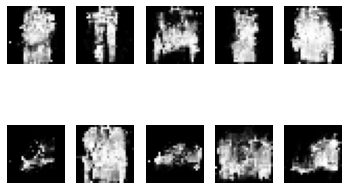

1801 [D loss: 0.693248, acc.: 49.22%] [G loss: 0.724989]
1802 [D loss: 0.691099, acc.: 53.52%] [G loss: 0.725009]
1803 [D loss: 0.697725, acc.: 54.69%] [G loss: 0.727995]
1804 [D loss: 0.696529, acc.: 53.91%] [G loss: 0.727875]
1805 [D loss: 0.692339, acc.: 55.08%] [G loss: 0.722068]
1806 [D loss: 0.690095, acc.: 55.47%] [G loss: 0.723119]
1807 [D loss: 0.692115, acc.: 54.69%] [G loss: 0.708713]
1808 [D loss: 0.696252, acc.: 51.95%] [G loss: 0.719925]
1809 [D loss: 0.696782, acc.: 50.39%] [G loss: 0.718485]
1810 [D loss: 0.693134, acc.: 51.56%] [G loss: 0.718780]
1811 [D loss: 0.696661, acc.: 47.66%] [G loss: 0.717856]
1812 [D loss: 0.695515, acc.: 47.66%] [G loss: 0.719181]
1813 [D loss: 0.695024, acc.: 48.83%] [G loss: 0.732007]
1814 [D loss: 0.699931, acc.: 46.09%] [G loss: 0.725122]
1815 [D loss: 0.701198, acc.: 42.19%] [G loss: 0.719130]
1816 [D loss: 0.698008, acc.: 43.36%] [G loss: 0.726487]
1817 [D loss: 0.690953, acc.: 52.73%] [G loss: 0.720657]
1818 [D loss: 0.694493, acc.: 4

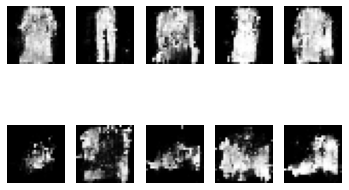

2001 [D loss: 0.695576, acc.: 45.31%] [G loss: 0.719968]
2002 [D loss: 0.694909, acc.: 49.22%] [G loss: 0.722508]
2003 [D loss: 0.695347, acc.: 46.88%] [G loss: 0.712904]
2004 [D loss: 0.702129, acc.: 40.62%] [G loss: 0.715567]
2005 [D loss: 0.701567, acc.: 43.75%] [G loss: 0.721480]
2006 [D loss: 0.691947, acc.: 50.39%] [G loss: 0.732072]
2007 [D loss: 0.698316, acc.: 43.36%] [G loss: 0.724888]
2008 [D loss: 0.693222, acc.: 49.22%] [G loss: 0.737250]
2009 [D loss: 0.694201, acc.: 47.66%] [G loss: 0.738017]
2010 [D loss: 0.695612, acc.: 51.17%] [G loss: 0.738620]
2011 [D loss: 0.689401, acc.: 53.91%] [G loss: 0.735451]
2012 [D loss: 0.689221, acc.: 53.12%] [G loss: 0.737627]
2013 [D loss: 0.696771, acc.: 51.95%] [G loss: 0.741205]
2014 [D loss: 0.691897, acc.: 53.52%] [G loss: 0.741321]
2015 [D loss: 0.692859, acc.: 56.25%] [G loss: 0.734231]
2016 [D loss: 0.696171, acc.: 53.52%] [G loss: 0.732399]
2017 [D loss: 0.694079, acc.: 54.30%] [G loss: 0.734671]
2018 [D loss: 0.697624, acc.: 4

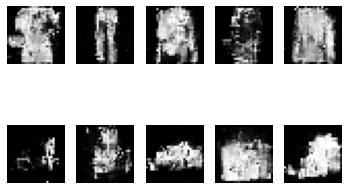

2201 [D loss: 0.684937, acc.: 53.91%] [G loss: 0.723644]
2202 [D loss: 0.692275, acc.: 50.39%] [G loss: 0.714861]
2203 [D loss: 0.684420, acc.: 52.73%] [G loss: 0.714412]
2204 [D loss: 0.677190, acc.: 60.55%] [G loss: 0.728506]
2205 [D loss: 0.691341, acc.: 46.88%] [G loss: 0.718552]
2206 [D loss: 0.685565, acc.: 50.00%] [G loss: 0.723918]
2207 [D loss: 0.688305, acc.: 49.61%] [G loss: 0.723716]
2208 [D loss: 0.686426, acc.: 55.86%] [G loss: 0.724420]
2209 [D loss: 0.685750, acc.: 56.25%] [G loss: 0.727118]
2210 [D loss: 0.691079, acc.: 50.78%] [G loss: 0.732483]
2211 [D loss: 0.684293, acc.: 53.52%] [G loss: 0.727155]
2212 [D loss: 0.679059, acc.: 58.20%] [G loss: 0.731954]
2213 [D loss: 0.687347, acc.: 49.61%] [G loss: 0.723407]
2214 [D loss: 0.692484, acc.: 50.00%] [G loss: 0.721233]
2215 [D loss: 0.683470, acc.: 56.64%] [G loss: 0.725853]
2216 [D loss: 0.686109, acc.: 53.91%] [G loss: 0.722457]
2217 [D loss: 0.683563, acc.: 55.86%] [G loss: 0.720075]
2218 [D loss: 0.684343, acc.: 5

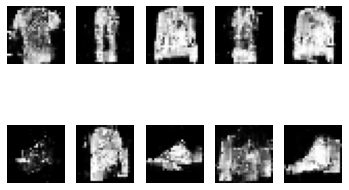

2401 [D loss: 0.684621, acc.: 55.08%] [G loss: 0.729339]
2402 [D loss: 0.692882, acc.: 50.39%] [G loss: 0.728586]
2403 [D loss: 0.692104, acc.: 50.00%] [G loss: 0.732009]
2404 [D loss: 0.684955, acc.: 55.08%] [G loss: 0.740583]
2405 [D loss: 0.693802, acc.: 50.00%] [G loss: 0.723381]
2406 [D loss: 0.693500, acc.: 53.91%] [G loss: 0.729055]
2407 [D loss: 0.691181, acc.: 52.34%] [G loss: 0.728285]
2408 [D loss: 0.686213, acc.: 56.25%] [G loss: 0.727034]
2409 [D loss: 0.685590, acc.: 56.64%] [G loss: 0.722059]
2410 [D loss: 0.690459, acc.: 56.25%] [G loss: 0.733740]
2411 [D loss: 0.690189, acc.: 53.91%] [G loss: 0.723551]
2412 [D loss: 0.694664, acc.: 53.12%] [G loss: 0.730890]
2413 [D loss: 0.687788, acc.: 54.69%] [G loss: 0.730671]
2414 [D loss: 0.684006, acc.: 59.77%] [G loss: 0.744658]
2415 [D loss: 0.690864, acc.: 53.52%] [G loss: 0.731415]
2416 [D loss: 0.687430, acc.: 52.73%] [G loss: 0.731354]
2417 [D loss: 0.683802, acc.: 58.98%] [G loss: 0.732725]
2418 [D loss: 0.683987, acc.: 5

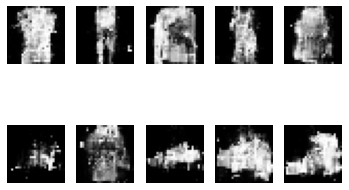

2601 [D loss: 0.682115, acc.: 57.81%] [G loss: 0.717348]
2602 [D loss: 0.685562, acc.: 53.91%] [G loss: 0.740577]
2603 [D loss: 0.691860, acc.: 48.83%] [G loss: 0.731279]
2604 [D loss: 0.687127, acc.: 53.91%] [G loss: 0.727352]
2605 [D loss: 0.682609, acc.: 57.42%] [G loss: 0.738634]
2606 [D loss: 0.685761, acc.: 48.44%] [G loss: 0.734441]
2607 [D loss: 0.688796, acc.: 53.52%] [G loss: 0.732749]
2608 [D loss: 0.687904, acc.: 55.47%] [G loss: 0.729221]
2609 [D loss: 0.692255, acc.: 50.78%] [G loss: 0.740174]
2610 [D loss: 0.693110, acc.: 54.30%] [G loss: 0.738016]
2611 [D loss: 0.693234, acc.: 54.69%] [G loss: 0.731566]
2612 [D loss: 0.686419, acc.: 56.64%] [G loss: 0.738039]
2613 [D loss: 0.685294, acc.: 62.11%] [G loss: 0.745282]
2614 [D loss: 0.686356, acc.: 52.73%] [G loss: 0.741144]
2615 [D loss: 0.685266, acc.: 59.38%] [G loss: 0.745940]
2616 [D loss: 0.684576, acc.: 60.16%] [G loss: 0.749178]
2617 [D loss: 0.677692, acc.: 58.20%] [G loss: 0.750541]
2618 [D loss: 0.679101, acc.: 6

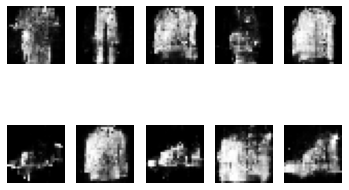

2801 [D loss: 0.713412, acc.: 44.53%] [G loss: 0.718435]
2802 [D loss: 0.711107, acc.: 42.97%] [G loss: 0.704967]
2803 [D loss: 0.694872, acc.: 53.91%] [G loss: 0.704324]
2804 [D loss: 0.701343, acc.: 48.44%] [G loss: 0.707802]
2805 [D loss: 0.705407, acc.: 47.27%] [G loss: 0.712470]
2806 [D loss: 0.704137, acc.: 47.27%] [G loss: 0.708392]
2807 [D loss: 0.712460, acc.: 44.92%] [G loss: 0.703393]
2808 [D loss: 0.700589, acc.: 47.66%] [G loss: 0.720332]
2809 [D loss: 0.695658, acc.: 51.95%] [G loss: 0.722382]
2810 [D loss: 0.703644, acc.: 41.80%] [G loss: 0.706338]
2811 [D loss: 0.706225, acc.: 45.70%] [G loss: 0.711644]
2812 [D loss: 0.708129, acc.: 41.02%] [G loss: 0.693517]
2813 [D loss: 0.708547, acc.: 42.97%] [G loss: 0.703840]
2814 [D loss: 0.708866, acc.: 40.62%] [G loss: 0.698069]
2815 [D loss: 0.708766, acc.: 42.58%] [G loss: 0.699113]
2816 [D loss: 0.722233, acc.: 36.72%] [G loss: 0.693278]
2817 [D loss: 0.705470, acc.: 46.09%] [G loss: 0.712962]
2818 [D loss: 0.707566, acc.: 4

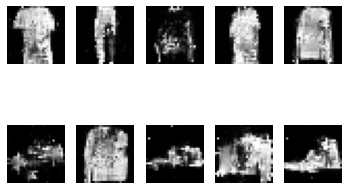

3001 [D loss: 0.696456, acc.: 43.36%] [G loss: 0.717339]
3002 [D loss: 0.683383, acc.: 51.56%] [G loss: 0.712744]
3003 [D loss: 0.685327, acc.: 51.17%] [G loss: 0.707934]
3004 [D loss: 0.689319, acc.: 51.56%] [G loss: 0.722980]
3005 [D loss: 0.688045, acc.: 54.69%] [G loss: 0.730948]
3006 [D loss: 0.676009, acc.: 62.11%] [G loss: 0.724484]
3007 [D loss: 0.682550, acc.: 55.08%] [G loss: 0.730505]
3008 [D loss: 0.685870, acc.: 58.98%] [G loss: 0.731412]
3009 [D loss: 0.687428, acc.: 51.95%] [G loss: 0.706194]
3010 [D loss: 0.691468, acc.: 56.64%] [G loss: 0.728334]
3011 [D loss: 0.694042, acc.: 53.91%] [G loss: 0.719439]
3012 [D loss: 0.681793, acc.: 55.86%] [G loss: 0.727467]
3013 [D loss: 0.686864, acc.: 57.03%] [G loss: 0.725967]
3014 [D loss: 0.689954, acc.: 55.08%] [G loss: 0.723938]
3015 [D loss: 0.702100, acc.: 49.22%] [G loss: 0.722342]
3016 [D loss: 0.695572, acc.: 51.56%] [G loss: 0.723466]
3017 [D loss: 0.692695, acc.: 47.66%] [G loss: 0.716137]
3018 [D loss: 0.700561, acc.: 4

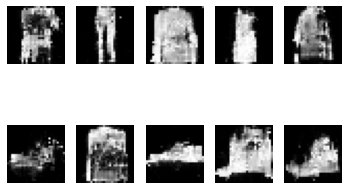

3201 [D loss: 0.704363, acc.: 36.72%] [G loss: 0.727786]
3202 [D loss: 0.693046, acc.: 45.70%] [G loss: 0.720518]
3203 [D loss: 0.699768, acc.: 43.36%] [G loss: 0.724972]
3204 [D loss: 0.694525, acc.: 46.48%] [G loss: 0.719805]
3205 [D loss: 0.692193, acc.: 49.22%] [G loss: 0.721322]
3206 [D loss: 0.690446, acc.: 48.44%] [G loss: 0.731152]
3207 [D loss: 0.695769, acc.: 43.75%] [G loss: 0.730131]
3208 [D loss: 0.698977, acc.: 40.23%] [G loss: 0.722347]
3209 [D loss: 0.699219, acc.: 48.44%] [G loss: 0.725494]
3210 [D loss: 0.693144, acc.: 50.00%] [G loss: 0.722768]
3211 [D loss: 0.702983, acc.: 41.41%] [G loss: 0.720660]
3212 [D loss: 0.695156, acc.: 45.70%] [G loss: 0.724747]
3213 [D loss: 0.694118, acc.: 41.41%] [G loss: 0.721261]
3214 [D loss: 0.700360, acc.: 41.41%] [G loss: 0.718364]
3215 [D loss: 0.699038, acc.: 45.31%] [G loss: 0.713711]
3216 [D loss: 0.697666, acc.: 49.61%] [G loss: 0.717522]
3217 [D loss: 0.699207, acc.: 47.66%] [G loss: 0.715611]
3218 [D loss: 0.704095, acc.: 3

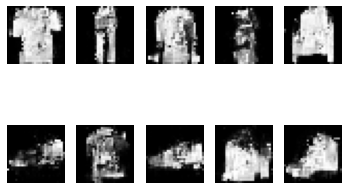

3401 [D loss: 0.696250, acc.: 47.27%] [G loss: 0.733761]
3402 [D loss: 0.694210, acc.: 51.95%] [G loss: 0.734932]
3403 [D loss: 0.695635, acc.: 52.73%] [G loss: 0.732892]
3404 [D loss: 0.696734, acc.: 49.61%] [G loss: 0.729276]
3405 [D loss: 0.700646, acc.: 45.31%] [G loss: 0.734267]
3406 [D loss: 0.693745, acc.: 49.22%] [G loss: 0.726721]
3407 [D loss: 0.694393, acc.: 50.00%] [G loss: 0.732719]
3408 [D loss: 0.700480, acc.: 42.19%] [G loss: 0.722739]
3409 [D loss: 0.701064, acc.: 40.23%] [G loss: 0.713970]
3410 [D loss: 0.701787, acc.: 44.14%] [G loss: 0.723375]
3411 [D loss: 0.694307, acc.: 46.48%] [G loss: 0.721237]
3412 [D loss: 0.701732, acc.: 41.41%] [G loss: 0.723217]
3413 [D loss: 0.696659, acc.: 44.14%] [G loss: 0.726570]
3414 [D loss: 0.698444, acc.: 42.19%] [G loss: 0.716756]
3415 [D loss: 0.698318, acc.: 44.53%] [G loss: 0.717831]
3416 [D loss: 0.703271, acc.: 43.75%] [G loss: 0.711702]
3417 [D loss: 0.697779, acc.: 44.53%] [G loss: 0.710000]
3418 [D loss: 0.698436, acc.: 4

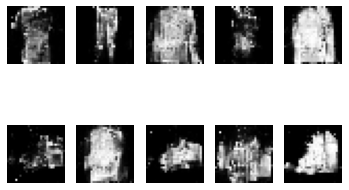

3601 [D loss: 0.694096, acc.: 50.00%] [G loss: 0.719343]
3602 [D loss: 0.693702, acc.: 46.88%] [G loss: 0.722091]
3603 [D loss: 0.688455, acc.: 56.25%] [G loss: 0.720932]
3604 [D loss: 0.697153, acc.: 46.88%] [G loss: 0.718925]
3605 [D loss: 0.695036, acc.: 45.70%] [G loss: 0.719177]
3606 [D loss: 0.694697, acc.: 46.09%] [G loss: 0.717277]
3607 [D loss: 0.692313, acc.: 49.61%] [G loss: 0.720449]
3608 [D loss: 0.687561, acc.: 51.56%] [G loss: 0.722306]
3609 [D loss: 0.690125, acc.: 49.22%] [G loss: 0.711813]
3610 [D loss: 0.688897, acc.: 52.73%] [G loss: 0.709741]
3611 [D loss: 0.690555, acc.: 51.95%] [G loss: 0.709601]
3612 [D loss: 0.692314, acc.: 50.00%] [G loss: 0.716569]
3613 [D loss: 0.693572, acc.: 44.53%] [G loss: 0.717496]
3614 [D loss: 0.691117, acc.: 51.56%] [G loss: 0.711144]
3615 [D loss: 0.692135, acc.: 51.17%] [G loss: 0.714267]
3616 [D loss: 0.692179, acc.: 44.92%] [G loss: 0.713132]
3617 [D loss: 0.690298, acc.: 49.61%] [G loss: 0.717326]
3618 [D loss: 0.684134, acc.: 5

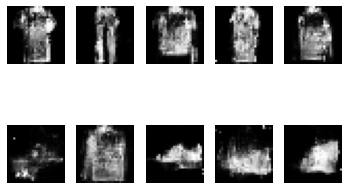

3801 [D loss: 0.706384, acc.: 44.53%] [G loss: 0.691164]
3802 [D loss: 0.709315, acc.: 38.67%] [G loss: 0.692763]
3803 [D loss: 0.701520, acc.: 43.75%] [G loss: 0.703023]
3804 [D loss: 0.693375, acc.: 42.97%] [G loss: 0.713012]
3805 [D loss: 0.697460, acc.: 44.14%] [G loss: 0.713507]
3806 [D loss: 0.699658, acc.: 48.44%] [G loss: 0.709762]
3807 [D loss: 0.685148, acc.: 50.00%] [G loss: 0.706103]
3808 [D loss: 0.696896, acc.: 47.66%] [G loss: 0.710962]
3809 [D loss: 0.693950, acc.: 50.78%] [G loss: 0.722388]
3810 [D loss: 0.695004, acc.: 44.14%] [G loss: 0.709036]
3811 [D loss: 0.697281, acc.: 50.39%] [G loss: 0.710000]
3812 [D loss: 0.700452, acc.: 43.36%] [G loss: 0.709655]
3813 [D loss: 0.702869, acc.: 48.83%] [G loss: 0.718332]
3814 [D loss: 0.688814, acc.: 52.73%] [G loss: 0.723858]
3815 [D loss: 0.702075, acc.: 44.53%] [G loss: 0.713403]
3816 [D loss: 0.700289, acc.: 47.66%] [G loss: 0.721872]
3817 [D loss: 0.694414, acc.: 44.92%] [G loss: 0.708285]
3818 [D loss: 0.699919, acc.: 4

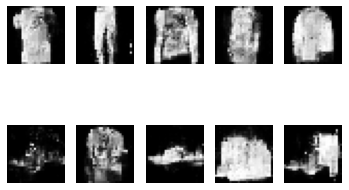

4001 [D loss: 0.695549, acc.: 48.83%] [G loss: 0.712474]
4002 [D loss: 0.691860, acc.: 52.34%] [G loss: 0.706780]
4003 [D loss: 0.697853, acc.: 47.66%] [G loss: 0.713152]
4004 [D loss: 0.695398, acc.: 48.44%] [G loss: 0.709982]
4005 [D loss: 0.695871, acc.: 47.27%] [G loss: 0.712692]
4006 [D loss: 0.693834, acc.: 51.17%] [G loss: 0.712266]
4007 [D loss: 0.697848, acc.: 47.66%] [G loss: 0.709294]
4008 [D loss: 0.693188, acc.: 48.44%] [G loss: 0.715964]
4009 [D loss: 0.694841, acc.: 48.44%] [G loss: 0.711204]
4010 [D loss: 0.699192, acc.: 41.41%] [G loss: 0.713806]
4011 [D loss: 0.696178, acc.: 46.48%] [G loss: 0.708151]
4012 [D loss: 0.699986, acc.: 47.27%] [G loss: 0.708858]
4013 [D loss: 0.693506, acc.: 49.22%] [G loss: 0.709314]
4014 [D loss: 0.695439, acc.: 42.19%] [G loss: 0.703876]
4015 [D loss: 0.696166, acc.: 47.66%] [G loss: 0.705314]
4016 [D loss: 0.699544, acc.: 41.41%] [G loss: 0.703737]
4017 [D loss: 0.700198, acc.: 36.72%] [G loss: 0.704288]
4018 [D loss: 0.699033, acc.: 4

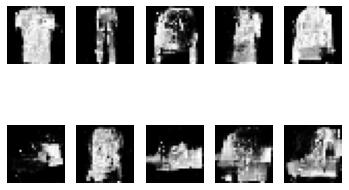

4201 [D loss: 0.689187, acc.: 52.73%] [G loss: 0.728732]
4202 [D loss: 0.688922, acc.: 54.30%] [G loss: 0.727251]
4203 [D loss: 0.687147, acc.: 55.47%] [G loss: 0.727759]
4204 [D loss: 0.694518, acc.: 47.66%] [G loss: 0.729471]
4205 [D loss: 0.689356, acc.: 54.69%] [G loss: 0.724281]
4206 [D loss: 0.689053, acc.: 53.12%] [G loss: 0.727483]
4207 [D loss: 0.687738, acc.: 50.39%] [G loss: 0.737402]
4208 [D loss: 0.689746, acc.: 55.47%] [G loss: 0.729998]
4209 [D loss: 0.691657, acc.: 52.73%] [G loss: 0.725622]
4210 [D loss: 0.686753, acc.: 57.42%] [G loss: 0.731768]
4211 [D loss: 0.689418, acc.: 51.56%] [G loss: 0.743215]
4212 [D loss: 0.691915, acc.: 50.78%] [G loss: 0.735628]
4213 [D loss: 0.681944, acc.: 57.81%] [G loss: 0.739850]
4214 [D loss: 0.685830, acc.: 56.25%] [G loss: 0.740736]
4215 [D loss: 0.680481, acc.: 65.23%] [G loss: 0.740567]
4216 [D loss: 0.682777, acc.: 59.38%] [G loss: 0.738177]
4217 [D loss: 0.679055, acc.: 64.45%] [G loss: 0.738005]
4218 [D loss: 0.681496, acc.: 6

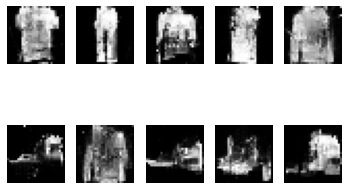

4401 [D loss: 0.686762, acc.: 53.91%] [G loss: 0.721605]
4402 [D loss: 0.679725, acc.: 55.08%] [G loss: 0.721645]
4403 [D loss: 0.686201, acc.: 55.08%] [G loss: 0.720639]
4404 [D loss: 0.681114, acc.: 59.38%] [G loss: 0.722281]
4405 [D loss: 0.685335, acc.: 53.52%] [G loss: 0.718764]
4406 [D loss: 0.679374, acc.: 52.34%] [G loss: 0.716332]
4407 [D loss: 0.685594, acc.: 45.70%] [G loss: 0.716523]
4408 [D loss: 0.683098, acc.: 49.22%] [G loss: 0.702598]
4409 [D loss: 0.686470, acc.: 47.27%] [G loss: 0.711172]
4410 [D loss: 0.692696, acc.: 43.36%] [G loss: 0.715935]
4411 [D loss: 0.689105, acc.: 40.62%] [G loss: 0.706831]
4412 [D loss: 0.689531, acc.: 49.22%] [G loss: 0.716992]
4413 [D loss: 0.692286, acc.: 50.78%] [G loss: 0.720569]
4414 [D loss: 0.690776, acc.: 52.34%] [G loss: 0.715014]
4415 [D loss: 0.688733, acc.: 54.69%] [G loss: 0.720791]
4416 [D loss: 0.687056, acc.: 57.81%] [G loss: 0.730013]
4417 [D loss: 0.689754, acc.: 56.25%] [G loss: 0.731500]
4418 [D loss: 0.688932, acc.: 5

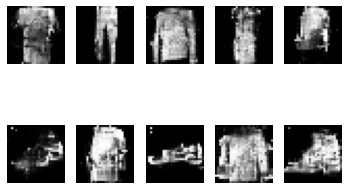

4601 [D loss: 0.699958, acc.: 46.09%] [G loss: 0.710947]
4602 [D loss: 0.696462, acc.: 48.83%] [G loss: 0.706452]
4603 [D loss: 0.699939, acc.: 46.09%] [G loss: 0.707652]
4604 [D loss: 0.698836, acc.: 40.62%] [G loss: 0.691197]
4605 [D loss: 0.695333, acc.: 41.41%] [G loss: 0.697198]
4606 [D loss: 0.695374, acc.: 41.80%] [G loss: 0.695195]
4607 [D loss: 0.697595, acc.: 43.36%] [G loss: 0.699576]
4608 [D loss: 0.700974, acc.: 41.02%] [G loss: 0.694027]
4609 [D loss: 0.702519, acc.: 38.28%] [G loss: 0.697039]
4610 [D loss: 0.697700, acc.: 50.78%] [G loss: 0.693503]
4611 [D loss: 0.691747, acc.: 54.30%] [G loss: 0.689818]
4612 [D loss: 0.690048, acc.: 55.47%] [G loss: 0.707019]
4613 [D loss: 0.702937, acc.: 47.66%] [G loss: 0.684258]
4614 [D loss: 0.691032, acc.: 52.34%] [G loss: 0.697219]
4615 [D loss: 0.689441, acc.: 54.69%] [G loss: 0.707016]
4616 [D loss: 0.698095, acc.: 51.56%] [G loss: 0.697854]
4617 [D loss: 0.701267, acc.: 48.05%] [G loss: 0.709908]
4618 [D loss: 0.691304, acc.: 5

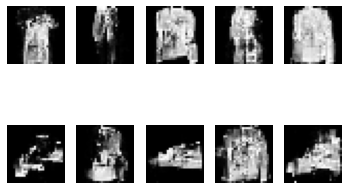

4801 [D loss: 0.692512, acc.: 57.42%] [G loss: 0.713826]
4802 [D loss: 0.689724, acc.: 58.59%] [G loss: 0.703366]
4803 [D loss: 0.684387, acc.: 60.55%] [G loss: 0.701269]
4804 [D loss: 0.691072, acc.: 51.95%] [G loss: 0.710810]
4805 [D loss: 0.692544, acc.: 61.33%] [G loss: 0.711646]
4806 [D loss: 0.688242, acc.: 57.81%] [G loss: 0.708630]
4807 [D loss: 0.689548, acc.: 59.38%] [G loss: 0.710071]
4808 [D loss: 0.686008, acc.: 58.59%] [G loss: 0.714676]
4809 [D loss: 0.693413, acc.: 54.30%] [G loss: 0.717635]
4810 [D loss: 0.684658, acc.: 60.94%] [G loss: 0.710155]
4811 [D loss: 0.697477, acc.: 55.47%] [G loss: 0.715753]
4812 [D loss: 0.689347, acc.: 64.06%] [G loss: 0.709277]
4813 [D loss: 0.689305, acc.: 61.33%] [G loss: 0.717714]
4814 [D loss: 0.686173, acc.: 64.84%] [G loss: 0.713883]
4815 [D loss: 0.692235, acc.: 60.16%] [G loss: 0.714692]
4816 [D loss: 0.694489, acc.: 58.20%] [G loss: 0.715037]
4817 [D loss: 0.690712, acc.: 55.08%] [G loss: 0.715884]
4818 [D loss: 0.690797, acc.: 5

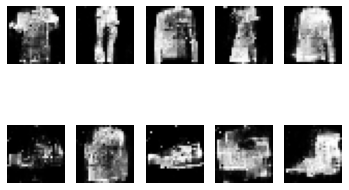

5001 [D loss: 0.693861, acc.: 44.53%] [G loss: 0.705476]
5002 [D loss: 0.699420, acc.: 49.22%] [G loss: 0.693579]
5003 [D loss: 0.705848, acc.: 41.41%] [G loss: 0.698106]
5004 [D loss: 0.703415, acc.: 45.70%] [G loss: 0.692711]
5005 [D loss: 0.711059, acc.: 43.75%] [G loss: 0.681705]
5006 [D loss: 0.704226, acc.: 46.88%] [G loss: 0.680057]
5007 [D loss: 0.709870, acc.: 43.75%] [G loss: 0.693663]
5008 [D loss: 0.719801, acc.: 35.55%] [G loss: 0.695397]
5009 [D loss: 0.716243, acc.: 35.16%] [G loss: 0.689225]
5010 [D loss: 0.715230, acc.: 37.11%] [G loss: 0.698238]
5011 [D loss: 0.710582, acc.: 40.23%] [G loss: 0.712422]
5012 [D loss: 0.704427, acc.: 41.80%] [G loss: 0.732485]
5013 [D loss: 0.706155, acc.: 41.02%] [G loss: 0.727655]
5014 [D loss: 0.704064, acc.: 46.48%] [G loss: 0.735338]
5015 [D loss: 0.694203, acc.: 48.83%] [G loss: 0.739017]
5016 [D loss: 0.698334, acc.: 45.31%] [G loss: 0.742976]
5017 [D loss: 0.692660, acc.: 54.30%] [G loss: 0.751161]
5018 [D loss: 0.695808, acc.: 5

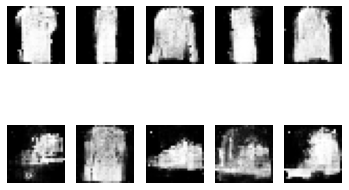

5201 [D loss: 0.715177, acc.: 26.56%] [G loss: 0.678086]
5202 [D loss: 0.708491, acc.: 33.59%] [G loss: 0.698366]
5203 [D loss: 0.699027, acc.: 43.36%] [G loss: 0.721823]
5204 [D loss: 0.693613, acc.: 48.83%] [G loss: 0.753906]
5205 [D loss: 0.684600, acc.: 58.20%] [G loss: 0.753160]
5206 [D loss: 0.678590, acc.: 60.16%] [G loss: 0.773845]
5207 [D loss: 0.673238, acc.: 59.77%] [G loss: 0.779375]
5208 [D loss: 0.666053, acc.: 61.72%] [G loss: 0.794957]
5209 [D loss: 0.678268, acc.: 59.38%] [G loss: 0.792532]
5210 [D loss: 0.668413, acc.: 62.89%] [G loss: 0.782498]
5211 [D loss: 0.673920, acc.: 58.98%] [G loss: 0.795727]
5212 [D loss: 0.671086, acc.: 62.50%] [G loss: 0.783192]
5213 [D loss: 0.675144, acc.: 62.11%] [G loss: 0.773959]
5214 [D loss: 0.683251, acc.: 61.72%] [G loss: 0.763253]
5215 [D loss: 0.677266, acc.: 62.89%] [G loss: 0.745146]
5216 [D loss: 0.689663, acc.: 54.30%] [G loss: 0.724123]
5217 [D loss: 0.692127, acc.: 53.52%] [G loss: 0.716712]
5218 [D loss: 0.707185, acc.: 4

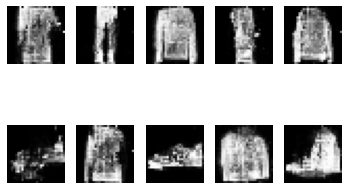

5401 [D loss: 0.702895, acc.: 57.81%] [G loss: 0.707329]
5402 [D loss: 0.713468, acc.: 51.95%] [G loss: 0.684277]
5403 [D loss: 0.703988, acc.: 53.91%] [G loss: 0.683280]
5404 [D loss: 0.715523, acc.: 43.36%] [G loss: 0.676981]
5405 [D loss: 0.716087, acc.: 43.75%] [G loss: 0.672623]
5406 [D loss: 0.720051, acc.: 36.33%] [G loss: 0.670639]
5407 [D loss: 0.718911, acc.: 33.98%] [G loss: 0.669944]
5408 [D loss: 0.713272, acc.: 36.33%] [G loss: 0.674280]
5409 [D loss: 0.711375, acc.: 35.94%] [G loss: 0.682527]
5410 [D loss: 0.706452, acc.: 37.89%] [G loss: 0.688523]
5411 [D loss: 0.701554, acc.: 40.23%] [G loss: 0.697409]
5412 [D loss: 0.694557, acc.: 53.12%] [G loss: 0.708358]
5413 [D loss: 0.687605, acc.: 59.77%] [G loss: 0.723067]
5414 [D loss: 0.683208, acc.: 64.45%] [G loss: 0.730072]
5415 [D loss: 0.678278, acc.: 67.58%] [G loss: 0.734131]
5416 [D loss: 0.681208, acc.: 65.23%] [G loss: 0.734846]
5417 [D loss: 0.677934, acc.: 67.58%] [G loss: 0.734906]
5418 [D loss: 0.680294, acc.: 6

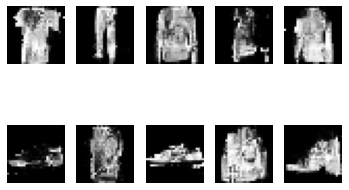

5601 [D loss: 0.685241, acc.: 59.38%] [G loss: 0.716572]
5602 [D loss: 0.685790, acc.: 57.42%] [G loss: 0.719399]
5603 [D loss: 0.683220, acc.: 62.89%] [G loss: 0.716828]
5604 [D loss: 0.686003, acc.: 57.81%] [G loss: 0.719243]
5605 [D loss: 0.688810, acc.: 55.86%] [G loss: 0.713277]
5606 [D loss: 0.685519, acc.: 61.72%] [G loss: 0.719031]
5607 [D loss: 0.681979, acc.: 58.98%] [G loss: 0.716956]
5608 [D loss: 0.686899, acc.: 57.81%] [G loss: 0.713592]
5609 [D loss: 0.682796, acc.: 60.55%] [G loss: 0.715129]
5610 [D loss: 0.687720, acc.: 55.86%] [G loss: 0.719716]
5611 [D loss: 0.688822, acc.: 53.91%] [G loss: 0.714778]
5612 [D loss: 0.681711, acc.: 57.03%] [G loss: 0.721849]
5613 [D loss: 0.682525, acc.: 55.86%] [G loss: 0.720248]
5614 [D loss: 0.684683, acc.: 59.77%] [G loss: 0.723534]
5615 [D loss: 0.682415, acc.: 58.59%] [G loss: 0.722692]
5616 [D loss: 0.683607, acc.: 58.20%] [G loss: 0.716225]
5617 [D loss: 0.683115, acc.: 54.69%] [G loss: 0.717428]
5618 [D loss: 0.683528, acc.: 6

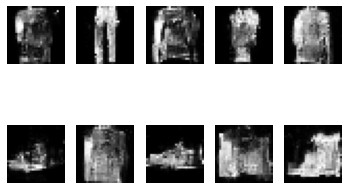

5801 [D loss: 0.686527, acc.: 55.86%] [G loss: 0.732077]
5802 [D loss: 0.685385, acc.: 56.25%] [G loss: 0.725714]
5803 [D loss: 0.689946, acc.: 49.22%] [G loss: 0.732814]
5804 [D loss: 0.688551, acc.: 54.69%] [G loss: 0.724298]
5805 [D loss: 0.690340, acc.: 53.91%] [G loss: 0.712916]
5806 [D loss: 0.682522, acc.: 53.52%] [G loss: 0.712425]
5807 [D loss: 0.691770, acc.: 53.91%] [G loss: 0.720093]
5808 [D loss: 0.686091, acc.: 55.86%] [G loss: 0.716039]
5809 [D loss: 0.689981, acc.: 51.95%] [G loss: 0.692598]
5810 [D loss: 0.703165, acc.: 44.92%] [G loss: 0.690767]
5811 [D loss: 0.704007, acc.: 42.97%] [G loss: 0.693710]
5812 [D loss: 0.699578, acc.: 43.75%] [G loss: 0.694074]
5813 [D loss: 0.700290, acc.: 39.06%] [G loss: 0.688534]
5814 [D loss: 0.702999, acc.: 39.45%] [G loss: 0.696210]
5815 [D loss: 0.700942, acc.: 41.02%] [G loss: 0.701756]
5816 [D loss: 0.696035, acc.: 45.70%] [G loss: 0.708752]
5817 [D loss: 0.698185, acc.: 43.75%] [G loss: 0.709645]
5818 [D loss: 0.694700, acc.: 5

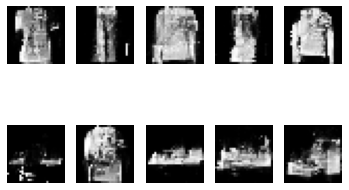

6001 [D loss: 0.691297, acc.: 51.95%] [G loss: 0.713430]
6002 [D loss: 0.690109, acc.: 55.86%] [G loss: 0.718969]
6003 [D loss: 0.691770, acc.: 51.95%] [G loss: 0.720337]
6004 [D loss: 0.690149, acc.: 50.78%] [G loss: 0.725323]
6005 [D loss: 0.677195, acc.: 57.42%] [G loss: 0.737790]
6006 [D loss: 0.681592, acc.: 58.20%] [G loss: 0.716198]
6007 [D loss: 0.684668, acc.: 55.08%] [G loss: 0.733760]
6008 [D loss: 0.692291, acc.: 51.56%] [G loss: 0.718491]
6009 [D loss: 0.685024, acc.: 54.30%] [G loss: 0.723210]
6010 [D loss: 0.685322, acc.: 55.86%] [G loss: 0.716053]
6011 [D loss: 0.687113, acc.: 50.78%] [G loss: 0.727192]
6012 [D loss: 0.690326, acc.: 53.91%] [G loss: 0.739142]
6013 [D loss: 0.689297, acc.: 55.86%] [G loss: 0.715458]
6014 [D loss: 0.686206, acc.: 55.86%] [G loss: 0.716829]
6015 [D loss: 0.698995, acc.: 48.83%] [G loss: 0.714548]
6016 [D loss: 0.685095, acc.: 55.86%] [G loss: 0.713579]
6017 [D loss: 0.694719, acc.: 50.39%] [G loss: 0.707222]
6018 [D loss: 0.688260, acc.: 5

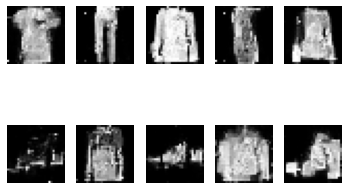

6201 [D loss: 0.691266, acc.: 48.44%] [G loss: 0.711248]
6202 [D loss: 0.696602, acc.: 45.31%] [G loss: 0.705023]
6203 [D loss: 0.700599, acc.: 38.28%] [G loss: 0.712110]
6204 [D loss: 0.700132, acc.: 43.36%] [G loss: 0.709949]
6205 [D loss: 0.696954, acc.: 45.31%] [G loss: 0.704779]
6206 [D loss: 0.701270, acc.: 39.84%] [G loss: 0.701094]
6207 [D loss: 0.698658, acc.: 46.88%] [G loss: 0.699667]
6208 [D loss: 0.701757, acc.: 41.41%] [G loss: 0.693750]
6209 [D loss: 0.698982, acc.: 41.80%] [G loss: 0.696642]
6210 [D loss: 0.699986, acc.: 43.36%] [G loss: 0.700871]
6211 [D loss: 0.696734, acc.: 42.58%] [G loss: 0.699522]
6212 [D loss: 0.696558, acc.: 45.31%] [G loss: 0.703375]
6213 [D loss: 0.695712, acc.: 45.31%] [G loss: 0.702484]
6214 [D loss: 0.694674, acc.: 46.09%] [G loss: 0.696149]
6215 [D loss: 0.698461, acc.: 44.92%] [G loss: 0.697027]
6216 [D loss: 0.696497, acc.: 45.70%] [G loss: 0.700539]
6217 [D loss: 0.697119, acc.: 51.17%] [G loss: 0.698493]
6218 [D loss: 0.691134, acc.: 5

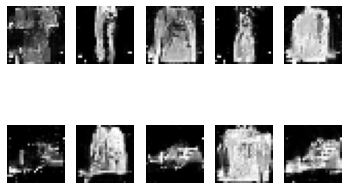

6401 [D loss: 0.699902, acc.: 37.50%] [G loss: 0.691888]
6402 [D loss: 0.700071, acc.: 39.84%] [G loss: 0.697388]
6403 [D loss: 0.697477, acc.: 41.02%] [G loss: 0.696345]
6404 [D loss: 0.697334, acc.: 40.62%] [G loss: 0.694741]
6405 [D loss: 0.696530, acc.: 44.92%] [G loss: 0.701613]
6406 [D loss: 0.694304, acc.: 44.53%] [G loss: 0.704293]
6407 [D loss: 0.693107, acc.: 49.61%] [G loss: 0.709500]
6408 [D loss: 0.689924, acc.: 49.22%] [G loss: 0.710965]
6409 [D loss: 0.691245, acc.: 46.88%] [G loss: 0.707134]
6410 [D loss: 0.690939, acc.: 46.88%] [G loss: 0.708171]
6411 [D loss: 0.692571, acc.: 48.44%] [G loss: 0.702829]
6412 [D loss: 0.690238, acc.: 48.83%] [G loss: 0.704066]
6413 [D loss: 0.694517, acc.: 48.05%] [G loss: 0.700896]
6414 [D loss: 0.699299, acc.: 39.06%] [G loss: 0.690727]
6415 [D loss: 0.695185, acc.: 47.66%] [G loss: 0.692157]
6416 [D loss: 0.696111, acc.: 43.36%] [G loss: 0.695194]
6417 [D loss: 0.702796, acc.: 37.50%] [G loss: 0.689448]
6418 [D loss: 0.697107, acc.: 4

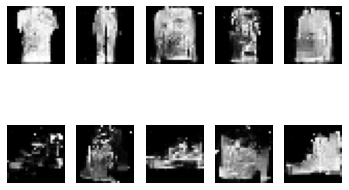

6601 [D loss: 0.702155, acc.: 41.80%] [G loss: 0.714306]
6602 [D loss: 0.701662, acc.: 45.31%] [G loss: 0.711690]
6603 [D loss: 0.697613, acc.: 44.92%] [G loss: 0.708107]
6604 [D loss: 0.697825, acc.: 45.31%] [G loss: 0.700174]
6605 [D loss: 0.697492, acc.: 38.67%] [G loss: 0.711431]
6606 [D loss: 0.701367, acc.: 41.41%] [G loss: 0.705425]
6607 [D loss: 0.697183, acc.: 46.09%] [G loss: 0.707474]
6608 [D loss: 0.700650, acc.: 40.62%] [G loss: 0.707984]
6609 [D loss: 0.693316, acc.: 54.69%] [G loss: 0.706700]
6610 [D loss: 0.697248, acc.: 48.05%] [G loss: 0.708049]
6611 [D loss: 0.699197, acc.: 47.27%] [G loss: 0.711123]
6612 [D loss: 0.693433, acc.: 49.61%] [G loss: 0.709922]
6613 [D loss: 0.701165, acc.: 46.48%] [G loss: 0.710463]
6614 [D loss: 0.696892, acc.: 51.95%] [G loss: 0.713092]
6615 [D loss: 0.695739, acc.: 49.22%] [G loss: 0.711524]
6616 [D loss: 0.695484, acc.: 49.22%] [G loss: 0.710554]
6617 [D loss: 0.700000, acc.: 45.70%] [G loss: 0.709754]
6618 [D loss: 0.695248, acc.: 4

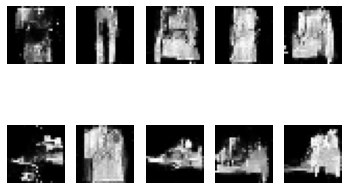

6801 [D loss: 0.684629, acc.: 53.52%] [G loss: 0.695462]
6802 [D loss: 0.685655, acc.: 56.25%] [G loss: 0.701570]
6803 [D loss: 0.697047, acc.: 48.44%] [G loss: 0.707521]
6804 [D loss: 0.690696, acc.: 51.56%] [G loss: 0.699395]
6805 [D loss: 0.684112, acc.: 57.42%] [G loss: 0.705208]
6806 [D loss: 0.689097, acc.: 50.78%] [G loss: 0.711310]
6807 [D loss: 0.689407, acc.: 47.27%] [G loss: 0.709642]
6808 [D loss: 0.688635, acc.: 52.73%] [G loss: 0.703040]
6809 [D loss: 0.689266, acc.: 52.34%] [G loss: 0.709090]
6810 [D loss: 0.694327, acc.: 49.22%] [G loss: 0.716167]
6811 [D loss: 0.687221, acc.: 49.22%] [G loss: 0.711084]
6812 [D loss: 0.685934, acc.: 57.03%] [G loss: 0.716445]
6813 [D loss: 0.695652, acc.: 46.88%] [G loss: 0.720368]
6814 [D loss: 0.693145, acc.: 53.12%] [G loss: 0.713259]
6815 [D loss: 0.691921, acc.: 46.88%] [G loss: 0.714056]
6816 [D loss: 0.697874, acc.: 48.05%] [G loss: 0.701983]
6817 [D loss: 0.695791, acc.: 47.27%] [G loss: 0.696694]
6818 [D loss: 0.694800, acc.: 5

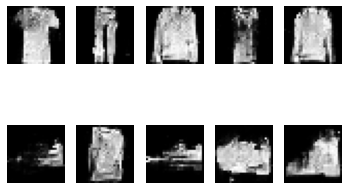

7001 [D loss: 0.704387, acc.: 36.72%] [G loss: 0.705887]
7002 [D loss: 0.701694, acc.: 38.67%] [G loss: 0.706453]
7003 [D loss: 0.701929, acc.: 39.84%] [G loss: 0.704791]
7004 [D loss: 0.701364, acc.: 39.84%] [G loss: 0.703371]
7005 [D loss: 0.704542, acc.: 41.41%] [G loss: 0.706031]
7006 [D loss: 0.698448, acc.: 42.97%] [G loss: 0.708772]
7007 [D loss: 0.698604, acc.: 41.80%] [G loss: 0.707040]
7008 [D loss: 0.700573, acc.: 39.45%] [G loss: 0.705205]
7009 [D loss: 0.702007, acc.: 39.84%] [G loss: 0.701406]
7010 [D loss: 0.699083, acc.: 42.58%] [G loss: 0.706963]
7011 [D loss: 0.701971, acc.: 38.28%] [G loss: 0.701266]
7012 [D loss: 0.697182, acc.: 44.53%] [G loss: 0.699376]
7013 [D loss: 0.702961, acc.: 37.11%] [G loss: 0.701433]
7014 [D loss: 0.703390, acc.: 35.94%] [G loss: 0.697942]
7015 [D loss: 0.701341, acc.: 39.45%] [G loss: 0.702672]
7016 [D loss: 0.699444, acc.: 42.58%] [G loss: 0.695200]
7017 [D loss: 0.701385, acc.: 43.36%] [G loss: 0.698610]
7018 [D loss: 0.703227, acc.: 4

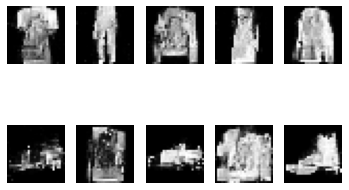

7201 [D loss: 0.693037, acc.: 46.48%] [G loss: 0.700370]
7202 [D loss: 0.695368, acc.: 46.48%] [G loss: 0.700448]
7203 [D loss: 0.692226, acc.: 51.56%] [G loss: 0.700986]
7204 [D loss: 0.695547, acc.: 45.31%] [G loss: 0.700085]
7205 [D loss: 0.692445, acc.: 51.95%] [G loss: 0.699029]
7206 [D loss: 0.697460, acc.: 44.92%] [G loss: 0.706111]
7207 [D loss: 0.695489, acc.: 51.56%] [G loss: 0.700146]
7208 [D loss: 0.692556, acc.: 55.86%] [G loss: 0.700331]
7209 [D loss: 0.691325, acc.: 51.95%] [G loss: 0.704930]
7210 [D loss: 0.691185, acc.: 54.69%] [G loss: 0.702932]
7211 [D loss: 0.692417, acc.: 53.12%] [G loss: 0.700636]
7212 [D loss: 0.693398, acc.: 48.05%] [G loss: 0.705748]
7213 [D loss: 0.688965, acc.: 54.69%] [G loss: 0.707957]
7214 [D loss: 0.690665, acc.: 51.56%] [G loss: 0.704538]
7215 [D loss: 0.686932, acc.: 61.72%] [G loss: 0.712747]
7216 [D loss: 0.689998, acc.: 58.59%] [G loss: 0.717230]
7217 [D loss: 0.688421, acc.: 60.55%] [G loss: 0.712710]
7218 [D loss: 0.690340, acc.: 5

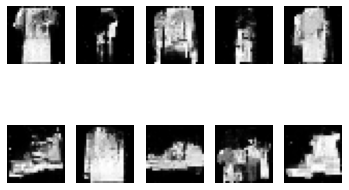

7401 [D loss: 0.685326, acc.: 51.56%] [G loss: 0.711117]
7402 [D loss: 0.682902, acc.: 54.69%] [G loss: 0.715443]
7403 [D loss: 0.682018, acc.: 54.30%] [G loss: 0.707689]
7404 [D loss: 0.686848, acc.: 49.22%] [G loss: 0.708619]
7405 [D loss: 0.689892, acc.: 53.91%] [G loss: 0.715940]
7406 [D loss: 0.683976, acc.: 58.98%] [G loss: 0.716404]
7407 [D loss: 0.688608, acc.: 54.69%] [G loss: 0.714800]
7408 [D loss: 0.679926, acc.: 63.67%] [G loss: 0.725625]
7409 [D loss: 0.688590, acc.: 53.91%] [G loss: 0.727962]
7410 [D loss: 0.684123, acc.: 58.59%] [G loss: 0.724742]
7411 [D loss: 0.690385, acc.: 57.03%] [G loss: 0.725267]
7412 [D loss: 0.684093, acc.: 55.47%] [G loss: 0.720029]
7413 [D loss: 0.682928, acc.: 58.20%] [G loss: 0.720388]
7414 [D loss: 0.688120, acc.: 53.91%] [G loss: 0.707677]
7415 [D loss: 0.697079, acc.: 51.56%] [G loss: 0.711817]
7416 [D loss: 0.691598, acc.: 52.73%] [G loss: 0.706155]
7417 [D loss: 0.697995, acc.: 48.44%] [G loss: 0.694545]
7418 [D loss: 0.695591, acc.: 4

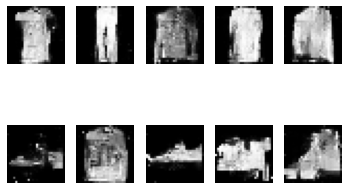

7601 [D loss: 0.695418, acc.: 46.09%] [G loss: 0.698164]
7602 [D loss: 0.695154, acc.: 48.44%] [G loss: 0.696994]
7603 [D loss: 0.694883, acc.: 44.14%] [G loss: 0.693386]
7604 [D loss: 0.696111, acc.: 45.31%] [G loss: 0.691447]
7605 [D loss: 0.695174, acc.: 42.58%] [G loss: 0.698284]
7606 [D loss: 0.698601, acc.: 37.50%] [G loss: 0.691650]
7607 [D loss: 0.696934, acc.: 42.19%] [G loss: 0.696074]
7608 [D loss: 0.699020, acc.: 39.45%] [G loss: 0.692783]
7609 [D loss: 0.698903, acc.: 39.45%] [G loss: 0.689900]
7610 [D loss: 0.700750, acc.: 38.28%] [G loss: 0.693857]
7611 [D loss: 0.698324, acc.: 38.28%] [G loss: 0.696299]
7612 [D loss: 0.697308, acc.: 45.31%] [G loss: 0.694791]
7613 [D loss: 0.700817, acc.: 38.67%] [G loss: 0.694497]
7614 [D loss: 0.699908, acc.: 41.02%] [G loss: 0.692910]
7615 [D loss: 0.700550, acc.: 36.72%] [G loss: 0.694837]
7616 [D loss: 0.696297, acc.: 43.36%] [G loss: 0.696733]
7617 [D loss: 0.698704, acc.: 42.58%] [G loss: 0.699600]
7618 [D loss: 0.694564, acc.: 4

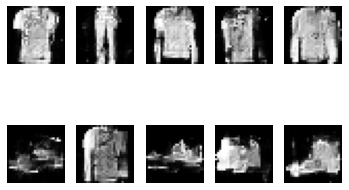

7801 [D loss: 0.688145, acc.: 46.88%] [G loss: 0.732528]
7802 [D loss: 0.692278, acc.: 43.75%] [G loss: 0.724852]
7803 [D loss: 0.687461, acc.: 46.88%] [G loss: 0.722554]
7804 [D loss: 0.686300, acc.: 50.39%] [G loss: 0.721583]
7805 [D loss: 0.689824, acc.: 50.78%] [G loss: 0.721565]
7806 [D loss: 0.686647, acc.: 54.30%] [G loss: 0.726802]
7807 [D loss: 0.694745, acc.: 47.66%] [G loss: 0.707478]
7808 [D loss: 0.690872, acc.: 51.95%] [G loss: 0.707569]
7809 [D loss: 0.694437, acc.: 48.44%] [G loss: 0.714907]
7810 [D loss: 0.696425, acc.: 48.44%] [G loss: 0.696872]
7811 [D loss: 0.699893, acc.: 44.14%] [G loss: 0.691304]
7812 [D loss: 0.703598, acc.: 38.67%] [G loss: 0.702568]
7813 [D loss: 0.694339, acc.: 46.48%] [G loss: 0.701277]
7814 [D loss: 0.700748, acc.: 42.19%] [G loss: 0.706270]
7815 [D loss: 0.696549, acc.: 45.70%] [G loss: 0.712362]
7816 [D loss: 0.692694, acc.: 49.22%] [G loss: 0.711811]
7817 [D loss: 0.690202, acc.: 53.52%] [G loss: 0.716970]
7818 [D loss: 0.691310, acc.: 5

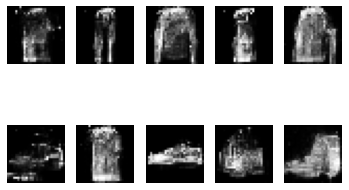

8001 [D loss: 0.710182, acc.: 41.41%] [G loss: 0.675935]
8002 [D loss: 0.710864, acc.: 38.67%] [G loss: 0.670750]
8003 [D loss: 0.707117, acc.: 35.55%] [G loss: 0.688589]
8004 [D loss: 0.702263, acc.: 42.97%] [G loss: 0.691388]
8005 [D loss: 0.694996, acc.: 51.56%] [G loss: 0.703230]
8006 [D loss: 0.690270, acc.: 56.25%] [G loss: 0.713724]
8007 [D loss: 0.684310, acc.: 67.58%] [G loss: 0.735961]
8008 [D loss: 0.672074, acc.: 71.88%] [G loss: 0.752630]
8009 [D loss: 0.663811, acc.: 74.22%] [G loss: 0.768763]
8010 [D loss: 0.659675, acc.: 70.70%] [G loss: 0.780551]
8011 [D loss: 0.658729, acc.: 67.97%] [G loss: 0.784232]
8012 [D loss: 0.653743, acc.: 67.58%] [G loss: 0.786753]
8013 [D loss: 0.659851, acc.: 66.02%] [G loss: 0.767438]
8014 [D loss: 0.664775, acc.: 60.16%] [G loss: 0.756279]
8015 [D loss: 0.671873, acc.: 58.59%] [G loss: 0.738668]
8016 [D loss: 0.685134, acc.: 56.25%] [G loss: 0.706195]
8017 [D loss: 0.700023, acc.: 49.22%] [G loss: 0.688370]
8018 [D loss: 0.706355, acc.: 4

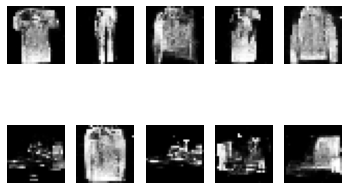

8201 [D loss: 0.709729, acc.: 46.48%] [G loss: 0.695477]
8202 [D loss: 0.700319, acc.: 42.97%] [G loss: 0.691769]
8203 [D loss: 0.699371, acc.: 42.58%] [G loss: 0.700390]
8204 [D loss: 0.702986, acc.: 40.23%] [G loss: 0.690214]
8205 [D loss: 0.701594, acc.: 33.98%] [G loss: 0.693439]
8206 [D loss: 0.704021, acc.: 38.67%] [G loss: 0.697211]
8207 [D loss: 0.700059, acc.: 40.23%] [G loss: 0.690685]
8208 [D loss: 0.694368, acc.: 46.48%] [G loss: 0.694845]
8209 [D loss: 0.692806, acc.: 51.56%] [G loss: 0.703722]
8210 [D loss: 0.689766, acc.: 58.59%] [G loss: 0.715250]
8211 [D loss: 0.678905, acc.: 66.80%] [G loss: 0.720850]
8212 [D loss: 0.680988, acc.: 62.89%] [G loss: 0.721601]
8213 [D loss: 0.678817, acc.: 59.77%] [G loss: 0.726536]
8214 [D loss: 0.677864, acc.: 66.80%] [G loss: 0.716722]
8215 [D loss: 0.674425, acc.: 68.36%] [G loss: 0.721548]
8216 [D loss: 0.683136, acc.: 60.55%] [G loss: 0.707298]
8217 [D loss: 0.677819, acc.: 62.11%] [G loss: 0.717821]
8218 [D loss: 0.682995, acc.: 5

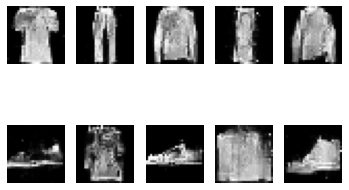

8401 [D loss: 0.697159, acc.: 40.62%] [G loss: 0.692773]
8402 [D loss: 0.697764, acc.: 37.11%] [G loss: 0.695372]
8403 [D loss: 0.695837, acc.: 41.41%] [G loss: 0.693763]
8404 [D loss: 0.694681, acc.: 45.31%] [G loss: 0.692929]
8405 [D loss: 0.696497, acc.: 44.14%] [G loss: 0.693492]
8406 [D loss: 0.697397, acc.: 40.23%] [G loss: 0.693329]
8407 [D loss: 0.695766, acc.: 42.58%] [G loss: 0.689578]
8408 [D loss: 0.694341, acc.: 42.58%] [G loss: 0.695079]
8409 [D loss: 0.693955, acc.: 45.31%] [G loss: 0.693832]
8410 [D loss: 0.696967, acc.: 41.80%] [G loss: 0.690497]
8411 [D loss: 0.695199, acc.: 39.45%] [G loss: 0.694422]
8412 [D loss: 0.694951, acc.: 44.14%] [G loss: 0.694545]
8413 [D loss: 0.693446, acc.: 44.14%] [G loss: 0.696407]
8414 [D loss: 0.692725, acc.: 47.27%] [G loss: 0.695179]
8415 [D loss: 0.694068, acc.: 46.88%] [G loss: 0.696280]
8416 [D loss: 0.694645, acc.: 44.14%] [G loss: 0.695413]
8417 [D loss: 0.693111, acc.: 46.88%] [G loss: 0.693109]
8418 [D loss: 0.693086, acc.: 4

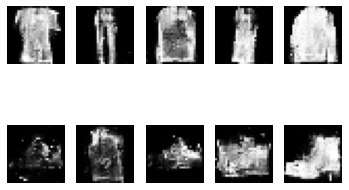

8601 [D loss: 0.694540, acc.: 53.52%] [G loss: 0.723822]
8602 [D loss: 0.693805, acc.: 55.86%] [G loss: 0.707398]
8603 [D loss: 0.695812, acc.: 51.95%] [G loss: 0.707935]
8604 [D loss: 0.701165, acc.: 50.78%] [G loss: 0.695539]
8605 [D loss: 0.702097, acc.: 47.27%] [G loss: 0.690842]
8606 [D loss: 0.703576, acc.: 44.14%] [G loss: 0.691792]
8607 [D loss: 0.703627, acc.: 37.50%] [G loss: 0.694900]
8608 [D loss: 0.705083, acc.: 35.55%] [G loss: 0.683983]
8609 [D loss: 0.706630, acc.: 34.77%] [G loss: 0.687669]
8610 [D loss: 0.707574, acc.: 40.23%] [G loss: 0.686956]
8611 [D loss: 0.709742, acc.: 30.47%] [G loss: 0.687460]
8612 [D loss: 0.710360, acc.: 33.59%] [G loss: 0.684209]
8613 [D loss: 0.709449, acc.: 33.20%] [G loss: 0.685850]
8614 [D loss: 0.705415, acc.: 39.45%] [G loss: 0.688507]
8615 [D loss: 0.705833, acc.: 41.80%] [G loss: 0.691406]
8616 [D loss: 0.700439, acc.: 44.92%] [G loss: 0.696379]
8617 [D loss: 0.704302, acc.: 40.23%] [G loss: 0.701552]
8618 [D loss: 0.700463, acc.: 4

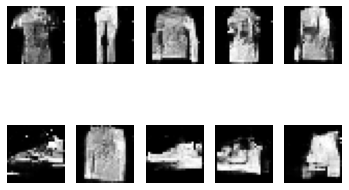

8801 [D loss: 0.690921, acc.: 50.78%] [G loss: 0.704558]
8802 [D loss: 0.687272, acc.: 53.12%] [G loss: 0.693630]
8803 [D loss: 0.694695, acc.: 48.44%] [G loss: 0.701614]
8804 [D loss: 0.694628, acc.: 48.05%] [G loss: 0.698232]
8805 [D loss: 0.691710, acc.: 51.56%] [G loss: 0.691735]
8806 [D loss: 0.689535, acc.: 53.91%] [G loss: 0.694152]
8807 [D loss: 0.692849, acc.: 51.56%] [G loss: 0.690079]
8808 [D loss: 0.695336, acc.: 47.27%] [G loss: 0.693378]
8809 [D loss: 0.698413, acc.: 44.92%] [G loss: 0.703382]
8810 [D loss: 0.694419, acc.: 44.53%] [G loss: 0.702888]
8811 [D loss: 0.694196, acc.: 46.88%] [G loss: 0.709105]
8812 [D loss: 0.692341, acc.: 53.91%] [G loss: 0.713394]
8813 [D loss: 0.688543, acc.: 56.25%] [G loss: 0.718410]
8814 [D loss: 0.684594, acc.: 58.59%] [G loss: 0.724077]
8815 [D loss: 0.683981, acc.: 60.94%] [G loss: 0.727777]
8816 [D loss: 0.682463, acc.: 63.28%] [G loss: 0.727428]
8817 [D loss: 0.682547, acc.: 60.55%] [G loss: 0.740261]
8818 [D loss: 0.680430, acc.: 6

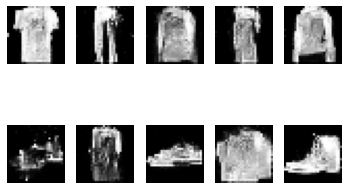

9001 [D loss: 0.693685, acc.: 49.22%] [G loss: 0.718625]
9002 [D loss: 0.695828, acc.: 48.05%] [G loss: 0.710731]
9003 [D loss: 0.692503, acc.: 49.61%] [G loss: 0.706869]
9004 [D loss: 0.697487, acc.: 50.39%] [G loss: 0.709155]
9005 [D loss: 0.695946, acc.: 48.44%] [G loss: 0.703255]
9006 [D loss: 0.702065, acc.: 43.36%] [G loss: 0.702265]
9007 [D loss: 0.704650, acc.: 41.02%] [G loss: 0.703308]
9008 [D loss: 0.698661, acc.: 47.27%] [G loss: 0.699880]
9009 [D loss: 0.703105, acc.: 40.62%] [G loss: 0.703366]
9010 [D loss: 0.699932, acc.: 40.62%] [G loss: 0.701321]
9011 [D loss: 0.697514, acc.: 44.92%] [G loss: 0.701759]
9012 [D loss: 0.697587, acc.: 47.27%] [G loss: 0.701351]
9013 [D loss: 0.696477, acc.: 47.66%] [G loss: 0.701802]
9014 [D loss: 0.696877, acc.: 46.48%] [G loss: 0.703643]
9015 [D loss: 0.692666, acc.: 50.00%] [G loss: 0.701581]
9016 [D loss: 0.697134, acc.: 43.75%] [G loss: 0.698611]
9017 [D loss: 0.697837, acc.: 48.44%] [G loss: 0.696527]
9018 [D loss: 0.695867, acc.: 4

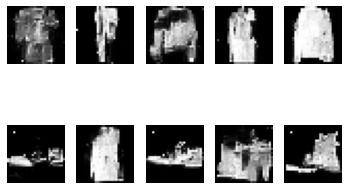

9201 [D loss: 0.686856, acc.: 59.38%] [G loss: 0.724394]
9202 [D loss: 0.686773, acc.: 58.20%] [G loss: 0.724098]
9203 [D loss: 0.687263, acc.: 56.25%] [G loss: 0.725965]
9204 [D loss: 0.688508, acc.: 58.59%] [G loss: 0.724415]
9205 [D loss: 0.685596, acc.: 59.77%] [G loss: 0.722149]
9206 [D loss: 0.684981, acc.: 57.81%] [G loss: 0.720964]
9207 [D loss: 0.687522, acc.: 55.47%] [G loss: 0.720106]
9208 [D loss: 0.686299, acc.: 60.16%] [G loss: 0.721066]
9209 [D loss: 0.687546, acc.: 56.25%] [G loss: 0.721774]
9210 [D loss: 0.684714, acc.: 57.81%] [G loss: 0.726533]
9211 [D loss: 0.688281, acc.: 59.38%] [G loss: 0.721923]
9212 [D loss: 0.688997, acc.: 58.59%] [G loss: 0.719250]
9213 [D loss: 0.686823, acc.: 57.81%] [G loss: 0.722023]
9214 [D loss: 0.685866, acc.: 55.47%] [G loss: 0.720020]
9215 [D loss: 0.687570, acc.: 58.20%] [G loss: 0.718655]
9216 [D loss: 0.689679, acc.: 47.66%] [G loss: 0.713945]
9217 [D loss: 0.686164, acc.: 50.00%] [G loss: 0.717606]
9218 [D loss: 0.692823, acc.: 5

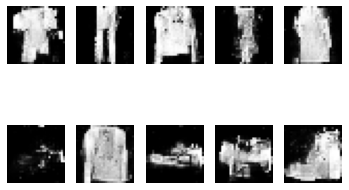

9401 [D loss: 0.684220, acc.: 57.81%] [G loss: 0.720677]
9402 [D loss: 0.683081, acc.: 57.42%] [G loss: 0.714262]
9403 [D loss: 0.686468, acc.: 59.77%] [G loss: 0.721390]
9404 [D loss: 0.679143, acc.: 64.06%] [G loss: 0.722256]
9405 [D loss: 0.682970, acc.: 62.11%] [G loss: 0.727574]
9406 [D loss: 0.684669, acc.: 57.81%] [G loss: 0.728975]
9407 [D loss: 0.684723, acc.: 56.64%] [G loss: 0.730733]
9408 [D loss: 0.681513, acc.: 59.77%] [G loss: 0.729316]
9409 [D loss: 0.681796, acc.: 57.42%] [G loss: 0.724835]
9410 [D loss: 0.682025, acc.: 60.55%] [G loss: 0.724690]
9411 [D loss: 0.682994, acc.: 59.38%] [G loss: 0.722843]
9412 [D loss: 0.686187, acc.: 57.03%] [G loss: 0.722166]
9413 [D loss: 0.684659, acc.: 57.03%] [G loss: 0.720364]
9414 [D loss: 0.687745, acc.: 56.64%] [G loss: 0.715747]
9415 [D loss: 0.685184, acc.: 56.64%] [G loss: 0.716300]
9416 [D loss: 0.683523, acc.: 56.64%] [G loss: 0.708639]
9417 [D loss: 0.687371, acc.: 63.28%] [G loss: 0.715065]
9418 [D loss: 0.689030, acc.: 5

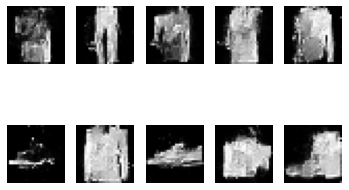

9601 [D loss: 0.699465, acc.: 41.80%] [G loss: 0.689100]
9602 [D loss: 0.701860, acc.: 39.45%] [G loss: 0.687491]
9603 [D loss: 0.701482, acc.: 38.28%] [G loss: 0.695434]
9604 [D loss: 0.701393, acc.: 42.58%] [G loss: 0.692986]
9605 [D loss: 0.697306, acc.: 42.19%] [G loss: 0.692585]
9606 [D loss: 0.699058, acc.: 44.53%] [G loss: 0.696367]
9607 [D loss: 0.696572, acc.: 49.61%] [G loss: 0.692811]
9608 [D loss: 0.697233, acc.: 41.41%] [G loss: 0.695662]
9609 [D loss: 0.695548, acc.: 48.05%] [G loss: 0.694313]
9610 [D loss: 0.694326, acc.: 50.00%] [G loss: 0.697335]
9611 [D loss: 0.700529, acc.: 40.62%] [G loss: 0.697921]
9612 [D loss: 0.694815, acc.: 47.27%] [G loss: 0.692777]
9613 [D loss: 0.696898, acc.: 45.31%] [G loss: 0.697067]
9614 [D loss: 0.697437, acc.: 42.19%] [G loss: 0.693605]
9615 [D loss: 0.695805, acc.: 48.05%] [G loss: 0.690929]
9616 [D loss: 0.695512, acc.: 46.09%] [G loss: 0.696421]
9617 [D loss: 0.702008, acc.: 41.41%] [G loss: 0.689686]
9618 [D loss: 0.698031, acc.: 4

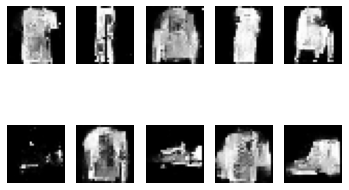

9801 [D loss: 0.691142, acc.: 53.91%] [G loss: 0.713056]
9802 [D loss: 0.688413, acc.: 50.78%] [G loss: 0.715792]
9803 [D loss: 0.687354, acc.: 56.25%] [G loss: 0.708471]
9804 [D loss: 0.690696, acc.: 50.39%] [G loss: 0.709494]
9805 [D loss: 0.690773, acc.: 52.34%] [G loss: 0.707776]
9806 [D loss: 0.689436, acc.: 52.34%] [G loss: 0.707842]
9807 [D loss: 0.691469, acc.: 47.27%] [G loss: 0.699300]
9808 [D loss: 0.697036, acc.: 42.58%] [G loss: 0.698686]
9809 [D loss: 0.694732, acc.: 46.09%] [G loss: 0.695538]
9810 [D loss: 0.693548, acc.: 50.39%] [G loss: 0.691575]
9811 [D loss: 0.693524, acc.: 50.00%] [G loss: 0.689192]
9812 [D loss: 0.690402, acc.: 53.12%] [G loss: 0.693057]
9813 [D loss: 0.689383, acc.: 55.47%] [G loss: 0.698716]
9814 [D loss: 0.697884, acc.: 47.66%] [G loss: 0.694823]
9815 [D loss: 0.691117, acc.: 54.69%] [G loss: 0.692424]
9816 [D loss: 0.689398, acc.: 53.12%] [G loss: 0.690022]
9817 [D loss: 0.691018, acc.: 51.56%] [G loss: 0.693147]
9818 [D loss: 0.693066, acc.: 5

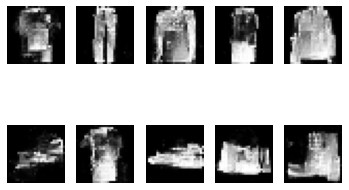

10001 [D loss: 0.693493, acc.: 50.00%] [G loss: 0.709883]
10002 [D loss: 0.700960, acc.: 41.80%] [G loss: 0.703847]
10003 [D loss: 0.694800, acc.: 44.92%] [G loss: 0.701919]
10004 [D loss: 0.699626, acc.: 40.62%] [G loss: 0.700889]
10005 [D loss: 0.698876, acc.: 37.50%] [G loss: 0.705497]
10006 [D loss: 0.694633, acc.: 44.14%] [G loss: 0.704184]
10007 [D loss: 0.691366, acc.: 54.30%] [G loss: 0.705484]
10008 [D loss: 0.697230, acc.: 45.70%] [G loss: 0.709672]
10009 [D loss: 0.694844, acc.: 45.70%] [G loss: 0.715281]
10010 [D loss: 0.694955, acc.: 53.91%] [G loss: 0.714695]
10011 [D loss: 0.688500, acc.: 57.03%] [G loss: 0.713627]
10012 [D loss: 0.687496, acc.: 60.16%] [G loss: 0.715533]
10013 [D loss: 0.687443, acc.: 59.77%] [G loss: 0.718372]
10014 [D loss: 0.684675, acc.: 61.33%] [G loss: 0.731169]
10015 [D loss: 0.682893, acc.: 64.06%] [G loss: 0.725257]
10016 [D loss: 0.682927, acc.: 65.23%] [G loss: 0.723574]
10017 [D loss: 0.688618, acc.: 57.42%] [G loss: 0.718122]
10018 [D loss:

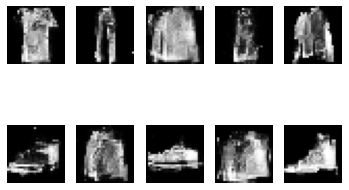

10201 [D loss: 0.697288, acc.: 45.70%] [G loss: 0.694590]
10202 [D loss: 0.695230, acc.: 52.34%] [G loss: 0.697929]
10203 [D loss: 0.694392, acc.: 50.00%] [G loss: 0.697850]
10204 [D loss: 0.695369, acc.: 48.44%] [G loss: 0.697056]
10205 [D loss: 0.695893, acc.: 50.39%] [G loss: 0.698660]
10206 [D loss: 0.691306, acc.: 54.69%] [G loss: 0.695478]
10207 [D loss: 0.692793, acc.: 52.34%] [G loss: 0.700057]
10208 [D loss: 0.694535, acc.: 49.22%] [G loss: 0.699326]
10209 [D loss: 0.694490, acc.: 48.44%] [G loss: 0.698874]
10210 [D loss: 0.698591, acc.: 44.53%] [G loss: 0.704766]
10211 [D loss: 0.694664, acc.: 46.48%] [G loss: 0.699590]
10212 [D loss: 0.691603, acc.: 50.00%] [G loss: 0.698223]
10213 [D loss: 0.693283, acc.: 48.44%] [G loss: 0.704090]
10214 [D loss: 0.690449, acc.: 49.22%] [G loss: 0.700599]
10215 [D loss: 0.691860, acc.: 48.83%] [G loss: 0.705392]
10216 [D loss: 0.690312, acc.: 57.03%] [G loss: 0.702946]
10217 [D loss: 0.691807, acc.: 55.47%] [G loss: 0.709825]
10218 [D loss:

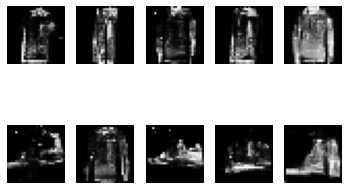

10401 [D loss: 0.686776, acc.: 58.98%] [G loss: 0.720957]
10402 [D loss: 0.682603, acc.: 64.45%] [G loss: 0.723884]
10403 [D loss: 0.678590, acc.: 67.58%] [G loss: 0.732921]
10404 [D loss: 0.683643, acc.: 64.06%] [G loss: 0.738041]
10405 [D loss: 0.677639, acc.: 65.23%] [G loss: 0.728627]
10406 [D loss: 0.683240, acc.: 64.45%] [G loss: 0.716291]
10407 [D loss: 0.684812, acc.: 60.16%] [G loss: 0.718709]
10408 [D loss: 0.685616, acc.: 61.33%] [G loss: 0.721420]
10409 [D loss: 0.688041, acc.: 59.77%] [G loss: 0.712013]
10410 [D loss: 0.690621, acc.: 55.86%] [G loss: 0.700977]
10411 [D loss: 0.692397, acc.: 53.91%] [G loss: 0.702171]
10412 [D loss: 0.699109, acc.: 45.70%] [G loss: 0.691990]
10413 [D loss: 0.705917, acc.: 47.27%] [G loss: 0.692748]
10414 [D loss: 0.698342, acc.: 46.48%] [G loss: 0.689939]
10415 [D loss: 0.698274, acc.: 45.31%] [G loss: 0.683564]
10416 [D loss: 0.707668, acc.: 37.50%] [G loss: 0.686032]
10417 [D loss: 0.705842, acc.: 41.02%] [G loss: 0.687915]
10418 [D loss:

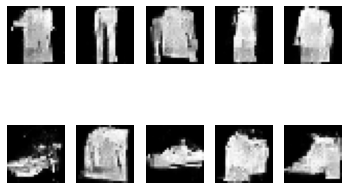

10601 [D loss: 0.686403, acc.: 57.42%] [G loss: 0.726745]
10602 [D loss: 0.687057, acc.: 57.03%] [G loss: 0.726292]
10603 [D loss: 0.687857, acc.: 55.47%] [G loss: 0.717743]
10604 [D loss: 0.691647, acc.: 53.91%] [G loss: 0.724032]
10605 [D loss: 0.687451, acc.: 57.03%] [G loss: 0.720516]
10606 [D loss: 0.694198, acc.: 51.56%] [G loss: 0.712123]
10607 [D loss: 0.692558, acc.: 51.95%] [G loss: 0.718288]
10608 [D loss: 0.692314, acc.: 55.08%] [G loss: 0.714006]
10609 [D loss: 0.692441, acc.: 52.73%] [G loss: 0.705315]
10610 [D loss: 0.695230, acc.: 50.00%] [G loss: 0.701156]
10611 [D loss: 0.693381, acc.: 49.22%] [G loss: 0.695934]
10612 [D loss: 0.698288, acc.: 43.36%] [G loss: 0.699731]
10613 [D loss: 0.698975, acc.: 41.41%] [G loss: 0.695725]
10614 [D loss: 0.699593, acc.: 39.84%] [G loss: 0.694159]
10615 [D loss: 0.701740, acc.: 37.50%] [G loss: 0.694698]
10616 [D loss: 0.697945, acc.: 44.92%] [G loss: 0.696416]
10617 [D loss: 0.698472, acc.: 37.89%] [G loss: 0.695453]
10618 [D loss:

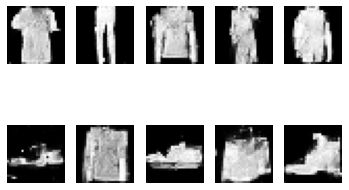

10801 [D loss: 0.693186, acc.: 44.53%] [G loss: 0.708459]
10802 [D loss: 0.692815, acc.: 50.00%] [G loss: 0.713220]
10803 [D loss: 0.689498, acc.: 50.00%] [G loss: 0.710422]
10804 [D loss: 0.685579, acc.: 58.20%] [G loss: 0.718086]
10805 [D loss: 0.692486, acc.: 49.61%] [G loss: 0.718140]
10806 [D loss: 0.688479, acc.: 53.12%] [G loss: 0.720132]
10807 [D loss: 0.689860, acc.: 56.25%] [G loss: 0.717941]
10808 [D loss: 0.688042, acc.: 57.42%] [G loss: 0.724655]
10809 [D loss: 0.689385, acc.: 55.86%] [G loss: 0.725293]
10810 [D loss: 0.687399, acc.: 57.03%] [G loss: 0.724944]
10811 [D loss: 0.686001, acc.: 56.64%] [G loss: 0.729284]
10812 [D loss: 0.687375, acc.: 59.77%] [G loss: 0.727030]
10813 [D loss: 0.685520, acc.: 60.16%] [G loss: 0.721268]
10814 [D loss: 0.682710, acc.: 60.94%] [G loss: 0.730326]
10815 [D loss: 0.687542, acc.: 59.77%] [G loss: 0.727877]
10816 [D loss: 0.685001, acc.: 58.98%] [G loss: 0.724475]
10817 [D loss: 0.689203, acc.: 54.30%] [G loss: 0.724004]
10818 [D loss:

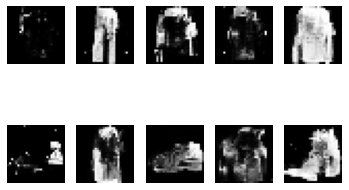

11001 [D loss: 0.671629, acc.: 62.11%] [G loss: 0.776364]
11002 [D loss: 0.662882, acc.: 66.80%] [G loss: 0.760616]
11003 [D loss: 0.674982, acc.: 57.03%] [G loss: 0.745520]
11004 [D loss: 0.694800, acc.: 51.17%] [G loss: 0.744370]
11005 [D loss: 0.694229, acc.: 49.61%] [G loss: 0.715112]
11006 [D loss: 0.691293, acc.: 51.95%] [G loss: 0.721908]
11007 [D loss: 0.699409, acc.: 44.53%] [G loss: 0.696158]
11008 [D loss: 0.708567, acc.: 39.84%] [G loss: 0.675042]
11009 [D loss: 0.715127, acc.: 35.16%] [G loss: 0.680056]
11010 [D loss: 0.709778, acc.: 37.11%] [G loss: 0.685367]
11011 [D loss: 0.700556, acc.: 35.55%] [G loss: 0.693366]
11012 [D loss: 0.703446, acc.: 37.11%] [G loss: 0.705441]
11013 [D loss: 0.692973, acc.: 47.66%] [G loss: 0.719733]
11014 [D loss: 0.694208, acc.: 47.66%] [G loss: 0.738357]
11015 [D loss: 0.684888, acc.: 53.52%] [G loss: 0.739884]
11016 [D loss: 0.685951, acc.: 56.25%] [G loss: 0.755464]
11017 [D loss: 0.676986, acc.: 58.20%] [G loss: 0.760689]
11018 [D loss:

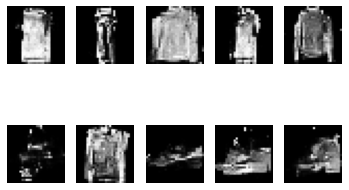

11201 [D loss: 0.689375, acc.: 57.42%] [G loss: 0.708341]
11202 [D loss: 0.691521, acc.: 50.00%] [G loss: 0.700439]
11203 [D loss: 0.688024, acc.: 57.03%] [G loss: 0.710988]
11204 [D loss: 0.687713, acc.: 56.25%] [G loss: 0.715143]
11205 [D loss: 0.690870, acc.: 53.12%] [G loss: 0.714496]
11206 [D loss: 0.681557, acc.: 63.28%] [G loss: 0.710035]
11207 [D loss: 0.684295, acc.: 54.30%] [G loss: 0.713353]
11208 [D loss: 0.683552, acc.: 60.16%] [G loss: 0.709053]
11209 [D loss: 0.689645, acc.: 55.47%] [G loss: 0.710911]
11210 [D loss: 0.686157, acc.: 57.81%] [G loss: 0.705870]
11211 [D loss: 0.687426, acc.: 51.95%] [G loss: 0.706051]
11212 [D loss: 0.689403, acc.: 52.73%] [G loss: 0.696644]
11213 [D loss: 0.691032, acc.: 49.61%] [G loss: 0.697039]
11214 [D loss: 0.695180, acc.: 47.27%] [G loss: 0.703962]
11215 [D loss: 0.685252, acc.: 50.39%] [G loss: 0.703481]
11216 [D loss: 0.696259, acc.: 42.58%] [G loss: 0.699200]
11217 [D loss: 0.684571, acc.: 53.91%] [G loss: 0.704814]
11218 [D loss:

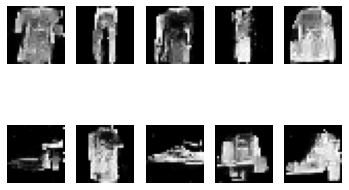

11401 [D loss: 0.690140, acc.: 57.42%] [G loss: 0.715336]
11402 [D loss: 0.683622, acc.: 60.16%] [G loss: 0.710139]
11403 [D loss: 0.683001, acc.: 63.67%] [G loss: 0.720171]
11404 [D loss: 0.676647, acc.: 66.41%] [G loss: 0.710533]
11405 [D loss: 0.685686, acc.: 61.72%] [G loss: 0.711791]
11406 [D loss: 0.683875, acc.: 61.72%] [G loss: 0.718065]
11407 [D loss: 0.683081, acc.: 64.84%] [G loss: 0.704383]
11408 [D loss: 0.679012, acc.: 67.19%] [G loss: 0.708857]
11409 [D loss: 0.688197, acc.: 53.52%] [G loss: 0.703556]
11410 [D loss: 0.693261, acc.: 52.73%] [G loss: 0.704687]
11411 [D loss: 0.689500, acc.: 58.20%] [G loss: 0.702636]
11412 [D loss: 0.691515, acc.: 57.03%] [G loss: 0.698427]
11413 [D loss: 0.696190, acc.: 48.44%] [G loss: 0.706243]
11414 [D loss: 0.693398, acc.: 46.48%] [G loss: 0.704650]
11415 [D loss: 0.687161, acc.: 51.95%] [G loss: 0.709126]
11416 [D loss: 0.695157, acc.: 43.75%] [G loss: 0.709331]
11417 [D loss: 0.695329, acc.: 46.48%] [G loss: 0.709900]
11418 [D loss:

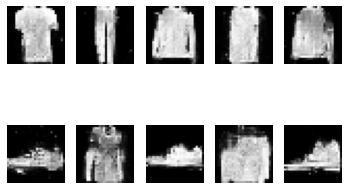

11601 [D loss: 0.696302, acc.: 43.75%] [G loss: 0.701995]
11602 [D loss: 0.692493, acc.: 50.78%] [G loss: 0.699746]
11603 [D loss: 0.691169, acc.: 50.39%] [G loss: 0.703233]
11604 [D loss: 0.693138, acc.: 46.88%] [G loss: 0.701674]
11605 [D loss: 0.691531, acc.: 47.27%] [G loss: 0.706189]
11606 [D loss: 0.688654, acc.: 52.34%] [G loss: 0.703834]
11607 [D loss: 0.692380, acc.: 40.23%] [G loss: 0.710369]
11608 [D loss: 0.690088, acc.: 44.53%] [G loss: 0.705608]
11609 [D loss: 0.690391, acc.: 42.97%] [G loss: 0.712505]
11610 [D loss: 0.689104, acc.: 44.92%] [G loss: 0.717480]
11611 [D loss: 0.687445, acc.: 48.44%] [G loss: 0.713317]
11612 [D loss: 0.688250, acc.: 49.61%] [G loss: 0.718926]
11613 [D loss: 0.688589, acc.: 47.66%] [G loss: 0.714416]
11614 [D loss: 0.688094, acc.: 44.92%] [G loss: 0.718734]
11615 [D loss: 0.691891, acc.: 45.31%] [G loss: 0.717800]
11616 [D loss: 0.688556, acc.: 49.61%] [G loss: 0.718736]
11617 [D loss: 0.686930, acc.: 48.05%] [G loss: 0.718814]
11618 [D loss:

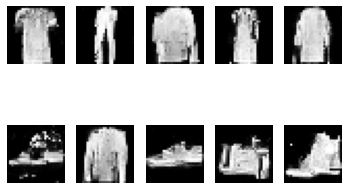

11801 [D loss: 0.690842, acc.: 51.95%] [G loss: 0.712608]
11802 [D loss: 0.691539, acc.: 55.47%] [G loss: 0.715386]
11803 [D loss: 0.691330, acc.: 52.34%] [G loss: 0.712866]
11804 [D loss: 0.692229, acc.: 50.00%] [G loss: 0.717462]
11805 [D loss: 0.691549, acc.: 50.39%] [G loss: 0.712412]
11806 [D loss: 0.690044, acc.: 53.91%] [G loss: 0.722741]
11807 [D loss: 0.691160, acc.: 50.39%] [G loss: 0.714893]
11808 [D loss: 0.689326, acc.: 52.73%] [G loss: 0.714088]
11809 [D loss: 0.689821, acc.: 54.69%] [G loss: 0.712670]
11810 [D loss: 0.693035, acc.: 48.05%] [G loss: 0.710044]
11811 [D loss: 0.691870, acc.: 48.83%] [G loss: 0.718647]
11812 [D loss: 0.691611, acc.: 50.78%] [G loss: 0.713485]
11813 [D loss: 0.691572, acc.: 51.17%] [G loss: 0.711870]
11814 [D loss: 0.697048, acc.: 44.53%] [G loss: 0.709290]
11815 [D loss: 0.695733, acc.: 50.78%] [G loss: 0.706261]
11816 [D loss: 0.693951, acc.: 51.56%] [G loss: 0.707405]
11817 [D loss: 0.695767, acc.: 48.83%] [G loss: 0.701020]
11818 [D loss:

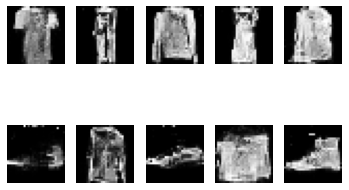

12001 [D loss: 0.684105, acc.: 66.80%] [G loss: 0.693595]
12002 [D loss: 0.693956, acc.: 55.47%] [G loss: 0.697295]
12003 [D loss: 0.694911, acc.: 55.08%] [G loss: 0.686709]
12004 [D loss: 0.696175, acc.: 56.25%] [G loss: 0.687695]
12005 [D loss: 0.695028, acc.: 54.30%] [G loss: 0.692532]
12006 [D loss: 0.700007, acc.: 51.17%] [G loss: 0.685483]
12007 [D loss: 0.701245, acc.: 49.61%] [G loss: 0.682325]
12008 [D loss: 0.700593, acc.: 57.42%] [G loss: 0.686415]
12009 [D loss: 0.705438, acc.: 48.83%] [G loss: 0.698364]
12010 [D loss: 0.702293, acc.: 44.92%] [G loss: 0.687063]
12011 [D loss: 0.701792, acc.: 44.92%] [G loss: 0.688387]
12012 [D loss: 0.702125, acc.: 42.97%] [G loss: 0.684600]
12013 [D loss: 0.702967, acc.: 42.58%] [G loss: 0.695260]
12014 [D loss: 0.698085, acc.: 47.66%] [G loss: 0.697473]
12015 [D loss: 0.700488, acc.: 44.92%] [G loss: 0.705815]
12016 [D loss: 0.693200, acc.: 53.52%] [G loss: 0.706711]
12017 [D loss: 0.696472, acc.: 50.78%] [G loss: 0.713447]
12018 [D loss:

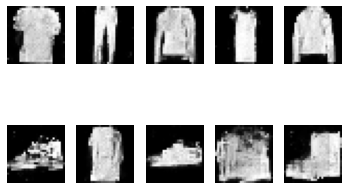

12201 [D loss: 0.691190, acc.: 53.52%] [G loss: 0.709737]
12202 [D loss: 0.688119, acc.: 55.47%] [G loss: 0.714268]
12203 [D loss: 0.691511, acc.: 53.91%] [G loss: 0.716743]
12204 [D loss: 0.686889, acc.: 59.77%] [G loss: 0.713781]
12205 [D loss: 0.689189, acc.: 56.64%] [G loss: 0.719261]
12206 [D loss: 0.685259, acc.: 62.11%] [G loss: 0.722032]
12207 [D loss: 0.687828, acc.: 59.38%] [G loss: 0.727136]
12208 [D loss: 0.686267, acc.: 58.20%] [G loss: 0.724659]
12209 [D loss: 0.685288, acc.: 58.20%] [G loss: 0.726121]
12210 [D loss: 0.682606, acc.: 58.98%] [G loss: 0.727193]
12211 [D loss: 0.684855, acc.: 57.42%] [G loss: 0.729302]
12212 [D loss: 0.683731, acc.: 57.42%] [G loss: 0.728815]
12213 [D loss: 0.686572, acc.: 52.34%] [G loss: 0.725456]
12214 [D loss: 0.688472, acc.: 50.78%] [G loss: 0.724288]
12215 [D loss: 0.690852, acc.: 52.73%] [G loss: 0.714495]
12216 [D loss: 0.691733, acc.: 47.66%] [G loss: 0.717536]
12217 [D loss: 0.697339, acc.: 47.66%] [G loss: 0.706493]
12218 [D loss:

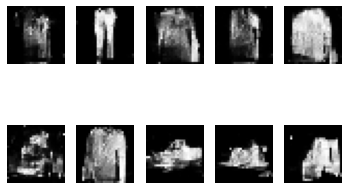

12401 [D loss: 0.720221, acc.: 32.81%] [G loss: 0.658698]
12402 [D loss: 0.718389, acc.: 32.81%] [G loss: 0.677600]
12403 [D loss: 0.718203, acc.: 31.64%] [G loss: 0.693146]
12404 [D loss: 0.703163, acc.: 40.62%] [G loss: 0.716133]
12405 [D loss: 0.701241, acc.: 40.62%] [G loss: 0.736476]
12406 [D loss: 0.688767, acc.: 44.53%] [G loss: 0.759790]
12407 [D loss: 0.681169, acc.: 52.73%] [G loss: 0.774570]
12408 [D loss: 0.676171, acc.: 55.86%] [G loss: 0.764316]
12409 [D loss: 0.670570, acc.: 58.98%] [G loss: 0.815102]
12410 [D loss: 0.657329, acc.: 59.77%] [G loss: 0.775131]
12411 [D loss: 0.672551, acc.: 55.86%] [G loss: 0.770918]
12412 [D loss: 0.665639, acc.: 60.94%] [G loss: 0.757757]
12413 [D loss: 0.668492, acc.: 64.06%] [G loss: 0.769957]
12414 [D loss: 0.684824, acc.: 59.38%] [G loss: 0.769007]
12415 [D loss: 0.693263, acc.: 54.30%] [G loss: 0.735219]
12416 [D loss: 0.676548, acc.: 59.77%] [G loss: 0.740931]
12417 [D loss: 0.680206, acc.: 55.08%] [G loss: 0.753948]
12418 [D loss:

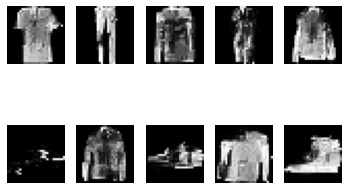

12601 [D loss: 0.687919, acc.: 59.77%] [G loss: 0.714461]
12602 [D loss: 0.685545, acc.: 61.72%] [G loss: 0.708141]
12603 [D loss: 0.686579, acc.: 59.77%] [G loss: 0.706950]
12604 [D loss: 0.685537, acc.: 59.77%] [G loss: 0.709560]
12605 [D loss: 0.685925, acc.: 58.98%] [G loss: 0.707940]
12606 [D loss: 0.685827, acc.: 57.81%] [G loss: 0.701738]
12607 [D loss: 0.688236, acc.: 58.98%] [G loss: 0.699489]
12608 [D loss: 0.689646, acc.: 52.73%] [G loss: 0.699187]
12609 [D loss: 0.687207, acc.: 52.34%] [G loss: 0.697673]
12610 [D loss: 0.693407, acc.: 47.66%] [G loss: 0.692377]
12611 [D loss: 0.695984, acc.: 44.92%] [G loss: 0.693578]
12612 [D loss: 0.690953, acc.: 48.44%] [G loss: 0.693688]
12613 [D loss: 0.695193, acc.: 43.75%] [G loss: 0.691237]
12614 [D loss: 0.692857, acc.: 51.95%] [G loss: 0.693429]
12615 [D loss: 0.693267, acc.: 49.22%] [G loss: 0.696836]
12616 [D loss: 0.694770, acc.: 48.44%] [G loss: 0.691917]
12617 [D loss: 0.693846, acc.: 48.44%] [G loss: 0.695278]
12618 [D loss:

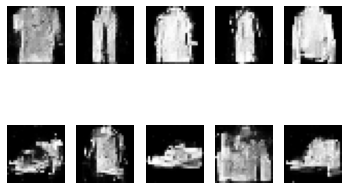

12801 [D loss: 0.686379, acc.: 57.42%] [G loss: 0.705320]
12802 [D loss: 0.691439, acc.: 52.34%] [G loss: 0.706047]
12803 [D loss: 0.683944, acc.: 56.64%] [G loss: 0.708320]
12804 [D loss: 0.685908, acc.: 56.64%] [G loss: 0.711860]
12805 [D loss: 0.686632, acc.: 53.91%] [G loss: 0.714667]
12806 [D loss: 0.679696, acc.: 60.94%] [G loss: 0.723888]
12807 [D loss: 0.681396, acc.: 60.16%] [G loss: 0.725865]
12808 [D loss: 0.685116, acc.: 54.69%] [G loss: 0.719381]
12809 [D loss: 0.682261, acc.: 59.77%] [G loss: 0.726396]
12810 [D loss: 0.685711, acc.: 52.34%] [G loss: 0.716288]
12811 [D loss: 0.677127, acc.: 60.16%] [G loss: 0.716354]
12812 [D loss: 0.683075, acc.: 53.12%] [G loss: 0.705453]
12813 [D loss: 0.687107, acc.: 52.73%] [G loss: 0.704808]
12814 [D loss: 0.687704, acc.: 49.61%] [G loss: 0.699607]
12815 [D loss: 0.688590, acc.: 51.56%] [G loss: 0.701028]
12816 [D loss: 0.688500, acc.: 55.47%] [G loss: 0.700458]
12817 [D loss: 0.689049, acc.: 57.42%] [G loss: 0.697069]
12818 [D loss:

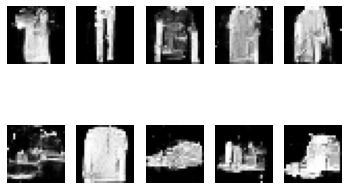

13001 [D loss: 0.691598, acc.: 54.30%] [G loss: 0.718656]
13002 [D loss: 0.693890, acc.: 52.73%] [G loss: 0.725279]
13003 [D loss: 0.693090, acc.: 52.34%] [G loss: 0.725217]
13004 [D loss: 0.694003, acc.: 50.00%] [G loss: 0.721537]
13005 [D loss: 0.689366, acc.: 57.42%] [G loss: 0.714232]
13006 [D loss: 0.695265, acc.: 53.91%] [G loss: 0.717642]
13007 [D loss: 0.689981, acc.: 53.52%] [G loss: 0.716533]
13008 [D loss: 0.693108, acc.: 55.47%] [G loss: 0.720259]
13009 [D loss: 0.701711, acc.: 44.92%] [G loss: 0.713225]
13010 [D loss: 0.695155, acc.: 50.39%] [G loss: 0.707169]
13011 [D loss: 0.698677, acc.: 46.88%] [G loss: 0.707667]
13012 [D loss: 0.696758, acc.: 48.83%] [G loss: 0.702221]
13013 [D loss: 0.698071, acc.: 45.31%] [G loss: 0.699639]
13014 [D loss: 0.700665, acc.: 41.02%] [G loss: 0.696925]
13015 [D loss: 0.700773, acc.: 48.05%] [G loss: 0.696160]
13016 [D loss: 0.702080, acc.: 45.31%] [G loss: 0.694490]
13017 [D loss: 0.703467, acc.: 46.48%] [G loss: 0.689060]
13018 [D loss:

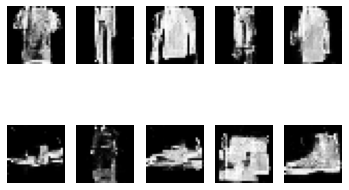

13201 [D loss: 0.689778, acc.: 52.34%] [G loss: 0.707182]
13202 [D loss: 0.693704, acc.: 50.39%] [G loss: 0.709007]
13203 [D loss: 0.691024, acc.: 55.08%] [G loss: 0.707281]
13204 [D loss: 0.690852, acc.: 51.56%] [G loss: 0.708499]
13205 [D loss: 0.691794, acc.: 51.95%] [G loss: 0.705649]
13206 [D loss: 0.687831, acc.: 55.08%] [G loss: 0.702387]
13207 [D loss: 0.691344, acc.: 50.00%] [G loss: 0.708992]
13208 [D loss: 0.685566, acc.: 57.81%] [G loss: 0.707348]
13209 [D loss: 0.689771, acc.: 55.08%] [G loss: 0.701760]
13210 [D loss: 0.694441, acc.: 48.44%] [G loss: 0.700734]
13211 [D loss: 0.688818, acc.: 56.25%] [G loss: 0.700198]
13212 [D loss: 0.692371, acc.: 54.30%] [G loss: 0.714558]
13213 [D loss: 0.686198, acc.: 58.59%] [G loss: 0.715438]
13214 [D loss: 0.687536, acc.: 60.94%] [G loss: 0.722782]
13215 [D loss: 0.689548, acc.: 55.47%] [G loss: 0.721264]
13216 [D loss: 0.688799, acc.: 60.55%] [G loss: 0.712589]
13217 [D loss: 0.688288, acc.: 60.16%] [G loss: 0.719083]
13218 [D loss:

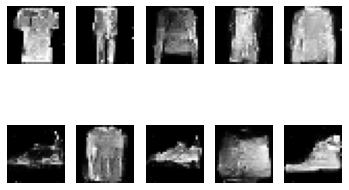

13401 [D loss: 0.690098, acc.: 48.44%] [G loss: 0.709203]
13402 [D loss: 0.685247, acc.: 54.30%] [G loss: 0.705677]
13403 [D loss: 0.684603, acc.: 49.61%] [G loss: 0.713871]
13404 [D loss: 0.688567, acc.: 45.31%] [G loss: 0.708662]
13405 [D loss: 0.690533, acc.: 44.92%] [G loss: 0.698603]
13406 [D loss: 0.689128, acc.: 46.09%] [G loss: 0.702457]
13407 [D loss: 0.692111, acc.: 46.48%] [G loss: 0.696687]
13408 [D loss: 0.690386, acc.: 48.83%] [G loss: 0.693328]
13409 [D loss: 0.697093, acc.: 46.48%] [G loss: 0.691392]
13410 [D loss: 0.700776, acc.: 43.36%] [G loss: 0.690189]
13411 [D loss: 0.703383, acc.: 43.36%] [G loss: 0.686462]
13412 [D loss: 0.701385, acc.: 46.48%] [G loss: 0.685078]
13413 [D loss: 0.703933, acc.: 43.75%] [G loss: 0.688674]
13414 [D loss: 0.703608, acc.: 40.23%] [G loss: 0.686277]
13415 [D loss: 0.702183, acc.: 42.58%] [G loss: 0.689319]
13416 [D loss: 0.702143, acc.: 46.48%] [G loss: 0.692148]
13417 [D loss: 0.706092, acc.: 42.58%] [G loss: 0.701699]
13418 [D loss:

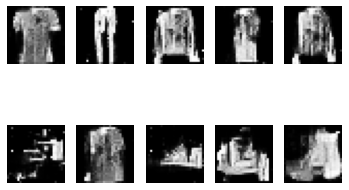

13601 [D loss: 0.678770, acc.: 55.08%] [G loss: 0.714096]
13602 [D loss: 0.687832, acc.: 54.69%] [G loss: 0.705753]
13603 [D loss: 0.687712, acc.: 48.83%] [G loss: 0.706395]
13604 [D loss: 0.686863, acc.: 49.61%] [G loss: 0.699428]
13605 [D loss: 0.689348, acc.: 47.66%] [G loss: 0.699103]
13606 [D loss: 0.692308, acc.: 46.48%] [G loss: 0.698746]
13607 [D loss: 0.698441, acc.: 41.02%] [G loss: 0.704016]
13608 [D loss: 0.689856, acc.: 45.70%] [G loss: 0.709249]
13609 [D loss: 0.692932, acc.: 49.61%] [G loss: 0.703779]
13610 [D loss: 0.688760, acc.: 48.44%] [G loss: 0.711028]
13611 [D loss: 0.690635, acc.: 51.95%] [G loss: 0.716706]
13612 [D loss: 0.694561, acc.: 50.39%] [G loss: 0.719640]
13613 [D loss: 0.689578, acc.: 53.12%] [G loss: 0.721226]
13614 [D loss: 0.687960, acc.: 53.12%] [G loss: 0.736653]
13615 [D loss: 0.688546, acc.: 47.66%] [G loss: 0.730764]
13616 [D loss: 0.686379, acc.: 52.34%] [G loss: 0.730169]
13617 [D loss: 0.685266, acc.: 51.95%] [G loss: 0.741220]
13618 [D loss:

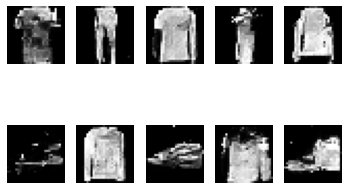

13801 [D loss: 0.678159, acc.: 64.06%] [G loss: 0.733977]
13802 [D loss: 0.680122, acc.: 60.55%] [G loss: 0.731924]
13803 [D loss: 0.681038, acc.: 55.86%] [G loss: 0.728680]
13804 [D loss: 0.680983, acc.: 60.55%] [G loss: 0.736031]
13805 [D loss: 0.675227, acc.: 68.75%] [G loss: 0.725856]
13806 [D loss: 0.680812, acc.: 64.06%] [G loss: 0.728727]
13807 [D loss: 0.681920, acc.: 64.84%] [G loss: 0.727942]
13808 [D loss: 0.676773, acc.: 63.28%] [G loss: 0.728886]
13809 [D loss: 0.680748, acc.: 63.67%] [G loss: 0.727457]
13810 [D loss: 0.674309, acc.: 71.09%] [G loss: 0.730935]
13811 [D loss: 0.682058, acc.: 60.55%] [G loss: 0.728135]
13812 [D loss: 0.677269, acc.: 64.45%] [G loss: 0.733318]
13813 [D loss: 0.679537, acc.: 64.84%] [G loss: 0.728550]
13814 [D loss: 0.678624, acc.: 65.62%] [G loss: 0.725009]
13815 [D loss: 0.681095, acc.: 64.84%] [G loss: 0.723648]
13816 [D loss: 0.682331, acc.: 62.89%] [G loss: 0.729877]
13817 [D loss: 0.687774, acc.: 55.08%] [G loss: 0.718350]
13818 [D loss:

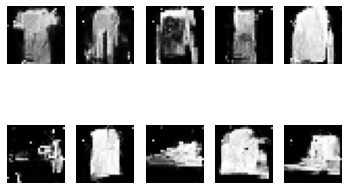

14001 [D loss: 0.699728, acc.: 48.05%] [G loss: 0.698796]
14002 [D loss: 0.698470, acc.: 44.14%] [G loss: 0.699418]
14003 [D loss: 0.696605, acc.: 51.56%] [G loss: 0.690945]
14004 [D loss: 0.694644, acc.: 53.91%] [G loss: 0.701948]
14005 [D loss: 0.692755, acc.: 51.17%] [G loss: 0.699584]
14006 [D loss: 0.701091, acc.: 43.36%] [G loss: 0.706545]
14007 [D loss: 0.699788, acc.: 46.09%] [G loss: 0.713597]
14008 [D loss: 0.695323, acc.: 51.95%] [G loss: 0.708122]
14009 [D loss: 0.691145, acc.: 52.34%] [G loss: 0.707621]
14010 [D loss: 0.697223, acc.: 51.95%] [G loss: 0.692963]
14011 [D loss: 0.696388, acc.: 51.56%] [G loss: 0.694917]
14012 [D loss: 0.700355, acc.: 50.39%] [G loss: 0.703061]
14013 [D loss: 0.702259, acc.: 48.05%] [G loss: 0.712840]
14014 [D loss: 0.703227, acc.: 50.00%] [G loss: 0.704214]
14015 [D loss: 0.702066, acc.: 48.05%] [G loss: 0.696599]
14016 [D loss: 0.699336, acc.: 48.05%] [G loss: 0.702943]
14017 [D loss: 0.692379, acc.: 56.64%] [G loss: 0.705713]
14018 [D loss:

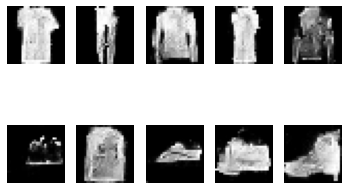

14201 [D loss: 0.698203, acc.: 43.75%] [G loss: 0.707752]
14202 [D loss: 0.692553, acc.: 53.91%] [G loss: 0.709893]
14203 [D loss: 0.693109, acc.: 54.30%] [G loss: 0.707703]
14204 [D loss: 0.696420, acc.: 51.17%] [G loss: 0.713271]
14205 [D loss: 0.695434, acc.: 49.61%] [G loss: 0.710277]
14206 [D loss: 0.696811, acc.: 51.17%] [G loss: 0.706077]
14207 [D loss: 0.694664, acc.: 48.05%] [G loss: 0.704783]
14208 [D loss: 0.695652, acc.: 47.27%] [G loss: 0.703374]
14209 [D loss: 0.697870, acc.: 46.09%] [G loss: 0.708125]
14210 [D loss: 0.694070, acc.: 49.22%] [G loss: 0.706319]
14211 [D loss: 0.694594, acc.: 48.44%] [G loss: 0.702587]
14212 [D loss: 0.700584, acc.: 44.53%] [G loss: 0.710969]
14213 [D loss: 0.690147, acc.: 53.91%] [G loss: 0.711097]
14214 [D loss: 0.691875, acc.: 52.34%] [G loss: 0.705225]
14215 [D loss: 0.695315, acc.: 49.61%] [G loss: 0.703194]
14216 [D loss: 0.693942, acc.: 49.22%] [G loss: 0.708907]
14217 [D loss: 0.693964, acc.: 52.34%] [G loss: 0.709124]
14218 [D loss:

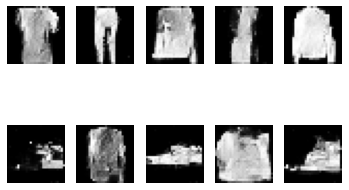

14401 [D loss: 0.695366, acc.: 46.88%] [G loss: 0.694762]
14402 [D loss: 0.695214, acc.: 46.09%] [G loss: 0.688591]
14403 [D loss: 0.694292, acc.: 48.05%] [G loss: 0.705458]
14404 [D loss: 0.694573, acc.: 50.78%] [G loss: 0.695597]
14405 [D loss: 0.695453, acc.: 46.48%] [G loss: 0.698161]
14406 [D loss: 0.690313, acc.: 53.12%] [G loss: 0.698616]
14407 [D loss: 0.692404, acc.: 52.34%] [G loss: 0.699136]
14408 [D loss: 0.691349, acc.: 53.52%] [G loss: 0.703612]
14409 [D loss: 0.692556, acc.: 50.00%] [G loss: 0.707159]
14410 [D loss: 0.690621, acc.: 54.30%] [G loss: 0.709532]
14411 [D loss: 0.690538, acc.: 52.34%] [G loss: 0.704588]
14412 [D loss: 0.687430, acc.: 57.81%] [G loss: 0.707954]
14413 [D loss: 0.688074, acc.: 54.30%] [G loss: 0.712775]
14414 [D loss: 0.690173, acc.: 51.17%] [G loss: 0.706296]
14415 [D loss: 0.689328, acc.: 50.78%] [G loss: 0.707810]
14416 [D loss: 0.688818, acc.: 52.73%] [G loss: 0.707083]
14417 [D loss: 0.687848, acc.: 56.25%] [G loss: 0.709369]
14418 [D loss:

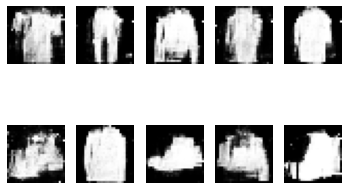

14601 [D loss: 0.711489, acc.: 30.86%] [G loss: 0.700212]
14602 [D loss: 0.692394, acc.: 50.78%] [G loss: 0.723598]
14603 [D loss: 0.674211, acc.: 62.11%] [G loss: 0.753206]
14604 [D loss: 0.672357, acc.: 60.94%] [G loss: 0.775435]
14605 [D loss: 0.663213, acc.: 64.06%] [G loss: 0.792835]
14606 [D loss: 0.648105, acc.: 69.92%] [G loss: 0.812955]
14607 [D loss: 0.653046, acc.: 67.19%] [G loss: 0.825998]
14608 [D loss: 0.637019, acc.: 71.09%] [G loss: 0.836936]
14609 [D loss: 0.634279, acc.: 69.14%] [G loss: 0.865785]
14610 [D loss: 0.630977, acc.: 65.23%] [G loss: 0.816691]
14611 [D loss: 0.654786, acc.: 53.91%] [G loss: 0.800742]
14612 [D loss: 0.685092, acc.: 50.78%] [G loss: 0.796792]
14613 [D loss: 0.678588, acc.: 47.66%] [G loss: 0.745222]
14614 [D loss: 0.696156, acc.: 51.95%] [G loss: 0.718652]
14615 [D loss: 0.715801, acc.: 46.09%] [G loss: 0.672509]
14616 [D loss: 0.760033, acc.: 38.67%] [G loss: 0.667509]
14617 [D loss: 0.732321, acc.: 39.84%] [G loss: 0.650527]
14618 [D loss:

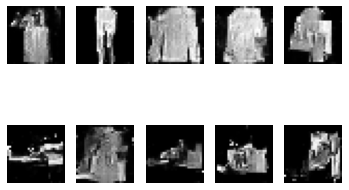

14801 [D loss: 0.683616, acc.: 54.69%] [G loss: 0.720158]
14802 [D loss: 0.678415, acc.: 61.72%] [G loss: 0.719730]
14803 [D loss: 0.676395, acc.: 64.06%] [G loss: 0.723842]
14804 [D loss: 0.668964, acc.: 67.19%] [G loss: 0.724783]
14805 [D loss: 0.673030, acc.: 63.28%] [G loss: 0.725412]
14806 [D loss: 0.667837, acc.: 63.67%] [G loss: 0.711517]
14807 [D loss: 0.674163, acc.: 62.11%] [G loss: 0.719253]
14808 [D loss: 0.671431, acc.: 57.42%] [G loss: 0.723462]
14809 [D loss: 0.677048, acc.: 56.25%] [G loss: 0.731983]
14810 [D loss: 0.674350, acc.: 55.47%] [G loss: 0.714282]
14811 [D loss: 0.677920, acc.: 55.86%] [G loss: 0.716449]
14812 [D loss: 0.679013, acc.: 53.12%] [G loss: 0.702484]
14813 [D loss: 0.681294, acc.: 51.17%] [G loss: 0.706777]
14814 [D loss: 0.673934, acc.: 55.08%] [G loss: 0.721786]
14815 [D loss: 0.682511, acc.: 49.22%] [G loss: 0.713005]
14816 [D loss: 0.681527, acc.: 50.78%] [G loss: 0.717473]
14817 [D loss: 0.677545, acc.: 55.08%] [G loss: 0.721472]
14818 [D loss:

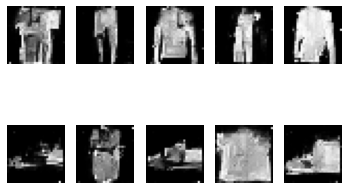

15001 [D loss: 0.691674, acc.: 56.25%] [G loss: 0.701557]
15002 [D loss: 0.690746, acc.: 57.42%] [G loss: 0.708009]
15003 [D loss: 0.685768, acc.: 58.20%] [G loss: 0.710045]
15004 [D loss: 0.692470, acc.: 52.73%] [G loss: 0.706360]
15005 [D loss: 0.692835, acc.: 54.30%] [G loss: 0.703421]
15006 [D loss: 0.690889, acc.: 58.98%] [G loss: 0.707172]
15007 [D loss: 0.691389, acc.: 57.81%] [G loss: 0.705465]
15008 [D loss: 0.691495, acc.: 55.86%] [G loss: 0.703095]
15009 [D loss: 0.685718, acc.: 60.16%] [G loss: 0.706191]
15010 [D loss: 0.687477, acc.: 57.42%] [G loss: 0.713725]
15011 [D loss: 0.688010, acc.: 53.91%] [G loss: 0.714020]
15012 [D loss: 0.688989, acc.: 51.95%] [G loss: 0.711982]
15013 [D loss: 0.690977, acc.: 49.61%] [G loss: 0.717299]
15014 [D loss: 0.688351, acc.: 50.00%] [G loss: 0.718333]
15015 [D loss: 0.691356, acc.: 53.12%] [G loss: 0.725249]
15016 [D loss: 0.687484, acc.: 56.25%] [G loss: 0.719408]
15017 [D loss: 0.685812, acc.: 56.64%] [G loss: 0.726392]
15018 [D loss:

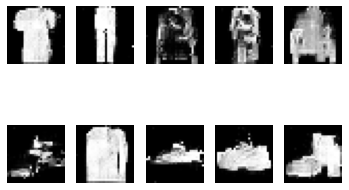

15201 [D loss: 0.690858, acc.: 52.73%] [G loss: 0.712553]
15202 [D loss: 0.687616, acc.: 58.20%] [G loss: 0.710540]
15203 [D loss: 0.688144, acc.: 54.30%] [G loss: 0.717116]
15204 [D loss: 0.682845, acc.: 63.28%] [G loss: 0.714145]
15205 [D loss: 0.691800, acc.: 53.91%] [G loss: 0.712201]
15206 [D loss: 0.686247, acc.: 62.11%] [G loss: 0.722390]
15207 [D loss: 0.688278, acc.: 58.20%] [G loss: 0.716962]
15208 [D loss: 0.684357, acc.: 60.55%] [G loss: 0.713853]
15209 [D loss: 0.689040, acc.: 55.47%] [G loss: 0.715666]
15210 [D loss: 0.683694, acc.: 57.42%] [G loss: 0.715659]
15211 [D loss: 0.691205, acc.: 54.69%] [G loss: 0.714362]
15212 [D loss: 0.687491, acc.: 52.73%] [G loss: 0.723809]
15213 [D loss: 0.690781, acc.: 50.39%] [G loss: 0.715540]
15214 [D loss: 0.689905, acc.: 53.12%] [G loss: 0.709897]
15215 [D loss: 0.689092, acc.: 55.86%] [G loss: 0.708449]
15216 [D loss: 0.691855, acc.: 48.44%] [G loss: 0.710678]
15217 [D loss: 0.694468, acc.: 45.31%] [G loss: 0.713371]
15218 [D loss:

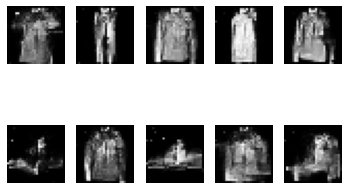

15401 [D loss: 0.696486, acc.: 49.61%] [G loss: 0.705054]
15402 [D loss: 0.694532, acc.: 49.61%] [G loss: 0.697424]
15403 [D loss: 0.693387, acc.: 51.95%] [G loss: 0.689665]
15404 [D loss: 0.698161, acc.: 48.05%] [G loss: 0.686782]
15405 [D loss: 0.704448, acc.: 37.50%] [G loss: 0.676596]
15406 [D loss: 0.708037, acc.: 36.72%] [G loss: 0.673083]
15407 [D loss: 0.702011, acc.: 37.50%] [G loss: 0.669892]
15408 [D loss: 0.706882, acc.: 38.28%] [G loss: 0.662520]
15409 [D loss: 0.714202, acc.: 35.55%] [G loss: 0.660391]
15410 [D loss: 0.713607, acc.: 33.98%] [G loss: 0.658119]
15411 [D loss: 0.714896, acc.: 37.11%] [G loss: 0.665719]
15412 [D loss: 0.713030, acc.: 35.16%] [G loss: 0.675433]
15413 [D loss: 0.705466, acc.: 41.02%] [G loss: 0.677542]
15414 [D loss: 0.702342, acc.: 46.48%] [G loss: 0.680451]
15415 [D loss: 0.703545, acc.: 43.36%] [G loss: 0.693091]
15416 [D loss: 0.709528, acc.: 37.89%] [G loss: 0.692314]
15417 [D loss: 0.703992, acc.: 42.19%] [G loss: 0.695944]
15418 [D loss:

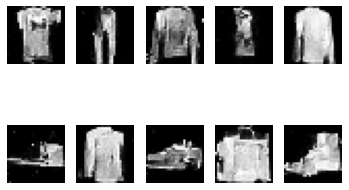

15601 [D loss: 0.695184, acc.: 56.64%] [G loss: 0.700103]
15602 [D loss: 0.692190, acc.: 58.59%] [G loss: 0.706506]
15603 [D loss: 0.692950, acc.: 52.73%] [G loss: 0.705404]
15604 [D loss: 0.689566, acc.: 56.25%] [G loss: 0.708327]
15605 [D loss: 0.689740, acc.: 53.52%] [G loss: 0.705460]
15606 [D loss: 0.698763, acc.: 46.48%] [G loss: 0.704519]
15607 [D loss: 0.688255, acc.: 53.91%] [G loss: 0.707178]
15608 [D loss: 0.688953, acc.: 53.52%] [G loss: 0.714957]
15609 [D loss: 0.686245, acc.: 57.03%] [G loss: 0.715960]
15610 [D loss: 0.690121, acc.: 54.30%] [G loss: 0.706200]
15611 [D loss: 0.688432, acc.: 51.56%] [G loss: 0.708507]
15612 [D loss: 0.687014, acc.: 53.52%] [G loss: 0.711468]
15613 [D loss: 0.684231, acc.: 57.81%] [G loss: 0.718219]
15614 [D loss: 0.684799, acc.: 57.03%] [G loss: 0.709733]
15615 [D loss: 0.682665, acc.: 58.98%] [G loss: 0.712775]
15616 [D loss: 0.688214, acc.: 53.12%] [G loss: 0.721518]
15617 [D loss: 0.685943, acc.: 55.08%] [G loss: 0.717638]
15618 [D loss:

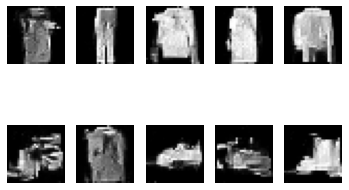

15801 [D loss: 0.685089, acc.: 55.47%] [G loss: 0.709844]
15802 [D loss: 0.682848, acc.: 57.42%] [G loss: 0.719217]
15803 [D loss: 0.690296, acc.: 56.25%] [G loss: 0.713884]
15804 [D loss: 0.683645, acc.: 57.81%] [G loss: 0.728567]
15805 [D loss: 0.681704, acc.: 58.98%] [G loss: 0.710755]
15806 [D loss: 0.682169, acc.: 54.69%] [G loss: 0.705357]
15807 [D loss: 0.684705, acc.: 59.38%] [G loss: 0.721365]
15808 [D loss: 0.685108, acc.: 58.20%] [G loss: 0.722115]
15809 [D loss: 0.687038, acc.: 60.55%] [G loss: 0.722150]
15810 [D loss: 0.680742, acc.: 62.50%] [G loss: 0.725377]
15811 [D loss: 0.680133, acc.: 60.55%] [G loss: 0.709229]
15812 [D loss: 0.677053, acc.: 64.45%] [G loss: 0.729035]
15813 [D loss: 0.682932, acc.: 64.06%] [G loss: 0.741241]
15814 [D loss: 0.676226, acc.: 64.45%] [G loss: 0.724177]
15815 [D loss: 0.681281, acc.: 59.77%] [G loss: 0.738125]
15816 [D loss: 0.679795, acc.: 62.89%] [G loss: 0.740162]
15817 [D loss: 0.685692, acc.: 60.16%] [G loss: 0.729231]
15818 [D loss:

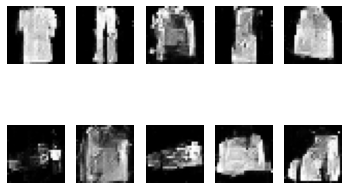

16001 [D loss: 0.687756, acc.: 51.17%] [G loss: 0.724361]
16002 [D loss: 0.680534, acc.: 53.91%] [G loss: 0.716347]
16003 [D loss: 0.678686, acc.: 55.08%] [G loss: 0.724733]
16004 [D loss: 0.678457, acc.: 58.98%] [G loss: 0.713345]
16005 [D loss: 0.682282, acc.: 54.69%] [G loss: 0.719114]
16006 [D loss: 0.676076, acc.: 57.81%] [G loss: 0.712592]
16007 [D loss: 0.685723, acc.: 51.95%] [G loss: 0.709837]
16008 [D loss: 0.685641, acc.: 48.83%] [G loss: 0.713274]
16009 [D loss: 0.691675, acc.: 46.09%] [G loss: 0.712174]
16010 [D loss: 0.689691, acc.: 51.17%] [G loss: 0.710744]
16011 [D loss: 0.685886, acc.: 46.48%] [G loss: 0.703507]
16012 [D loss: 0.695560, acc.: 46.88%] [G loss: 0.704320]
16013 [D loss: 0.687580, acc.: 46.09%] [G loss: 0.702569]
16014 [D loss: 0.690171, acc.: 46.48%] [G loss: 0.702768]
16015 [D loss: 0.697675, acc.: 39.84%] [G loss: 0.702338]
16016 [D loss: 0.693878, acc.: 45.70%] [G loss: 0.696281]
16017 [D loss: 0.698217, acc.: 42.19%] [G loss: 0.699039]
16018 [D loss:

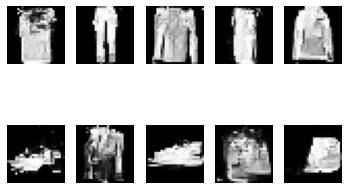

16201 [D loss: 0.693435, acc.: 53.52%] [G loss: 0.712571]
16202 [D loss: 0.695067, acc.: 54.69%] [G loss: 0.716914]
16203 [D loss: 0.693882, acc.: 56.25%] [G loss: 0.717916]
16204 [D loss: 0.688713, acc.: 56.25%] [G loss: 0.727696]
16205 [D loss: 0.690663, acc.: 55.86%] [G loss: 0.723934]
16206 [D loss: 0.691170, acc.: 50.00%] [G loss: 0.725671]
16207 [D loss: 0.684978, acc.: 56.64%] [G loss: 0.725712]
16208 [D loss: 0.689733, acc.: 55.08%] [G loss: 0.718676]
16209 [D loss: 0.694845, acc.: 48.05%] [G loss: 0.732226]
16210 [D loss: 0.693058, acc.: 48.05%] [G loss: 0.727364]
16211 [D loss: 0.696593, acc.: 49.61%] [G loss: 0.729392]
16212 [D loss: 0.694277, acc.: 50.39%] [G loss: 0.723080]
16213 [D loss: 0.696297, acc.: 48.44%] [G loss: 0.715892]
16214 [D loss: 0.698854, acc.: 51.17%] [G loss: 0.710082]
16215 [D loss: 0.698302, acc.: 53.12%] [G loss: 0.710442]
16216 [D loss: 0.696990, acc.: 53.52%] [G loss: 0.708137]
16217 [D loss: 0.696726, acc.: 51.17%] [G loss: 0.698015]
16218 [D loss:

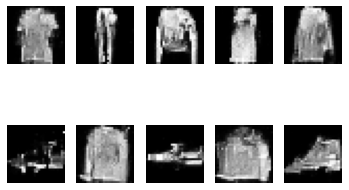

16401 [D loss: 0.686193, acc.: 53.52%] [G loss: 0.703429]
16402 [D loss: 0.689772, acc.: 47.66%] [G loss: 0.708673]
16403 [D loss: 0.686579, acc.: 50.78%] [G loss: 0.707392]
16404 [D loss: 0.693476, acc.: 48.05%] [G loss: 0.704302]
16405 [D loss: 0.691473, acc.: 47.27%] [G loss: 0.713838]
16406 [D loss: 0.687033, acc.: 48.44%] [G loss: 0.694026]
16407 [D loss: 0.690556, acc.: 51.17%] [G loss: 0.695678]
16408 [D loss: 0.685900, acc.: 55.47%] [G loss: 0.710492]
16409 [D loss: 0.689391, acc.: 55.08%] [G loss: 0.708329]
16410 [D loss: 0.682382, acc.: 60.55%] [G loss: 0.697462]
16411 [D loss: 0.690526, acc.: 53.12%] [G loss: 0.697386]
16412 [D loss: 0.686602, acc.: 56.64%] [G loss: 0.699984]
16413 [D loss: 0.694102, acc.: 55.86%] [G loss: 0.717516]
16414 [D loss: 0.704320, acc.: 48.83%] [G loss: 0.688084]
16415 [D loss: 0.698016, acc.: 52.73%] [G loss: 0.693457]
16416 [D loss: 0.705404, acc.: 43.75%] [G loss: 0.686219]
16417 [D loss: 0.705236, acc.: 42.97%] [G loss: 0.681083]
16418 [D loss:

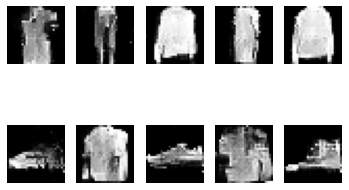

16601 [D loss: 0.686445, acc.: 55.47%] [G loss: 0.748409]
16602 [D loss: 0.684463, acc.: 52.34%] [G loss: 0.747365]
16603 [D loss: 0.682068, acc.: 55.47%] [G loss: 0.739846]
16604 [D loss: 0.682086, acc.: 55.86%] [G loss: 0.744941]
16605 [D loss: 0.682435, acc.: 58.59%] [G loss: 0.733553]
16606 [D loss: 0.680890, acc.: 57.42%] [G loss: 0.737696]
16607 [D loss: 0.676479, acc.: 55.86%] [G loss: 0.735752]
16608 [D loss: 0.682056, acc.: 56.64%] [G loss: 0.737033]
16609 [D loss: 0.690399, acc.: 51.56%] [G loss: 0.728048]
16610 [D loss: 0.690749, acc.: 50.78%] [G loss: 0.730213]
16611 [D loss: 0.682050, acc.: 53.12%] [G loss: 0.728530]
16612 [D loss: 0.682903, acc.: 53.52%] [G loss: 0.732321]
16613 [D loss: 0.688215, acc.: 51.17%] [G loss: 0.732763]
16614 [D loss: 0.681765, acc.: 54.69%] [G loss: 0.739858]
16615 [D loss: 0.683729, acc.: 49.22%] [G loss: 0.731986]
16616 [D loss: 0.690803, acc.: 52.34%] [G loss: 0.723176]
16617 [D loss: 0.691050, acc.: 51.17%] [G loss: 0.725946]
16618 [D loss:

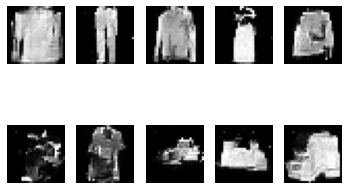

16801 [D loss: 0.694063, acc.: 50.39%] [G loss: 0.703125]
16802 [D loss: 0.704089, acc.: 42.58%] [G loss: 0.694234]
16803 [D loss: 0.694960, acc.: 48.44%] [G loss: 0.702349]
16804 [D loss: 0.705240, acc.: 46.48%] [G loss: 0.706135]
16805 [D loss: 0.703741, acc.: 45.31%] [G loss: 0.700744]
16806 [D loss: 0.702088, acc.: 44.14%] [G loss: 0.698454]
16807 [D loss: 0.695198, acc.: 48.44%] [G loss: 0.695353]
16808 [D loss: 0.701420, acc.: 48.44%] [G loss: 0.706101]
16809 [D loss: 0.711261, acc.: 41.41%] [G loss: 0.699932]
16810 [D loss: 0.697149, acc.: 50.00%] [G loss: 0.698920]
16811 [D loss: 0.703115, acc.: 50.39%] [G loss: 0.688895]
16812 [D loss: 0.698267, acc.: 49.61%] [G loss: 0.700894]
16813 [D loss: 0.703214, acc.: 47.27%] [G loss: 0.705906]
16814 [D loss: 0.702345, acc.: 48.05%] [G loss: 0.705205]
16815 [D loss: 0.701386, acc.: 48.83%] [G loss: 0.708132]
16816 [D loss: 0.694958, acc.: 51.95%] [G loss: 0.710047]
16817 [D loss: 0.693053, acc.: 53.91%] [G loss: 0.720625]
16818 [D loss:

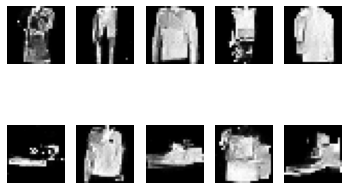

17001 [D loss: 0.690770, acc.: 56.25%] [G loss: 0.715185]
17002 [D loss: 0.683076, acc.: 57.81%] [G loss: 0.711272]
17003 [D loss: 0.691909, acc.: 56.25%] [G loss: 0.715554]
17004 [D loss: 0.686586, acc.: 58.98%] [G loss: 0.719343]
17005 [D loss: 0.684654, acc.: 59.38%] [G loss: 0.728142]
17006 [D loss: 0.689076, acc.: 51.95%] [G loss: 0.717350]
17007 [D loss: 0.689289, acc.: 50.78%] [G loss: 0.723879]
17008 [D loss: 0.685683, acc.: 57.81%] [G loss: 0.724861]
17009 [D loss: 0.683746, acc.: 61.33%] [G loss: 0.716661]
17010 [D loss: 0.682411, acc.: 61.33%] [G loss: 0.722660]
17011 [D loss: 0.687363, acc.: 59.77%] [G loss: 0.714539]
17012 [D loss: 0.687321, acc.: 59.38%] [G loss: 0.717592]
17013 [D loss: 0.686056, acc.: 58.59%] [G loss: 0.708263]
17014 [D loss: 0.686645, acc.: 56.64%] [G loss: 0.720730]
17015 [D loss: 0.687069, acc.: 57.81%] [G loss: 0.720296]
17016 [D loss: 0.689139, acc.: 57.81%] [G loss: 0.714774]
17017 [D loss: 0.688381, acc.: 57.03%] [G loss: 0.715151]
17018 [D loss:

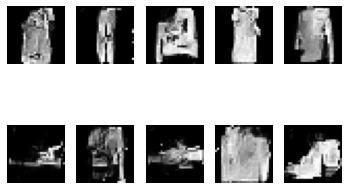

17201 [D loss: 0.685734, acc.: 58.59%] [G loss: 0.708884]
17202 [D loss: 0.686067, acc.: 58.98%] [G loss: 0.717598]
17203 [D loss: 0.684100, acc.: 60.55%] [G loss: 0.712271]
17204 [D loss: 0.687661, acc.: 55.86%] [G loss: 0.712217]
17205 [D loss: 0.686317, acc.: 56.25%] [G loss: 0.722525]
17206 [D loss: 0.683918, acc.: 57.03%] [G loss: 0.724488]
17207 [D loss: 0.677589, acc.: 60.94%] [G loss: 0.724160]
17208 [D loss: 0.681661, acc.: 58.59%] [G loss: 0.726544]
17209 [D loss: 0.679175, acc.: 57.03%] [G loss: 0.723979]
17210 [D loss: 0.683080, acc.: 58.20%] [G loss: 0.724506]
17211 [D loss: 0.681123, acc.: 59.77%] [G loss: 0.721654]
17212 [D loss: 0.684778, acc.: 58.59%] [G loss: 0.721826]
17213 [D loss: 0.680731, acc.: 58.98%] [G loss: 0.731875]
17214 [D loss: 0.679672, acc.: 62.89%] [G loss: 0.729418]
17215 [D loss: 0.683257, acc.: 62.11%] [G loss: 0.730357]
17216 [D loss: 0.672649, acc.: 64.06%] [G loss: 0.734955]
17217 [D loss: 0.682561, acc.: 57.81%] [G loss: 0.727913]
17218 [D loss:

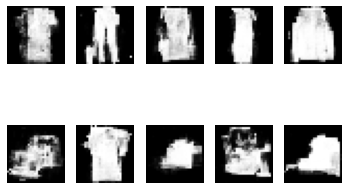

17401 [D loss: 0.722323, acc.: 48.05%] [G loss: 0.682627]
17402 [D loss: 0.708287, acc.: 50.78%] [G loss: 0.715641]
17403 [D loss: 0.689596, acc.: 57.03%] [G loss: 0.723132]
17404 [D loss: 0.685848, acc.: 62.50%] [G loss: 0.735130]
17405 [D loss: 0.679789, acc.: 65.62%] [G loss: 0.759457]
17406 [D loss: 0.671939, acc.: 66.02%] [G loss: 0.771782]
17407 [D loss: 0.665176, acc.: 62.89%] [G loss: 0.793196]
17408 [D loss: 0.661170, acc.: 66.02%] [G loss: 0.810649]
17409 [D loss: 0.647107, acc.: 66.41%] [G loss: 0.842074]
17410 [D loss: 0.643144, acc.: 65.23%] [G loss: 0.855394]
17411 [D loss: 0.639187, acc.: 64.84%] [G loss: 0.866085]
17412 [D loss: 0.644312, acc.: 67.58%] [G loss: 0.876932]
17413 [D loss: 0.639893, acc.: 66.80%] [G loss: 0.876593]
17414 [D loss: 0.636888, acc.: 66.80%] [G loss: 0.854812]
17415 [D loss: 0.638156, acc.: 65.62%] [G loss: 0.845752]
17416 [D loss: 0.646576, acc.: 60.16%] [G loss: 0.780254]
17417 [D loss: 0.682500, acc.: 52.34%] [G loss: 0.769400]
17418 [D loss:

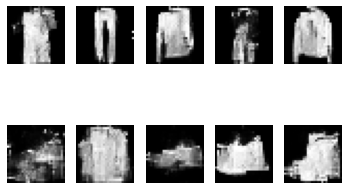

17601 [D loss: 0.688320, acc.: 54.69%] [G loss: 0.731174]
17602 [D loss: 0.685752, acc.: 49.22%] [G loss: 0.733583]
17603 [D loss: 0.691216, acc.: 49.61%] [G loss: 0.701225]
17604 [D loss: 0.699994, acc.: 54.30%] [G loss: 0.681598]
17605 [D loss: 0.718804, acc.: 43.75%] [G loss: 0.668447]
17606 [D loss: 0.722326, acc.: 46.09%] [G loss: 0.686908]
17607 [D loss: 0.717084, acc.: 44.92%] [G loss: 0.689587]
17608 [D loss: 0.723943, acc.: 34.77%] [G loss: 0.697334]
17609 [D loss: 0.705718, acc.: 43.75%] [G loss: 0.736969]
17610 [D loss: 0.694157, acc.: 50.00%] [G loss: 0.748013]
17611 [D loss: 0.687462, acc.: 53.52%] [G loss: 0.734996]
17612 [D loss: 0.692374, acc.: 51.17%] [G loss: 0.732098]
17613 [D loss: 0.694615, acc.: 51.17%] [G loss: 0.731875]
17614 [D loss: 0.695131, acc.: 52.34%] [G loss: 0.720279]
17615 [D loss: 0.698962, acc.: 50.39%] [G loss: 0.720304]
17616 [D loss: 0.701248, acc.: 49.22%] [G loss: 0.712755]
17617 [D loss: 0.695351, acc.: 51.56%] [G loss: 0.701217]
17618 [D loss:

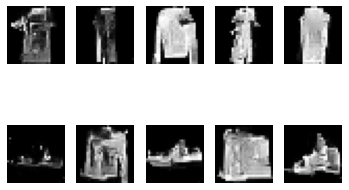

17801 [D loss: 0.680728, acc.: 59.38%] [G loss: 0.743480]
17802 [D loss: 0.669284, acc.: 62.50%] [G loss: 0.744861]
17803 [D loss: 0.680428, acc.: 59.77%] [G loss: 0.738139]
17804 [D loss: 0.680600, acc.: 58.59%] [G loss: 0.736604]
17805 [D loss: 0.677890, acc.: 60.94%] [G loss: 0.745820]
17806 [D loss: 0.670559, acc.: 66.80%] [G loss: 0.744771]
17807 [D loss: 0.671136, acc.: 64.06%] [G loss: 0.729402]
17808 [D loss: 0.677700, acc.: 64.45%] [G loss: 0.725096]
17809 [D loss: 0.688877, acc.: 57.03%] [G loss: 0.727771]
17810 [D loss: 0.680850, acc.: 62.50%] [G loss: 0.726642]
17811 [D loss: 0.686508, acc.: 54.69%] [G loss: 0.725367]
17812 [D loss: 0.681740, acc.: 61.33%] [G loss: 0.730250]
17813 [D loss: 0.684249, acc.: 60.16%] [G loss: 0.737630]
17814 [D loss: 0.688026, acc.: 54.30%] [G loss: 0.739090]
17815 [D loss: 0.680179, acc.: 58.20%] [G loss: 0.736246]
17816 [D loss: 0.687485, acc.: 55.47%] [G loss: 0.732030]
17817 [D loss: 0.689268, acc.: 57.42%] [G loss: 0.738166]
17818 [D loss:

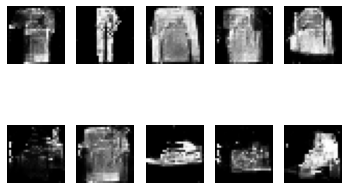

18001 [D loss: 0.710998, acc.: 50.39%] [G loss: 0.694168]
18002 [D loss: 0.720102, acc.: 44.14%] [G loss: 0.697201]
18003 [D loss: 0.712918, acc.: 48.05%] [G loss: 0.703293]
18004 [D loss: 0.716170, acc.: 47.66%] [G loss: 0.699069]
18005 [D loss: 0.705492, acc.: 48.44%] [G loss: 0.711286]
18006 [D loss: 0.701934, acc.: 45.31%] [G loss: 0.713477]
18007 [D loss: 0.681323, acc.: 55.08%] [G loss: 0.728938]
18008 [D loss: 0.692643, acc.: 48.05%] [G loss: 0.731566]
18009 [D loss: 0.685091, acc.: 55.47%] [G loss: 0.748456]
18010 [D loss: 0.682253, acc.: 56.25%] [G loss: 0.731790]
18011 [D loss: 0.682410, acc.: 54.69%] [G loss: 0.699985]
18012 [D loss: 0.688964, acc.: 54.69%] [G loss: 0.708390]
18013 [D loss: 0.701056, acc.: 51.56%] [G loss: 0.690421]
18014 [D loss: 0.700361, acc.: 53.12%] [G loss: 0.695841]
18015 [D loss: 0.691167, acc.: 52.73%] [G loss: 0.686774]
18016 [D loss: 0.701696, acc.: 51.95%] [G loss: 0.700162]
18017 [D loss: 0.694774, acc.: 51.17%] [G loss: 0.705845]
18018 [D loss:

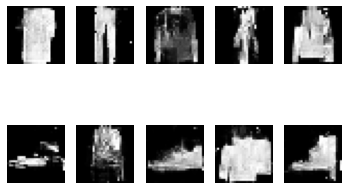

18201 [D loss: 0.677831, acc.: 62.50%] [G loss: 0.724348]
18202 [D loss: 0.682259, acc.: 60.94%] [G loss: 0.733720]
18203 [D loss: 0.681315, acc.: 60.16%] [G loss: 0.743066]
18204 [D loss: 0.691176, acc.: 55.47%] [G loss: 0.737442]
18205 [D loss: 0.681093, acc.: 58.20%] [G loss: 0.724823]
18206 [D loss: 0.676461, acc.: 60.94%] [G loss: 0.730365]
18207 [D loss: 0.672865, acc.: 66.02%] [G loss: 0.720602]
18208 [D loss: 0.688568, acc.: 57.81%] [G loss: 0.733065]
18209 [D loss: 0.686029, acc.: 58.59%] [G loss: 0.730545]
18210 [D loss: 0.680421, acc.: 59.38%] [G loss: 0.729612]
18211 [D loss: 0.681771, acc.: 55.08%] [G loss: 0.719333]
18212 [D loss: 0.684603, acc.: 54.30%] [G loss: 0.722489]
18213 [D loss: 0.682174, acc.: 55.47%] [G loss: 0.721352]
18214 [D loss: 0.681659, acc.: 55.08%] [G loss: 0.718631]
18215 [D loss: 0.680233, acc.: 53.91%] [G loss: 0.715779]
18216 [D loss: 0.682406, acc.: 53.91%] [G loss: 0.717089]
18217 [D loss: 0.688013, acc.: 52.73%] [G loss: 0.710029]
18218 [D loss:

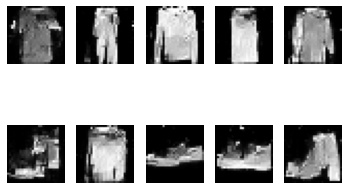

18401 [D loss: 0.710785, acc.: 41.80%] [G loss: 0.687427]
18402 [D loss: 0.710086, acc.: 42.97%] [G loss: 0.683073]
18403 [D loss: 0.711720, acc.: 39.84%] [G loss: 0.689100]
18404 [D loss: 0.701532, acc.: 45.70%] [G loss: 0.690370]
18405 [D loss: 0.703875, acc.: 46.48%] [G loss: 0.696062]
18406 [D loss: 0.701121, acc.: 50.39%] [G loss: 0.689635]
18407 [D loss: 0.702706, acc.: 46.88%] [G loss: 0.697125]
18408 [D loss: 0.703002, acc.: 48.44%] [G loss: 0.703423]
18409 [D loss: 0.698702, acc.: 49.61%] [G loss: 0.700358]
18410 [D loss: 0.698799, acc.: 46.48%] [G loss: 0.704503]
18411 [D loss: 0.699777, acc.: 49.22%] [G loss: 0.699705]
18412 [D loss: 0.693886, acc.: 50.00%] [G loss: 0.703776]
18413 [D loss: 0.694551, acc.: 53.12%] [G loss: 0.703756]
18414 [D loss: 0.696553, acc.: 50.39%] [G loss: 0.702344]
18415 [D loss: 0.698311, acc.: 48.05%] [G loss: 0.698141]
18416 [D loss: 0.697656, acc.: 50.00%] [G loss: 0.697385]
18417 [D loss: 0.700133, acc.: 47.27%] [G loss: 0.703903]
18418 [D loss:

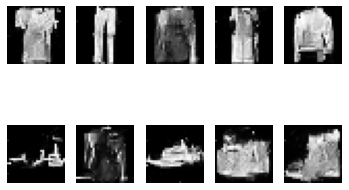

18601 [D loss: 0.707297, acc.: 37.11%] [G loss: 0.700861]
18602 [D loss: 0.705319, acc.: 39.84%] [G loss: 0.700008]
18603 [D loss: 0.708118, acc.: 37.50%] [G loss: 0.702242]
18604 [D loss: 0.697457, acc.: 37.11%] [G loss: 0.708925]
18605 [D loss: 0.699270, acc.: 39.45%] [G loss: 0.714373]
18606 [D loss: 0.696697, acc.: 42.58%] [G loss: 0.711748]
18607 [D loss: 0.694416, acc.: 44.53%] [G loss: 0.722662]
18608 [D loss: 0.687371, acc.: 46.88%] [G loss: 0.718192]
18609 [D loss: 0.685284, acc.: 52.73%] [G loss: 0.718454]
18610 [D loss: 0.691645, acc.: 51.95%] [G loss: 0.716318]
18611 [D loss: 0.687390, acc.: 53.12%] [G loss: 0.720739]
18612 [D loss: 0.691806, acc.: 53.52%] [G loss: 0.722185]
18613 [D loss: 0.689323, acc.: 57.42%] [G loss: 0.718181]
18614 [D loss: 0.688616, acc.: 51.56%] [G loss: 0.719104]
18615 [D loss: 0.686562, acc.: 55.08%] [G loss: 0.726844]
18616 [D loss: 0.688699, acc.: 51.56%] [G loss: 0.722043]
18617 [D loss: 0.685329, acc.: 55.08%] [G loss: 0.719148]
18618 [D loss:

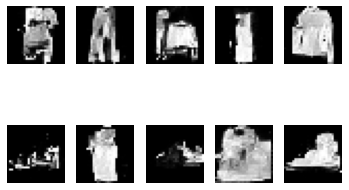

18801 [D loss: 0.650799, acc.: 77.73%] [G loss: 0.770327]
18802 [D loss: 0.655166, acc.: 76.56%] [G loss: 0.762477]
18803 [D loss: 0.648076, acc.: 77.34%] [G loss: 0.766420]
18804 [D loss: 0.657944, acc.: 73.05%] [G loss: 0.761266]
18805 [D loss: 0.656918, acc.: 77.73%] [G loss: 0.758985]
18806 [D loss: 0.659293, acc.: 72.27%] [G loss: 0.765249]
18807 [D loss: 0.661169, acc.: 73.83%] [G loss: 0.761924]
18808 [D loss: 0.656981, acc.: 64.84%] [G loss: 0.753818]
18809 [D loss: 0.663215, acc.: 63.67%] [G loss: 0.732336]
18810 [D loss: 0.664843, acc.: 64.84%] [G loss: 0.755218]
18811 [D loss: 0.656144, acc.: 72.66%] [G loss: 0.727103]
18812 [D loss: 0.666600, acc.: 64.45%] [G loss: 0.744697]
18813 [D loss: 0.673142, acc.: 63.67%] [G loss: 0.742764]
18814 [D loss: 0.666796, acc.: 66.02%] [G loss: 0.731209]
18815 [D loss: 0.670429, acc.: 65.62%] [G loss: 0.739950]
18816 [D loss: 0.665337, acc.: 68.75%] [G loss: 0.743516]
18817 [D loss: 0.663985, acc.: 65.62%] [G loss: 0.753783]
18818 [D loss:

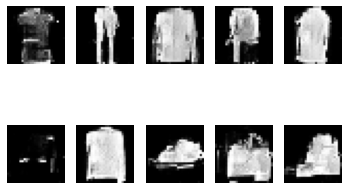

19001 [D loss: 0.690905, acc.: 55.47%] [G loss: 0.722048]
19002 [D loss: 0.685552, acc.: 55.47%] [G loss: 0.732912]
19003 [D loss: 0.685387, acc.: 55.08%] [G loss: 0.743156]
19004 [D loss: 0.675907, acc.: 59.77%] [G loss: 0.740625]
19005 [D loss: 0.678349, acc.: 58.98%] [G loss: 0.744585]
19006 [D loss: 0.678959, acc.: 56.25%] [G loss: 0.738247]
19007 [D loss: 0.676649, acc.: 62.89%] [G loss: 0.746932]
19008 [D loss: 0.680900, acc.: 60.16%] [G loss: 0.756095]
19009 [D loss: 0.685260, acc.: 53.52%] [G loss: 0.762398]
19010 [D loss: 0.668760, acc.: 64.45%] [G loss: 0.771164]
19011 [D loss: 0.666527, acc.: 65.23%] [G loss: 0.756453]
19012 [D loss: 0.673659, acc.: 64.45%] [G loss: 0.758683]
19013 [D loss: 0.655495, acc.: 68.75%] [G loss: 0.776627]
19014 [D loss: 0.659930, acc.: 67.97%] [G loss: 0.768587]
19015 [D loss: 0.671782, acc.: 62.50%] [G loss: 0.772638]
19016 [D loss: 0.668394, acc.: 61.72%] [G loss: 0.784156]
19017 [D loss: 0.660372, acc.: 67.19%] [G loss: 0.773416]
19018 [D loss:

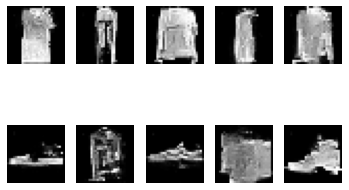

19201 [D loss: 0.672864, acc.: 68.36%] [G loss: 0.737995]
19202 [D loss: 0.666417, acc.: 66.41%] [G loss: 0.741418]
19203 [D loss: 0.683250, acc.: 61.72%] [G loss: 0.742022]
19204 [D loss: 0.682855, acc.: 60.55%] [G loss: 0.743731]
19205 [D loss: 0.672457, acc.: 63.28%] [G loss: 0.737951]
19206 [D loss: 0.673598, acc.: 62.11%] [G loss: 0.730811]
19207 [D loss: 0.673087, acc.: 65.62%] [G loss: 0.741233]
19208 [D loss: 0.663021, acc.: 61.72%] [G loss: 0.740076]
19209 [D loss: 0.678684, acc.: 61.33%] [G loss: 0.732884]
19210 [D loss: 0.670499, acc.: 59.77%] [G loss: 0.740166]
19211 [D loss: 0.668814, acc.: 64.84%] [G loss: 0.739026]
19212 [D loss: 0.671303, acc.: 64.84%] [G loss: 0.738434]
19213 [D loss: 0.671473, acc.: 59.77%] [G loss: 0.733068]
19214 [D loss: 0.669594, acc.: 64.84%] [G loss: 0.734259]
19215 [D loss: 0.679228, acc.: 59.77%] [G loss: 0.734392]
19216 [D loss: 0.680332, acc.: 60.55%] [G loss: 0.749171]
19217 [D loss: 0.683636, acc.: 58.20%] [G loss: 0.720669]
19218 [D loss:

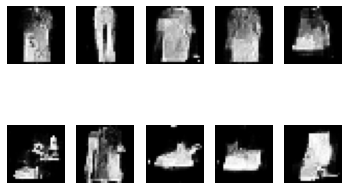

19401 [D loss: 0.700029, acc.: 50.00%] [G loss: 0.696294]
19402 [D loss: 0.706349, acc.: 40.23%] [G loss: 0.695303]
19403 [D loss: 0.697038, acc.: 43.75%] [G loss: 0.696706]
19404 [D loss: 0.699684, acc.: 44.53%] [G loss: 0.699053]
19405 [D loss: 0.703417, acc.: 44.53%] [G loss: 0.694775]
19406 [D loss: 0.700919, acc.: 46.09%] [G loss: 0.717785]
19407 [D loss: 0.691305, acc.: 51.95%] [G loss: 0.713942]
19408 [D loss: 0.697343, acc.: 45.31%] [G loss: 0.721029]
19409 [D loss: 0.690681, acc.: 45.70%] [G loss: 0.732244]
19410 [D loss: 0.693192, acc.: 51.56%] [G loss: 0.729857]
19411 [D loss: 0.700184, acc.: 40.23%] [G loss: 0.720495]
19412 [D loss: 0.693884, acc.: 46.48%] [G loss: 0.740762]
19413 [D loss: 0.694046, acc.: 45.70%] [G loss: 0.722883]
19414 [D loss: 0.676395, acc.: 54.69%] [G loss: 0.749995]
19415 [D loss: 0.685984, acc.: 51.56%] [G loss: 0.761142]
19416 [D loss: 0.691728, acc.: 48.83%] [G loss: 0.729914]
19417 [D loss: 0.686774, acc.: 50.78%] [G loss: 0.763338]
19418 [D loss:

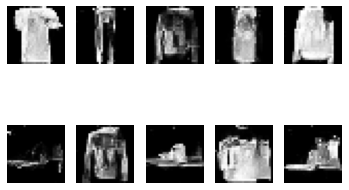

19601 [D loss: 0.685443, acc.: 59.38%] [G loss: 0.726665]
19602 [D loss: 0.690337, acc.: 58.59%] [G loss: 0.715196]
19603 [D loss: 0.682924, acc.: 62.50%] [G loss: 0.724545]
19604 [D loss: 0.679881, acc.: 62.50%] [G loss: 0.718410]
19605 [D loss: 0.687403, acc.: 57.42%] [G loss: 0.722271]
19606 [D loss: 0.685320, acc.: 62.50%] [G loss: 0.724522]
19607 [D loss: 0.693215, acc.: 55.47%] [G loss: 0.724829]
19608 [D loss: 0.690007, acc.: 59.38%] [G loss: 0.723927]
19609 [D loss: 0.691706, acc.: 57.81%] [G loss: 0.710370]
19610 [D loss: 0.687549, acc.: 60.55%] [G loss: 0.730100]
19611 [D loss: 0.685625, acc.: 61.72%] [G loss: 0.731442]
19612 [D loss: 0.690082, acc.: 57.03%] [G loss: 0.716071]
19613 [D loss: 0.692294, acc.: 54.30%] [G loss: 0.727854]
19614 [D loss: 0.690260, acc.: 54.30%] [G loss: 0.723527]
19615 [D loss: 0.700170, acc.: 45.31%] [G loss: 0.712754]
19616 [D loss: 0.685199, acc.: 53.12%] [G loss: 0.718678]
19617 [D loss: 0.691870, acc.: 53.91%] [G loss: 0.708582]
19618 [D loss:

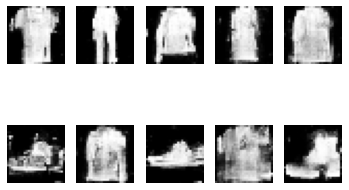

19801 [D loss: 0.734717, acc.: 30.86%] [G loss: 0.631927]
19802 [D loss: 0.734531, acc.: 33.59%] [G loss: 0.640493]
19803 [D loss: 0.739565, acc.: 31.25%] [G loss: 0.640617]
19804 [D loss: 0.736978, acc.: 31.25%] [G loss: 0.664226]
19805 [D loss: 0.726055, acc.: 32.42%] [G loss: 0.674291]
19806 [D loss: 0.711882, acc.: 30.86%] [G loss: 0.718960]
19807 [D loss: 0.697871, acc.: 52.73%] [G loss: 0.736556]
19808 [D loss: 0.688876, acc.: 50.78%] [G loss: 0.780362]
19809 [D loss: 0.669709, acc.: 51.95%] [G loss: 0.768584]
19810 [D loss: 0.665214, acc.: 58.20%] [G loss: 0.825491]
19811 [D loss: 0.661800, acc.: 60.94%] [G loss: 0.823736]
19812 [D loss: 0.646420, acc.: 62.50%] [G loss: 0.855498]
19813 [D loss: 0.646425, acc.: 65.23%] [G loss: 0.867349]
19814 [D loss: 0.627557, acc.: 65.23%] [G loss: 0.874654]
19815 [D loss: 0.644685, acc.: 66.02%] [G loss: 0.886900]
19816 [D loss: 0.645954, acc.: 64.84%] [G loss: 0.846451]
19817 [D loss: 0.669785, acc.: 62.11%] [G loss: 0.799205]
19818 [D loss:

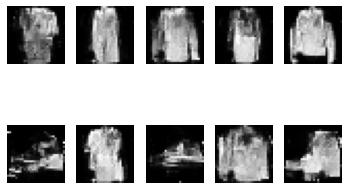

20001 [D loss: 0.686618, acc.: 55.08%] [G loss: 0.731992]
20002 [D loss: 0.683667, acc.: 56.64%] [G loss: 0.731198]
20003 [D loss: 0.685978, acc.: 53.52%] [G loss: 0.716418]
20004 [D loss: 0.696821, acc.: 47.66%] [G loss: 0.723104]
20005 [D loss: 0.686139, acc.: 52.73%] [G loss: 0.721051]
20006 [D loss: 0.696410, acc.: 47.66%] [G loss: 0.717281]
20007 [D loss: 0.684888, acc.: 47.66%] [G loss: 0.715837]
20008 [D loss: 0.690661, acc.: 48.44%] [G loss: 0.708761]
20009 [D loss: 0.695177, acc.: 46.09%] [G loss: 0.704901]
20010 [D loss: 0.690267, acc.: 51.17%] [G loss: 0.688390]
20011 [D loss: 0.699937, acc.: 45.31%] [G loss: 0.688196]
20012 [D loss: 0.701464, acc.: 46.09%] [G loss: 0.688549]
20013 [D loss: 0.689710, acc.: 48.05%] [G loss: 0.688548]
20014 [D loss: 0.697855, acc.: 43.75%] [G loss: 0.689688]
20015 [D loss: 0.688631, acc.: 50.00%] [G loss: 0.698162]
20016 [D loss: 0.696821, acc.: 42.58%] [G loss: 0.695038]
20017 [D loss: 0.696822, acc.: 43.75%] [G loss: 0.697795]
20018 [D loss:

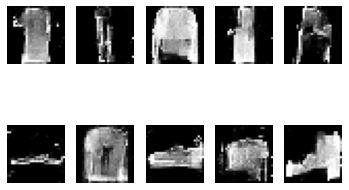

20201 [D loss: 0.668832, acc.: 59.38%] [G loss: 0.777406]
20202 [D loss: 0.667880, acc.: 57.03%] [G loss: 0.801183]
20203 [D loss: 0.690610, acc.: 52.34%] [G loss: 0.798947]
20204 [D loss: 0.674503, acc.: 59.38%] [G loss: 0.778859]
20205 [D loss: 0.684096, acc.: 56.64%] [G loss: 0.795871]
20206 [D loss: 0.661587, acc.: 61.33%] [G loss: 0.791026]
20207 [D loss: 0.670972, acc.: 59.77%] [G loss: 0.778319]
20208 [D loss: 0.691923, acc.: 52.73%] [G loss: 0.789855]
20209 [D loss: 0.673659, acc.: 57.42%] [G loss: 0.786042]
20210 [D loss: 0.695619, acc.: 55.08%] [G loss: 0.748363]
20211 [D loss: 0.682032, acc.: 53.91%] [G loss: 0.771629]
20212 [D loss: 0.680662, acc.: 53.12%] [G loss: 0.762289]
20213 [D loss: 0.680361, acc.: 52.73%] [G loss: 0.777719]
20214 [D loss: 0.677615, acc.: 54.30%] [G loss: 0.772206]
20215 [D loss: 0.656511, acc.: 55.86%] [G loss: 0.761655]
20216 [D loss: 0.671286, acc.: 50.39%] [G loss: 0.781685]
20217 [D loss: 0.658441, acc.: 57.03%] [G loss: 0.786767]
20218 [D loss:

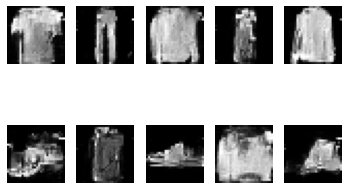

20401 [D loss: 0.723259, acc.: 36.33%] [G loss: 0.662752]
20402 [D loss: 0.713350, acc.: 39.06%] [G loss: 0.674433]
20403 [D loss: 0.720464, acc.: 35.55%] [G loss: 0.670166]
20404 [D loss: 0.714129, acc.: 41.41%] [G loss: 0.677994]
20405 [D loss: 0.715907, acc.: 37.50%] [G loss: 0.686043]
20406 [D loss: 0.718502, acc.: 34.77%] [G loss: 0.672483]
20407 [D loss: 0.702468, acc.: 45.31%] [G loss: 0.670509]
20408 [D loss: 0.714652, acc.: 37.89%] [G loss: 0.670925]
20409 [D loss: 0.715417, acc.: 36.33%] [G loss: 0.677064]
20410 [D loss: 0.714282, acc.: 36.33%] [G loss: 0.678757]
20411 [D loss: 0.702850, acc.: 42.97%] [G loss: 0.677972]
20412 [D loss: 0.706647, acc.: 42.19%] [G loss: 0.680544]
20413 [D loss: 0.717883, acc.: 37.89%] [G loss: 0.673461]
20414 [D loss: 0.710578, acc.: 39.45%] [G loss: 0.683154]
20415 [D loss: 0.706070, acc.: 42.58%] [G loss: 0.682796]
20416 [D loss: 0.701776, acc.: 39.45%] [G loss: 0.678632]
20417 [D loss: 0.704456, acc.: 38.67%] [G loss: 0.695776]
20418 [D loss:

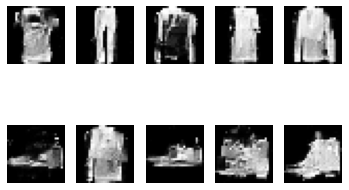

20601 [D loss: 0.691211, acc.: 44.53%] [G loss: 0.721794]
20602 [D loss: 0.689644, acc.: 46.09%] [G loss: 0.726523]
20603 [D loss: 0.685719, acc.: 50.78%] [G loss: 0.721567]
20604 [D loss: 0.695220, acc.: 48.05%] [G loss: 0.718604]
20605 [D loss: 0.697729, acc.: 46.48%] [G loss: 0.722264]
20606 [D loss: 0.697476, acc.: 49.22%] [G loss: 0.720454]
20607 [D loss: 0.694873, acc.: 52.34%] [G loss: 0.712872]
20608 [D loss: 0.696262, acc.: 51.56%] [G loss: 0.713660]
20609 [D loss: 0.699598, acc.: 47.27%] [G loss: 0.720529]
20610 [D loss: 0.713530, acc.: 40.62%] [G loss: 0.722400]
20611 [D loss: 0.717713, acc.: 43.36%] [G loss: 0.702240]
20612 [D loss: 0.718459, acc.: 42.97%] [G loss: 0.713408]
20613 [D loss: 0.718397, acc.: 38.28%] [G loss: 0.697353]
20614 [D loss: 0.714603, acc.: 40.23%] [G loss: 0.691861]
20615 [D loss: 0.703083, acc.: 44.53%] [G loss: 0.689581]
20616 [D loss: 0.715851, acc.: 40.62%] [G loss: 0.708702]
20617 [D loss: 0.713123, acc.: 39.06%] [G loss: 0.713144]
20618 [D loss:

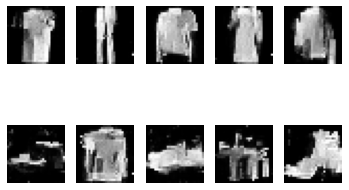

20801 [D loss: 0.655953, acc.: 64.06%] [G loss: 0.779211]
20802 [D loss: 0.651852, acc.: 64.84%] [G loss: 0.783906]
20803 [D loss: 0.634575, acc.: 69.53%] [G loss: 0.789052]
20804 [D loss: 0.656277, acc.: 64.06%] [G loss: 0.769666]
20805 [D loss: 0.655564, acc.: 64.84%] [G loss: 0.776990]
20806 [D loss: 0.648235, acc.: 64.06%] [G loss: 0.764875]
20807 [D loss: 0.665490, acc.: 60.55%] [G loss: 0.767514]
20808 [D loss: 0.667457, acc.: 55.86%] [G loss: 0.776510]
20809 [D loss: 0.674998, acc.: 55.08%] [G loss: 0.743591]
20810 [D loss: 0.690386, acc.: 50.39%] [G loss: 0.740842]
20811 [D loss: 0.687134, acc.: 49.61%] [G loss: 0.740655]
20812 [D loss: 0.707981, acc.: 41.02%] [G loss: 0.728736]
20813 [D loss: 0.699738, acc.: 42.19%] [G loss: 0.766060]
20814 [D loss: 0.690139, acc.: 44.92%] [G loss: 0.780496]
20815 [D loss: 0.672121, acc.: 51.17%] [G loss: 0.781409]
20816 [D loss: 0.680394, acc.: 50.00%] [G loss: 0.760266]
20817 [D loss: 0.680723, acc.: 48.05%] [G loss: 0.771332]
20818 [D loss:

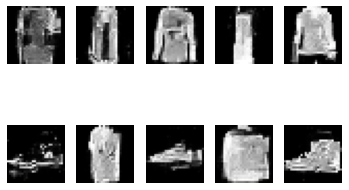

21001 [D loss: 0.688435, acc.: 55.08%] [G loss: 0.716877]
21002 [D loss: 0.682784, acc.: 55.86%] [G loss: 0.716040]
21003 [D loss: 0.688968, acc.: 56.64%] [G loss: 0.714115]
21004 [D loss: 0.694486, acc.: 54.69%] [G loss: 0.728922]
21005 [D loss: 0.688598, acc.: 55.86%] [G loss: 0.711461]
21006 [D loss: 0.683178, acc.: 58.59%] [G loss: 0.711106]
21007 [D loss: 0.691818, acc.: 53.52%] [G loss: 0.713190]
21008 [D loss: 0.692671, acc.: 51.56%] [G loss: 0.711272]
21009 [D loss: 0.683731, acc.: 53.12%] [G loss: 0.712393]
21010 [D loss: 0.702418, acc.: 46.48%] [G loss: 0.727642]
21011 [D loss: 0.697557, acc.: 49.22%] [G loss: 0.713153]
21012 [D loss: 0.693872, acc.: 49.61%] [G loss: 0.699350]
21013 [D loss: 0.690193, acc.: 50.39%] [G loss: 0.702620]
21014 [D loss: 0.693967, acc.: 48.05%] [G loss: 0.702529]
21015 [D loss: 0.696639, acc.: 51.17%] [G loss: 0.690107]
21016 [D loss: 0.717047, acc.: 44.53%] [G loss: 0.683325]
21017 [D loss: 0.704921, acc.: 46.48%] [G loss: 0.689206]
21018 [D loss:

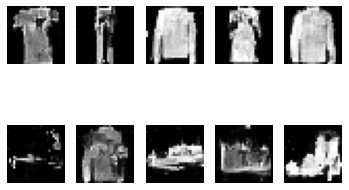

21201 [D loss: 0.718905, acc.: 35.55%] [G loss: 0.701077]
21202 [D loss: 0.714137, acc.: 37.11%] [G loss: 0.699433]
21203 [D loss: 0.719366, acc.: 32.03%] [G loss: 0.695407]
21204 [D loss: 0.721565, acc.: 29.30%] [G loss: 0.704892]
21205 [D loss: 0.733132, acc.: 31.64%] [G loss: 0.696205]
21206 [D loss: 0.713817, acc.: 32.81%] [G loss: 0.704276]
21207 [D loss: 0.718262, acc.: 33.59%] [G loss: 0.708426]
21208 [D loss: 0.726245, acc.: 37.11%] [G loss: 0.704154]
21209 [D loss: 0.719732, acc.: 33.20%] [G loss: 0.703571]
21210 [D loss: 0.721564, acc.: 31.64%] [G loss: 0.704690]
21211 [D loss: 0.720908, acc.: 35.55%] [G loss: 0.706834]
21212 [D loss: 0.722284, acc.: 30.86%] [G loss: 0.709095]
21213 [D loss: 0.717935, acc.: 34.77%] [G loss: 0.702023]
21214 [D loss: 0.715769, acc.: 36.72%] [G loss: 0.708006]
21215 [D loss: 0.713470, acc.: 38.67%] [G loss: 0.703295]
21216 [D loss: 0.707742, acc.: 39.45%] [G loss: 0.707870]
21217 [D loss: 0.718157, acc.: 34.77%] [G loss: 0.718368]
21218 [D loss:

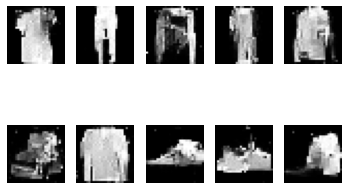

21401 [D loss: 0.673564, acc.: 55.08%] [G loss: 0.747715]
21402 [D loss: 0.677144, acc.: 48.83%] [G loss: 0.745099]
21403 [D loss: 0.672106, acc.: 53.91%] [G loss: 0.746139]
21404 [D loss: 0.676938, acc.: 50.00%] [G loss: 0.732150]
21405 [D loss: 0.680018, acc.: 51.17%] [G loss: 0.752225]
21406 [D loss: 0.683202, acc.: 47.66%] [G loss: 0.748428]
21407 [D loss: 0.676417, acc.: 54.69%] [G loss: 0.739585]
21408 [D loss: 0.682005, acc.: 53.12%] [G loss: 0.726010]
21409 [D loss: 0.668798, acc.: 55.86%] [G loss: 0.748635]
21410 [D loss: 0.672118, acc.: 57.42%] [G loss: 0.749446]
21411 [D loss: 0.677474, acc.: 51.56%] [G loss: 0.746300]
21412 [D loss: 0.675859, acc.: 53.52%] [G loss: 0.745378]
21413 [D loss: 0.675115, acc.: 57.42%] [G loss: 0.738092]
21414 [D loss: 0.657430, acc.: 62.50%] [G loss: 0.765622]
21415 [D loss: 0.677401, acc.: 57.42%] [G loss: 0.767425]
21416 [D loss: 0.674227, acc.: 58.20%] [G loss: 0.767286]
21417 [D loss: 0.675314, acc.: 56.25%] [G loss: 0.753988]
21418 [D loss:

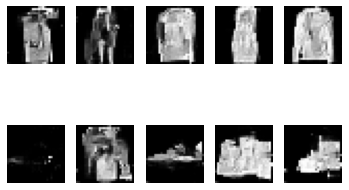

21601 [D loss: 0.683082, acc.: 60.94%] [G loss: 0.737038]
21602 [D loss: 0.668968, acc.: 64.06%] [G loss: 0.744880]
21603 [D loss: 0.678659, acc.: 59.38%] [G loss: 0.755658]
21604 [D loss: 0.680715, acc.: 56.64%] [G loss: 0.746705]
21605 [D loss: 0.667888, acc.: 66.80%] [G loss: 0.742845]
21606 [D loss: 0.673550, acc.: 63.28%] [G loss: 0.755690]
21607 [D loss: 0.685753, acc.: 58.59%] [G loss: 0.759963]
21608 [D loss: 0.677179, acc.: 57.03%] [G loss: 0.768439]
21609 [D loss: 0.673349, acc.: 59.77%] [G loss: 0.758939]
21610 [D loss: 0.664577, acc.: 64.84%] [G loss: 0.766330]
21611 [D loss: 0.668844, acc.: 62.50%] [G loss: 0.775305]
21612 [D loss: 0.672137, acc.: 60.55%] [G loss: 0.769442]
21613 [D loss: 0.662267, acc.: 68.75%] [G loss: 0.763026]
21614 [D loss: 0.678493, acc.: 62.89%] [G loss: 0.772282]
21615 [D loss: 0.667410, acc.: 67.58%] [G loss: 0.772983]
21616 [D loss: 0.658789, acc.: 69.53%] [G loss: 0.779284]
21617 [D loss: 0.662981, acc.: 70.70%] [G loss: 0.781291]
21618 [D loss:

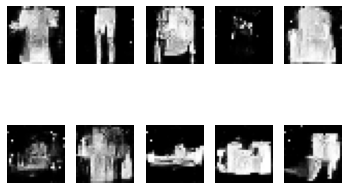

21801 [D loss: 0.658250, acc.: 52.34%] [G loss: 0.808631]
21802 [D loss: 0.667144, acc.: 55.86%] [G loss: 0.826851]
21803 [D loss: 0.656838, acc.: 54.69%] [G loss: 0.822407]
21804 [D loss: 0.639481, acc.: 59.38%] [G loss: 0.817246]
21805 [D loss: 0.648363, acc.: 51.95%] [G loss: 0.801027]
21806 [D loss: 0.632119, acc.: 55.86%] [G loss: 0.851741]
21807 [D loss: 0.673243, acc.: 45.70%] [G loss: 0.867796]
21808 [D loss: 0.639743, acc.: 54.69%] [G loss: 0.811651]
21809 [D loss: 0.634833, acc.: 55.86%] [G loss: 0.879455]
21810 [D loss: 0.670839, acc.: 47.66%] [G loss: 0.809057]
21811 [D loss: 0.647931, acc.: 57.42%] [G loss: 0.840395]
21812 [D loss: 0.666263, acc.: 50.78%] [G loss: 0.817180]
21813 [D loss: 0.649534, acc.: 54.30%] [G loss: 0.813622]
21814 [D loss: 0.658560, acc.: 48.83%] [G loss: 0.818114]
21815 [D loss: 0.653776, acc.: 55.47%] [G loss: 0.764885]
21816 [D loss: 0.704768, acc.: 48.44%] [G loss: 0.790967]
21817 [D loss: 0.670787, acc.: 54.30%] [G loss: 0.741882]
21818 [D loss:

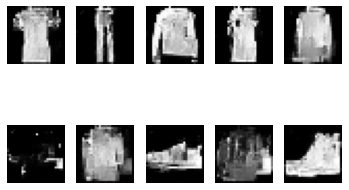

22001 [D loss: 0.714856, acc.: 36.72%] [G loss: 0.716493]
22002 [D loss: 0.719342, acc.: 36.33%] [G loss: 0.703590]
22003 [D loss: 0.716460, acc.: 38.67%] [G loss: 0.700417]
22004 [D loss: 0.716050, acc.: 39.45%] [G loss: 0.699378]
22005 [D loss: 0.717568, acc.: 33.98%] [G loss: 0.702889]
22006 [D loss: 0.704565, acc.: 50.00%] [G loss: 0.706163]
22007 [D loss: 0.705341, acc.: 46.48%] [G loss: 0.710308]
22008 [D loss: 0.718621, acc.: 40.62%] [G loss: 0.706998]
22009 [D loss: 0.708493, acc.: 41.41%] [G loss: 0.695838]
22010 [D loss: 0.707593, acc.: 49.61%] [G loss: 0.707078]
22011 [D loss: 0.711932, acc.: 41.80%] [G loss: 0.709160]
22012 [D loss: 0.702069, acc.: 47.66%] [G loss: 0.729079]
22013 [D loss: 0.708387, acc.: 43.75%] [G loss: 0.721538]
22014 [D loss: 0.690645, acc.: 55.08%] [G loss: 0.718897]
22015 [D loss: 0.704060, acc.: 47.66%] [G loss: 0.720158]
22016 [D loss: 0.692306, acc.: 52.73%] [G loss: 0.725114]
22017 [D loss: 0.700045, acc.: 48.83%] [G loss: 0.726154]
22018 [D loss:

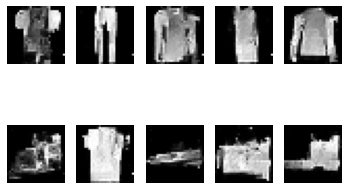

22201 [D loss: 0.699809, acc.: 50.78%] [G loss: 0.756516]
22202 [D loss: 0.705948, acc.: 46.88%] [G loss: 0.725626]
22203 [D loss: 0.692022, acc.: 52.73%] [G loss: 0.730292]
22204 [D loss: 0.694379, acc.: 50.78%] [G loss: 0.748261]
22205 [D loss: 0.697039, acc.: 51.95%] [G loss: 0.751316]
22206 [D loss: 0.688455, acc.: 57.81%] [G loss: 0.747109]
22207 [D loss: 0.683385, acc.: 58.59%] [G loss: 0.743684]
22208 [D loss: 0.680197, acc.: 57.81%] [G loss: 0.765537]
22209 [D loss: 0.692632, acc.: 58.59%] [G loss: 0.753679]
22210 [D loss: 0.697511, acc.: 59.38%] [G loss: 0.742789]
22211 [D loss: 0.689610, acc.: 58.59%] [G loss: 0.739002]
22212 [D loss: 0.693831, acc.: 57.81%] [G loss: 0.737130]
22213 [D loss: 0.679600, acc.: 62.50%] [G loss: 0.759829]
22214 [D loss: 0.681370, acc.: 61.72%] [G loss: 0.743541]
22215 [D loss: 0.679641, acc.: 64.06%] [G loss: 0.743505]
22216 [D loss: 0.681010, acc.: 64.06%] [G loss: 0.750002]
22217 [D loss: 0.671840, acc.: 64.84%] [G loss: 0.755486]
22218 [D loss:

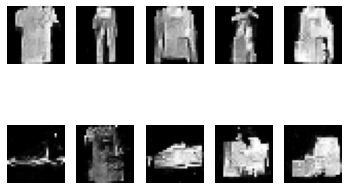

22401 [D loss: 0.688165, acc.: 51.95%] [G loss: 0.728114]
22402 [D loss: 0.684511, acc.: 58.59%] [G loss: 0.732704]
22403 [D loss: 0.691596, acc.: 55.47%] [G loss: 0.734026]
22404 [D loss: 0.683307, acc.: 54.69%] [G loss: 0.732406]
22405 [D loss: 0.678672, acc.: 58.59%] [G loss: 0.735561]
22406 [D loss: 0.691751, acc.: 52.34%] [G loss: 0.732318]
22407 [D loss: 0.679322, acc.: 53.52%] [G loss: 0.741674]
22408 [D loss: 0.690474, acc.: 51.56%] [G loss: 0.737132]
22409 [D loss: 0.693289, acc.: 50.39%] [G loss: 0.729180]
22410 [D loss: 0.695395, acc.: 52.34%] [G loss: 0.729390]
22411 [D loss: 0.695229, acc.: 48.05%] [G loss: 0.728013]
22412 [D loss: 0.681132, acc.: 55.08%] [G loss: 0.718356]
22413 [D loss: 0.698178, acc.: 41.41%] [G loss: 0.724544]
22414 [D loss: 0.698142, acc.: 44.53%] [G loss: 0.720508]
22415 [D loss: 0.682912, acc.: 44.92%] [G loss: 0.721063]
22416 [D loss: 0.692959, acc.: 50.78%] [G loss: 0.719617]
22417 [D loss: 0.687156, acc.: 49.22%] [G loss: 0.716980]
22418 [D loss:

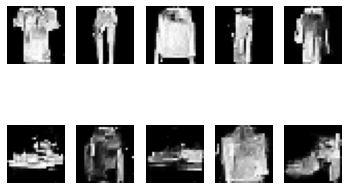

22601 [D loss: 0.670842, acc.: 58.98%] [G loss: 0.757806]
22602 [D loss: 0.680177, acc.: 56.25%] [G loss: 0.773100]
22603 [D loss: 0.672814, acc.: 59.38%] [G loss: 0.757925]
22604 [D loss: 0.684318, acc.: 54.69%] [G loss: 0.735283]
22605 [D loss: 0.685930, acc.: 53.91%] [G loss: 0.743450]
22606 [D loss: 0.682220, acc.: 53.52%] [G loss: 0.742585]
22607 [D loss: 0.685638, acc.: 54.69%] [G loss: 0.740077]
22608 [D loss: 0.685867, acc.: 53.52%] [G loss: 0.744855]
22609 [D loss: 0.691640, acc.: 52.34%] [G loss: 0.750603]
22610 [D loss: 0.671996, acc.: 54.69%] [G loss: 0.749448]
22611 [D loss: 0.684696, acc.: 46.88%] [G loss: 0.759895]
22612 [D loss: 0.694873, acc.: 47.66%] [G loss: 0.760528]
22613 [D loss: 0.687121, acc.: 52.73%] [G loss: 0.739583]
22614 [D loss: 0.689750, acc.: 50.78%] [G loss: 0.748771]
22615 [D loss: 0.673137, acc.: 58.98%] [G loss: 0.738384]
22616 [D loss: 0.680290, acc.: 56.25%] [G loss: 0.739788]
22617 [D loss: 0.668423, acc.: 59.77%] [G loss: 0.756989]
22618 [D loss:

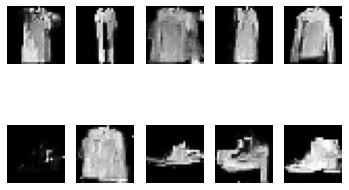

22801 [D loss: 0.696241, acc.: 44.53%] [G loss: 0.712323]
22802 [D loss: 0.706332, acc.: 46.09%] [G loss: 0.728876]
22803 [D loss: 0.697374, acc.: 50.39%] [G loss: 0.710228]
22804 [D loss: 0.708283, acc.: 45.70%] [G loss: 0.715901]
22805 [D loss: 0.706974, acc.: 44.53%] [G loss: 0.715509]
22806 [D loss: 0.710427, acc.: 42.97%] [G loss: 0.724803]
22807 [D loss: 0.696992, acc.: 45.70%] [G loss: 0.729676]
22808 [D loss: 0.711110, acc.: 45.70%] [G loss: 0.727469]
22809 [D loss: 0.706606, acc.: 44.92%] [G loss: 0.711076]
22810 [D loss: 0.711470, acc.: 44.53%] [G loss: 0.723585]
22811 [D loss: 0.710643, acc.: 47.27%] [G loss: 0.718359]
22812 [D loss: 0.699736, acc.: 49.61%] [G loss: 0.720766]
22813 [D loss: 0.706772, acc.: 46.48%] [G loss: 0.718182]
22814 [D loss: 0.716270, acc.: 42.97%] [G loss: 0.737053]
22815 [D loss: 0.710406, acc.: 44.92%] [G loss: 0.713360]
22816 [D loss: 0.712104, acc.: 42.97%] [G loss: 0.722219]
22817 [D loss: 0.704560, acc.: 43.75%] [G loss: 0.738675]
22818 [D loss:

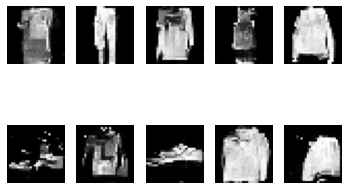

23001 [D loss: 0.663037, acc.: 59.77%] [G loss: 0.759286]
23002 [D loss: 0.667779, acc.: 56.64%] [G loss: 0.760946]
23003 [D loss: 0.669318, acc.: 58.20%] [G loss: 0.760333]
23004 [D loss: 0.667818, acc.: 58.20%] [G loss: 0.771781]
23005 [D loss: 0.673623, acc.: 53.91%] [G loss: 0.755215]
23006 [D loss: 0.674016, acc.: 52.34%] [G loss: 0.750679]
23007 [D loss: 0.664802, acc.: 59.77%] [G loss: 0.770220]
23008 [D loss: 0.663074, acc.: 58.20%] [G loss: 0.781423]
23009 [D loss: 0.655415, acc.: 60.94%] [G loss: 0.767009]
23010 [D loss: 0.667028, acc.: 58.20%] [G loss: 0.778877]
23011 [D loss: 0.660677, acc.: 64.06%] [G loss: 0.790272]
23012 [D loss: 0.672518, acc.: 58.20%] [G loss: 0.777128]
23013 [D loss: 0.663842, acc.: 58.59%] [G loss: 0.764592]
23014 [D loss: 0.659780, acc.: 62.89%] [G loss: 0.763957]
23015 [D loss: 0.671810, acc.: 59.77%] [G loss: 0.763032]
23016 [D loss: 0.668873, acc.: 58.59%] [G loss: 0.757799]
23017 [D loss: 0.672591, acc.: 61.33%] [G loss: 0.758900]
23018 [D loss:

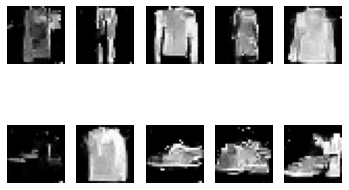

23201 [D loss: 0.669701, acc.: 64.84%] [G loss: 0.777204]
23202 [D loss: 0.680144, acc.: 60.55%] [G loss: 0.765614]
23203 [D loss: 0.675245, acc.: 58.98%] [G loss: 0.770720]
23204 [D loss: 0.687329, acc.: 57.03%] [G loss: 0.759479]
23205 [D loss: 0.687421, acc.: 54.69%] [G loss: 0.768249]
23206 [D loss: 0.674089, acc.: 58.59%] [G loss: 0.750262]
23207 [D loss: 0.674449, acc.: 59.77%] [G loss: 0.764001]
23208 [D loss: 0.673368, acc.: 57.81%] [G loss: 0.758720]
23209 [D loss: 0.694471, acc.: 53.12%] [G loss: 0.760970]
23210 [D loss: 0.684296, acc.: 52.73%] [G loss: 0.747015]
23211 [D loss: 0.698284, acc.: 53.52%] [G loss: 0.741177]
23212 [D loss: 0.677474, acc.: 56.25%] [G loss: 0.748833]
23213 [D loss: 0.687521, acc.: 48.44%] [G loss: 0.745118]
23214 [D loss: 0.711276, acc.: 42.58%] [G loss: 0.746878]
23215 [D loss: 0.706041, acc.: 42.19%] [G loss: 0.729516]
23216 [D loss: 0.706762, acc.: 41.02%] [G loss: 0.740252]
23217 [D loss: 0.705857, acc.: 43.36%] [G loss: 0.731528]
23218 [D loss:

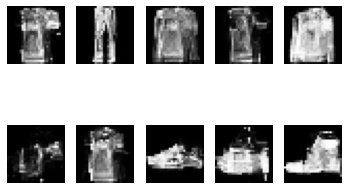

23401 [D loss: 0.743723, acc.: 35.94%] [G loss: 0.751912]
23402 [D loss: 0.705851, acc.: 45.70%] [G loss: 0.731156]
23403 [D loss: 0.734513, acc.: 44.14%] [G loss: 0.720626]
23404 [D loss: 0.720548, acc.: 47.27%] [G loss: 0.710724]
23405 [D loss: 0.715366, acc.: 52.73%] [G loss: 0.738446]
23406 [D loss: 0.716926, acc.: 47.27%] [G loss: 0.728006]
23407 [D loss: 0.723096, acc.: 47.66%] [G loss: 0.733398]
23408 [D loss: 0.733640, acc.: 39.45%] [G loss: 0.741452]
23409 [D loss: 0.703201, acc.: 48.83%] [G loss: 0.733758]
23410 [D loss: 0.709348, acc.: 42.58%] [G loss: 0.733276]
23411 [D loss: 0.702816, acc.: 47.66%] [G loss: 0.728569]
23412 [D loss: 0.708186, acc.: 45.31%] [G loss: 0.753769]
23413 [D loss: 0.687436, acc.: 48.05%] [G loss: 0.741441]
23414 [D loss: 0.685358, acc.: 51.95%] [G loss: 0.762001]
23415 [D loss: 0.705645, acc.: 50.00%] [G loss: 0.740062]
23416 [D loss: 0.700597, acc.: 54.30%] [G loss: 0.758067]
23417 [D loss: 0.708356, acc.: 47.66%] [G loss: 0.752863]
23418 [D loss:

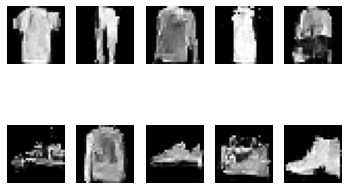

23601 [D loss: 0.680843, acc.: 59.38%] [G loss: 0.754938]
23602 [D loss: 0.672660, acc.: 59.77%] [G loss: 0.731526]
23603 [D loss: 0.681007, acc.: 57.03%] [G loss: 0.735074]
23604 [D loss: 0.689660, acc.: 55.08%] [G loss: 0.722463]
23605 [D loss: 0.701281, acc.: 47.27%] [G loss: 0.732483]
23606 [D loss: 0.692193, acc.: 53.91%] [G loss: 0.730151]
23607 [D loss: 0.684709, acc.: 53.91%] [G loss: 0.726600]
23608 [D loss: 0.689714, acc.: 57.42%] [G loss: 0.736690]
23609 [D loss: 0.681545, acc.: 54.30%] [G loss: 0.730629]
23610 [D loss: 0.682461, acc.: 59.77%] [G loss: 0.713267]
23611 [D loss: 0.678611, acc.: 58.20%] [G loss: 0.729301]
23612 [D loss: 0.689543, acc.: 56.64%] [G loss: 0.725795]
23613 [D loss: 0.695123, acc.: 55.08%] [G loss: 0.728153]
23614 [D loss: 0.697926, acc.: 48.83%] [G loss: 0.734327]
23615 [D loss: 0.696780, acc.: 49.22%] [G loss: 0.718105]
23616 [D loss: 0.702164, acc.: 46.09%] [G loss: 0.719142]
23617 [D loss: 0.703046, acc.: 45.70%] [G loss: 0.721816]
23618 [D loss:

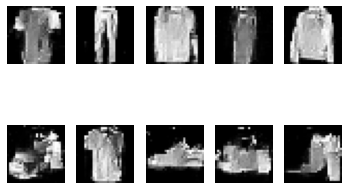

23801 [D loss: 0.707240, acc.: 51.56%] [G loss: 0.707305]
23802 [D loss: 0.709281, acc.: 54.30%] [G loss: 0.712742]
23803 [D loss: 0.703695, acc.: 55.86%] [G loss: 0.709992]
23804 [D loss: 0.718300, acc.: 48.83%] [G loss: 0.701212]
23805 [D loss: 0.701161, acc.: 50.78%] [G loss: 0.718043]
23806 [D loss: 0.718699, acc.: 44.14%] [G loss: 0.693986]
23807 [D loss: 0.708090, acc.: 44.53%] [G loss: 0.718588]
23808 [D loss: 0.695562, acc.: 42.19%] [G loss: 0.705768]
23809 [D loss: 0.721069, acc.: 35.16%] [G loss: 0.707598]
23810 [D loss: 0.729767, acc.: 32.81%] [G loss: 0.698012]
23811 [D loss: 0.709595, acc.: 41.80%] [G loss: 0.692423]
23812 [D loss: 0.704189, acc.: 42.19%] [G loss: 0.696171]
23813 [D loss: 0.709990, acc.: 44.53%] [G loss: 0.694940]
23814 [D loss: 0.698471, acc.: 47.66%] [G loss: 0.693135]
23815 [D loss: 0.704610, acc.: 50.00%] [G loss: 0.678932]
23816 [D loss: 0.702755, acc.: 47.27%] [G loss: 0.681809]
23817 [D loss: 0.708599, acc.: 49.22%] [G loss: 0.682403]
23818 [D loss:

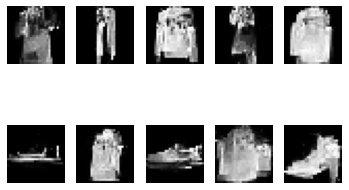

24001 [D loss: 0.696756, acc.: 49.22%] [G loss: 0.738802]
24002 [D loss: 0.692473, acc.: 51.56%] [G loss: 0.732401]
24003 [D loss: 0.704673, acc.: 48.44%] [G loss: 0.723240]
24004 [D loss: 0.697763, acc.: 53.12%] [G loss: 0.719420]
24005 [D loss: 0.693206, acc.: 55.08%] [G loss: 0.724142]
24006 [D loss: 0.696823, acc.: 52.73%] [G loss: 0.721621]
24007 [D loss: 0.689227, acc.: 55.08%] [G loss: 0.731498]
24008 [D loss: 0.699971, acc.: 52.73%] [G loss: 0.743156]
24009 [D loss: 0.694410, acc.: 55.47%] [G loss: 0.728195]
24010 [D loss: 0.704055, acc.: 53.52%] [G loss: 0.723335]
24011 [D loss: 0.697501, acc.: 55.47%] [G loss: 0.733949]
24012 [D loss: 0.693867, acc.: 56.64%] [G loss: 0.722682]
24013 [D loss: 0.678810, acc.: 62.89%] [G loss: 0.730128]
24014 [D loss: 0.691069, acc.: 57.81%] [G loss: 0.735013]
24015 [D loss: 0.693067, acc.: 54.69%] [G loss: 0.744826]
24016 [D loss: 0.696095, acc.: 50.78%] [G loss: 0.724264]
24017 [D loss: 0.690203, acc.: 56.64%] [G loss: 0.742544]
24018 [D loss:

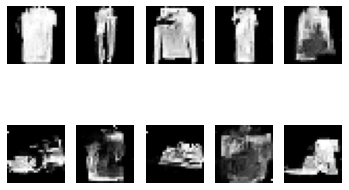

24201 [D loss: 0.677344, acc.: 55.47%] [G loss: 0.762475]
24202 [D loss: 0.679746, acc.: 49.22%] [G loss: 0.749935]
24203 [D loss: 0.678163, acc.: 57.81%] [G loss: 0.752596]
24204 [D loss: 0.679035, acc.: 57.03%] [G loss: 0.762592]
24205 [D loss: 0.683273, acc.: 50.39%] [G loss: 0.763317]
24206 [D loss: 0.664426, acc.: 62.89%] [G loss: 0.771609]
24207 [D loss: 0.678655, acc.: 59.77%] [G loss: 0.774468]
24208 [D loss: 0.666554, acc.: 58.98%] [G loss: 0.768619]
24209 [D loss: 0.663931, acc.: 60.55%] [G loss: 0.776417]
24210 [D loss: 0.663572, acc.: 62.89%] [G loss: 0.787842]
24211 [D loss: 0.665488, acc.: 61.72%] [G loss: 0.770022]
24212 [D loss: 0.653394, acc.: 61.33%] [G loss: 0.782614]
24213 [D loss: 0.654169, acc.: 71.09%] [G loss: 0.779325]
24214 [D loss: 0.643280, acc.: 71.09%] [G loss: 0.810730]
24215 [D loss: 0.655399, acc.: 66.41%] [G loss: 0.798143]
24216 [D loss: 0.649725, acc.: 67.19%] [G loss: 0.799727]
24217 [D loss: 0.668555, acc.: 61.33%] [G loss: 0.799189]
24218 [D loss:

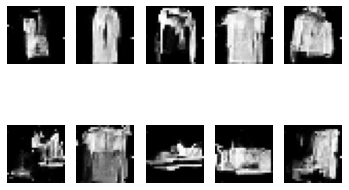

24401 [D loss: 0.636308, acc.: 63.28%] [G loss: 0.822439]
24402 [D loss: 0.657225, acc.: 60.55%] [G loss: 0.838828]
24403 [D loss: 0.631149, acc.: 63.28%] [G loss: 0.799689]
24404 [D loss: 0.637798, acc.: 63.28%] [G loss: 0.812378]
24405 [D loss: 0.639580, acc.: 66.02%] [G loss: 0.826450]
24406 [D loss: 0.621573, acc.: 67.97%] [G loss: 0.844943]
24407 [D loss: 0.633493, acc.: 66.02%] [G loss: 0.808293]
24408 [D loss: 0.622962, acc.: 66.41%] [G loss: 0.845628]
24409 [D loss: 0.635945, acc.: 58.98%] [G loss: 0.857311]
24410 [D loss: 0.644113, acc.: 54.30%] [G loss: 0.830528]
24411 [D loss: 0.656312, acc.: 55.47%] [G loss: 0.829401]
24412 [D loss: 0.642432, acc.: 58.59%] [G loss: 0.818967]
24413 [D loss: 0.631602, acc.: 59.77%] [G loss: 0.838257]
24414 [D loss: 0.638635, acc.: 61.72%] [G loss: 0.811064]
24415 [D loss: 0.625710, acc.: 60.94%] [G loss: 0.829490]
24416 [D loss: 0.644140, acc.: 60.55%] [G loss: 0.841087]
24417 [D loss: 0.632335, acc.: 58.98%] [G loss: 0.812119]
24418 [D loss:

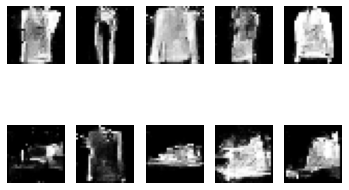

24601 [D loss: 0.751958, acc.: 47.27%] [G loss: 0.701157]
24602 [D loss: 0.745843, acc.: 45.70%] [G loss: 0.685669]
24603 [D loss: 0.757670, acc.: 40.62%] [G loss: 0.680732]
24604 [D loss: 0.742595, acc.: 42.19%] [G loss: 0.696151]
24605 [D loss: 0.741707, acc.: 42.97%] [G loss: 0.709919]
24606 [D loss: 0.733654, acc.: 47.27%] [G loss: 0.703563]
24607 [D loss: 0.736287, acc.: 44.53%] [G loss: 0.732080]
24608 [D loss: 0.743277, acc.: 37.89%] [G loss: 0.716060]
24609 [D loss: 0.734833, acc.: 38.28%] [G loss: 0.704483]
24610 [D loss: 0.737367, acc.: 37.50%] [G loss: 0.711219]
24611 [D loss: 0.752216, acc.: 34.77%] [G loss: 0.722300]
24612 [D loss: 0.743115, acc.: 37.11%] [G loss: 0.719355]
24613 [D loss: 0.724524, acc.: 42.58%] [G loss: 0.714264]
24614 [D loss: 0.720954, acc.: 38.28%] [G loss: 0.714392]
24615 [D loss: 0.717764, acc.: 38.67%] [G loss: 0.714151]
24616 [D loss: 0.736269, acc.: 37.50%] [G loss: 0.719771]
24617 [D loss: 0.730828, acc.: 40.62%] [G loss: 0.717229]
24618 [D loss:

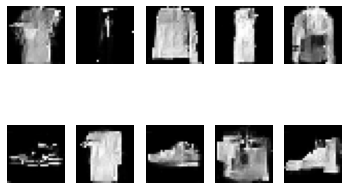

24801 [D loss: 0.658795, acc.: 62.50%] [G loss: 0.791671]
24802 [D loss: 0.663275, acc.: 62.11%] [G loss: 0.790207]
24803 [D loss: 0.656661, acc.: 64.06%] [G loss: 0.797748]
24804 [D loss: 0.649088, acc.: 66.80%] [G loss: 0.794887]
24805 [D loss: 0.649770, acc.: 67.97%] [G loss: 0.800405]
24806 [D loss: 0.644127, acc.: 68.36%] [G loss: 0.808780]
24807 [D loss: 0.653798, acc.: 64.45%] [G loss: 0.804269]
24808 [D loss: 0.651403, acc.: 61.72%] [G loss: 0.816494]
24809 [D loss: 0.661215, acc.: 60.16%] [G loss: 0.793313]
24810 [D loss: 0.634746, acc.: 67.97%] [G loss: 0.778512]
24811 [D loss: 0.658086, acc.: 61.72%] [G loss: 0.811432]
24812 [D loss: 0.648476, acc.: 64.84%] [G loss: 0.820760]
24813 [D loss: 0.663639, acc.: 61.72%] [G loss: 0.799252]
24814 [D loss: 0.669275, acc.: 56.25%] [G loss: 0.778745]
24815 [D loss: 0.675537, acc.: 52.73%] [G loss: 0.809362]
24816 [D loss: 0.650213, acc.: 60.55%] [G loss: 0.813554]
24817 [D loss: 0.670518, acc.: 53.91%] [G loss: 0.804595]
24818 [D loss:

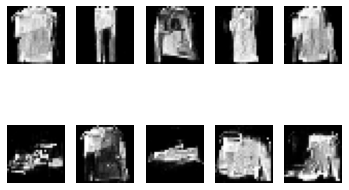

25001 [D loss: 0.688273, acc.: 58.20%] [G loss: 0.767771]
25002 [D loss: 0.690563, acc.: 58.98%] [G loss: 0.760192]
25003 [D loss: 0.677953, acc.: 57.81%] [G loss: 0.761832]
25004 [D loss: 0.684185, acc.: 56.64%] [G loss: 0.760591]
25005 [D loss: 0.686724, acc.: 55.47%] [G loss: 0.751968]
25006 [D loss: 0.688429, acc.: 53.91%] [G loss: 0.747226]
25007 [D loss: 0.688851, acc.: 53.12%] [G loss: 0.750646]
25008 [D loss: 0.673379, acc.: 51.17%] [G loss: 0.739030]
25009 [D loss: 0.687637, acc.: 47.66%] [G loss: 0.745283]
25010 [D loss: 0.686791, acc.: 54.30%] [G loss: 0.747862]
25011 [D loss: 0.681990, acc.: 49.61%] [G loss: 0.749152]
25012 [D loss: 0.688575, acc.: 47.27%] [G loss: 0.738635]
25013 [D loss: 0.695436, acc.: 48.83%] [G loss: 0.722635]
25014 [D loss: 0.693096, acc.: 52.34%] [G loss: 0.728668]
25015 [D loss: 0.686627, acc.: 52.73%] [G loss: 0.730402]
25016 [D loss: 0.682171, acc.: 50.78%] [G loss: 0.734841]
25017 [D loss: 0.705897, acc.: 41.02%] [G loss: 0.746568]
25018 [D loss:

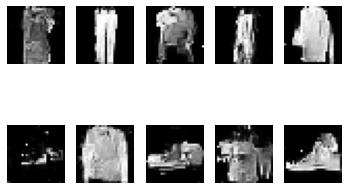

25201 [D loss: 0.644160, acc.: 65.23%] [G loss: 0.817541]
25202 [D loss: 0.658212, acc.: 63.28%] [G loss: 0.780328]
25203 [D loss: 0.664320, acc.: 64.06%] [G loss: 0.779540]
25204 [D loss: 0.679747, acc.: 59.38%] [G loss: 0.779590]
25205 [D loss: 0.649996, acc.: 58.20%] [G loss: 0.748034]
25206 [D loss: 0.661177, acc.: 58.20%] [G loss: 0.769172]
25207 [D loss: 0.665286, acc.: 60.94%] [G loss: 0.785812]
25208 [D loss: 0.671597, acc.: 62.11%] [G loss: 0.809399]
25209 [D loss: 0.644765, acc.: 69.14%] [G loss: 0.832457]
25210 [D loss: 0.660981, acc.: 62.89%] [G loss: 0.836503]
25211 [D loss: 0.657596, acc.: 67.58%] [G loss: 0.814183]
25212 [D loss: 0.642460, acc.: 67.58%] [G loss: 0.842814]
25213 [D loss: 0.654330, acc.: 65.23%] [G loss: 0.823631]
25214 [D loss: 0.633555, acc.: 70.31%] [G loss: 0.833013]
25215 [D loss: 0.624773, acc.: 69.53%] [G loss: 0.823743]
25216 [D loss: 0.647588, acc.: 65.62%] [G loss: 0.827530]
25217 [D loss: 0.667865, acc.: 57.81%] [G loss: 0.804473]
25218 [D loss:

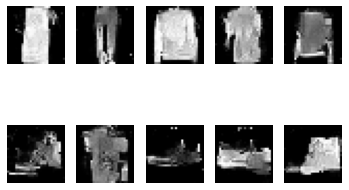

25401 [D loss: 0.664551, acc.: 59.38%] [G loss: 0.799874]
25402 [D loss: 0.686708, acc.: 54.30%] [G loss: 0.783515]
25403 [D loss: 0.682597, acc.: 56.25%] [G loss: 0.781020]
25404 [D loss: 0.694518, acc.: 57.42%] [G loss: 0.788225]
25405 [D loss: 0.673277, acc.: 57.03%] [G loss: 0.794326]
25406 [D loss: 0.680491, acc.: 50.78%] [G loss: 0.770915]
25407 [D loss: 0.682924, acc.: 52.34%] [G loss: 0.760716]
25408 [D loss: 0.690732, acc.: 48.44%] [G loss: 0.767332]
25409 [D loss: 0.668913, acc.: 53.91%] [G loss: 0.763973]
25410 [D loss: 0.692800, acc.: 47.66%] [G loss: 0.771447]
25411 [D loss: 0.687552, acc.: 51.17%] [G loss: 0.781526]
25412 [D loss: 0.692579, acc.: 47.66%] [G loss: 0.793072]
25413 [D loss: 0.700257, acc.: 46.09%] [G loss: 0.762719]
25414 [D loss: 0.702964, acc.: 50.39%] [G loss: 0.771311]
25415 [D loss: 0.693152, acc.: 46.88%] [G loss: 0.769691]
25416 [D loss: 0.678551, acc.: 51.95%] [G loss: 0.797420]
25417 [D loss: 0.688797, acc.: 51.17%] [G loss: 0.755334]
25418 [D loss:

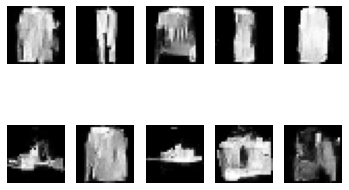

25601 [D loss: 0.685898, acc.: 51.17%] [G loss: 0.765299]
25602 [D loss: 0.699326, acc.: 51.95%] [G loss: 0.743496]
25603 [D loss: 0.707234, acc.: 47.66%] [G loss: 0.736487]
25604 [D loss: 0.709106, acc.: 49.22%] [G loss: 0.740187]
25605 [D loss: 0.708530, acc.: 50.00%] [G loss: 0.751090]
25606 [D loss: 0.703525, acc.: 50.78%] [G loss: 0.755673]
25607 [D loss: 0.698377, acc.: 48.83%] [G loss: 0.766692]
25608 [D loss: 0.714677, acc.: 49.61%] [G loss: 0.764921]
25609 [D loss: 0.708956, acc.: 48.05%] [G loss: 0.758544]
25610 [D loss: 0.690956, acc.: 55.47%] [G loss: 0.808458]
25611 [D loss: 0.681019, acc.: 57.03%] [G loss: 0.779950]
25612 [D loss: 0.679411, acc.: 53.12%] [G loss: 0.777930]
25613 [D loss: 0.689388, acc.: 60.55%] [G loss: 0.804375]
25614 [D loss: 0.693809, acc.: 55.47%] [G loss: 0.779704]
25615 [D loss: 0.672174, acc.: 62.11%] [G loss: 0.796299]
25616 [D loss: 0.693491, acc.: 53.12%] [G loss: 0.780411]
25617 [D loss: 0.694134, acc.: 55.86%] [G loss: 0.783114]
25618 [D loss:

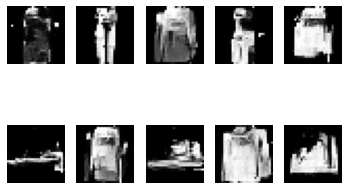

25801 [D loss: 0.675233, acc.: 51.95%] [G loss: 0.822449]
25802 [D loss: 0.683272, acc.: 54.30%] [G loss: 0.808705]
25803 [D loss: 0.654270, acc.: 55.08%] [G loss: 0.847259]
25804 [D loss: 0.671819, acc.: 56.64%] [G loss: 0.858604]
25805 [D loss: 0.638927, acc.: 60.94%] [G loss: 0.835596]
25806 [D loss: 0.655901, acc.: 64.06%] [G loss: 0.854832]
25807 [D loss: 0.660655, acc.: 61.72%] [G loss: 0.855401]
25808 [D loss: 0.669346, acc.: 57.81%] [G loss: 0.812789]
25809 [D loss: 0.654066, acc.: 59.38%] [G loss: 0.860098]
25810 [D loss: 0.645949, acc.: 60.55%] [G loss: 0.837977]
25811 [D loss: 0.638858, acc.: 62.11%] [G loss: 0.850249]
25812 [D loss: 0.660761, acc.: 57.03%] [G loss: 0.811986]
25813 [D loss: 0.658354, acc.: 56.64%] [G loss: 0.820653]
25814 [D loss: 0.658149, acc.: 55.08%] [G loss: 0.816955]
25815 [D loss: 0.646547, acc.: 62.11%] [G loss: 0.861371]
25816 [D loss: 0.646905, acc.: 69.14%] [G loss: 0.847601]
25817 [D loss: 0.662851, acc.: 64.45%] [G loss: 0.858284]
25818 [D loss:

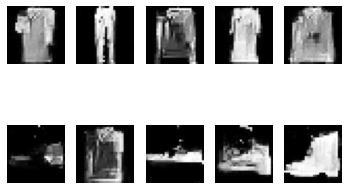

26001 [D loss: 0.735460, acc.: 41.41%] [G loss: 0.698629]
26002 [D loss: 0.751038, acc.: 33.20%] [G loss: 0.704472]
26003 [D loss: 0.748944, acc.: 35.94%] [G loss: 0.690453]
26004 [D loss: 0.738399, acc.: 34.77%] [G loss: 0.699520]
26005 [D loss: 0.723768, acc.: 40.62%] [G loss: 0.711949]
26006 [D loss: 0.728022, acc.: 37.50%] [G loss: 0.723912]
26007 [D loss: 0.727711, acc.: 37.50%] [G loss: 0.698898]
26008 [D loss: 0.719655, acc.: 41.80%] [G loss: 0.696649]
26009 [D loss: 0.727625, acc.: 37.89%] [G loss: 0.705037]
26010 [D loss: 0.725914, acc.: 41.02%] [G loss: 0.705247]
26011 [D loss: 0.726482, acc.: 38.67%] [G loss: 0.711802]
26012 [D loss: 0.732254, acc.: 35.16%] [G loss: 0.699383]
26013 [D loss: 0.726786, acc.: 39.84%] [G loss: 0.690192]
26014 [D loss: 0.738824, acc.: 33.98%] [G loss: 0.696041]
26015 [D loss: 0.739598, acc.: 30.86%] [G loss: 0.691852]
26016 [D loss: 0.731285, acc.: 32.42%] [G loss: 0.699268]
26017 [D loss: 0.732310, acc.: 33.59%] [G loss: 0.693521]
26018 [D loss:

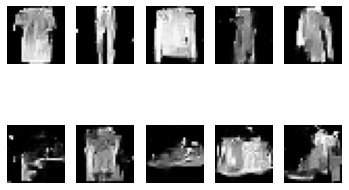

26201 [D loss: 0.681233, acc.: 52.73%] [G loss: 0.743975]
26202 [D loss: 0.664408, acc.: 56.25%] [G loss: 0.743888]
26203 [D loss: 0.663707, acc.: 54.69%] [G loss: 0.742609]
26204 [D loss: 0.687769, acc.: 51.56%] [G loss: 0.744097]
26205 [D loss: 0.669074, acc.: 58.59%] [G loss: 0.745567]
26206 [D loss: 0.674035, acc.: 57.03%] [G loss: 0.744567]
26207 [D loss: 0.656702, acc.: 62.50%] [G loss: 0.743790]
26208 [D loss: 0.662844, acc.: 58.59%] [G loss: 0.747318]
26209 [D loss: 0.672929, acc.: 58.20%] [G loss: 0.753067]
26210 [D loss: 0.679324, acc.: 56.25%] [G loss: 0.749489]
26211 [D loss: 0.671715, acc.: 59.38%] [G loss: 0.752914]
26212 [D loss: 0.658934, acc.: 59.77%] [G loss: 0.753341]
26213 [D loss: 0.686664, acc.: 55.86%] [G loss: 0.738727]
26214 [D loss: 0.655149, acc.: 60.16%] [G loss: 0.744337]
26215 [D loss: 0.676360, acc.: 58.98%] [G loss: 0.761047]
26216 [D loss: 0.679715, acc.: 55.08%] [G loss: 0.771158]
26217 [D loss: 0.690411, acc.: 53.52%] [G loss: 0.746133]
26218 [D loss:

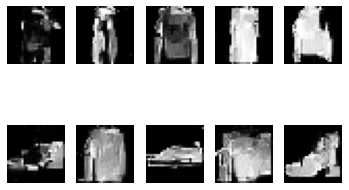

26401 [D loss: 0.674809, acc.: 61.72%] [G loss: 0.782536]
26402 [D loss: 0.662173, acc.: 66.41%] [G loss: 0.783949]
26403 [D loss: 0.666539, acc.: 67.19%] [G loss: 0.786875]
26404 [D loss: 0.661900, acc.: 62.50%] [G loss: 0.771222]
26405 [D loss: 0.669330, acc.: 62.11%] [G loss: 0.795393]
26406 [D loss: 0.637438, acc.: 72.27%] [G loss: 0.786180]
26407 [D loss: 0.661715, acc.: 66.02%] [G loss: 0.794618]
26408 [D loss: 0.658915, acc.: 67.19%] [G loss: 0.786198]
26409 [D loss: 0.652543, acc.: 64.06%] [G loss: 0.797686]
26410 [D loss: 0.657842, acc.: 62.50%] [G loss: 0.806339]
26411 [D loss: 0.651432, acc.: 65.62%] [G loss: 0.798760]
26412 [D loss: 0.637926, acc.: 73.44%] [G loss: 0.790591]
26413 [D loss: 0.639953, acc.: 71.48%] [G loss: 0.794833]
26414 [D loss: 0.646671, acc.: 69.53%] [G loss: 0.792647]
26415 [D loss: 0.633596, acc.: 70.31%] [G loss: 0.811325]
26416 [D loss: 0.638655, acc.: 73.83%] [G loss: 0.800891]
26417 [D loss: 0.658800, acc.: 62.50%] [G loss: 0.791244]
26418 [D loss:

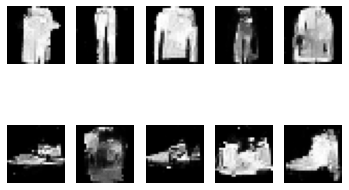

26601 [D loss: 0.665162, acc.: 62.89%] [G loss: 0.796489]
26602 [D loss: 0.668004, acc.: 59.38%] [G loss: 0.784531]
26603 [D loss: 0.686970, acc.: 54.69%] [G loss: 0.773735]
26604 [D loss: 0.661518, acc.: 59.38%] [G loss: 0.780749]
26605 [D loss: 0.670529, acc.: 55.47%] [G loss: 0.802192]
26606 [D loss: 0.692885, acc.: 55.08%] [G loss: 0.793578]
26607 [D loss: 0.660654, acc.: 60.16%] [G loss: 0.792898]
26608 [D loss: 0.650454, acc.: 62.89%] [G loss: 0.793646]
26609 [D loss: 0.671994, acc.: 59.77%] [G loss: 0.808043]
26610 [D loss: 0.663988, acc.: 58.59%] [G loss: 0.816823]
26611 [D loss: 0.657472, acc.: 59.77%] [G loss: 0.802544]
26612 [D loss: 0.666258, acc.: 58.20%] [G loss: 0.819286]
26613 [D loss: 0.681235, acc.: 52.73%] [G loss: 0.809158]
26614 [D loss: 0.665376, acc.: 62.89%] [G loss: 0.815998]
26615 [D loss: 0.647113, acc.: 66.80%] [G loss: 0.816229]
26616 [D loss: 0.677642, acc.: 60.94%] [G loss: 0.796931]
26617 [D loss: 0.644959, acc.: 71.09%] [G loss: 0.814347]
26618 [D loss:

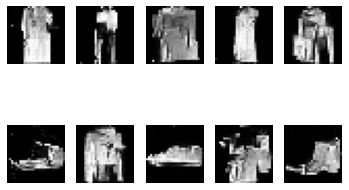

26801 [D loss: 0.603476, acc.: 74.22%] [G loss: 0.864705]
26802 [D loss: 0.627634, acc.: 71.88%] [G loss: 0.829073]
26803 [D loss: 0.612863, acc.: 70.70%] [G loss: 0.863344]
26804 [D loss: 0.594022, acc.: 73.83%] [G loss: 0.821142]
26805 [D loss: 0.653353, acc.: 60.55%] [G loss: 0.808643]
26806 [D loss: 0.657329, acc.: 60.16%] [G loss: 0.817642]
26807 [D loss: 0.634073, acc.: 66.02%] [G loss: 0.791382]
26808 [D loss: 0.654020, acc.: 59.38%] [G loss: 0.775779]
26809 [D loss: 0.671932, acc.: 48.83%] [G loss: 0.775987]
26810 [D loss: 0.684810, acc.: 46.88%] [G loss: 0.760311]
26811 [D loss: 0.688132, acc.: 47.66%] [G loss: 0.787319]
26812 [D loss: 0.687832, acc.: 50.00%] [G loss: 0.783046]
26813 [D loss: 0.670937, acc.: 54.30%] [G loss: 0.793869]
26814 [D loss: 0.673816, acc.: 57.03%] [G loss: 0.805451]
26815 [D loss: 0.654137, acc.: 62.50%] [G loss: 0.790729]
26816 [D loss: 0.655038, acc.: 66.02%] [G loss: 0.793079]
26817 [D loss: 0.676241, acc.: 55.86%] [G loss: 0.790141]
26818 [D loss:

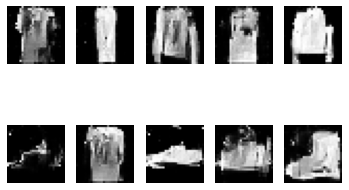

27001 [D loss: 0.690148, acc.: 55.08%] [G loss: 0.789822]
27002 [D loss: 0.683284, acc.: 56.25%] [G loss: 0.782135]
27003 [D loss: 0.697536, acc.: 49.22%] [G loss: 0.788120]
27004 [D loss: 0.704518, acc.: 50.00%] [G loss: 0.800395]
27005 [D loss: 0.690953, acc.: 52.73%] [G loss: 0.794462]
27006 [D loss: 0.703872, acc.: 54.30%] [G loss: 0.795456]
27007 [D loss: 0.692945, acc.: 55.47%] [G loss: 0.779165]
27008 [D loss: 0.693243, acc.: 55.47%] [G loss: 0.823498]
27009 [D loss: 0.685910, acc.: 53.52%] [G loss: 0.817275]
27010 [D loss: 0.712625, acc.: 45.70%] [G loss: 0.807783]
27011 [D loss: 0.671172, acc.: 54.69%] [G loss: 0.806760]
27012 [D loss: 0.686102, acc.: 51.17%] [G loss: 0.832636]
27013 [D loss: 0.691296, acc.: 51.95%] [G loss: 0.819894]
27014 [D loss: 0.687141, acc.: 51.17%] [G loss: 0.802431]
27015 [D loss: 0.678509, acc.: 62.11%] [G loss: 0.794157]
27016 [D loss: 0.683326, acc.: 54.30%] [G loss: 0.803956]
27017 [D loss: 0.644894, acc.: 63.67%] [G loss: 0.834703]
27018 [D loss:

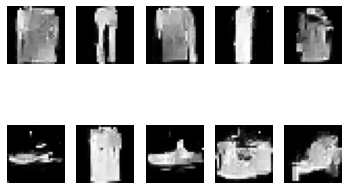

27201 [D loss: 0.707403, acc.: 50.78%] [G loss: 0.778219]
27202 [D loss: 0.679177, acc.: 57.81%] [G loss: 0.786950]
27203 [D loss: 0.672668, acc.: 58.98%] [G loss: 0.783987]
27204 [D loss: 0.684476, acc.: 56.64%] [G loss: 0.799507]
27205 [D loss: 0.671702, acc.: 57.81%] [G loss: 0.801943]
27206 [D loss: 0.701003, acc.: 50.39%] [G loss: 0.777908]
27207 [D loss: 0.674856, acc.: 58.98%] [G loss: 0.784906]
27208 [D loss: 0.687973, acc.: 56.64%] [G loss: 0.802691]
27209 [D loss: 0.692980, acc.: 53.52%] [G loss: 0.800490]
27210 [D loss: 0.703442, acc.: 52.34%] [G loss: 0.778229]
27211 [D loss: 0.667246, acc.: 57.03%] [G loss: 0.800325]
27212 [D loss: 0.681235, acc.: 52.34%] [G loss: 0.778173]
27213 [D loss: 0.673761, acc.: 55.47%] [G loss: 0.796088]
27214 [D loss: 0.666269, acc.: 58.59%] [G loss: 0.807265]
27215 [D loss: 0.674136, acc.: 60.55%] [G loss: 0.800428]
27216 [D loss: 0.658983, acc.: 63.28%] [G loss: 0.784177]
27217 [D loss: 0.675062, acc.: 58.98%] [G loss: 0.790066]
27218 [D loss:

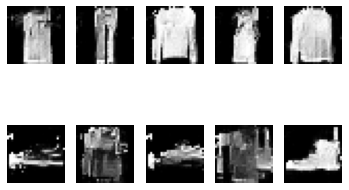

27401 [D loss: 0.690284, acc.: 56.25%] [G loss: 0.781812]
27402 [D loss: 0.653950, acc.: 66.41%] [G loss: 0.792293]
27403 [D loss: 0.672211, acc.: 64.06%] [G loss: 0.805340]
27404 [D loss: 0.665308, acc.: 62.89%] [G loss: 0.780471]
27405 [D loss: 0.684314, acc.: 55.08%] [G loss: 0.793677]
27406 [D loss: 0.674962, acc.: 60.94%] [G loss: 0.778881]
27407 [D loss: 0.683157, acc.: 54.69%] [G loss: 0.787396]
27408 [D loss: 0.684528, acc.: 51.17%] [G loss: 0.758094]
27409 [D loss: 0.692763, acc.: 48.05%] [G loss: 0.772837]
27410 [D loss: 0.660017, acc.: 55.47%] [G loss: 0.758718]
27411 [D loss: 0.693508, acc.: 48.83%] [G loss: 0.749901]
27412 [D loss: 0.665723, acc.: 52.73%] [G loss: 0.792060]
27413 [D loss: 0.684522, acc.: 50.78%] [G loss: 0.780950]
27414 [D loss: 0.704117, acc.: 47.27%] [G loss: 0.790020]
27415 [D loss: 0.677056, acc.: 49.22%] [G loss: 0.755521]
27416 [D loss: 0.696548, acc.: 41.80%] [G loss: 0.769467]
27417 [D loss: 0.714301, acc.: 41.02%] [G loss: 0.777644]
27418 [D loss:

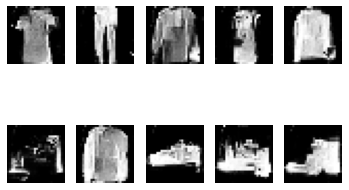

27601 [D loss: 0.673392, acc.: 61.33%] [G loss: 0.770859]
27602 [D loss: 0.657201, acc.: 64.84%] [G loss: 0.774500]
27603 [D loss: 0.663683, acc.: 62.11%] [G loss: 0.775793]
27604 [D loss: 0.665952, acc.: 60.94%] [G loss: 0.784199]
27605 [D loss: 0.676843, acc.: 58.59%] [G loss: 0.778757]
27606 [D loss: 0.672048, acc.: 56.64%] [G loss: 0.760020]
27607 [D loss: 0.665183, acc.: 59.38%] [G loss: 0.790707]
27608 [D loss: 0.680861, acc.: 58.20%] [G loss: 0.783599]
27609 [D loss: 0.662630, acc.: 67.58%] [G loss: 0.813135]
27610 [D loss: 0.674006, acc.: 64.06%] [G loss: 0.809643]
27611 [D loss: 0.659573, acc.: 58.59%] [G loss: 0.835053]
27612 [D loss: 0.653067, acc.: 61.33%] [G loss: 0.829646]
27613 [D loss: 0.658118, acc.: 60.16%] [G loss: 0.819864]
27614 [D loss: 0.648526, acc.: 65.62%] [G loss: 0.851640]
27615 [D loss: 0.649313, acc.: 60.16%] [G loss: 0.863621]
27616 [D loss: 0.640884, acc.: 60.16%] [G loss: 0.864929]
27617 [D loss: 0.651523, acc.: 59.38%] [G loss: 0.846362]
27618 [D loss:

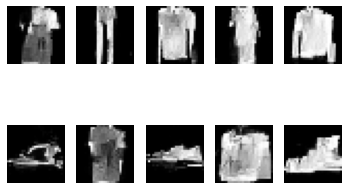

27801 [D loss: 0.681002, acc.: 52.73%] [G loss: 0.782772]
27802 [D loss: 0.684562, acc.: 52.73%] [G loss: 0.765182]
27803 [D loss: 0.664823, acc.: 54.69%] [G loss: 0.774009]
27804 [D loss: 0.684055, acc.: 53.12%] [G loss: 0.783853]
27805 [D loss: 0.654420, acc.: 62.89%] [G loss: 0.781093]
27806 [D loss: 0.669833, acc.: 56.64%] [G loss: 0.788598]
27807 [D loss: 0.687562, acc.: 49.61%] [G loss: 0.792227]
27808 [D loss: 0.666429, acc.: 52.73%] [G loss: 0.782992]
27809 [D loss: 0.667124, acc.: 53.12%] [G loss: 0.779436]
27810 [D loss: 0.668703, acc.: 52.34%] [G loss: 0.804137]
27811 [D loss: 0.679474, acc.: 44.92%] [G loss: 0.787432]
27812 [D loss: 0.671120, acc.: 47.66%] [G loss: 0.790946]
27813 [D loss: 0.675523, acc.: 46.48%] [G loss: 0.787746]
27814 [D loss: 0.679170, acc.: 44.53%] [G loss: 0.787093]
27815 [D loss: 0.681558, acc.: 47.27%] [G loss: 0.780972]
27816 [D loss: 0.674234, acc.: 51.17%] [G loss: 0.778767]
27817 [D loss: 0.673654, acc.: 50.39%] [G loss: 0.778577]
27818 [D loss:

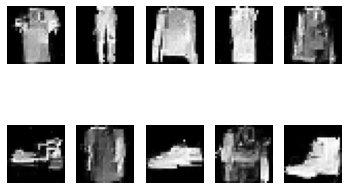

28001 [D loss: 0.707509, acc.: 45.70%] [G loss: 0.735791]
28002 [D loss: 0.698968, acc.: 46.48%] [G loss: 0.733426]
28003 [D loss: 0.693256, acc.: 43.75%] [G loss: 0.735021]
28004 [D loss: 0.708009, acc.: 41.02%] [G loss: 0.741078]
28005 [D loss: 0.691854, acc.: 41.02%] [G loss: 0.731090]
28006 [D loss: 0.709751, acc.: 36.72%] [G loss: 0.728304]
28007 [D loss: 0.711770, acc.: 41.41%] [G loss: 0.733781]
28008 [D loss: 0.709514, acc.: 37.11%] [G loss: 0.722192]
28009 [D loss: 0.716192, acc.: 37.89%] [G loss: 0.737136]
28010 [D loss: 0.701555, acc.: 39.45%] [G loss: 0.742617]
28011 [D loss: 0.710403, acc.: 43.36%] [G loss: 0.746724]
28012 [D loss: 0.694597, acc.: 44.53%] [G loss: 0.746016]
28013 [D loss: 0.711553, acc.: 45.31%] [G loss: 0.735749]
28014 [D loss: 0.698785, acc.: 48.05%] [G loss: 0.742482]
28015 [D loss: 0.700188, acc.: 49.61%] [G loss: 0.735815]
28016 [D loss: 0.704432, acc.: 49.61%] [G loss: 0.734007]
28017 [D loss: 0.699817, acc.: 47.66%] [G loss: 0.725960]
28018 [D loss:

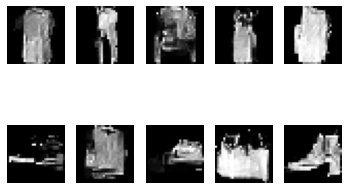

28201 [D loss: 0.642220, acc.: 64.06%] [G loss: 0.821124]
28202 [D loss: 0.634465, acc.: 68.36%] [G loss: 0.821010]
28203 [D loss: 0.645068, acc.: 64.06%] [G loss: 0.838837]
28204 [D loss: 0.637785, acc.: 66.80%] [G loss: 0.822334]
28205 [D loss: 0.652751, acc.: 61.33%] [G loss: 0.850744]
28206 [D loss: 0.634568, acc.: 69.92%] [G loss: 0.833734]
28207 [D loss: 0.629194, acc.: 69.53%] [G loss: 0.854294]
28208 [D loss: 0.621611, acc.: 66.80%] [G loss: 0.836276]
28209 [D loss: 0.613142, acc.: 66.41%] [G loss: 0.824646]
28210 [D loss: 0.653021, acc.: 57.81%] [G loss: 0.833676]
28211 [D loss: 0.618083, acc.: 67.97%] [G loss: 0.833893]
28212 [D loss: 0.647340, acc.: 60.55%] [G loss: 0.845538]
28213 [D loss: 0.639329, acc.: 62.50%] [G loss: 0.858479]
28214 [D loss: 0.620267, acc.: 68.75%] [G loss: 0.831162]
28215 [D loss: 0.612876, acc.: 66.80%] [G loss: 0.832212]
28216 [D loss: 0.616036, acc.: 70.31%] [G loss: 0.818473]
28217 [D loss: 0.639872, acc.: 67.19%] [G loss: 0.822423]
28218 [D loss:

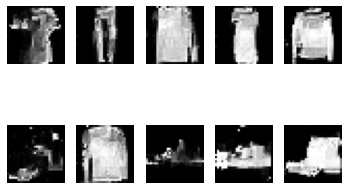

28401 [D loss: 0.683302, acc.: 54.69%] [G loss: 0.785944]
28402 [D loss: 0.656882, acc.: 56.25%] [G loss: 0.776015]
28403 [D loss: 0.656710, acc.: 55.08%] [G loss: 0.783794]
28404 [D loss: 0.669391, acc.: 54.30%] [G loss: 0.801854]
28405 [D loss: 0.668283, acc.: 52.73%] [G loss: 0.789272]
28406 [D loss: 0.660327, acc.: 64.45%] [G loss: 0.803455]
28407 [D loss: 0.663421, acc.: 59.38%] [G loss: 0.799523]
28408 [D loss: 0.666835, acc.: 56.64%] [G loss: 0.793683]
28409 [D loss: 0.660582, acc.: 64.06%] [G loss: 0.797075]
28410 [D loss: 0.660007, acc.: 58.98%] [G loss: 0.797869]
28411 [D loss: 0.638516, acc.: 66.41%] [G loss: 0.784902]
28412 [D loss: 0.642676, acc.: 65.23%] [G loss: 0.769773]
28413 [D loss: 0.666138, acc.: 64.06%] [G loss: 0.756029]
28414 [D loss: 0.669336, acc.: 61.33%] [G loss: 0.765333]
28415 [D loss: 0.643383, acc.: 64.84%] [G loss: 0.785196]
28416 [D loss: 0.654991, acc.: 64.84%] [G loss: 0.791698]
28417 [D loss: 0.643101, acc.: 66.02%] [G loss: 0.747575]
28418 [D loss:

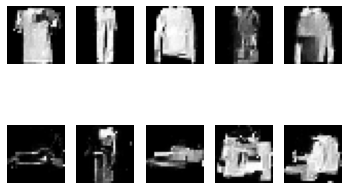

28601 [D loss: 0.690623, acc.: 44.14%] [G loss: 0.763326]
28602 [D loss: 0.681443, acc.: 53.52%] [G loss: 0.756546]
28603 [D loss: 0.675716, acc.: 54.30%] [G loss: 0.767434]
28604 [D loss: 0.664603, acc.: 50.39%] [G loss: 0.742759]
28605 [D loss: 0.674229, acc.: 51.17%] [G loss: 0.771730]
28606 [D loss: 0.664696, acc.: 57.81%] [G loss: 0.762783]
28607 [D loss: 0.671360, acc.: 56.25%] [G loss: 0.754202]
28608 [D loss: 0.650055, acc.: 58.98%] [G loss: 0.769238]
28609 [D loss: 0.678816, acc.: 50.39%] [G loss: 0.769469]
28610 [D loss: 0.666285, acc.: 57.03%] [G loss: 0.777022]
28611 [D loss: 0.675428, acc.: 57.81%] [G loss: 0.759606]
28612 [D loss: 0.668591, acc.: 50.78%] [G loss: 0.792994]
28613 [D loss: 0.667269, acc.: 58.98%] [G loss: 0.777752]
28614 [D loss: 0.660176, acc.: 62.89%] [G loss: 0.798096]
28615 [D loss: 0.658295, acc.: 59.38%] [G loss: 0.784441]
28616 [D loss: 0.662622, acc.: 58.20%] [G loss: 0.773330]
28617 [D loss: 0.655014, acc.: 62.11%] [G loss: 0.798284]
28618 [D loss:

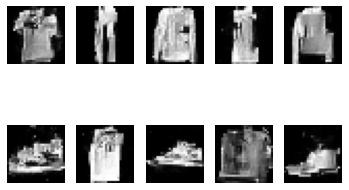

28801 [D loss: 0.700692, acc.: 47.66%] [G loss: 0.754447]
28802 [D loss: 0.679775, acc.: 53.52%] [G loss: 0.747660]
28803 [D loss: 0.700260, acc.: 55.08%] [G loss: 0.763010]
28804 [D loss: 0.700635, acc.: 57.81%] [G loss: 0.763413]
28805 [D loss: 0.678122, acc.: 57.81%] [G loss: 0.768043]
28806 [D loss: 0.676373, acc.: 58.98%] [G loss: 0.764596]
28807 [D loss: 0.678134, acc.: 53.52%] [G loss: 0.747995]
28808 [D loss: 0.709433, acc.: 48.05%] [G loss: 0.751699]
28809 [D loss: 0.691262, acc.: 44.92%] [G loss: 0.755246]
28810 [D loss: 0.676233, acc.: 50.00%] [G loss: 0.752964]
28811 [D loss: 0.688923, acc.: 44.53%] [G loss: 0.765881]
28812 [D loss: 0.692946, acc.: 43.36%] [G loss: 0.757267]
28813 [D loss: 0.692999, acc.: 47.66%] [G loss: 0.767645]
28814 [D loss: 0.668904, acc.: 51.56%] [G loss: 0.783228]
28815 [D loss: 0.683797, acc.: 48.83%] [G loss: 0.785871]
28816 [D loss: 0.675613, acc.: 46.88%] [G loss: 0.758592]
28817 [D loss: 0.671913, acc.: 48.44%] [G loss: 0.768472]
28818 [D loss:

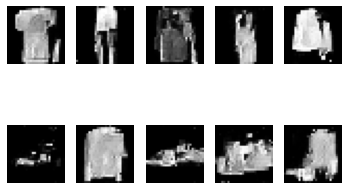

29001 [D loss: 0.618452, acc.: 72.27%] [G loss: 0.870147]
29002 [D loss: 0.619554, acc.: 68.75%] [G loss: 0.854280]
29003 [D loss: 0.637748, acc.: 67.19%] [G loss: 0.848645]
29004 [D loss: 0.608781, acc.: 70.70%] [G loss: 0.846219]
29005 [D loss: 0.604301, acc.: 72.66%] [G loss: 0.870632]
29006 [D loss: 0.609504, acc.: 69.53%] [G loss: 0.848018]
29007 [D loss: 0.626783, acc.: 64.84%] [G loss: 0.850789]
29008 [D loss: 0.605131, acc.: 69.92%] [G loss: 0.884699]
29009 [D loss: 0.622033, acc.: 64.84%] [G loss: 0.887593]
29010 [D loss: 0.603475, acc.: 63.67%] [G loss: 0.879226]
29011 [D loss: 0.627236, acc.: 62.89%] [G loss: 0.864681]
29012 [D loss: 0.617273, acc.: 63.67%] [G loss: 0.875049]
29013 [D loss: 0.646003, acc.: 61.72%] [G loss: 0.865333]
29014 [D loss: 0.630538, acc.: 63.28%] [G loss: 0.856255]
29015 [D loss: 0.618854, acc.: 66.02%] [G loss: 0.865794]
29016 [D loss: 0.618676, acc.: 65.23%] [G loss: 0.844677]
29017 [D loss: 0.607453, acc.: 70.31%] [G loss: 0.877513]
29018 [D loss:

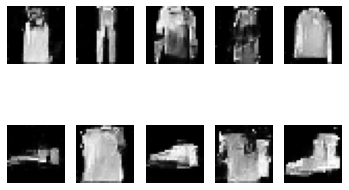

29201 [D loss: 0.676466, acc.: 55.86%] [G loss: 0.759555]
29202 [D loss: 0.690170, acc.: 50.39%] [G loss: 0.755700]
29203 [D loss: 0.685059, acc.: 53.91%] [G loss: 0.764061]
29204 [D loss: 0.701897, acc.: 49.22%] [G loss: 0.755306]
29205 [D loss: 0.685299, acc.: 51.17%] [G loss: 0.742231]
29206 [D loss: 0.689950, acc.: 53.12%] [G loss: 0.761267]
29207 [D loss: 0.703976, acc.: 49.61%] [G loss: 0.745559]
29208 [D loss: 0.694485, acc.: 51.95%] [G loss: 0.763858]
29209 [D loss: 0.705027, acc.: 50.39%] [G loss: 0.748577]
29210 [D loss: 0.689797, acc.: 46.88%] [G loss: 0.741242]
29211 [D loss: 0.672630, acc.: 54.30%] [G loss: 0.743109]
29212 [D loss: 0.692326, acc.: 53.12%] [G loss: 0.748017]
29213 [D loss: 0.676904, acc.: 54.30%] [G loss: 0.748795]
29214 [D loss: 0.699430, acc.: 52.73%] [G loss: 0.740565]
29215 [D loss: 0.707606, acc.: 54.69%] [G loss: 0.736425]
29216 [D loss: 0.683519, acc.: 54.69%] [G loss: 0.736785]
29217 [D loss: 0.728239, acc.: 48.44%] [G loss: 0.735760]
29218 [D loss:

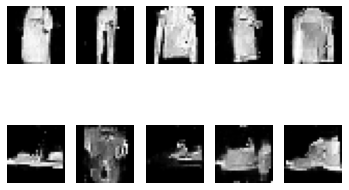

29401 [D loss: 0.660412, acc.: 64.06%] [G loss: 0.828681]
29402 [D loss: 0.656187, acc.: 64.45%] [G loss: 0.827918]
29403 [D loss: 0.618968, acc.: 71.09%] [G loss: 0.804471]
29404 [D loss: 0.686525, acc.: 58.59%] [G loss: 0.823597]
29405 [D loss: 0.680188, acc.: 60.94%] [G loss: 0.834598]
29406 [D loss: 0.671763, acc.: 59.77%] [G loss: 0.849993]
29407 [D loss: 0.656524, acc.: 60.16%] [G loss: 0.851594]
29408 [D loss: 0.666232, acc.: 58.20%] [G loss: 0.829361]
29409 [D loss: 0.668960, acc.: 60.16%] [G loss: 0.825842]
29410 [D loss: 0.660734, acc.: 57.03%] [G loss: 0.805586]
29411 [D loss: 0.695630, acc.: 53.12%] [G loss: 0.841336]
29412 [D loss: 0.694053, acc.: 54.30%] [G loss: 0.816403]
29413 [D loss: 0.661382, acc.: 55.86%] [G loss: 0.795121]
29414 [D loss: 0.632366, acc.: 58.20%] [G loss: 0.823886]
29415 [D loss: 0.643013, acc.: 58.59%] [G loss: 0.820429]
29416 [D loss: 0.672193, acc.: 48.05%] [G loss: 0.862124]
29417 [D loss: 0.648919, acc.: 55.08%] [G loss: 0.853296]
29418 [D loss:

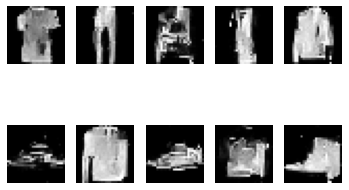

29601 [D loss: 0.613129, acc.: 73.44%] [G loss: 0.839832]
29602 [D loss: 0.635210, acc.: 69.53%] [G loss: 0.832982]
29603 [D loss: 0.629711, acc.: 69.53%] [G loss: 0.818471]
29604 [D loss: 0.603016, acc.: 72.66%] [G loss: 0.817247]
29605 [D loss: 0.648413, acc.: 70.70%] [G loss: 0.818109]
29606 [D loss: 0.663265, acc.: 66.41%] [G loss: 0.810269]
29607 [D loss: 0.613984, acc.: 75.00%] [G loss: 0.794066]
29608 [D loss: 0.667923, acc.: 66.80%] [G loss: 0.810586]
29609 [D loss: 0.653422, acc.: 63.67%] [G loss: 0.793155]
29610 [D loss: 0.664221, acc.: 59.38%] [G loss: 0.798983]
29611 [D loss: 0.672131, acc.: 53.52%] [G loss: 0.800051]
29612 [D loss: 0.653241, acc.: 57.03%] [G loss: 0.803179]
29613 [D loss: 0.654044, acc.: 54.69%] [G loss: 0.792763]
29614 [D loss: 0.672745, acc.: 51.17%] [G loss: 0.798190]
29615 [D loss: 0.653500, acc.: 55.08%] [G loss: 0.797537]
29616 [D loss: 0.667347, acc.: 54.30%] [G loss: 0.794560]
29617 [D loss: 0.692773, acc.: 52.73%] [G loss: 0.790607]
29618 [D loss:

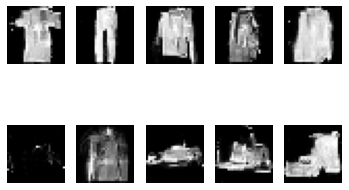

29801 [D loss: 0.668470, acc.: 60.94%] [G loss: 0.793932]
29802 [D loss: 0.662977, acc.: 59.77%] [G loss: 0.812264]
29803 [D loss: 0.645483, acc.: 66.41%] [G loss: 0.804701]
29804 [D loss: 0.657848, acc.: 60.94%] [G loss: 0.814506]
29805 [D loss: 0.657960, acc.: 62.50%] [G loss: 0.787162]
29806 [D loss: 0.644865, acc.: 65.62%] [G loss: 0.854316]
29807 [D loss: 0.640300, acc.: 65.62%] [G loss: 0.807376]
29808 [D loss: 0.653908, acc.: 57.81%] [G loss: 0.816153]
29809 [D loss: 0.642767, acc.: 63.28%] [G loss: 0.848122]
29810 [D loss: 0.636270, acc.: 66.80%] [G loss: 0.852432]
29811 [D loss: 0.657363, acc.: 59.38%] [G loss: 0.853113]
29812 [D loss: 0.643523, acc.: 64.84%] [G loss: 0.848850]
29813 [D loss: 0.675390, acc.: 54.69%] [G loss: 0.841137]
29814 [D loss: 0.650438, acc.: 67.19%] [G loss: 0.845581]
29815 [D loss: 0.668882, acc.: 56.25%] [G loss: 0.851691]
29816 [D loss: 0.659426, acc.: 64.45%] [G loss: 0.843051]
29817 [D loss: 0.651385, acc.: 58.20%] [G loss: 0.831688]
29818 [D loss:

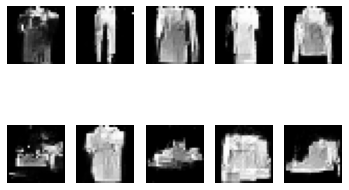

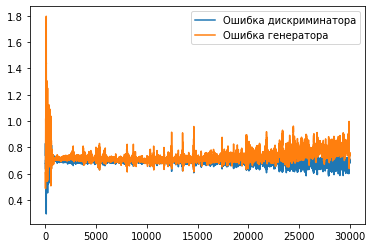

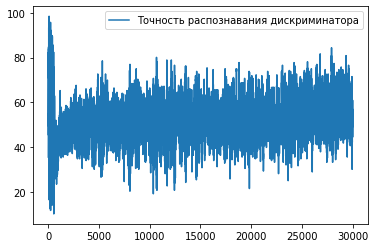

In [21]:
train_conditional(conditional_generator, conditional_discriminator, 30000, sample_interval=200)

In [38]:
# conditional_generator.save_weights('/content/drive/MyDrive/Colab Notebooks/conditional_generator.h5')
conditional_generator.load_weights('/content/drive/MyDrive/Colab Notebooks/conditional_generator.h5')

# Результат

In [1]:
def plot_label(indexes, gen, isHandWritten = True):
  sampled_labels=[]
  
  # Метки из PAINT
  if (isHandWritten):   
    length = len(paint_pictures) 
    for i in range(length):    
      sampled_labels.append(image.img_to_array(paint_pictures[i]))
      sampled_labels[i] = 255-sampled_labels[i]
      sampled_labels[i] = sampled_labels[i]/127.5 - 1.0
      sampled_labels[i] = sampled_labels[i].reshape(28,28, 1)
  # Метки из MNIST
  else:
    length = len(indexes)
    for i in indexes:
      sampled_labels.append(lbl_xTrainMnist_sort[yTrainMnistF==i][np.random.randint(0,lbl_xTrainMnist_sort[yTrainMnistF==i].shape[0])])  
  sampled_labels = np.array(sampled_labels)

  noise = np.random.normal(0, 1, (length, latent_dim))
  gen_imgs = gen.predict([noise, sampled_labels])
  gen_imgs = 0.5 * gen_imgs + 0.5

  fig, axs = plt.subplots(2,length)
  if (length==1):
    axs = axs.reshape(2,1)
  cnt = 0
  for i in range(length):      
    axs[1,i].imshow(gen_imgs[cnt].reshape((28,28)), cmap='gray')
    axs[1,i].axis('off')
    axs[0,i].imshow(sampled_labels[cnt].reshape((28,28)), cmap='gray')
    axs[0,i].axis('off')
    cnt += 1
  plt.show()  

In [ ]:
# Случайные метки из MNIST
count = 5
idx = np.random.randint(0, num_classes, count) # count заменить labels
print ("Случайный массив: ", idx)
print ("Соответствующие классы fashion_mnist: ")
for i in idx:
  print(lbl_rus[i],end=' ')
plot_label (idx, conditional_generator, False)

In [42]:
conditional_generator = create_conditional_generator() # Вызываем функцию create_conditional_generator и записываем значение в переменную conditional_generator
conditional_discriminator = create_conditional_discriminator() # Вызываем функцию create_conditional_discriminator и записываем значение в переменную conditional_discriminator

0 [D loss: 2.361949, acc.: 37.50%] [G loss: 0.872317]


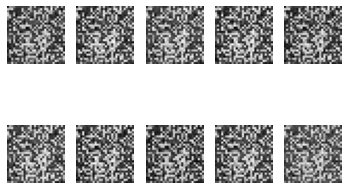

1 [D loss: 0.855662, acc.: 48.44%] [G loss: 1.025341]
2 [D loss: 1.060367, acc.: 33.20%] [G loss: 1.345315]
3 [D loss: 0.752555, acc.: 30.08%] [G loss: 1.539203]
4 [D loss: 0.674889, acc.: 55.86%] [G loss: 1.580992]
5 [D loss: 0.498210, acc.: 91.41%] [G loss: 1.799922]
6 [D loss: 0.367024, acc.: 99.22%] [G loss: 2.148761]
7 [D loss: 0.308088, acc.: 100.00%] [G loss: 2.382241]
8 [D loss: 0.470507, acc.: 74.61%] [G loss: 2.358855]
9 [D loss: 1.482797, acc.: 47.66%] [G loss: 1.759109]
10 [D loss: 0.647538, acc.: 67.58%] [G loss: 2.462526]
11 [D loss: 0.649322, acc.: 70.31%] [G loss: 2.098053]
12 [D loss: 0.513336, acc.: 84.77%] [G loss: 2.217968]
13 [D loss: 0.357251, acc.: 88.67%] [G loss: 2.310736]
14 [D loss: 0.218468, acc.: 94.92%] [G loss: 2.529270]
15 [D loss: 0.155207, acc.: 97.66%] [G loss: 2.602895]
16 [D loss: 0.154334, acc.: 97.27%] [G loss: 2.554637]
17 [D loss: 0.217288, acc.: 98.83%] [G loss: 2.576103]
18 [D loss: 0.539761, acc.: 46.88%] [G loss: 3.347279]
19 [D loss: 0.3840

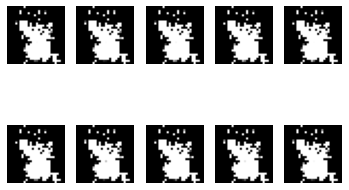

201 [D loss: 0.014210, acc.: 99.61%] [G loss: 5.199668]
202 [D loss: 0.019102, acc.: 99.61%] [G loss: 5.097092]
203 [D loss: 0.008693, acc.: 100.00%] [G loss: 5.391418]
204 [D loss: 0.009614, acc.: 100.00%] [G loss: 5.450521]
205 [D loss: 0.012005, acc.: 100.00%] [G loss: 5.393837]
206 [D loss: 0.013006, acc.: 99.61%] [G loss: 5.324106]
207 [D loss: 0.009959, acc.: 100.00%] [G loss: 5.646565]
208 [D loss: 0.005607, acc.: 100.00%] [G loss: 5.522239]
209 [D loss: 0.007350, acc.: 100.00%] [G loss: 5.640394]
210 [D loss: 0.006563, acc.: 100.00%] [G loss: 5.705896]
211 [D loss: 0.007578, acc.: 100.00%] [G loss: 5.505513]
212 [D loss: 0.007801, acc.: 100.00%] [G loss: 5.411801]
213 [D loss: 0.009115, acc.: 100.00%] [G loss: 5.550725]
214 [D loss: 0.015567, acc.: 100.00%] [G loss: 5.266082]
215 [D loss: 0.012486, acc.: 99.61%] [G loss: 5.243999]
216 [D loss: 0.010638, acc.: 100.00%] [G loss: 5.172565]
217 [D loss: 0.013492, acc.: 100.00%] [G loss: 4.900088]
218 [D loss: 0.017620, acc.: 100.00

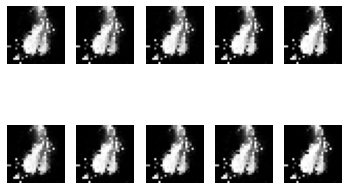

401 [D loss: 0.598202, acc.: 76.95%] [G loss: 1.187862]
402 [D loss: 0.600929, acc.: 69.53%] [G loss: 1.230085]
403 [D loss: 0.567944, acc.: 76.95%] [G loss: 1.281984]
404 [D loss: 0.602685, acc.: 69.92%] [G loss: 1.304786]
405 [D loss: 0.602847, acc.: 71.09%] [G loss: 1.306727]
406 [D loss: 0.580857, acc.: 75.78%] [G loss: 1.294065]
407 [D loss: 0.583249, acc.: 71.09%] [G loss: 1.229452]
408 [D loss: 0.565439, acc.: 75.78%] [G loss: 1.207434]
409 [D loss: 0.614255, acc.: 70.70%] [G loss: 1.172444]
410 [D loss: 0.547230, acc.: 76.17%] [G loss: 1.253525]
411 [D loss: 0.530527, acc.: 77.34%] [G loss: 1.292414]
412 [D loss: 0.530642, acc.: 81.64%] [G loss: 1.288564]
413 [D loss: 0.569890, acc.: 77.73%] [G loss: 1.263102]
414 [D loss: 0.534338, acc.: 83.20%] [G loss: 1.262670]
415 [D loss: 0.575419, acc.: 78.12%] [G loss: 1.211008]
416 [D loss: 0.613606, acc.: 71.88%] [G loss: 1.174768]
417 [D loss: 0.592994, acc.: 73.05%] [G loss: 1.095670]
418 [D loss: 0.607714, acc.: 70.70%] [G loss: 1.

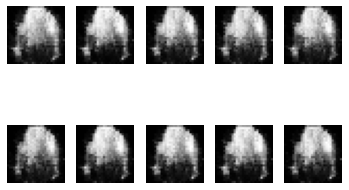

601 [D loss: 0.566499, acc.: 77.34%] [G loss: 1.094105]
602 [D loss: 0.568946, acc.: 76.56%] [G loss: 1.081599]
603 [D loss: 0.530054, acc.: 81.25%] [G loss: 1.080660]
604 [D loss: 0.495393, acc.: 82.81%] [G loss: 1.102194]
605 [D loss: 0.522386, acc.: 79.69%] [G loss: 1.084673]
606 [D loss: 0.485436, acc.: 86.33%] [G loss: 1.063909]
607 [D loss: 0.509704, acc.: 81.64%] [G loss: 1.088215]
608 [D loss: 0.475017, acc.: 88.67%] [G loss: 1.091803]
609 [D loss: 0.487701, acc.: 88.28%] [G loss: 1.087280]
610 [D loss: 0.486090, acc.: 86.33%] [G loss: 1.074160]
611 [D loss: 0.484400, acc.: 88.28%] [G loss: 1.089484]
612 [D loss: 0.472463, acc.: 90.23%] [G loss: 1.104898]
613 [D loss: 0.480316, acc.: 85.55%] [G loss: 1.053889]
614 [D loss: 0.489762, acc.: 82.81%] [G loss: 1.063612]
615 [D loss: 0.482003, acc.: 85.94%] [G loss: 1.004939]
616 [D loss: 0.501097, acc.: 82.42%] [G loss: 1.029378]
617 [D loss: 0.513922, acc.: 82.42%] [G loss: 1.068677]
618 [D loss: 0.535728, acc.: 78.91%] [G loss: 1.

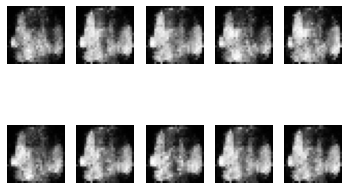

801 [D loss: 0.482187, acc.: 87.11%] [G loss: 1.193785]
802 [D loss: 0.478022, acc.: 84.77%] [G loss: 1.229464]
803 [D loss: 0.427531, acc.: 89.45%] [G loss: 1.247211]
804 [D loss: 0.456448, acc.: 85.94%] [G loss: 1.210047]
805 [D loss: 0.397364, acc.: 90.23%] [G loss: 1.306035]
806 [D loss: 0.453605, acc.: 84.77%] [G loss: 1.205358]
807 [D loss: 0.475359, acc.: 81.64%] [G loss: 1.232695]
808 [D loss: 0.530677, acc.: 75.00%] [G loss: 1.221234]
809 [D loss: 0.476398, acc.: 79.30%] [G loss: 1.207846]
810 [D loss: 0.519462, acc.: 75.78%] [G loss: 1.224782]
811 [D loss: 0.624258, acc.: 69.92%] [G loss: 1.152478]
812 [D loss: 0.597562, acc.: 69.14%] [G loss: 1.195079]
813 [D loss: 0.653859, acc.: 64.84%] [G loss: 1.214388]
814 [D loss: 0.648038, acc.: 66.02%] [G loss: 1.196357]
815 [D loss: 0.689719, acc.: 66.02%] [G loss: 1.327325]
816 [D loss: 0.627770, acc.: 71.48%] [G loss: 1.289996]
817 [D loss: 0.675759, acc.: 65.23%] [G loss: 1.301370]
818 [D loss: 0.598294, acc.: 72.27%] [G loss: 1.

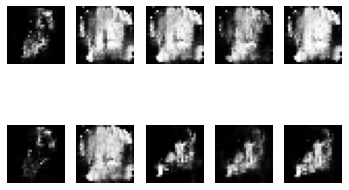

1001 [D loss: 0.751172, acc.: 39.45%] [G loss: 0.800250]
1002 [D loss: 0.759454, acc.: 38.67%] [G loss: 0.792581]
1003 [D loss: 0.758813, acc.: 39.45%] [G loss: 0.822270]
1004 [D loss: 0.742021, acc.: 43.75%] [G loss: 0.837080]
1005 [D loss: 0.721288, acc.: 51.95%] [G loss: 0.860095]
1006 [D loss: 0.747624, acc.: 46.09%] [G loss: 0.837053]
1007 [D loss: 0.730299, acc.: 49.22%] [G loss: 0.833121]
1008 [D loss: 0.778009, acc.: 42.97%] [G loss: 0.834458]
1009 [D loss: 0.720081, acc.: 48.83%] [G loss: 0.818006]
1010 [D loss: 0.716882, acc.: 51.95%] [G loss: 0.827550]
1011 [D loss: 0.750524, acc.: 48.05%] [G loss: 0.839391]
1012 [D loss: 0.753754, acc.: 46.09%] [G loss: 0.822783]
1013 [D loss: 0.737011, acc.: 49.22%] [G loss: 0.849999]
1014 [D loss: 0.716989, acc.: 50.39%] [G loss: 0.845893]
1015 [D loss: 0.729426, acc.: 51.17%] [G loss: 0.866492]
1016 [D loss: 0.753532, acc.: 51.56%] [G loss: 0.865973]
1017 [D loss: 0.707568, acc.: 54.30%] [G loss: 0.853694]
1018 [D loss: 0.728640, acc.: 5

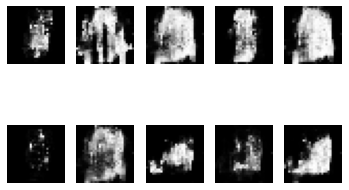

1201 [D loss: 0.720205, acc.: 43.75%] [G loss: 0.838175]
1202 [D loss: 0.707963, acc.: 50.39%] [G loss: 0.841878]
1203 [D loss: 0.699415, acc.: 50.78%] [G loss: 0.830765]
1204 [D loss: 0.696576, acc.: 48.83%] [G loss: 0.849060]
1205 [D loss: 0.704174, acc.: 53.52%] [G loss: 0.855105]
1206 [D loss: 0.673945, acc.: 61.33%] [G loss: 0.858073]
1207 [D loss: 0.665284, acc.: 61.72%] [G loss: 0.862702]
1208 [D loss: 0.626006, acc.: 67.19%] [G loss: 0.886395]
1209 [D loss: 0.680254, acc.: 59.77%] [G loss: 0.890185]
1210 [D loss: 0.667425, acc.: 63.67%] [G loss: 0.898200]
1211 [D loss: 0.649716, acc.: 67.58%] [G loss: 0.884073]
1212 [D loss: 0.657813, acc.: 64.45%] [G loss: 0.878161]
1213 [D loss: 0.642098, acc.: 67.19%] [G loss: 0.883894]
1214 [D loss: 0.623259, acc.: 66.41%] [G loss: 0.867371]
1215 [D loss: 0.647206, acc.: 67.97%] [G loss: 0.863945]
1216 [D loss: 0.670010, acc.: 53.12%] [G loss: 0.891881]
1217 [D loss: 0.656986, acc.: 58.98%] [G loss: 0.869879]
1218 [D loss: 0.650827, acc.: 5

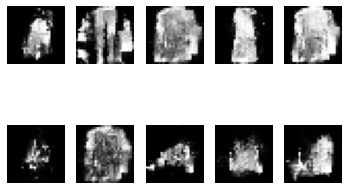

1401 [D loss: 0.699335, acc.: 52.73%] [G loss: 0.802456]
1402 [D loss: 0.667257, acc.: 60.55%] [G loss: 0.800704]
1403 [D loss: 0.665047, acc.: 58.59%] [G loss: 0.804228]
1404 [D loss: 0.681037, acc.: 57.42%] [G loss: 0.800391]
1405 [D loss: 0.688168, acc.: 55.47%] [G loss: 0.768744]
1406 [D loss: 0.661658, acc.: 57.03%] [G loss: 0.782547]
1407 [D loss: 0.650010, acc.: 63.28%] [G loss: 0.783049]
1408 [D loss: 0.678159, acc.: 55.86%] [G loss: 0.784008]
1409 [D loss: 0.673309, acc.: 58.59%] [G loss: 0.814043]
1410 [D loss: 0.654210, acc.: 59.38%] [G loss: 0.808787]
1411 [D loss: 0.684557, acc.: 55.86%] [G loss: 0.796157]
1412 [D loss: 0.671973, acc.: 57.81%] [G loss: 0.788808]
1413 [D loss: 0.687347, acc.: 51.17%] [G loss: 0.781806]
1414 [D loss: 0.683343, acc.: 51.56%] [G loss: 0.768746]
1415 [D loss: 0.694161, acc.: 53.52%] [G loss: 0.774733]
1416 [D loss: 0.670769, acc.: 57.03%] [G loss: 0.770749]
1417 [D loss: 0.688363, acc.: 50.39%] [G loss: 0.779187]
1418 [D loss: 0.669035, acc.: 5

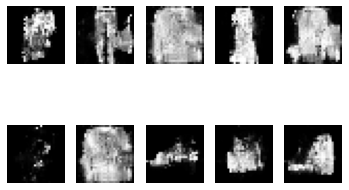

1601 [D loss: 0.669691, acc.: 63.28%] [G loss: 0.775774]
1602 [D loss: 0.682972, acc.: 55.86%] [G loss: 0.767631]
1603 [D loss: 0.673906, acc.: 61.72%] [G loss: 0.766935]
1604 [D loss: 0.700941, acc.: 51.95%] [G loss: 0.782418]
1605 [D loss: 0.662182, acc.: 66.80%] [G loss: 0.778558]
1606 [D loss: 0.668847, acc.: 63.28%] [G loss: 0.785698]
1607 [D loss: 0.691007, acc.: 59.38%] [G loss: 0.774046]
1608 [D loss: 0.674043, acc.: 58.20%] [G loss: 0.759504]
1609 [D loss: 0.682310, acc.: 55.86%] [G loss: 0.769323]
1610 [D loss: 0.665403, acc.: 59.77%] [G loss: 0.772973]
1611 [D loss: 0.662476, acc.: 60.94%] [G loss: 0.758266]
1612 [D loss: 0.678565, acc.: 55.86%] [G loss: 0.794156]
1613 [D loss: 0.687667, acc.: 56.64%] [G loss: 0.765561]
1614 [D loss: 0.680034, acc.: 52.34%] [G loss: 0.776759]
1615 [D loss: 0.671765, acc.: 56.25%] [G loss: 0.783408]
1616 [D loss: 0.659617, acc.: 61.33%] [G loss: 0.792564]
1617 [D loss: 0.677880, acc.: 58.98%] [G loss: 0.785557]
1618 [D loss: 0.678237, acc.: 5

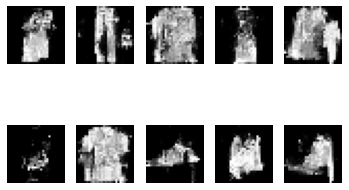

1801 [D loss: 0.640075, acc.: 71.09%] [G loss: 0.844126]
1802 [D loss: 0.666455, acc.: 64.45%] [G loss: 0.840477]
1803 [D loss: 0.663090, acc.: 64.45%] [G loss: 0.824270]
1804 [D loss: 0.647098, acc.: 66.41%] [G loss: 0.830489]
1805 [D loss: 0.662899, acc.: 62.89%] [G loss: 0.820455]
1806 [D loss: 0.666012, acc.: 60.16%] [G loss: 0.828636]
1807 [D loss: 0.652136, acc.: 66.02%] [G loss: 0.822609]
1808 [D loss: 0.641687, acc.: 64.45%] [G loss: 0.835227]
1809 [D loss: 0.666891, acc.: 59.77%] [G loss: 0.826336]
1810 [D loss: 0.643699, acc.: 63.28%] [G loss: 0.818668]
1811 [D loss: 0.634870, acc.: 64.84%] [G loss: 0.826806]
1812 [D loss: 0.646945, acc.: 61.72%] [G loss: 0.811639]
1813 [D loss: 0.675057, acc.: 55.47%] [G loss: 0.834079]
1814 [D loss: 0.668305, acc.: 55.47%] [G loss: 0.830963]
1815 [D loss: 0.663948, acc.: 57.42%] [G loss: 0.817087]
1816 [D loss: 0.669462, acc.: 55.08%] [G loss: 0.813580]
1817 [D loss: 0.664645, acc.: 57.42%] [G loss: 0.828690]
1818 [D loss: 0.679573, acc.: 5

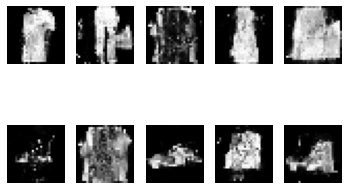

2001 [D loss: 0.681543, acc.: 57.42%] [G loss: 0.788385]
2002 [D loss: 0.689401, acc.: 54.69%] [G loss: 0.773981]
2003 [D loss: 0.670156, acc.: 59.38%] [G loss: 0.763331]
2004 [D loss: 0.667607, acc.: 62.50%] [G loss: 0.774600]
2005 [D loss: 0.668528, acc.: 59.77%] [G loss: 0.778439]
2006 [D loss: 0.682185, acc.: 58.98%] [G loss: 0.779330]
2007 [D loss: 0.689688, acc.: 57.42%] [G loss: 0.781397]
2008 [D loss: 0.678007, acc.: 58.20%] [G loss: 0.785739]
2009 [D loss: 0.666157, acc.: 63.28%] [G loss: 0.791855]
2010 [D loss: 0.680987, acc.: 57.42%] [G loss: 0.803055]
2011 [D loss: 0.668965, acc.: 60.94%] [G loss: 0.803531]
2012 [D loss: 0.681992, acc.: 58.59%] [G loss: 0.793746]
2013 [D loss: 0.663904, acc.: 59.38%] [G loss: 0.797257]
2014 [D loss: 0.671990, acc.: 58.98%] [G loss: 0.777009]
2015 [D loss: 0.677762, acc.: 55.47%] [G loss: 0.802770]
2016 [D loss: 0.662689, acc.: 65.62%] [G loss: 0.786904]
2017 [D loss: 0.654477, acc.: 65.23%] [G loss: 0.776307]
2018 [D loss: 0.683771, acc.: 6

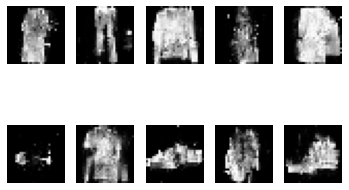

2201 [D loss: 0.689058, acc.: 53.91%] [G loss: 0.769567]
2202 [D loss: 0.670833, acc.: 60.94%] [G loss: 0.790522]
2203 [D loss: 0.662003, acc.: 59.38%] [G loss: 0.808295]
2204 [D loss: 0.688676, acc.: 58.59%] [G loss: 0.784920]
2205 [D loss: 0.685393, acc.: 57.81%] [G loss: 0.786822]
2206 [D loss: 0.647368, acc.: 62.11%] [G loss: 0.780333]
2207 [D loss: 0.660795, acc.: 59.38%] [G loss: 0.808320]
2208 [D loss: 0.672129, acc.: 60.55%] [G loss: 0.792787]
2209 [D loss: 0.664994, acc.: 60.94%] [G loss: 0.799575]
2210 [D loss: 0.673219, acc.: 57.03%] [G loss: 0.814134]
2211 [D loss: 0.630873, acc.: 66.02%] [G loss: 0.828333]
2212 [D loss: 0.688301, acc.: 53.52%] [G loss: 0.810625]
2213 [D loss: 0.695661, acc.: 50.78%] [G loss: 0.813712]
2214 [D loss: 0.664413, acc.: 60.16%] [G loss: 0.800850]
2215 [D loss: 0.667523, acc.: 59.38%] [G loss: 0.831907]
2216 [D loss: 0.667021, acc.: 58.20%] [G loss: 0.805586]
2217 [D loss: 0.660783, acc.: 61.33%] [G loss: 0.787920]
2218 [D loss: 0.658340, acc.: 6

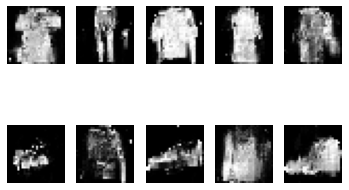

2401 [D loss: 0.694802, acc.: 53.52%] [G loss: 0.759488]
2402 [D loss: 0.712730, acc.: 46.88%] [G loss: 0.770173]
2403 [D loss: 0.685416, acc.: 54.69%] [G loss: 0.755714]
2404 [D loss: 0.695448, acc.: 48.05%] [G loss: 0.761665]
2405 [D loss: 0.698290, acc.: 51.17%] [G loss: 0.751472]
2406 [D loss: 0.692967, acc.: 49.61%] [G loss: 0.744624]
2407 [D loss: 0.683343, acc.: 51.95%] [G loss: 0.756167]
2408 [D loss: 0.692471, acc.: 53.12%] [G loss: 0.777863]
2409 [D loss: 0.700474, acc.: 50.00%] [G loss: 0.770140]
2410 [D loss: 0.687760, acc.: 55.86%] [G loss: 0.775173]
2411 [D loss: 0.698486, acc.: 54.69%] [G loss: 0.767905]
2412 [D loss: 0.699130, acc.: 51.56%] [G loss: 0.757642]
2413 [D loss: 0.716683, acc.: 50.78%] [G loss: 0.747242]
2414 [D loss: 0.690795, acc.: 55.86%] [G loss: 0.743248]
2415 [D loss: 0.710497, acc.: 48.44%] [G loss: 0.768413]
2416 [D loss: 0.683688, acc.: 55.86%] [G loss: 0.774940]
2417 [D loss: 0.686736, acc.: 58.98%] [G loss: 0.767673]
2418 [D loss: 0.706535, acc.: 5

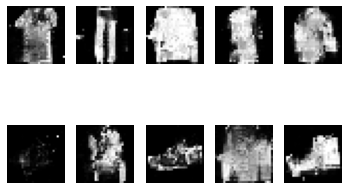

2601 [D loss: 0.669547, acc.: 56.64%] [G loss: 0.771816]
2602 [D loss: 0.688495, acc.: 49.61%] [G loss: 0.770533]
2603 [D loss: 0.687879, acc.: 52.73%] [G loss: 0.751212]
2604 [D loss: 0.702310, acc.: 50.39%] [G loss: 0.767367]
2605 [D loss: 0.691629, acc.: 51.56%] [G loss: 0.752944]
2606 [D loss: 0.685404, acc.: 51.56%] [G loss: 0.759340]
2607 [D loss: 0.680415, acc.: 49.22%] [G loss: 0.755588]
2608 [D loss: 0.689064, acc.: 50.78%] [G loss: 0.769356]
2609 [D loss: 0.674438, acc.: 54.30%] [G loss: 0.775814]
2610 [D loss: 0.681450, acc.: 52.34%] [G loss: 0.779348]
2611 [D loss: 0.678178, acc.: 55.47%] [G loss: 0.781341]
2612 [D loss: 0.678646, acc.: 53.52%] [G loss: 0.781747]
2613 [D loss: 0.707702, acc.: 44.14%] [G loss: 0.786938]
2614 [D loss: 0.695894, acc.: 46.48%] [G loss: 0.792373]
2615 [D loss: 0.707460, acc.: 48.83%] [G loss: 0.781028]
2616 [D loss: 0.682425, acc.: 55.86%] [G loss: 0.751359]
2617 [D loss: 0.700092, acc.: 45.31%] [G loss: 0.760389]
2618 [D loss: 0.685410, acc.: 4

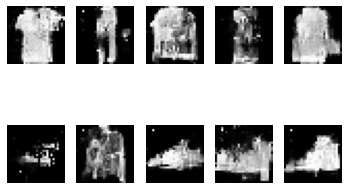

2801 [D loss: 0.709528, acc.: 44.92%] [G loss: 0.752120]
2802 [D loss: 0.709395, acc.: 44.14%] [G loss: 0.745000]
2803 [D loss: 0.717069, acc.: 40.62%] [G loss: 0.757733]
2804 [D loss: 0.705851, acc.: 48.83%] [G loss: 0.763263]
2805 [D loss: 0.707645, acc.: 46.09%] [G loss: 0.758801]
2806 [D loss: 0.707876, acc.: 43.75%] [G loss: 0.755551]
2807 [D loss: 0.738161, acc.: 41.41%] [G loss: 0.729667]
2808 [D loss: 0.722264, acc.: 41.41%] [G loss: 0.744572]
2809 [D loss: 0.730132, acc.: 40.62%] [G loss: 0.734869]
2810 [D loss: 0.703428, acc.: 46.48%] [G loss: 0.735146]
2811 [D loss: 0.720723, acc.: 47.27%] [G loss: 0.726693]
2812 [D loss: 0.707791, acc.: 42.97%] [G loss: 0.728842]
2813 [D loss: 0.720309, acc.: 42.58%] [G loss: 0.724761]
2814 [D loss: 0.724745, acc.: 43.36%] [G loss: 0.727677]
2815 [D loss: 0.719917, acc.: 42.97%] [G loss: 0.728368]
2816 [D loss: 0.719405, acc.: 46.48%] [G loss: 0.748281]
2817 [D loss: 0.737327, acc.: 40.23%] [G loss: 0.736482]
2818 [D loss: 0.728216, acc.: 4

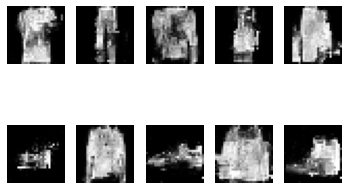

3001 [D loss: 0.700737, acc.: 53.12%] [G loss: 0.735766]
3002 [D loss: 0.704294, acc.: 52.73%] [G loss: 0.731650]
3003 [D loss: 0.683860, acc.: 55.47%] [G loss: 0.736701]
3004 [D loss: 0.688419, acc.: 55.86%] [G loss: 0.738364]
3005 [D loss: 0.693628, acc.: 53.52%] [G loss: 0.734176]
3006 [D loss: 0.688908, acc.: 51.56%] [G loss: 0.740160]
3007 [D loss: 0.681373, acc.: 59.77%] [G loss: 0.749218]
3008 [D loss: 0.684790, acc.: 58.20%] [G loss: 0.740869]
3009 [D loss: 0.707781, acc.: 47.66%] [G loss: 0.745407]
3010 [D loss: 0.684885, acc.: 57.81%] [G loss: 0.744436]
3011 [D loss: 0.692266, acc.: 57.81%] [G loss: 0.743522]
3012 [D loss: 0.691467, acc.: 55.47%] [G loss: 0.743941]
3013 [D loss: 0.693956, acc.: 53.52%] [G loss: 0.737791]
3014 [D loss: 0.687249, acc.: 59.77%] [G loss: 0.738992]
3015 [D loss: 0.694418, acc.: 54.69%] [G loss: 0.739281]
3016 [D loss: 0.690898, acc.: 59.38%] [G loss: 0.737787]
3017 [D loss: 0.690593, acc.: 52.34%] [G loss: 0.738826]
3018 [D loss: 0.698443, acc.: 4

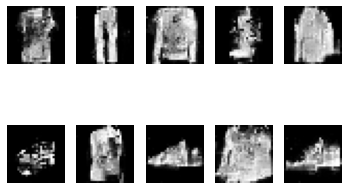

3201 [D loss: 0.685026, acc.: 54.30%] [G loss: 0.744163]
3202 [D loss: 0.670334, acc.: 59.38%] [G loss: 0.757991]
3203 [D loss: 0.694478, acc.: 51.56%] [G loss: 0.753976]
3204 [D loss: 0.676091, acc.: 62.11%] [G loss: 0.741220]
3205 [D loss: 0.694604, acc.: 54.30%] [G loss: 0.734323]
3206 [D loss: 0.685158, acc.: 58.20%] [G loss: 0.748415]
3207 [D loss: 0.682277, acc.: 59.38%] [G loss: 0.735542]
3208 [D loss: 0.696401, acc.: 53.12%] [G loss: 0.720685]
3209 [D loss: 0.695806, acc.: 55.47%] [G loss: 0.717064]
3210 [D loss: 0.689997, acc.: 52.73%] [G loss: 0.726547]
3211 [D loss: 0.692011, acc.: 53.52%] [G loss: 0.726606]
3212 [D loss: 0.682750, acc.: 60.16%] [G loss: 0.722564]
3213 [D loss: 0.686132, acc.: 59.38%] [G loss: 0.738121]
3214 [D loss: 0.685562, acc.: 55.08%] [G loss: 0.730224]
3215 [D loss: 0.696932, acc.: 57.03%] [G loss: 0.727795]
3216 [D loss: 0.702722, acc.: 52.34%] [G loss: 0.730844]
3217 [D loss: 0.697908, acc.: 49.61%] [G loss: 0.728473]
3218 [D loss: 0.707936, acc.: 5

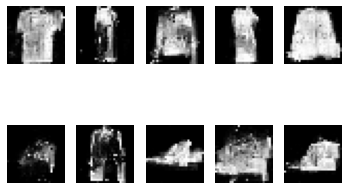

3401 [D loss: 0.676900, acc.: 55.47%] [G loss: 0.757425]
3402 [D loss: 0.677670, acc.: 57.42%] [G loss: 0.770057]
3403 [D loss: 0.688829, acc.: 54.69%] [G loss: 0.766090]
3404 [D loss: 0.668022, acc.: 58.59%] [G loss: 0.768746]
3405 [D loss: 0.667791, acc.: 60.16%] [G loss: 0.766638]
3406 [D loss: 0.678175, acc.: 55.86%] [G loss: 0.765893]
3407 [D loss: 0.681125, acc.: 54.69%] [G loss: 0.765443]
3408 [D loss: 0.660142, acc.: 63.67%] [G loss: 0.760513]
3409 [D loss: 0.693592, acc.: 57.81%] [G loss: 0.757161]
3410 [D loss: 0.676411, acc.: 55.86%] [G loss: 0.763037]
3411 [D loss: 0.656938, acc.: 67.58%] [G loss: 0.766176]
3412 [D loss: 0.667387, acc.: 61.72%] [G loss: 0.785075]
3413 [D loss: 0.659436, acc.: 69.92%] [G loss: 0.770053]
3414 [D loss: 0.665767, acc.: 66.41%] [G loss: 0.772612]
3415 [D loss: 0.673046, acc.: 61.72%] [G loss: 0.766092]
3416 [D loss: 0.680542, acc.: 62.11%] [G loss: 0.761610]
3417 [D loss: 0.665326, acc.: 65.62%] [G loss: 0.766307]
3418 [D loss: 0.646829, acc.: 7

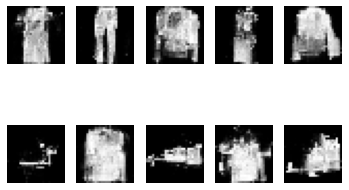

3601 [D loss: 0.681503, acc.: 60.16%] [G loss: 0.762376]
3602 [D loss: 0.673273, acc.: 62.50%] [G loss: 0.753885]
3603 [D loss: 0.692082, acc.: 53.12%] [G loss: 0.761716]
3604 [D loss: 0.689492, acc.: 57.42%] [G loss: 0.778088]
3605 [D loss: 0.686074, acc.: 56.64%] [G loss: 0.772191]
3606 [D loss: 0.680096, acc.: 59.38%] [G loss: 0.769390]
3607 [D loss: 0.691652, acc.: 53.91%] [G loss: 0.769340]
3608 [D loss: 0.675470, acc.: 60.94%] [G loss: 0.773832]
3609 [D loss: 0.686010, acc.: 59.38%] [G loss: 0.767480]
3610 [D loss: 0.694134, acc.: 55.08%] [G loss: 0.768040]
3611 [D loss: 0.679462, acc.: 58.98%] [G loss: 0.786748]
3612 [D loss: 0.692143, acc.: 54.69%] [G loss: 0.768898]
3613 [D loss: 0.675679, acc.: 65.23%] [G loss: 0.770671]
3614 [D loss: 0.674723, acc.: 59.77%] [G loss: 0.762928]
3615 [D loss: 0.662457, acc.: 66.02%] [G loss: 0.770344]
3616 [D loss: 0.683183, acc.: 54.30%] [G loss: 0.775243]
3617 [D loss: 0.655656, acc.: 65.62%] [G loss: 0.780224]
3618 [D loss: 0.676538, acc.: 5

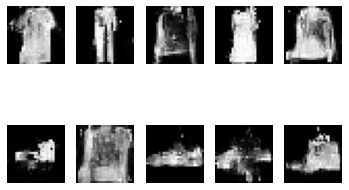

3801 [D loss: 0.719629, acc.: 45.70%] [G loss: 0.737306]
3802 [D loss: 0.717774, acc.: 42.19%] [G loss: 0.726647]
3803 [D loss: 0.703072, acc.: 46.09%] [G loss: 0.733063]
3804 [D loss: 0.716698, acc.: 41.41%] [G loss: 0.739433]
3805 [D loss: 0.711158, acc.: 41.41%] [G loss: 0.742805]
3806 [D loss: 0.697884, acc.: 46.09%] [G loss: 0.731171]
3807 [D loss: 0.703184, acc.: 45.31%] [G loss: 0.737458]
3808 [D loss: 0.703662, acc.: 48.44%] [G loss: 0.745381]
3809 [D loss: 0.699083, acc.: 49.22%] [G loss: 0.733652]
3810 [D loss: 0.697786, acc.: 48.83%] [G loss: 0.739510]
3811 [D loss: 0.714667, acc.: 50.78%] [G loss: 0.738973]
3812 [D loss: 0.717211, acc.: 46.88%] [G loss: 0.724192]
3813 [D loss: 0.702795, acc.: 50.78%] [G loss: 0.736364]
3814 [D loss: 0.722017, acc.: 44.53%] [G loss: 0.730842]
3815 [D loss: 0.707590, acc.: 46.48%] [G loss: 0.733117]
3816 [D loss: 0.703415, acc.: 48.05%] [G loss: 0.738125]
3817 [D loss: 0.714154, acc.: 45.31%] [G loss: 0.743749]
3818 [D loss: 0.709421, acc.: 4

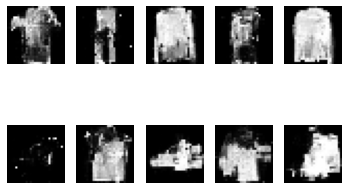

4001 [D loss: 0.690298, acc.: 53.52%] [G loss: 0.773820]
4002 [D loss: 0.683175, acc.: 55.86%] [G loss: 0.759975]
4003 [D loss: 0.686305, acc.: 52.34%] [G loss: 0.797244]
4004 [D loss: 0.700844, acc.: 51.95%] [G loss: 0.762904]
4005 [D loss: 0.686641, acc.: 52.34%] [G loss: 0.761816]
4006 [D loss: 0.687402, acc.: 52.73%] [G loss: 0.791311]
4007 [D loss: 0.683743, acc.: 55.47%] [G loss: 0.769082]
4008 [D loss: 0.693961, acc.: 56.25%] [G loss: 0.780222]
4009 [D loss: 0.682074, acc.: 58.20%] [G loss: 0.773193]
4010 [D loss: 0.676086, acc.: 59.38%] [G loss: 0.775210]
4011 [D loss: 0.684013, acc.: 57.03%] [G loss: 0.779347]
4012 [D loss: 0.679712, acc.: 54.69%] [G loss: 0.786396]
4013 [D loss: 0.675935, acc.: 60.16%] [G loss: 0.790558]
4014 [D loss: 0.665403, acc.: 65.62%] [G loss: 0.785553]
4015 [D loss: 0.659788, acc.: 63.28%] [G loss: 0.785197]
4016 [D loss: 0.662746, acc.: 62.50%] [G loss: 0.786012]
4017 [D loss: 0.667847, acc.: 60.16%] [G loss: 0.789172]
4018 [D loss: 0.659450, acc.: 6

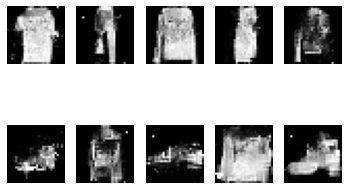

4201 [D loss: 0.694403, acc.: 41.41%] [G loss: 0.763659]
4202 [D loss: 0.681865, acc.: 43.75%] [G loss: 0.769581]
4203 [D loss: 0.665181, acc.: 48.44%] [G loss: 0.768585]
4204 [D loss: 0.679220, acc.: 50.39%] [G loss: 0.763569]
4205 [D loss: 0.669609, acc.: 49.22%] [G loss: 0.767474]
4206 [D loss: 0.677662, acc.: 53.91%] [G loss: 0.783799]
4207 [D loss: 0.668068, acc.: 55.47%] [G loss: 0.772976]
4208 [D loss: 0.669915, acc.: 60.55%] [G loss: 0.780309]
4209 [D loss: 0.674794, acc.: 56.64%] [G loss: 0.779959]
4210 [D loss: 0.670436, acc.: 56.64%] [G loss: 0.777268]
4211 [D loss: 0.668178, acc.: 56.25%] [G loss: 0.772509]
4212 [D loss: 0.674083, acc.: 51.95%] [G loss: 0.762220]
4213 [D loss: 0.680144, acc.: 52.34%] [G loss: 0.751180]
4214 [D loss: 0.657468, acc.: 61.72%] [G loss: 0.767340]
4215 [D loss: 0.683217, acc.: 45.70%] [G loss: 0.754689]
4216 [D loss: 0.692565, acc.: 47.27%] [G loss: 0.747647]
4217 [D loss: 0.666801, acc.: 55.86%] [G loss: 0.770426]
4218 [D loss: 0.683114, acc.: 5

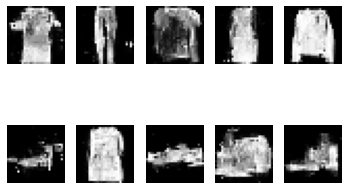

4401 [D loss: 0.694623, acc.: 43.36%] [G loss: 0.735048]
4402 [D loss: 0.693106, acc.: 45.70%] [G loss: 0.751666]
4403 [D loss: 0.697791, acc.: 46.88%] [G loss: 0.734159]
4404 [D loss: 0.694564, acc.: 48.83%] [G loss: 0.754292]
4405 [D loss: 0.700849, acc.: 49.22%] [G loss: 0.745604]
4406 [D loss: 0.684022, acc.: 52.73%] [G loss: 0.739506]
4407 [D loss: 0.696348, acc.: 49.61%] [G loss: 0.769125]
4408 [D loss: 0.691435, acc.: 52.73%] [G loss: 0.750585]
4409 [D loss: 0.698493, acc.: 48.83%] [G loss: 0.751176]
4410 [D loss: 0.699806, acc.: 48.83%] [G loss: 0.762685]
4411 [D loss: 0.689812, acc.: 53.91%] [G loss: 0.761812]
4412 [D loss: 0.693612, acc.: 55.08%] [G loss: 0.772555]
4413 [D loss: 0.689976, acc.: 52.34%] [G loss: 0.770319]
4414 [D loss: 0.685595, acc.: 54.30%] [G loss: 0.772817]
4415 [D loss: 0.693603, acc.: 53.91%] [G loss: 0.760460]
4416 [D loss: 0.684149, acc.: 55.86%] [G loss: 0.766953]
4417 [D loss: 0.694123, acc.: 57.03%] [G loss: 0.757930]
4418 [D loss: 0.685255, acc.: 5

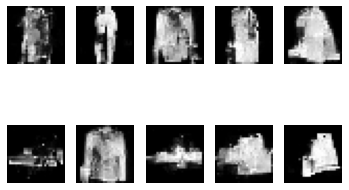

4601 [D loss: 0.683933, acc.: 51.17%] [G loss: 0.768591]
4602 [D loss: 0.689443, acc.: 49.61%] [G loss: 0.762991]
4603 [D loss: 0.685443, acc.: 49.61%] [G loss: 0.766974]
4604 [D loss: 0.680221, acc.: 52.34%] [G loss: 0.761333]
4605 [D loss: 0.687353, acc.: 49.22%] [G loss: 0.775413]
4606 [D loss: 0.673188, acc.: 55.47%] [G loss: 0.776234]
4607 [D loss: 0.670767, acc.: 57.03%] [G loss: 0.780403]
4608 [D loss: 0.690190, acc.: 48.05%] [G loss: 0.768286]
4609 [D loss: 0.666875, acc.: 60.55%] [G loss: 0.768891]
4610 [D loss: 0.675473, acc.: 48.44%] [G loss: 0.764264]
4611 [D loss: 0.657064, acc.: 57.81%] [G loss: 0.785769]
4612 [D loss: 0.688170, acc.: 49.61%] [G loss: 0.765443]
4613 [D loss: 0.663209, acc.: 53.52%] [G loss: 0.785268]
4614 [D loss: 0.674472, acc.: 51.95%] [G loss: 0.766704]
4615 [D loss: 0.690902, acc.: 51.17%] [G loss: 0.763736]
4616 [D loss: 0.669030, acc.: 53.52%] [G loss: 0.763507]
4617 [D loss: 0.686336, acc.: 51.17%] [G loss: 0.761795]
4618 [D loss: 0.682361, acc.: 5

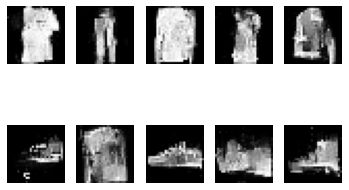

4801 [D loss: 0.692728, acc.: 52.34%] [G loss: 0.748544]
4802 [D loss: 0.683514, acc.: 55.86%] [G loss: 0.747545]
4803 [D loss: 0.694996, acc.: 54.30%] [G loss: 0.725948]
4804 [D loss: 0.677102, acc.: 58.59%] [G loss: 0.736767]
4805 [D loss: 0.684280, acc.: 51.56%] [G loss: 0.750545]
4806 [D loss: 0.691611, acc.: 57.42%] [G loss: 0.749437]
4807 [D loss: 0.678332, acc.: 59.77%] [G loss: 0.745970]
4808 [D loss: 0.673959, acc.: 60.55%] [G loss: 0.750171]
4809 [D loss: 0.671879, acc.: 60.55%] [G loss: 0.761771]
4810 [D loss: 0.683507, acc.: 55.86%] [G loss: 0.747970]
4811 [D loss: 0.680210, acc.: 58.20%] [G loss: 0.753849]
4812 [D loss: 0.665846, acc.: 62.89%] [G loss: 0.743215]
4813 [D loss: 0.683059, acc.: 57.81%] [G loss: 0.757103]
4814 [D loss: 0.684020, acc.: 57.03%] [G loss: 0.767743]
4815 [D loss: 0.678555, acc.: 57.42%] [G loss: 0.767316]
4816 [D loss: 0.681460, acc.: 60.55%] [G loss: 0.740379]
4817 [D loss: 0.688847, acc.: 53.52%] [G loss: 0.743808]
4818 [D loss: 0.679269, acc.: 5

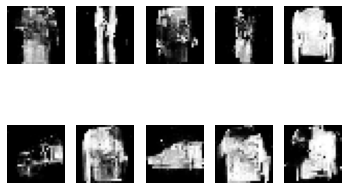

5001 [D loss: 0.670589, acc.: 62.50%] [G loss: 0.776050]
5002 [D loss: 0.663320, acc.: 63.67%] [G loss: 0.776126]
5003 [D loss: 0.668914, acc.: 60.94%] [G loss: 0.782956]
5004 [D loss: 0.652248, acc.: 67.97%] [G loss: 0.782470]
5005 [D loss: 0.655921, acc.: 68.36%] [G loss: 0.795166]
5006 [D loss: 0.655141, acc.: 68.36%] [G loss: 0.797228]
5007 [D loss: 0.664148, acc.: 66.80%] [G loss: 0.794785]
5008 [D loss: 0.649720, acc.: 72.27%] [G loss: 0.787594]
5009 [D loss: 0.667685, acc.: 65.62%] [G loss: 0.776728]
5010 [D loss: 0.650699, acc.: 66.02%] [G loss: 0.788330]
5011 [D loss: 0.661533, acc.: 66.80%] [G loss: 0.777211]
5012 [D loss: 0.656642, acc.: 64.45%] [G loss: 0.779167]
5013 [D loss: 0.659506, acc.: 64.06%] [G loss: 0.802472]
5014 [D loss: 0.661966, acc.: 59.38%] [G loss: 0.782226]
5015 [D loss: 0.673180, acc.: 59.38%] [G loss: 0.784658]
5016 [D loss: 0.657295, acc.: 65.23%] [G loss: 0.769868]
5017 [D loss: 0.657234, acc.: 66.80%] [G loss: 0.766298]
5018 [D loss: 0.668712, acc.: 6

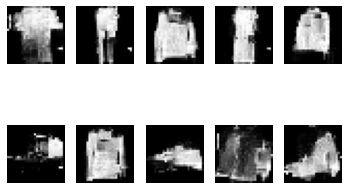

5201 [D loss: 0.669583, acc.: 55.08%] [G loss: 0.764437]
5202 [D loss: 0.658423, acc.: 62.11%] [G loss: 0.779402]
5203 [D loss: 0.661222, acc.: 62.11%] [G loss: 0.778524]
5204 [D loss: 0.680460, acc.: 55.86%] [G loss: 0.765838]
5205 [D loss: 0.671892, acc.: 58.98%] [G loss: 0.783012]
5206 [D loss: 0.681813, acc.: 55.08%] [G loss: 0.778355]
5207 [D loss: 0.684927, acc.: 52.34%] [G loss: 0.771699]
5208 [D loss: 0.676907, acc.: 57.81%] [G loss: 0.755448]
5209 [D loss: 0.692924, acc.: 53.52%] [G loss: 0.776328]
5210 [D loss: 0.694698, acc.: 55.47%] [G loss: 0.787930]
5211 [D loss: 0.686228, acc.: 51.95%] [G loss: 0.759741]
5212 [D loss: 0.695669, acc.: 48.83%] [G loss: 0.772829]
5213 [D loss: 0.694544, acc.: 54.69%] [G loss: 0.770694]
5214 [D loss: 0.679404, acc.: 58.20%] [G loss: 0.777988]
5215 [D loss: 0.693192, acc.: 52.73%] [G loss: 0.791347]
5216 [D loss: 0.686106, acc.: 54.30%] [G loss: 0.766648]
5217 [D loss: 0.653870, acc.: 66.80%] [G loss: 0.781689]
5218 [D loss: 0.680610, acc.: 5

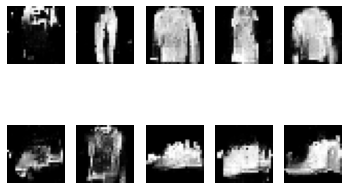

5401 [D loss: 0.697987, acc.: 46.48%] [G loss: 0.756211]
5402 [D loss: 0.697759, acc.: 47.27%] [G loss: 0.756760]
5403 [D loss: 0.687725, acc.: 52.73%] [G loss: 0.753303]
5404 [D loss: 0.700112, acc.: 42.58%] [G loss: 0.748470]
5405 [D loss: 0.698793, acc.: 46.88%] [G loss: 0.739346]
5406 [D loss: 0.692243, acc.: 51.56%] [G loss: 0.720093]
5407 [D loss: 0.702381, acc.: 45.31%] [G loss: 0.752233]
5408 [D loss: 0.702788, acc.: 45.70%] [G loss: 0.729528]
5409 [D loss: 0.715651, acc.: 43.36%] [G loss: 0.700979]
5410 [D loss: 0.696554, acc.: 47.66%] [G loss: 0.720627]
5411 [D loss: 0.722282, acc.: 41.41%] [G loss: 0.736033]
5412 [D loss: 0.715777, acc.: 42.97%] [G loss: 0.722569]
5413 [D loss: 0.715099, acc.: 44.53%] [G loss: 0.720812]
5414 [D loss: 0.706315, acc.: 44.53%] [G loss: 0.722682]
5415 [D loss: 0.717379, acc.: 39.84%] [G loss: 0.731162]
5416 [D loss: 0.710854, acc.: 41.80%] [G loss: 0.718980]
5417 [D loss: 0.701023, acc.: 48.05%] [G loss: 0.731183]
5418 [D loss: 0.704333, acc.: 4

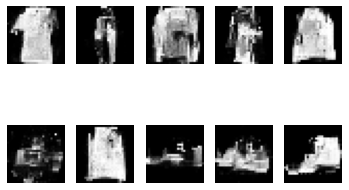

5601 [D loss: 0.675401, acc.: 60.55%] [G loss: 0.763517]
5602 [D loss: 0.689221, acc.: 53.91%] [G loss: 0.784787]
5603 [D loss: 0.689074, acc.: 54.30%] [G loss: 0.765351]
5604 [D loss: 0.689212, acc.: 52.73%] [G loss: 0.766475]
5605 [D loss: 0.676661, acc.: 58.59%] [G loss: 0.774902]
5606 [D loss: 0.691239, acc.: 58.98%] [G loss: 0.746389]
5607 [D loss: 0.694003, acc.: 55.47%] [G loss: 0.748093]
5608 [D loss: 0.692231, acc.: 51.95%] [G loss: 0.742451]
5609 [D loss: 0.689781, acc.: 56.64%] [G loss: 0.747325]
5610 [D loss: 0.677809, acc.: 59.38%] [G loss: 0.748185]
5611 [D loss: 0.680777, acc.: 55.47%] [G loss: 0.750249]
5612 [D loss: 0.680741, acc.: 57.42%] [G loss: 0.753620]
5613 [D loss: 0.706234, acc.: 46.09%] [G loss: 0.741276]
5614 [D loss: 0.701536, acc.: 52.73%] [G loss: 0.737887]
5615 [D loss: 0.697630, acc.: 50.39%] [G loss: 0.739782]
5616 [D loss: 0.701573, acc.: 51.95%] [G loss: 0.744912]
5617 [D loss: 0.696633, acc.: 53.12%] [G loss: 0.742430]
5618 [D loss: 0.686884, acc.: 5

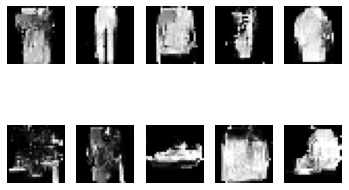

5801 [D loss: 0.685593, acc.: 56.64%] [G loss: 0.736182]
5802 [D loss: 0.683402, acc.: 58.20%] [G loss: 0.733475]
5803 [D loss: 0.684650, acc.: 61.33%] [G loss: 0.721163]
5804 [D loss: 0.683247, acc.: 60.16%] [G loss: 0.722733]
5805 [D loss: 0.690605, acc.: 53.91%] [G loss: 0.730733]
5806 [D loss: 0.678090, acc.: 62.11%] [G loss: 0.717418]
5807 [D loss: 0.679925, acc.: 64.06%] [G loss: 0.722931]
5808 [D loss: 0.687439, acc.: 60.16%] [G loss: 0.723037]
5809 [D loss: 0.678107, acc.: 64.06%] [G loss: 0.732277]
5810 [D loss: 0.683439, acc.: 60.94%] [G loss: 0.730328]
5811 [D loss: 0.685090, acc.: 58.20%] [G loss: 0.725099]
5812 [D loss: 0.687061, acc.: 60.55%] [G loss: 0.725856]
5813 [D loss: 0.687767, acc.: 58.98%] [G loss: 0.724100]
5814 [D loss: 0.692691, acc.: 56.64%] [G loss: 0.723333]
5815 [D loss: 0.684534, acc.: 60.94%] [G loss: 0.725446]
5816 [D loss: 0.695465, acc.: 55.08%] [G loss: 0.717805]
5817 [D loss: 0.694283, acc.: 55.08%] [G loss: 0.728376]
5818 [D loss: 0.685245, acc.: 5

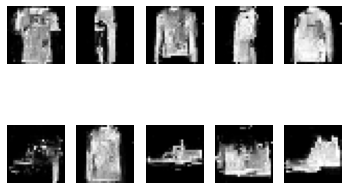

6001 [D loss: 0.697743, acc.: 44.92%] [G loss: 0.717286]
6002 [D loss: 0.697590, acc.: 49.61%] [G loss: 0.717303]
6003 [D loss: 0.697207, acc.: 47.66%] [G loss: 0.710487]
6004 [D loss: 0.696083, acc.: 48.83%] [G loss: 0.712571]
6005 [D loss: 0.694133, acc.: 49.22%] [G loss: 0.710722]
6006 [D loss: 0.698613, acc.: 50.39%] [G loss: 0.703605]
6007 [D loss: 0.692192, acc.: 52.73%] [G loss: 0.712066]
6008 [D loss: 0.691927, acc.: 54.30%] [G loss: 0.712999]
6009 [D loss: 0.692456, acc.: 50.78%] [G loss: 0.713440]
6010 [D loss: 0.695022, acc.: 51.56%] [G loss: 0.718787]
6011 [D loss: 0.689756, acc.: 51.95%] [G loss: 0.707810]
6012 [D loss: 0.693039, acc.: 53.12%] [G loss: 0.711914]
6013 [D loss: 0.691035, acc.: 53.12%] [G loss: 0.709689]
6014 [D loss: 0.690592, acc.: 53.91%] [G loss: 0.707149]
6015 [D loss: 0.694504, acc.: 50.00%] [G loss: 0.713732]
6016 [D loss: 0.689254, acc.: 50.78%] [G loss: 0.713938]
6017 [D loss: 0.693834, acc.: 49.61%] [G loss: 0.713903]
6018 [D loss: 0.694348, acc.: 5

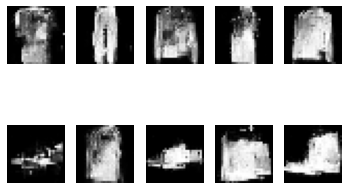

6201 [D loss: 0.688109, acc.: 54.69%] [G loss: 0.714907]
6202 [D loss: 0.682660, acc.: 63.28%] [G loss: 0.726188]
6203 [D loss: 0.679826, acc.: 64.45%] [G loss: 0.728829]
6204 [D loss: 0.684831, acc.: 65.23%] [G loss: 0.737047]
6205 [D loss: 0.680067, acc.: 66.80%] [G loss: 0.742266]
6206 [D loss: 0.675900, acc.: 68.75%] [G loss: 0.739749]
6207 [D loss: 0.674560, acc.: 67.19%] [G loss: 0.753307]
6208 [D loss: 0.675663, acc.: 67.19%] [G loss: 0.760000]
6209 [D loss: 0.671957, acc.: 67.58%] [G loss: 0.750813]
6210 [D loss: 0.676044, acc.: 66.41%] [G loss: 0.754071]
6211 [D loss: 0.677570, acc.: 69.53%] [G loss: 0.752059]
6212 [D loss: 0.681193, acc.: 63.28%] [G loss: 0.756396]
6213 [D loss: 0.675656, acc.: 67.19%] [G loss: 0.735682]
6214 [D loss: 0.691919, acc.: 48.83%] [G loss: 0.725471]
6215 [D loss: 0.694891, acc.: 40.23%] [G loss: 0.717218]
6216 [D loss: 0.697473, acc.: 49.22%] [G loss: 0.721501]
6217 [D loss: 0.694959, acc.: 46.09%] [G loss: 0.701166]
6218 [D loss: 0.702774, acc.: 4

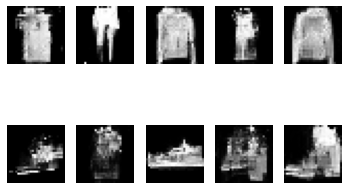

6401 [D loss: 0.694011, acc.: 53.12%] [G loss: 0.713557]
6402 [D loss: 0.708343, acc.: 45.70%] [G loss: 0.715069]
6403 [D loss: 0.692062, acc.: 50.78%] [G loss: 0.687931]
6404 [D loss: 0.694861, acc.: 45.31%] [G loss: 0.705864]
6405 [D loss: 0.697242, acc.: 51.17%] [G loss: 0.692864]
6406 [D loss: 0.710040, acc.: 40.23%] [G loss: 0.695820]
6407 [D loss: 0.700153, acc.: 46.48%] [G loss: 0.702253]
6408 [D loss: 0.690023, acc.: 51.17%] [G loss: 0.698771]
6409 [D loss: 0.695583, acc.: 47.27%] [G loss: 0.700951]
6410 [D loss: 0.688459, acc.: 48.44%] [G loss: 0.723081]
6411 [D loss: 0.689852, acc.: 48.05%] [G loss: 0.725305]
6412 [D loss: 0.693160, acc.: 45.70%] [G loss: 0.728957]
6413 [D loss: 0.690480, acc.: 50.39%] [G loss: 0.740457]
6414 [D loss: 0.680041, acc.: 58.59%] [G loss: 0.741965]
6415 [D loss: 0.679897, acc.: 58.98%] [G loss: 0.750533]
6416 [D loss: 0.676197, acc.: 61.72%] [G loss: 0.765973]
6417 [D loss: 0.675116, acc.: 66.41%] [G loss: 0.759115]
6418 [D loss: 0.661736, acc.: 7

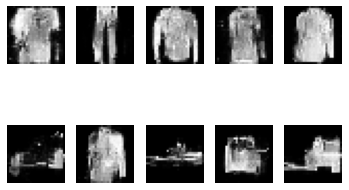

6601 [D loss: 0.700793, acc.: 43.75%] [G loss: 0.719615]
6602 [D loss: 0.686336, acc.: 51.95%] [G loss: 0.713653]
6603 [D loss: 0.691894, acc.: 46.48%] [G loss: 0.711292]
6604 [D loss: 0.698761, acc.: 43.75%] [G loss: 0.716148]
6605 [D loss: 0.692999, acc.: 50.00%] [G loss: 0.702621]
6606 [D loss: 0.702534, acc.: 44.14%] [G loss: 0.712236]
6607 [D loss: 0.693083, acc.: 47.66%] [G loss: 0.709019]
6608 [D loss: 0.699668, acc.: 48.44%] [G loss: 0.711043]
6609 [D loss: 0.703313, acc.: 44.14%] [G loss: 0.705850]
6610 [D loss: 0.706320, acc.: 44.14%] [G loss: 0.709181]
6611 [D loss: 0.702653, acc.: 44.14%] [G loss: 0.712982]
6612 [D loss: 0.701233, acc.: 41.02%] [G loss: 0.706569]
6613 [D loss: 0.697374, acc.: 46.48%] [G loss: 0.704121]
6614 [D loss: 0.697563, acc.: 47.66%] [G loss: 0.715896]
6615 [D loss: 0.703913, acc.: 46.09%] [G loss: 0.721373]
6616 [D loss: 0.688037, acc.: 55.86%] [G loss: 0.718435]
6617 [D loss: 0.695095, acc.: 53.52%] [G loss: 0.714551]
6618 [D loss: 0.701917, acc.: 4

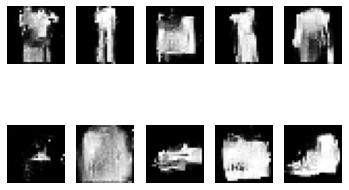

6801 [D loss: 0.696510, acc.: 52.73%] [G loss: 0.708871]
6802 [D loss: 0.697390, acc.: 47.66%] [G loss: 0.705962]
6803 [D loss: 0.699621, acc.: 49.22%] [G loss: 0.710066]
6804 [D loss: 0.696223, acc.: 47.66%] [G loss: 0.714184]
6805 [D loss: 0.700276, acc.: 46.48%] [G loss: 0.705984]
6806 [D loss: 0.697822, acc.: 50.39%] [G loss: 0.711066]
6807 [D loss: 0.695595, acc.: 51.56%] [G loss: 0.718740]
6808 [D loss: 0.693692, acc.: 53.52%] [G loss: 0.735560]
6809 [D loss: 0.693457, acc.: 51.95%] [G loss: 0.732647]
6810 [D loss: 0.689304, acc.: 54.30%] [G loss: 0.731346]
6811 [D loss: 0.689807, acc.: 49.61%] [G loss: 0.731111]
6812 [D loss: 0.691450, acc.: 48.05%] [G loss: 0.722466]
6813 [D loss: 0.695767, acc.: 46.88%] [G loss: 0.732011]
6814 [D loss: 0.691608, acc.: 53.12%] [G loss: 0.738002]
6815 [D loss: 0.693164, acc.: 48.83%] [G loss: 0.735766]
6816 [D loss: 0.695940, acc.: 48.83%] [G loss: 0.734228]
6817 [D loss: 0.690214, acc.: 50.39%] [G loss: 0.741876]
6818 [D loss: 0.693118, acc.: 5

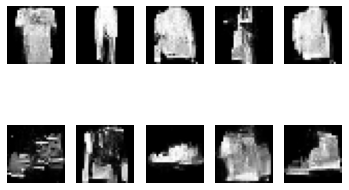

7001 [D loss: 0.685562, acc.: 58.98%] [G loss: 0.730835]
7002 [D loss: 0.693339, acc.: 53.52%] [G loss: 0.729255]
7003 [D loss: 0.695847, acc.: 51.17%] [G loss: 0.741268]
7004 [D loss: 0.688182, acc.: 57.03%] [G loss: 0.734363]
7005 [D loss: 0.689485, acc.: 54.69%] [G loss: 0.725139]
7006 [D loss: 0.691661, acc.: 52.34%] [G loss: 0.723263]
7007 [D loss: 0.691219, acc.: 45.70%] [G loss: 0.720930]
7008 [D loss: 0.690515, acc.: 52.34%] [G loss: 0.721296]
7009 [D loss: 0.687468, acc.: 53.52%] [G loss: 0.732108]
7010 [D loss: 0.694302, acc.: 52.73%] [G loss: 0.721815]
7011 [D loss: 0.698550, acc.: 49.22%] [G loss: 0.714897]
7012 [D loss: 0.691897, acc.: 49.61%] [G loss: 0.718283]
7013 [D loss: 0.701074, acc.: 42.97%] [G loss: 0.707101]
7014 [D loss: 0.694212, acc.: 49.22%] [G loss: 0.720592]
7015 [D loss: 0.691632, acc.: 51.17%] [G loss: 0.719232]
7016 [D loss: 0.696067, acc.: 48.05%] [G loss: 0.718783]
7017 [D loss: 0.692093, acc.: 53.12%] [G loss: 0.715206]
7018 [D loss: 0.695291, acc.: 4

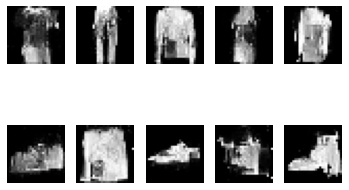

7201 [D loss: 0.683640, acc.: 57.03%] [G loss: 0.739955]
7202 [D loss: 0.687031, acc.: 56.25%] [G loss: 0.726694]
7203 [D loss: 0.671478, acc.: 59.38%] [G loss: 0.722584]
7204 [D loss: 0.676731, acc.: 58.20%] [G loss: 0.746013]
7205 [D loss: 0.675454, acc.: 57.81%] [G loss: 0.739601]
7206 [D loss: 0.676556, acc.: 61.33%] [G loss: 0.739290]
7207 [D loss: 0.682439, acc.: 55.47%] [G loss: 0.742807]
7208 [D loss: 0.679924, acc.: 57.81%] [G loss: 0.734445]
7209 [D loss: 0.671931, acc.: 57.42%] [G loss: 0.732586]
7210 [D loss: 0.679930, acc.: 53.91%] [G loss: 0.734986]
7211 [D loss: 0.686386, acc.: 55.08%] [G loss: 0.736884]
7212 [D loss: 0.684719, acc.: 55.08%] [G loss: 0.731731]
7213 [D loss: 0.683896, acc.: 58.98%] [G loss: 0.739408]
7214 [D loss: 0.676750, acc.: 57.03%] [G loss: 0.733908]
7215 [D loss: 0.683781, acc.: 53.52%] [G loss: 0.740054]
7216 [D loss: 0.674614, acc.: 59.77%] [G loss: 0.736577]
7217 [D loss: 0.683914, acc.: 58.98%] [G loss: 0.739951]
7218 [D loss: 0.690449, acc.: 5

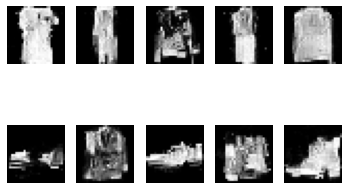

7401 [D loss: 0.690982, acc.: 53.91%] [G loss: 0.717185]
7402 [D loss: 0.693094, acc.: 53.91%] [G loss: 0.721229]
7403 [D loss: 0.695912, acc.: 55.08%] [G loss: 0.717608]
7404 [D loss: 0.689229, acc.: 58.59%] [G loss: 0.719458]
7405 [D loss: 0.688660, acc.: 56.25%] [G loss: 0.723963]
7406 [D loss: 0.694208, acc.: 52.73%] [G loss: 0.723064]
7407 [D loss: 0.692420, acc.: 50.00%] [G loss: 0.723829]
7408 [D loss: 0.691526, acc.: 53.12%] [G loss: 0.722270]
7409 [D loss: 0.689926, acc.: 57.42%] [G loss: 0.720092]
7410 [D loss: 0.689644, acc.: 55.08%] [G loss: 0.723693]
7411 [D loss: 0.695699, acc.: 51.17%] [G loss: 0.719916]
7412 [D loss: 0.700113, acc.: 48.83%] [G loss: 0.717471]
7413 [D loss: 0.688599, acc.: 58.59%] [G loss: 0.719892]
7414 [D loss: 0.694500, acc.: 56.25%] [G loss: 0.719747]
7415 [D loss: 0.691220, acc.: 53.91%] [G loss: 0.719884]
7416 [D loss: 0.696666, acc.: 54.30%] [G loss: 0.710495]
7417 [D loss: 0.693394, acc.: 52.73%] [G loss: 0.711971]
7418 [D loss: 0.696958, acc.: 5

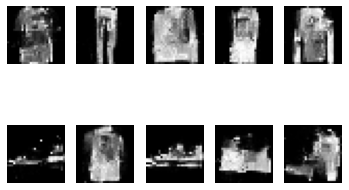

7601 [D loss: 0.695256, acc.: 51.17%] [G loss: 0.709543]
7602 [D loss: 0.695018, acc.: 49.61%] [G loss: 0.707859]
7603 [D loss: 0.693736, acc.: 48.44%] [G loss: 0.709727]
7604 [D loss: 0.694112, acc.: 49.22%] [G loss: 0.715128]
7605 [D loss: 0.688420, acc.: 53.52%] [G loss: 0.726753]
7606 [D loss: 0.689926, acc.: 54.30%] [G loss: 0.726736]
7607 [D loss: 0.682348, acc.: 58.20%] [G loss: 0.737494]
7608 [D loss: 0.675447, acc.: 62.11%] [G loss: 0.739703]
7609 [D loss: 0.678926, acc.: 60.16%] [G loss: 0.735810]
7610 [D loss: 0.671754, acc.: 65.23%] [G loss: 0.730391]
7611 [D loss: 0.673552, acc.: 61.72%] [G loss: 0.734052]
7612 [D loss: 0.680782, acc.: 58.20%] [G loss: 0.723851]
7613 [D loss: 0.699575, acc.: 42.97%] [G loss: 0.704916]
7614 [D loss: 0.679731, acc.: 49.61%] [G loss: 0.702404]
7615 [D loss: 0.705726, acc.: 41.02%] [G loss: 0.692507]
7616 [D loss: 0.698667, acc.: 41.80%] [G loss: 0.701295]
7617 [D loss: 0.702597, acc.: 39.84%] [G loss: 0.701996]
7618 [D loss: 0.705378, acc.: 3

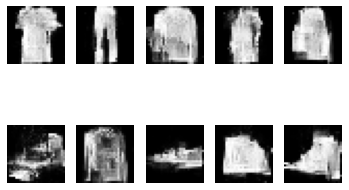

7801 [D loss: 0.695475, acc.: 48.83%] [G loss: 0.697438]
7802 [D loss: 0.696047, acc.: 52.34%] [G loss: 0.720777]
7803 [D loss: 0.694692, acc.: 48.83%] [G loss: 0.717412]
7804 [D loss: 0.693362, acc.: 53.91%] [G loss: 0.710451]
7805 [D loss: 0.697762, acc.: 48.83%] [G loss: 0.702979]
7806 [D loss: 0.696555, acc.: 49.22%] [G loss: 0.704087]
7807 [D loss: 0.703330, acc.: 50.39%] [G loss: 0.696206]
7808 [D loss: 0.693385, acc.: 53.52%] [G loss: 0.705152]
7809 [D loss: 0.699657, acc.: 52.73%] [G loss: 0.690674]
7810 [D loss: 0.697805, acc.: 53.91%] [G loss: 0.695667]
7811 [D loss: 0.706444, acc.: 46.88%] [G loss: 0.697564]
7812 [D loss: 0.702392, acc.: 50.00%] [G loss: 0.675417]
7813 [D loss: 0.704476, acc.: 53.12%] [G loss: 0.681511]
7814 [D loss: 0.705021, acc.: 48.05%] [G loss: 0.682608]
7815 [D loss: 0.706348, acc.: 51.56%] [G loss: 0.679810]
7816 [D loss: 0.706486, acc.: 43.75%] [G loss: 0.678313]
7817 [D loss: 0.704615, acc.: 42.58%] [G loss: 0.675094]
7818 [D loss: 0.702015, acc.: 5

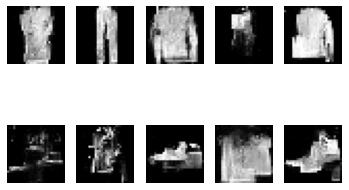

8001 [D loss: 0.693331, acc.: 52.73%] [G loss: 0.722948]
8002 [D loss: 0.690531, acc.: 51.56%] [G loss: 0.715379]
8003 [D loss: 0.690844, acc.: 44.14%] [G loss: 0.713912]
8004 [D loss: 0.694321, acc.: 44.92%] [G loss: 0.719723]
8005 [D loss: 0.693153, acc.: 46.09%] [G loss: 0.714109]
8006 [D loss: 0.693040, acc.: 46.48%] [G loss: 0.704807]
8007 [D loss: 0.689452, acc.: 48.05%] [G loss: 0.715796]
8008 [D loss: 0.689103, acc.: 50.00%] [G loss: 0.710686]
8009 [D loss: 0.686954, acc.: 49.22%] [G loss: 0.729047]
8010 [D loss: 0.685799, acc.: 51.56%] [G loss: 0.728933]
8011 [D loss: 0.689833, acc.: 50.78%] [G loss: 0.719757]
8012 [D loss: 0.689549, acc.: 47.66%] [G loss: 0.725095]
8013 [D loss: 0.685443, acc.: 53.52%] [G loss: 0.723082]
8014 [D loss: 0.687563, acc.: 49.61%] [G loss: 0.729331]
8015 [D loss: 0.691170, acc.: 51.95%] [G loss: 0.727666]
8016 [D loss: 0.689842, acc.: 50.00%] [G loss: 0.730659]
8017 [D loss: 0.687854, acc.: 51.17%] [G loss: 0.723203]
8018 [D loss: 0.682228, acc.: 5

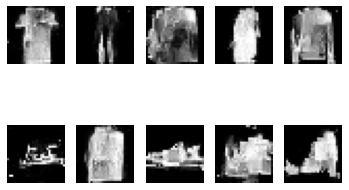

8201 [D loss: 0.691693, acc.: 51.95%] [G loss: 0.708419]
8202 [D loss: 0.691640, acc.: 50.39%] [G loss: 0.701781]
8203 [D loss: 0.689537, acc.: 51.95%] [G loss: 0.705107]
8204 [D loss: 0.693059, acc.: 50.39%] [G loss: 0.699558]
8205 [D loss: 0.692657, acc.: 49.22%] [G loss: 0.709164]
8206 [D loss: 0.687165, acc.: 54.30%] [G loss: 0.706889]
8207 [D loss: 0.690568, acc.: 48.44%] [G loss: 0.711286]
8208 [D loss: 0.686102, acc.: 51.56%] [G loss: 0.707033]
8209 [D loss: 0.693919, acc.: 49.22%] [G loss: 0.713949]
8210 [D loss: 0.686197, acc.: 52.73%] [G loss: 0.708611]
8211 [D loss: 0.688960, acc.: 49.22%] [G loss: 0.709653]
8212 [D loss: 0.686259, acc.: 53.52%] [G loss: 0.705502]
8213 [D loss: 0.692847, acc.: 48.05%] [G loss: 0.705136]
8214 [D loss: 0.689023, acc.: 54.69%] [G loss: 0.707397]
8215 [D loss: 0.689877, acc.: 49.22%] [G loss: 0.708647]
8216 [D loss: 0.683508, acc.: 53.52%] [G loss: 0.708468]
8217 [D loss: 0.695173, acc.: 45.31%] [G loss: 0.707555]
8218 [D loss: 0.689541, acc.: 4

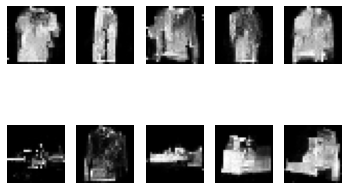

8401 [D loss: 0.707206, acc.: 45.31%] [G loss: 0.702079]
8402 [D loss: 0.705404, acc.: 41.41%] [G loss: 0.701561]
8403 [D loss: 0.706238, acc.: 39.84%] [G loss: 0.694690]
8404 [D loss: 0.697049, acc.: 44.14%] [G loss: 0.709431]
8405 [D loss: 0.702281, acc.: 42.58%] [G loss: 0.697090]
8406 [D loss: 0.699905, acc.: 41.02%] [G loss: 0.710490]
8407 [D loss: 0.694451, acc.: 46.09%] [G loss: 0.725858]
8408 [D loss: 0.698742, acc.: 46.48%] [G loss: 0.712795]
8409 [D loss: 0.688965, acc.: 51.56%] [G loss: 0.714949]
8410 [D loss: 0.690613, acc.: 47.66%] [G loss: 0.725349]
8411 [D loss: 0.692118, acc.: 48.44%] [G loss: 0.739488]
8412 [D loss: 0.683126, acc.: 54.30%] [G loss: 0.709339]
8413 [D loss: 0.683491, acc.: 51.95%] [G loss: 0.714061]
8414 [D loss: 0.689069, acc.: 48.83%] [G loss: 0.721480]
8415 [D loss: 0.691101, acc.: 47.27%] [G loss: 0.737450]
8416 [D loss: 0.679696, acc.: 55.08%] [G loss: 0.711977]
8417 [D loss: 0.687372, acc.: 49.22%] [G loss: 0.737593]
8418 [D loss: 0.680398, acc.: 5

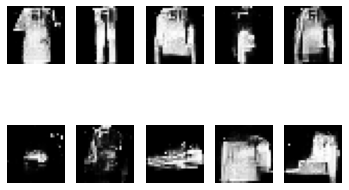

8601 [D loss: 0.684268, acc.: 61.72%] [G loss: 0.734712]
8602 [D loss: 0.684492, acc.: 60.94%] [G loss: 0.722145]
8603 [D loss: 0.686106, acc.: 54.69%] [G loss: 0.735525]
8604 [D loss: 0.683910, acc.: 58.20%] [G loss: 0.739895]
8605 [D loss: 0.681539, acc.: 58.98%] [G loss: 0.751172]
8606 [D loss: 0.671630, acc.: 61.33%] [G loss: 0.740368]
8607 [D loss: 0.675054, acc.: 59.38%] [G loss: 0.726631]
8608 [D loss: 0.687308, acc.: 53.52%] [G loss: 0.729805]
8609 [D loss: 0.690377, acc.: 53.52%] [G loss: 0.732741]
8610 [D loss: 0.677869, acc.: 56.25%] [G loss: 0.730877]
8611 [D loss: 0.661863, acc.: 65.62%] [G loss: 0.736783]
8612 [D loss: 0.666423, acc.: 63.67%] [G loss: 0.736187]
8613 [D loss: 0.674863, acc.: 57.42%] [G loss: 0.733451]
8614 [D loss: 0.681637, acc.: 50.00%] [G loss: 0.723725]
8615 [D loss: 0.672939, acc.: 56.64%] [G loss: 0.733885]
8616 [D loss: 0.686078, acc.: 46.88%] [G loss: 0.712576]
8617 [D loss: 0.689818, acc.: 47.27%] [G loss: 0.712737]
8618 [D loss: 0.699938, acc.: 4

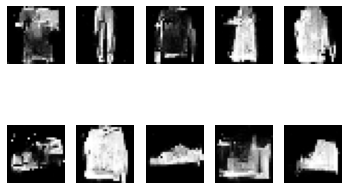

8801 [D loss: 0.681175, acc.: 60.94%] [G loss: 0.747404]
8802 [D loss: 0.674691, acc.: 65.23%] [G loss: 0.746905]
8803 [D loss: 0.686907, acc.: 61.33%] [G loss: 0.745254]
8804 [D loss: 0.685893, acc.: 59.77%] [G loss: 0.742996]
8805 [D loss: 0.686267, acc.: 62.89%] [G loss: 0.739725]
8806 [D loss: 0.681042, acc.: 62.50%] [G loss: 0.738684]
8807 [D loss: 0.682348, acc.: 62.89%] [G loss: 0.731943]
8808 [D loss: 0.684307, acc.: 58.59%] [G loss: 0.727990]
8809 [D loss: 0.685007, acc.: 56.25%] [G loss: 0.728715]
8810 [D loss: 0.687114, acc.: 51.95%] [G loss: 0.726898]
8811 [D loss: 0.687066, acc.: 54.30%] [G loss: 0.730761]
8812 [D loss: 0.682265, acc.: 53.12%] [G loss: 0.727019]
8813 [D loss: 0.689683, acc.: 50.00%] [G loss: 0.724764]
8814 [D loss: 0.685710, acc.: 51.95%] [G loss: 0.726706]
8815 [D loss: 0.685672, acc.: 51.56%] [G loss: 0.732841]
8816 [D loss: 0.685716, acc.: 53.12%] [G loss: 0.727966]
8817 [D loss: 0.686244, acc.: 51.17%] [G loss: 0.734596]
8818 [D loss: 0.684587, acc.: 5

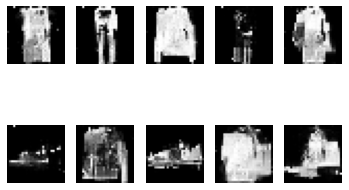

9001 [D loss: 0.674403, acc.: 52.34%] [G loss: 0.748992]
9002 [D loss: 0.675849, acc.: 55.47%] [G loss: 0.734234]
9003 [D loss: 0.670767, acc.: 58.59%] [G loss: 0.746437]
9004 [D loss: 0.671712, acc.: 59.38%] [G loss: 0.750857]
9005 [D loss: 0.681190, acc.: 54.30%] [G loss: 0.731530]
9006 [D loss: 0.677620, acc.: 51.95%] [G loss: 0.733121]
9007 [D loss: 0.675547, acc.: 54.69%] [G loss: 0.733629]
9008 [D loss: 0.690289, acc.: 49.22%] [G loss: 0.729630]
9009 [D loss: 0.685194, acc.: 50.39%] [G loss: 0.721425]
9010 [D loss: 0.677626, acc.: 51.17%] [G loss: 0.729439]
9011 [D loss: 0.685454, acc.: 47.27%] [G loss: 0.728485]
9012 [D loss: 0.683275, acc.: 55.08%] [G loss: 0.732513]
9013 [D loss: 0.681565, acc.: 53.52%] [G loss: 0.726166]
9014 [D loss: 0.692161, acc.: 47.27%] [G loss: 0.730629]
9015 [D loss: 0.687042, acc.: 50.39%] [G loss: 0.726909]
9016 [D loss: 0.691817, acc.: 49.22%] [G loss: 0.728340]
9017 [D loss: 0.684795, acc.: 55.08%] [G loss: 0.729891]
9018 [D loss: 0.689360, acc.: 4

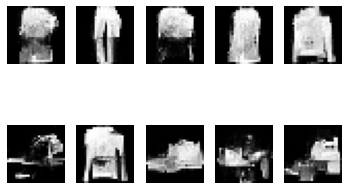

9201 [D loss: 0.692555, acc.: 44.92%] [G loss: 0.727575]
9202 [D loss: 0.686287, acc.: 53.12%] [G loss: 0.726416]
9203 [D loss: 0.689362, acc.: 51.95%] [G loss: 0.727921]
9204 [D loss: 0.688142, acc.: 55.08%] [G loss: 0.717401]
9205 [D loss: 0.689778, acc.: 57.42%] [G loss: 0.726799]
9206 [D loss: 0.684043, acc.: 55.47%] [G loss: 0.727924]
9207 [D loss: 0.688838, acc.: 56.64%] [G loss: 0.729757]
9208 [D loss: 0.681836, acc.: 56.64%] [G loss: 0.729478]
9209 [D loss: 0.685317, acc.: 53.52%] [G loss: 0.729905]
9210 [D loss: 0.684637, acc.: 51.17%] [G loss: 0.727273]
9211 [D loss: 0.678845, acc.: 57.42%] [G loss: 0.726186]
9212 [D loss: 0.677878, acc.: 55.47%] [G loss: 0.723010]
9213 [D loss: 0.684808, acc.: 50.00%] [G loss: 0.719644]
9214 [D loss: 0.681112, acc.: 60.16%] [G loss: 0.713933]
9215 [D loss: 0.684427, acc.: 54.30%] [G loss: 0.724488]
9216 [D loss: 0.685289, acc.: 54.30%] [G loss: 0.723804]
9217 [D loss: 0.689726, acc.: 47.27%] [G loss: 0.720796]
9218 [D loss: 0.689018, acc.: 5

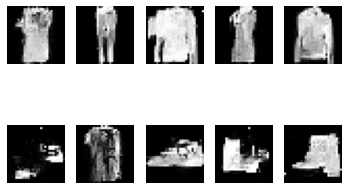

9401 [D loss: 0.682514, acc.: 59.77%] [G loss: 0.715321]
9402 [D loss: 0.678365, acc.: 60.94%] [G loss: 0.725930]
9403 [D loss: 0.684082, acc.: 57.42%] [G loss: 0.722880]
9404 [D loss: 0.684701, acc.: 58.59%] [G loss: 0.719361]
9405 [D loss: 0.679571, acc.: 61.72%] [G loss: 0.718110]
9406 [D loss: 0.681156, acc.: 59.38%] [G loss: 0.711488]
9407 [D loss: 0.678648, acc.: 60.94%] [G loss: 0.721078]
9408 [D loss: 0.685434, acc.: 59.77%] [G loss: 0.716265]
9409 [D loss: 0.685122, acc.: 57.81%] [G loss: 0.721014]
9410 [D loss: 0.680586, acc.: 61.33%] [G loss: 0.725168]
9411 [D loss: 0.680813, acc.: 59.38%] [G loss: 0.723434]
9412 [D loss: 0.680716, acc.: 62.50%] [G loss: 0.720446]
9413 [D loss: 0.684822, acc.: 56.64%] [G loss: 0.723350]
9414 [D loss: 0.684903, acc.: 55.47%] [G loss: 0.720423]
9415 [D loss: 0.675267, acc.: 60.94%] [G loss: 0.726130]
9416 [D loss: 0.677217, acc.: 58.98%] [G loss: 0.734915]
9417 [D loss: 0.691921, acc.: 50.78%] [G loss: 0.729498]
9418 [D loss: 0.682659, acc.: 5

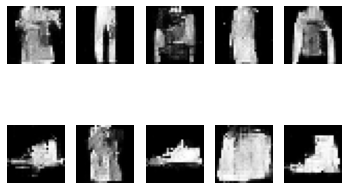

9601 [D loss: 0.692704, acc.: 57.03%] [G loss: 0.706065]
9602 [D loss: 0.693656, acc.: 53.12%] [G loss: 0.701595]
9603 [D loss: 0.691166, acc.: 62.11%] [G loss: 0.712362]
9604 [D loss: 0.687154, acc.: 64.06%] [G loss: 0.706470]
9605 [D loss: 0.690576, acc.: 57.81%] [G loss: 0.712825]
9606 [D loss: 0.690386, acc.: 57.81%] [G loss: 0.712844]
9607 [D loss: 0.689072, acc.: 60.94%] [G loss: 0.706607]
9608 [D loss: 0.690977, acc.: 58.98%] [G loss: 0.706401]
9609 [D loss: 0.691398, acc.: 59.38%] [G loss: 0.716138]
9610 [D loss: 0.695320, acc.: 54.30%] [G loss: 0.707065]
9611 [D loss: 0.691086, acc.: 56.25%] [G loss: 0.702634]
9612 [D loss: 0.689224, acc.: 57.42%] [G loss: 0.706306]
9613 [D loss: 0.695992, acc.: 53.12%] [G loss: 0.705747]
9614 [D loss: 0.692125, acc.: 57.81%] [G loss: 0.707962]
9615 [D loss: 0.690176, acc.: 55.47%] [G loss: 0.708403]
9616 [D loss: 0.689540, acc.: 57.81%] [G loss: 0.707798]
9617 [D loss: 0.693731, acc.: 51.56%] [G loss: 0.708638]
9618 [D loss: 0.687605, acc.: 5

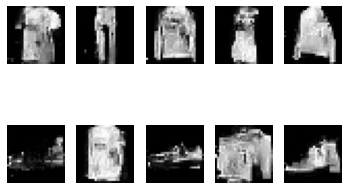

9801 [D loss: 0.689237, acc.: 54.69%] [G loss: 0.711211]
9802 [D loss: 0.686673, acc.: 57.03%] [G loss: 0.711526]
9803 [D loss: 0.685677, acc.: 57.03%] [G loss: 0.714397]
9804 [D loss: 0.685193, acc.: 59.38%] [G loss: 0.712298]
9805 [D loss: 0.685141, acc.: 64.06%] [G loss: 0.713778]
9806 [D loss: 0.683266, acc.: 63.67%] [G loss: 0.715030]
9807 [D loss: 0.685101, acc.: 63.28%] [G loss: 0.718126]
9808 [D loss: 0.684666, acc.: 62.11%] [G loss: 0.713067]
9809 [D loss: 0.684992, acc.: 60.94%] [G loss: 0.713592]
9810 [D loss: 0.683373, acc.: 62.50%] [G loss: 0.714818]
9811 [D loss: 0.683349, acc.: 61.72%] [G loss: 0.715856]
9812 [D loss: 0.684284, acc.: 59.38%] [G loss: 0.712143]
9813 [D loss: 0.683622, acc.: 58.59%] [G loss: 0.712769]
9814 [D loss: 0.682828, acc.: 63.67%] [G loss: 0.714015]
9815 [D loss: 0.685411, acc.: 56.25%] [G loss: 0.713568]
9816 [D loss: 0.689908, acc.: 52.34%] [G loss: 0.709500]
9817 [D loss: 0.684846, acc.: 59.77%] [G loss: 0.714558]
9818 [D loss: 0.681757, acc.: 5

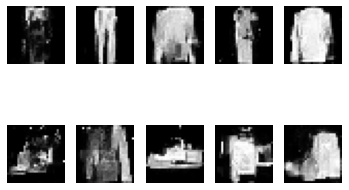

10001 [D loss: 0.693816, acc.: 48.83%] [G loss: 0.699896]
10002 [D loss: 0.688964, acc.: 57.03%] [G loss: 0.706778]
10003 [D loss: 0.685789, acc.: 54.30%] [G loss: 0.703906]
10004 [D loss: 0.690424, acc.: 53.52%] [G loss: 0.712556]
10005 [D loss: 0.691631, acc.: 58.20%] [G loss: 0.706410]
10006 [D loss: 0.694469, acc.: 54.30%] [G loss: 0.702904]
10007 [D loss: 0.689770, acc.: 55.47%] [G loss: 0.720154]
10008 [D loss: 0.689668, acc.: 56.64%] [G loss: 0.718308]
10009 [D loss: 0.688108, acc.: 59.77%] [G loss: 0.700386]
10010 [D loss: 0.687728, acc.: 58.98%] [G loss: 0.711539]
10011 [D loss: 0.687258, acc.: 57.03%] [G loss: 0.717985]
10012 [D loss: 0.687777, acc.: 55.47%] [G loss: 0.713849]
10013 [D loss: 0.685386, acc.: 57.81%] [G loss: 0.706840]
10014 [D loss: 0.691192, acc.: 57.03%] [G loss: 0.714670]
10015 [D loss: 0.691847, acc.: 55.08%] [G loss: 0.714947]
10016 [D loss: 0.691235, acc.: 54.30%] [G loss: 0.710818]
10017 [D loss: 0.688176, acc.: 56.64%] [G loss: 0.712876]
10018 [D loss:

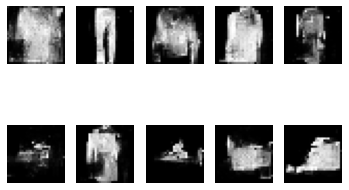

10201 [D loss: 0.701986, acc.: 37.89%] [G loss: 0.678336]
10202 [D loss: 0.700608, acc.: 41.02%] [G loss: 0.672753]
10203 [D loss: 0.696122, acc.: 44.53%] [G loss: 0.676047]
10204 [D loss: 0.702417, acc.: 42.58%] [G loss: 0.694786]
10205 [D loss: 0.700809, acc.: 47.27%] [G loss: 0.691231]
10206 [D loss: 0.697816, acc.: 51.95%] [G loss: 0.687121]
10207 [D loss: 0.701541, acc.: 50.78%] [G loss: 0.706651]
10208 [D loss: 0.696682, acc.: 53.12%] [G loss: 0.718459]
10209 [D loss: 0.692323, acc.: 57.03%] [G loss: 0.719222]
10210 [D loss: 0.698799, acc.: 54.69%] [G loss: 0.717523]
10211 [D loss: 0.696213, acc.: 52.34%] [G loss: 0.723058]
10212 [D loss: 0.691281, acc.: 53.91%] [G loss: 0.724375]
10213 [D loss: 0.692349, acc.: 51.56%] [G loss: 0.719376]
10214 [D loss: 0.701332, acc.: 47.66%] [G loss: 0.709468]
10215 [D loss: 0.690744, acc.: 58.20%] [G loss: 0.720710]
10216 [D loss: 0.694877, acc.: 53.12%] [G loss: 0.728944]
10217 [D loss: 0.696927, acc.: 52.34%] [G loss: 0.727817]
10218 [D loss:

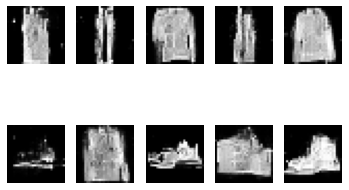

10401 [D loss: 0.700730, acc.: 42.19%] [G loss: 0.692232]
10402 [D loss: 0.698909, acc.: 43.36%] [G loss: 0.693996]
10403 [D loss: 0.699607, acc.: 41.41%] [G loss: 0.700954]
10404 [D loss: 0.701401, acc.: 46.09%] [G loss: 0.696212]
10405 [D loss: 0.699042, acc.: 43.36%] [G loss: 0.697474]
10406 [D loss: 0.699266, acc.: 43.36%] [G loss: 0.697092]
10407 [D loss: 0.698743, acc.: 46.09%] [G loss: 0.698401]
10408 [D loss: 0.700145, acc.: 48.05%] [G loss: 0.696071]
10409 [D loss: 0.703395, acc.: 40.23%] [G loss: 0.697822]
10410 [D loss: 0.697350, acc.: 46.09%] [G loss: 0.699262]
10411 [D loss: 0.696960, acc.: 48.05%] [G loss: 0.699485]
10412 [D loss: 0.700552, acc.: 42.58%] [G loss: 0.700930]
10413 [D loss: 0.696581, acc.: 46.48%] [G loss: 0.707406]
10414 [D loss: 0.698705, acc.: 47.27%] [G loss: 0.705986]
10415 [D loss: 0.699901, acc.: 44.92%] [G loss: 0.705346]
10416 [D loss: 0.696961, acc.: 50.00%] [G loss: 0.702303]
10417 [D loss: 0.695242, acc.: 48.83%] [G loss: 0.704132]
10418 [D loss:

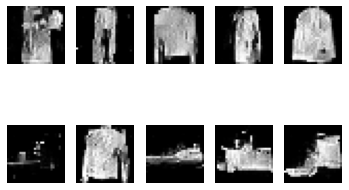

10601 [D loss: 0.683563, acc.: 57.03%] [G loss: 0.718891]
10602 [D loss: 0.685804, acc.: 56.25%] [G loss: 0.703725]
10603 [D loss: 0.686069, acc.: 50.39%] [G loss: 0.721990]
10604 [D loss: 0.682653, acc.: 53.52%] [G loss: 0.715864]
10605 [D loss: 0.681728, acc.: 55.08%] [G loss: 0.719799]
10606 [D loss: 0.688625, acc.: 47.66%] [G loss: 0.723503]
10607 [D loss: 0.690041, acc.: 54.30%] [G loss: 0.717290]
10608 [D loss: 0.679771, acc.: 57.81%] [G loss: 0.721922]
10609 [D loss: 0.686640, acc.: 55.08%] [G loss: 0.726763]
10610 [D loss: 0.675779, acc.: 62.11%] [G loss: 0.717739]
10611 [D loss: 0.681685, acc.: 57.81%] [G loss: 0.723384]
10612 [D loss: 0.682648, acc.: 58.59%] [G loss: 0.734047]
10613 [D loss: 0.686631, acc.: 59.38%] [G loss: 0.716981]
10614 [D loss: 0.676485, acc.: 62.11%] [G loss: 0.721428]
10615 [D loss: 0.683860, acc.: 55.86%] [G loss: 0.733530]
10616 [D loss: 0.683522, acc.: 58.59%] [G loss: 0.727471]
10617 [D loss: 0.681137, acc.: 56.25%] [G loss: 0.723095]
10618 [D loss:

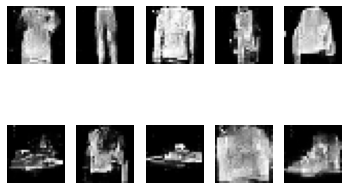

10801 [D loss: 0.704771, acc.: 39.06%] [G loss: 0.677977]
10802 [D loss: 0.710954, acc.: 31.64%] [G loss: 0.678758]
10803 [D loss: 0.707682, acc.: 34.38%] [G loss: 0.680382]
10804 [D loss: 0.714364, acc.: 31.25%] [G loss: 0.680175]
10805 [D loss: 0.708566, acc.: 31.64%] [G loss: 0.685147]
10806 [D loss: 0.700341, acc.: 37.50%] [G loss: 0.680779]
10807 [D loss: 0.702988, acc.: 39.84%] [G loss: 0.685895]
10808 [D loss: 0.704186, acc.: 40.62%] [G loss: 0.689999]
10809 [D loss: 0.699874, acc.: 36.33%] [G loss: 0.694388]
10810 [D loss: 0.699903, acc.: 45.70%] [G loss: 0.689575]
10811 [D loss: 0.704477, acc.: 42.58%] [G loss: 0.695642]
10812 [D loss: 0.703959, acc.: 40.23%] [G loss: 0.687912]
10813 [D loss: 0.704604, acc.: 39.84%] [G loss: 0.685505]
10814 [D loss: 0.699742, acc.: 46.09%] [G loss: 0.691630]
10815 [D loss: 0.699973, acc.: 42.97%] [G loss: 0.695865]
10816 [D loss: 0.701878, acc.: 40.23%] [G loss: 0.696974]
10817 [D loss: 0.697099, acc.: 46.88%] [G loss: 0.692896]
10818 [D loss:

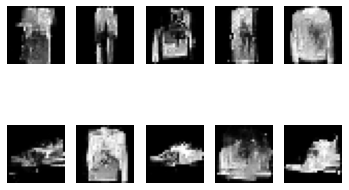

11001 [D loss: 0.689058, acc.: 56.25%] [G loss: 0.710207]
11002 [D loss: 0.688856, acc.: 55.47%] [G loss: 0.708783]
11003 [D loss: 0.689479, acc.: 55.86%] [G loss: 0.706117]
11004 [D loss: 0.688808, acc.: 53.52%] [G loss: 0.705368]
11005 [D loss: 0.687688, acc.: 53.91%] [G loss: 0.702797]
11006 [D loss: 0.690152, acc.: 55.47%] [G loss: 0.706289]
11007 [D loss: 0.689598, acc.: 54.69%] [G loss: 0.708169]
11008 [D loss: 0.688425, acc.: 55.08%] [G loss: 0.708127]
11009 [D loss: 0.687417, acc.: 56.25%] [G loss: 0.705609]
11010 [D loss: 0.689077, acc.: 57.03%] [G loss: 0.709804]
11011 [D loss: 0.690044, acc.: 54.30%] [G loss: 0.711315]
11012 [D loss: 0.689914, acc.: 51.56%] [G loss: 0.705828]
11013 [D loss: 0.689135, acc.: 51.95%] [G loss: 0.710114]
11014 [D loss: 0.687501, acc.: 56.64%] [G loss: 0.705319]
11015 [D loss: 0.689901, acc.: 56.25%] [G loss: 0.706569]
11016 [D loss: 0.694582, acc.: 50.00%] [G loss: 0.707688]
11017 [D loss: 0.694588, acc.: 49.61%] [G loss: 0.705631]
11018 [D loss:

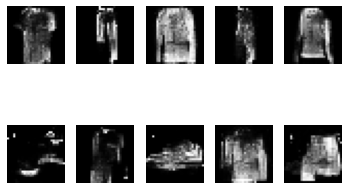

11201 [D loss: 0.696894, acc.: 41.41%] [G loss: 0.695640]
11202 [D loss: 0.696508, acc.: 49.61%] [G loss: 0.708078]
11203 [D loss: 0.691585, acc.: 53.91%] [G loss: 0.712638]
11204 [D loss: 0.685012, acc.: 56.25%] [G loss: 0.719607]
11205 [D loss: 0.687401, acc.: 55.08%] [G loss: 0.727429]
11206 [D loss: 0.680129, acc.: 61.33%] [G loss: 0.730788]
11207 [D loss: 0.679742, acc.: 61.33%] [G loss: 0.726921]
11208 [D loss: 0.678118, acc.: 59.77%] [G loss: 0.721803]
11209 [D loss: 0.680703, acc.: 58.59%] [G loss: 0.714367]
11210 [D loss: 0.683743, acc.: 50.00%] [G loss: 0.714134]
11211 [D loss: 0.685221, acc.: 50.00%] [G loss: 0.722386]
11212 [D loss: 0.689456, acc.: 49.61%] [G loss: 0.698804]
11213 [D loss: 0.693618, acc.: 50.78%] [G loss: 0.686885]
11214 [D loss: 0.694566, acc.: 46.09%] [G loss: 0.683643]
11215 [D loss: 0.705199, acc.: 39.45%] [G loss: 0.689726]
11216 [D loss: 0.698708, acc.: 42.19%] [G loss: 0.693457]
11217 [D loss: 0.694849, acc.: 46.48%] [G loss: 0.693269]
11218 [D loss:

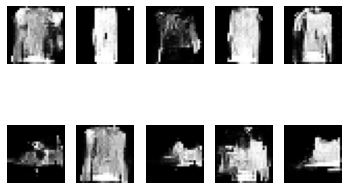

11401 [D loss: 0.681579, acc.: 65.23%] [G loss: 0.722819]
11402 [D loss: 0.680770, acc.: 63.28%] [G loss: 0.722574]
11403 [D loss: 0.679123, acc.: 65.62%] [G loss: 0.723644]
11404 [D loss: 0.678785, acc.: 67.58%] [G loss: 0.728070]
11405 [D loss: 0.676505, acc.: 69.53%] [G loss: 0.727967]
11406 [D loss: 0.678012, acc.: 62.89%] [G loss: 0.730182]
11407 [D loss: 0.679707, acc.: 65.62%] [G loss: 0.731390]
11408 [D loss: 0.675589, acc.: 69.14%] [G loss: 0.727109]
11409 [D loss: 0.673583, acc.: 65.23%] [G loss: 0.736703]
11410 [D loss: 0.676512, acc.: 65.23%] [G loss: 0.733963]
11411 [D loss: 0.674948, acc.: 69.14%] [G loss: 0.729290]
11412 [D loss: 0.677079, acc.: 66.80%] [G loss: 0.730393]
11413 [D loss: 0.670045, acc.: 70.31%] [G loss: 0.729010]
11414 [D loss: 0.678914, acc.: 62.11%] [G loss: 0.728874]
11415 [D loss: 0.680344, acc.: 65.23%] [G loss: 0.722854]
11416 [D loss: 0.683016, acc.: 59.38%] [G loss: 0.721367]
11417 [D loss: 0.678409, acc.: 67.58%] [G loss: 0.727654]
11418 [D loss:

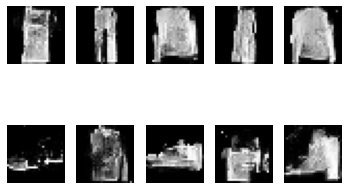

11601 [D loss: 0.692270, acc.: 56.64%] [G loss: 0.703166]
11602 [D loss: 0.696318, acc.: 48.05%] [G loss: 0.702684]
11603 [D loss: 0.688823, acc.: 52.73%] [G loss: 0.706820]
11604 [D loss: 0.696154, acc.: 54.69%] [G loss: 0.707636]
11605 [D loss: 0.690912, acc.: 55.86%] [G loss: 0.707206]
11606 [D loss: 0.696314, acc.: 50.39%] [G loss: 0.700377]
11607 [D loss: 0.697832, acc.: 53.12%] [G loss: 0.693757]
11608 [D loss: 0.696279, acc.: 55.08%] [G loss: 0.697596]
11609 [D loss: 0.695936, acc.: 48.83%] [G loss: 0.700491]
11610 [D loss: 0.690200, acc.: 58.20%] [G loss: 0.697005]
11611 [D loss: 0.696120, acc.: 49.22%] [G loss: 0.698806]
11612 [D loss: 0.698261, acc.: 51.95%] [G loss: 0.702369]
11613 [D loss: 0.694144, acc.: 51.95%] [G loss: 0.700854]
11614 [D loss: 0.691449, acc.: 51.95%] [G loss: 0.706272]
11615 [D loss: 0.692900, acc.: 49.22%] [G loss: 0.703969]
11616 [D loss: 0.693118, acc.: 47.66%] [G loss: 0.705996]
11617 [D loss: 0.694727, acc.: 51.56%] [G loss: 0.705627]
11618 [D loss:

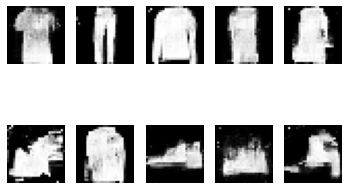

11801 [D loss: 0.703856, acc.: 37.89%] [G loss: 0.693294]
11802 [D loss: 0.700363, acc.: 44.14%] [G loss: 0.697722]
11803 [D loss: 0.694625, acc.: 48.83%] [G loss: 0.706464]
11804 [D loss: 0.691906, acc.: 50.78%] [G loss: 0.720474]
11805 [D loss: 0.688974, acc.: 50.00%] [G loss: 0.720770]
11806 [D loss: 0.686326, acc.: 56.25%] [G loss: 0.728197]
11807 [D loss: 0.682270, acc.: 58.59%] [G loss: 0.734947]
11808 [D loss: 0.683202, acc.: 58.20%] [G loss: 0.744985]
11809 [D loss: 0.679860, acc.: 60.16%] [G loss: 0.746088]
11810 [D loss: 0.680400, acc.: 58.98%] [G loss: 0.749686]
11811 [D loss: 0.681670, acc.: 54.69%] [G loss: 0.747141]
11812 [D loss: 0.681551, acc.: 57.81%] [G loss: 0.739502]
11813 [D loss: 0.687018, acc.: 51.17%] [G loss: 0.728917]
11814 [D loss: 0.686882, acc.: 51.56%] [G loss: 0.722410]
11815 [D loss: 0.695108, acc.: 46.48%] [G loss: 0.705045]
11816 [D loss: 0.700228, acc.: 36.72%] [G loss: 0.696347]
11817 [D loss: 0.701289, acc.: 37.11%] [G loss: 0.697522]
11818 [D loss:

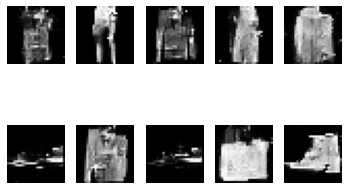

12001 [D loss: 0.692093, acc.: 51.17%] [G loss: 0.698685]
12002 [D loss: 0.689257, acc.: 51.95%] [G loss: 0.700393]
12003 [D loss: 0.690696, acc.: 47.66%] [G loss: 0.710231]
12004 [D loss: 0.690497, acc.: 52.73%] [G loss: 0.694213]
12005 [D loss: 0.695822, acc.: 44.92%] [G loss: 0.704497]
12006 [D loss: 0.689113, acc.: 48.44%] [G loss: 0.704880]
12007 [D loss: 0.689548, acc.: 48.44%] [G loss: 0.693478]
12008 [D loss: 0.697488, acc.: 43.75%] [G loss: 0.709124]
12009 [D loss: 0.692328, acc.: 44.53%] [G loss: 0.698254]
12010 [D loss: 0.689737, acc.: 49.61%] [G loss: 0.696083]
12011 [D loss: 0.686872, acc.: 51.56%] [G loss: 0.695178]
12012 [D loss: 0.691692, acc.: 50.39%] [G loss: 0.702502]
12013 [D loss: 0.694653, acc.: 47.66%] [G loss: 0.694027]
12014 [D loss: 0.692477, acc.: 47.66%] [G loss: 0.691748]
12015 [D loss: 0.691033, acc.: 50.00%] [G loss: 0.697810]
12016 [D loss: 0.696842, acc.: 43.36%] [G loss: 0.698684]
12017 [D loss: 0.692638, acc.: 50.78%] [G loss: 0.699704]
12018 [D loss:

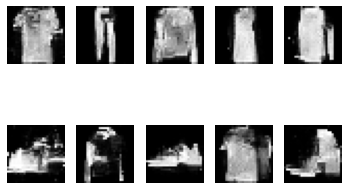

12201 [D loss: 0.701409, acc.: 39.84%] [G loss: 0.686723]
12202 [D loss: 0.694226, acc.: 45.31%] [G loss: 0.688580]
12203 [D loss: 0.705362, acc.: 42.58%] [G loss: 0.681110]
12204 [D loss: 0.699728, acc.: 45.70%] [G loss: 0.689853]
12205 [D loss: 0.696882, acc.: 55.86%] [G loss: 0.688457]
12206 [D loss: 0.700337, acc.: 53.12%] [G loss: 0.692340]
12207 [D loss: 0.695715, acc.: 57.03%] [G loss: 0.689555]
12208 [D loss: 0.693137, acc.: 57.81%] [G loss: 0.696581]
12209 [D loss: 0.695132, acc.: 60.55%] [G loss: 0.696988]
12210 [D loss: 0.698682, acc.: 53.12%] [G loss: 0.703831]
12211 [D loss: 0.693657, acc.: 61.72%] [G loss: 0.696033]
12212 [D loss: 0.696405, acc.: 58.59%] [G loss: 0.701714]
12213 [D loss: 0.694903, acc.: 57.81%] [G loss: 0.702119]
12214 [D loss: 0.697580, acc.: 51.95%] [G loss: 0.696300]
12215 [D loss: 0.695635, acc.: 55.47%] [G loss: 0.697603]
12216 [D loss: 0.704309, acc.: 45.31%] [G loss: 0.689617]
12217 [D loss: 0.702330, acc.: 46.48%] [G loss: 0.696022]
12218 [D loss:

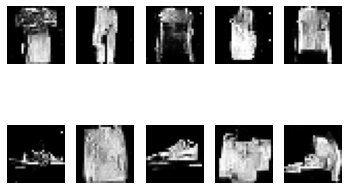

12401 [D loss: 0.682452, acc.: 57.81%] [G loss: 0.732438]
12402 [D loss: 0.684330, acc.: 57.42%] [G loss: 0.729149]
12403 [D loss: 0.681630, acc.: 57.03%] [G loss: 0.725087]
12404 [D loss: 0.684702, acc.: 50.39%] [G loss: 0.729018]
12405 [D loss: 0.682024, acc.: 56.25%] [G loss: 0.728821]
12406 [D loss: 0.678431, acc.: 59.38%] [G loss: 0.726330]
12407 [D loss: 0.677006, acc.: 59.77%] [G loss: 0.727623]
12408 [D loss: 0.683265, acc.: 56.64%] [G loss: 0.724603]
12409 [D loss: 0.675589, acc.: 61.33%] [G loss: 0.723877]
12410 [D loss: 0.686940, acc.: 53.52%] [G loss: 0.736280]
12411 [D loss: 0.689118, acc.: 53.12%] [G loss: 0.737731]
12412 [D loss: 0.676452, acc.: 62.50%] [G loss: 0.743068]
12413 [D loss: 0.672053, acc.: 63.28%] [G loss: 0.737727]
12414 [D loss: 0.673600, acc.: 61.72%] [G loss: 0.740222]
12415 [D loss: 0.670167, acc.: 66.02%] [G loss: 0.735159]
12416 [D loss: 0.675832, acc.: 61.72%] [G loss: 0.739918]
12417 [D loss: 0.675659, acc.: 63.67%] [G loss: 0.727981]
12418 [D loss:

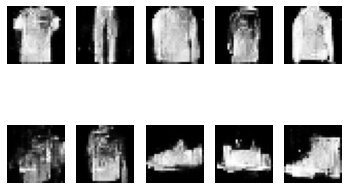

12601 [D loss: 0.695390, acc.: 48.05%] [G loss: 0.706494]
12602 [D loss: 0.694078, acc.: 53.12%] [G loss: 0.704054]
12603 [D loss: 0.692580, acc.: 51.17%] [G loss: 0.705155]
12604 [D loss: 0.696687, acc.: 50.39%] [G loss: 0.710196]
12605 [D loss: 0.693407, acc.: 54.69%] [G loss: 0.711207]
12606 [D loss: 0.693447, acc.: 53.12%] [G loss: 0.707366]
12607 [D loss: 0.698608, acc.: 52.34%] [G loss: 0.705647]
12608 [D loss: 0.699138, acc.: 51.17%] [G loss: 0.698868]
12609 [D loss: 0.699367, acc.: 45.31%] [G loss: 0.705934]
12610 [D loss: 0.698692, acc.: 46.09%] [G loss: 0.697401]
12611 [D loss: 0.699122, acc.: 47.66%] [G loss: 0.700307]
12612 [D loss: 0.698845, acc.: 46.09%] [G loss: 0.693963]
12613 [D loss: 0.702415, acc.: 42.97%] [G loss: 0.683722]
12614 [D loss: 0.700847, acc.: 44.92%] [G loss: 0.692287]
12615 [D loss: 0.702616, acc.: 37.11%] [G loss: 0.690508]
12616 [D loss: 0.702818, acc.: 35.16%] [G loss: 0.689405]
12617 [D loss: 0.703348, acc.: 41.41%] [G loss: 0.691863]
12618 [D loss:

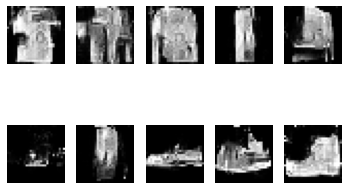

12801 [D loss: 0.692591, acc.: 48.83%] [G loss: 0.699567]
12802 [D loss: 0.687886, acc.: 53.91%] [G loss: 0.703318]
12803 [D loss: 0.688922, acc.: 58.59%] [G loss: 0.701119]
12804 [D loss: 0.693001, acc.: 48.83%] [G loss: 0.701124]
12805 [D loss: 0.691070, acc.: 51.95%] [G loss: 0.700509]
12806 [D loss: 0.689890, acc.: 53.12%] [G loss: 0.700899]
12807 [D loss: 0.694397, acc.: 48.05%] [G loss: 0.700210]
12808 [D loss: 0.688790, acc.: 53.91%] [G loss: 0.704107]
12809 [D loss: 0.691208, acc.: 51.17%] [G loss: 0.698065]
12810 [D loss: 0.689058, acc.: 53.52%] [G loss: 0.702506]
12811 [D loss: 0.690542, acc.: 52.34%] [G loss: 0.703024]
12812 [D loss: 0.689210, acc.: 53.52%] [G loss: 0.700180]
12813 [D loss: 0.690971, acc.: 53.52%] [G loss: 0.697297]
12814 [D loss: 0.689393, acc.: 53.52%] [G loss: 0.704618]
12815 [D loss: 0.691082, acc.: 53.91%] [G loss: 0.704041]
12816 [D loss: 0.691392, acc.: 55.86%] [G loss: 0.701176]
12817 [D loss: 0.690006, acc.: 56.64%] [G loss: 0.702184]
12818 [D loss:

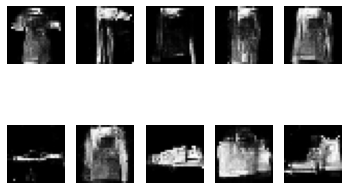

13001 [D loss: 0.710755, acc.: 34.38%] [G loss: 0.697676]
13002 [D loss: 0.694903, acc.: 52.73%] [G loss: 0.696181]
13003 [D loss: 0.694759, acc.: 49.22%] [G loss: 0.711856]
13004 [D loss: 0.686861, acc.: 56.25%] [G loss: 0.713948]
13005 [D loss: 0.698756, acc.: 48.83%] [G loss: 0.708687]
13006 [D loss: 0.689816, acc.: 51.95%] [G loss: 0.723705]
13007 [D loss: 0.692556, acc.: 53.12%] [G loss: 0.718327]
13008 [D loss: 0.688869, acc.: 54.30%] [G loss: 0.707612]
13009 [D loss: 0.695561, acc.: 46.88%] [G loss: 0.692436]
13010 [D loss: 0.696321, acc.: 46.09%] [G loss: 0.682622]
13011 [D loss: 0.708160, acc.: 43.36%] [G loss: 0.694059]
13012 [D loss: 0.698468, acc.: 49.22%] [G loss: 0.678132]
13013 [D loss: 0.708906, acc.: 46.48%] [G loss: 0.671962]
13014 [D loss: 0.717646, acc.: 36.72%] [G loss: 0.672627]
13015 [D loss: 0.709272, acc.: 42.97%] [G loss: 0.674975]
13016 [D loss: 0.705204, acc.: 43.36%] [G loss: 0.678021]
13017 [D loss: 0.711062, acc.: 39.06%] [G loss: 0.683284]
13018 [D loss:

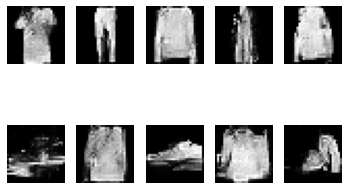

13201 [D loss: 0.692663, acc.: 55.47%] [G loss: 0.692961]
13202 [D loss: 0.693714, acc.: 50.78%] [G loss: 0.695855]
13203 [D loss: 0.691307, acc.: 53.91%] [G loss: 0.696622]
13204 [D loss: 0.692767, acc.: 53.52%] [G loss: 0.698004]
13205 [D loss: 0.691610, acc.: 55.47%] [G loss: 0.691348]
13206 [D loss: 0.693018, acc.: 50.39%] [G loss: 0.698506]
13207 [D loss: 0.691721, acc.: 53.52%] [G loss: 0.694181]
13208 [D loss: 0.691669, acc.: 54.69%] [G loss: 0.698853]
13209 [D loss: 0.694532, acc.: 51.95%] [G loss: 0.693877]
13210 [D loss: 0.691077, acc.: 56.25%] [G loss: 0.697095]
13211 [D loss: 0.693862, acc.: 52.73%] [G loss: 0.695070]
13212 [D loss: 0.692341, acc.: 55.08%] [G loss: 0.695858]
13213 [D loss: 0.693542, acc.: 53.52%] [G loss: 0.692690]
13214 [D loss: 0.692264, acc.: 54.30%] [G loss: 0.696825]
13215 [D loss: 0.692918, acc.: 47.66%] [G loss: 0.696864]
13216 [D loss: 0.691562, acc.: 54.30%] [G loss: 0.693171]
13217 [D loss: 0.691062, acc.: 55.86%] [G loss: 0.696258]
13218 [D loss:

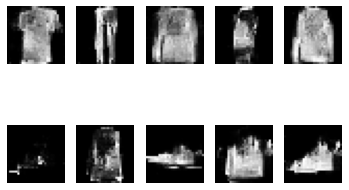

13401 [D loss: 0.687407, acc.: 55.86%] [G loss: 0.716980]
13402 [D loss: 0.684870, acc.: 55.86%] [G loss: 0.717108]
13403 [D loss: 0.688591, acc.: 54.30%] [G loss: 0.713813]
13404 [D loss: 0.686401, acc.: 53.12%] [G loss: 0.710215]
13405 [D loss: 0.693678, acc.: 44.92%] [G loss: 0.715677]
13406 [D loss: 0.688768, acc.: 51.95%] [G loss: 0.709700]
13407 [D loss: 0.692124, acc.: 51.95%] [G loss: 0.712428]
13408 [D loss: 0.690570, acc.: 52.34%] [G loss: 0.711953]
13409 [D loss: 0.693434, acc.: 50.78%] [G loss: 0.706407]
13410 [D loss: 0.693239, acc.: 53.12%] [G loss: 0.707726]
13411 [D loss: 0.695718, acc.: 50.00%] [G loss: 0.710113]
13412 [D loss: 0.690934, acc.: 53.12%] [G loss: 0.712323]
13413 [D loss: 0.693809, acc.: 50.39%] [G loss: 0.716362]
13414 [D loss: 0.689680, acc.: 55.08%] [G loss: 0.719066]
13415 [D loss: 0.690776, acc.: 49.61%] [G loss: 0.721687]
13416 [D loss: 0.689978, acc.: 51.95%] [G loss: 0.718403]
13417 [D loss: 0.689938, acc.: 56.64%] [G loss: 0.723366]
13418 [D loss:

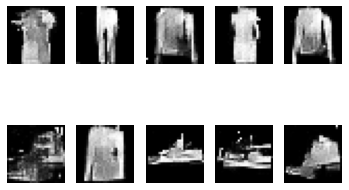

13601 [D loss: 0.699807, acc.: 39.84%] [G loss: 0.694284]
13602 [D loss: 0.699207, acc.: 41.41%] [G loss: 0.696689]
13603 [D loss: 0.697836, acc.: 44.53%] [G loss: 0.700035]
13604 [D loss: 0.695114, acc.: 49.61%] [G loss: 0.697698]
13605 [D loss: 0.696245, acc.: 48.05%] [G loss: 0.703957]
13606 [D loss: 0.694417, acc.: 51.95%] [G loss: 0.697144]
13607 [D loss: 0.695415, acc.: 51.56%] [G loss: 0.700555]
13608 [D loss: 0.695639, acc.: 51.17%] [G loss: 0.699968]
13609 [D loss: 0.693821, acc.: 50.78%] [G loss: 0.704639]
13610 [D loss: 0.693701, acc.: 53.91%] [G loss: 0.707193]
13611 [D loss: 0.690941, acc.: 54.69%] [G loss: 0.705415]
13612 [D loss: 0.696049, acc.: 52.73%] [G loss: 0.717015]
13613 [D loss: 0.687237, acc.: 55.86%] [G loss: 0.706310]
13614 [D loss: 0.690078, acc.: 56.25%] [G loss: 0.713360]
13615 [D loss: 0.690410, acc.: 56.64%] [G loss: 0.700395]
13616 [D loss: 0.687964, acc.: 54.30%] [G loss: 0.712629]
13617 [D loss: 0.688342, acc.: 58.20%] [G loss: 0.712075]
13618 [D loss:

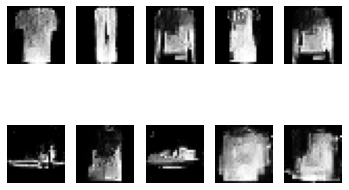

13801 [D loss: 0.688476, acc.: 50.00%] [G loss: 0.715423]
13802 [D loss: 0.693771, acc.: 46.09%] [G loss: 0.705511]
13803 [D loss: 0.691343, acc.: 47.66%] [G loss: 0.707863]
13804 [D loss: 0.697005, acc.: 45.31%] [G loss: 0.711302]
13805 [D loss: 0.692739, acc.: 51.56%] [G loss: 0.706692]
13806 [D loss: 0.690446, acc.: 53.12%] [G loss: 0.703966]
13807 [D loss: 0.691776, acc.: 52.34%] [G loss: 0.709726]
13808 [D loss: 0.693324, acc.: 50.00%] [G loss: 0.705151]
13809 [D loss: 0.696050, acc.: 51.17%] [G loss: 0.705075]
13810 [D loss: 0.695495, acc.: 50.00%] [G loss: 0.698609]
13811 [D loss: 0.688601, acc.: 53.52%] [G loss: 0.705139]
13812 [D loss: 0.693136, acc.: 50.78%] [G loss: 0.713257]
13813 [D loss: 0.689524, acc.: 55.47%] [G loss: 0.705499]
13814 [D loss: 0.688875, acc.: 60.16%] [G loss: 0.709679]
13815 [D loss: 0.691341, acc.: 58.59%] [G loss: 0.709182]
13816 [D loss: 0.690468, acc.: 60.55%] [G loss: 0.710785]
13817 [D loss: 0.689482, acc.: 57.42%] [G loss: 0.708329]
13818 [D loss:

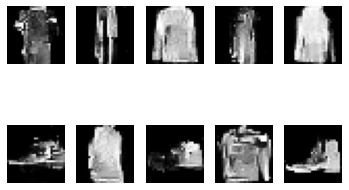

14001 [D loss: 0.689863, acc.: 54.30%] [G loss: 0.705511]
14002 [D loss: 0.693603, acc.: 53.12%] [G loss: 0.702664]
14003 [D loss: 0.692029, acc.: 52.34%] [G loss: 0.703782]
14004 [D loss: 0.690847, acc.: 50.78%] [G loss: 0.704475]
14005 [D loss: 0.689579, acc.: 53.12%] [G loss: 0.707640]
14006 [D loss: 0.687865, acc.: 54.30%] [G loss: 0.707348]
14007 [D loss: 0.688276, acc.: 53.91%] [G loss: 0.711125]
14008 [D loss: 0.685629, acc.: 56.25%] [G loss: 0.701501]
14009 [D loss: 0.687442, acc.: 53.12%] [G loss: 0.705760]
14010 [D loss: 0.689073, acc.: 48.83%] [G loss: 0.704875]
14011 [D loss: 0.687617, acc.: 51.17%] [G loss: 0.710221]
14012 [D loss: 0.688289, acc.: 51.17%] [G loss: 0.706773]
14013 [D loss: 0.683835, acc.: 59.38%] [G loss: 0.707500]
14014 [D loss: 0.687542, acc.: 55.47%] [G loss: 0.704567]
14015 [D loss: 0.688865, acc.: 55.47%] [G loss: 0.707952]
14016 [D loss: 0.688427, acc.: 53.12%] [G loss: 0.701862]
14017 [D loss: 0.686797, acc.: 54.30%] [G loss: 0.702250]
14018 [D loss:

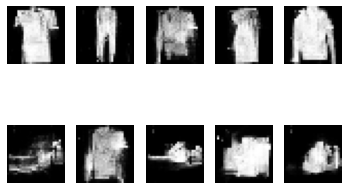

14201 [D loss: 0.695586, acc.: 41.80%] [G loss: 0.686109]
14202 [D loss: 0.700860, acc.: 32.42%] [G loss: 0.693560]
14203 [D loss: 0.703415, acc.: 38.28%] [G loss: 0.691879]
14204 [D loss: 0.700807, acc.: 42.19%] [G loss: 0.697969]
14205 [D loss: 0.702461, acc.: 36.33%] [G loss: 0.699393]
14206 [D loss: 0.699704, acc.: 36.72%] [G loss: 0.712023]
14207 [D loss: 0.706435, acc.: 38.28%] [G loss: 0.711544]
14208 [D loss: 0.699022, acc.: 43.36%] [G loss: 0.714989]
14209 [D loss: 0.709425, acc.: 37.89%] [G loss: 0.711564]
14210 [D loss: 0.702618, acc.: 37.11%] [G loss: 0.708117]
14211 [D loss: 0.700469, acc.: 46.09%] [G loss: 0.713050]
14212 [D loss: 0.703565, acc.: 42.58%] [G loss: 0.710617]
14213 [D loss: 0.702802, acc.: 48.05%] [G loss: 0.714501]
14214 [D loss: 0.696297, acc.: 51.95%] [G loss: 0.730385]
14215 [D loss: 0.691251, acc.: 55.47%] [G loss: 0.726140]
14216 [D loss: 0.693165, acc.: 50.78%] [G loss: 0.734797]
14217 [D loss: 0.691801, acc.: 51.17%] [G loss: 0.723694]
14218 [D loss:

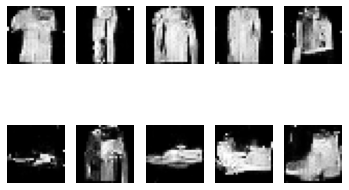

14401 [D loss: 0.677239, acc.: 54.30%] [G loss: 0.711102]
14402 [D loss: 0.680787, acc.: 55.08%] [G loss: 0.715131]
14403 [D loss: 0.687343, acc.: 51.17%] [G loss: 0.717030]
14404 [D loss: 0.676264, acc.: 58.98%] [G loss: 0.703046]
14405 [D loss: 0.678826, acc.: 53.91%] [G loss: 0.710390]
14406 [D loss: 0.682739, acc.: 52.34%] [G loss: 0.706934]
14407 [D loss: 0.684081, acc.: 46.09%] [G loss: 0.699942]
14408 [D loss: 0.692319, acc.: 46.88%] [G loss: 0.718852]
14409 [D loss: 0.697817, acc.: 42.19%] [G loss: 0.716636]
14410 [D loss: 0.694257, acc.: 45.70%] [G loss: 0.710389]
14411 [D loss: 0.703808, acc.: 39.45%] [G loss: 0.707763]
14412 [D loss: 0.690709, acc.: 44.92%] [G loss: 0.700607]
14413 [D loss: 0.687650, acc.: 48.44%] [G loss: 0.700404]
14414 [D loss: 0.696411, acc.: 46.88%] [G loss: 0.696881]
14415 [D loss: 0.695324, acc.: 49.22%] [G loss: 0.715507]
14416 [D loss: 0.686327, acc.: 52.34%] [G loss: 0.709757]
14417 [D loss: 0.699233, acc.: 48.83%] [G loss: 0.718023]
14418 [D loss:

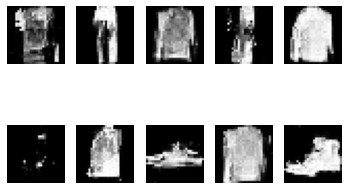

14601 [D loss: 0.689391, acc.: 48.83%] [G loss: 0.738225]
14602 [D loss: 0.689348, acc.: 51.56%] [G loss: 0.735861]
14603 [D loss: 0.686158, acc.: 58.20%] [G loss: 0.726112]
14604 [D loss: 0.684234, acc.: 54.69%] [G loss: 0.728474]
14605 [D loss: 0.689335, acc.: 53.91%] [G loss: 0.725590]
14606 [D loss: 0.692603, acc.: 51.17%] [G loss: 0.715694]
14607 [D loss: 0.694956, acc.: 49.61%] [G loss: 0.714836]
14608 [D loss: 0.697858, acc.: 44.53%] [G loss: 0.707634]
14609 [D loss: 0.688634, acc.: 51.17%] [G loss: 0.709293]
14610 [D loss: 0.698053, acc.: 41.80%] [G loss: 0.704638]
14611 [D loss: 0.690023, acc.: 48.44%] [G loss: 0.707185]
14612 [D loss: 0.696955, acc.: 42.58%] [G loss: 0.712860]
14613 [D loss: 0.691372, acc.: 49.22%] [G loss: 0.711213]
14614 [D loss: 0.697584, acc.: 42.97%] [G loss: 0.711237]
14615 [D loss: 0.695702, acc.: 44.14%] [G loss: 0.717580]
14616 [D loss: 0.693132, acc.: 47.66%] [G loss: 0.711969]
14617 [D loss: 0.691646, acc.: 46.88%] [G loss: 0.717965]
14618 [D loss:

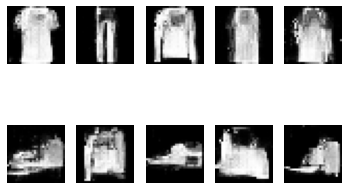

14801 [D loss: 0.695912, acc.: 46.48%] [G loss: 0.706280]
14802 [D loss: 0.695083, acc.: 53.12%] [G loss: 0.710957]
14803 [D loss: 0.695763, acc.: 53.52%] [G loss: 0.710772]
14804 [D loss: 0.691959, acc.: 57.03%] [G loss: 0.716247]
14805 [D loss: 0.695900, acc.: 52.34%] [G loss: 0.714698]
14806 [D loss: 0.692379, acc.: 57.81%] [G loss: 0.718207]
14807 [D loss: 0.690796, acc.: 55.86%] [G loss: 0.714577]
14808 [D loss: 0.691853, acc.: 53.12%] [G loss: 0.728188]
14809 [D loss: 0.690622, acc.: 54.69%] [G loss: 0.713056]
14810 [D loss: 0.686569, acc.: 58.20%] [G loss: 0.723434]
14811 [D loss: 0.689676, acc.: 53.12%] [G loss: 0.721900]
14812 [D loss: 0.689677, acc.: 56.25%] [G loss: 0.731909]
14813 [D loss: 0.691839, acc.: 54.30%] [G loss: 0.725224]
14814 [D loss: 0.692317, acc.: 50.78%] [G loss: 0.716153]
14815 [D loss: 0.685325, acc.: 53.52%] [G loss: 0.717529]
14816 [D loss: 0.686290, acc.: 54.30%] [G loss: 0.714341]
14817 [D loss: 0.694394, acc.: 51.17%] [G loss: 0.715952]
14818 [D loss:

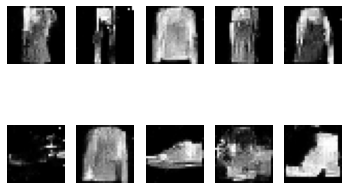

15001 [D loss: 0.692339, acc.: 50.39%] [G loss: 0.698454]
15002 [D loss: 0.691404, acc.: 55.47%] [G loss: 0.699641]
15003 [D loss: 0.692790, acc.: 47.66%] [G loss: 0.702887]
15004 [D loss: 0.694598, acc.: 44.92%] [G loss: 0.696962]
15005 [D loss: 0.689549, acc.: 50.00%] [G loss: 0.698081]
15006 [D loss: 0.692471, acc.: 47.27%] [G loss: 0.698893]
15007 [D loss: 0.694699, acc.: 42.58%] [G loss: 0.697830]
15008 [D loss: 0.695760, acc.: 40.23%] [G loss: 0.692355]
15009 [D loss: 0.692593, acc.: 45.70%] [G loss: 0.696143]
15010 [D loss: 0.697182, acc.: 40.62%] [G loss: 0.692774]
15011 [D loss: 0.695082, acc.: 42.19%] [G loss: 0.691322]
15012 [D loss: 0.694720, acc.: 44.14%] [G loss: 0.690576]
15013 [D loss: 0.696476, acc.: 37.89%] [G loss: 0.690587]
15014 [D loss: 0.696306, acc.: 39.84%] [G loss: 0.690943]
15015 [D loss: 0.695330, acc.: 41.02%] [G loss: 0.687621]
15016 [D loss: 0.696601, acc.: 36.33%] [G loss: 0.689562]
15017 [D loss: 0.697388, acc.: 40.23%] [G loss: 0.684886]
15018 [D loss:

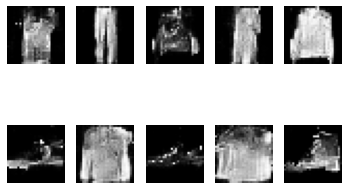

15201 [D loss: 0.697033, acc.: 42.58%] [G loss: 0.691001]
15202 [D loss: 0.698935, acc.: 43.36%] [G loss: 0.690172]
15203 [D loss: 0.697693, acc.: 43.36%] [G loss: 0.689517]
15204 [D loss: 0.698161, acc.: 44.53%] [G loss: 0.683907]
15205 [D loss: 0.700440, acc.: 40.23%] [G loss: 0.687387]
15206 [D loss: 0.698653, acc.: 42.19%] [G loss: 0.689193]
15207 [D loss: 0.699201, acc.: 42.19%] [G loss: 0.680964]
15208 [D loss: 0.694379, acc.: 46.88%] [G loss: 0.683607]
15209 [D loss: 0.695313, acc.: 45.70%] [G loss: 0.688834]
15210 [D loss: 0.696489, acc.: 46.88%] [G loss: 0.689816]
15211 [D loss: 0.695933, acc.: 47.27%] [G loss: 0.687368]
15212 [D loss: 0.692756, acc.: 47.66%] [G loss: 0.688179]
15213 [D loss: 0.694653, acc.: 46.48%] [G loss: 0.688881]
15214 [D loss: 0.694993, acc.: 46.48%] [G loss: 0.687304]
15215 [D loss: 0.694926, acc.: 46.88%] [G loss: 0.692880]
15216 [D loss: 0.692713, acc.: 48.05%] [G loss: 0.697856]
15217 [D loss: 0.693335, acc.: 53.12%] [G loss: 0.687716]
15218 [D loss:

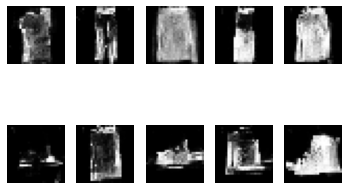

15401 [D loss: 0.697522, acc.: 40.62%] [G loss: 0.712633]
15402 [D loss: 0.701816, acc.: 39.06%] [G loss: 0.714092]
15403 [D loss: 0.698003, acc.: 46.88%] [G loss: 0.718397]
15404 [D loss: 0.698225, acc.: 44.92%] [G loss: 0.728974]
15405 [D loss: 0.692326, acc.: 47.27%] [G loss: 0.721798]
15406 [D loss: 0.691756, acc.: 50.00%] [G loss: 0.732152]
15407 [D loss: 0.690135, acc.: 52.73%] [G loss: 0.730533]
15408 [D loss: 0.686747, acc.: 53.12%] [G loss: 0.745121]
15409 [D loss: 0.688842, acc.: 55.86%] [G loss: 0.734318]
15410 [D loss: 0.689330, acc.: 55.47%] [G loss: 0.724760]
15411 [D loss: 0.692120, acc.: 55.86%] [G loss: 0.735960]
15412 [D loss: 0.687614, acc.: 55.08%] [G loss: 0.746293]
15413 [D loss: 0.686510, acc.: 58.98%] [G loss: 0.732180]
15414 [D loss: 0.679393, acc.: 60.16%] [G loss: 0.739669]
15415 [D loss: 0.681659, acc.: 60.16%] [G loss: 0.737841]
15416 [D loss: 0.676202, acc.: 62.50%] [G loss: 0.746879]
15417 [D loss: 0.685728, acc.: 55.08%] [G loss: 0.745611]
15418 [D loss:

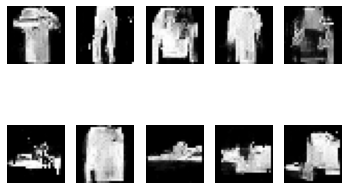

15601 [D loss: 0.678260, acc.: 64.06%] [G loss: 0.715057]
15602 [D loss: 0.686510, acc.: 61.33%] [G loss: 0.725944]
15603 [D loss: 0.674279, acc.: 64.06%] [G loss: 0.721037]
15604 [D loss: 0.681430, acc.: 62.50%] [G loss: 0.712440]
15605 [D loss: 0.683630, acc.: 60.55%] [G loss: 0.724177]
15606 [D loss: 0.678361, acc.: 65.62%] [G loss: 0.717463]
15607 [D loss: 0.673399, acc.: 68.36%] [G loss: 0.727709]
15608 [D loss: 0.678626, acc.: 60.94%] [G loss: 0.726897]
15609 [D loss: 0.675352, acc.: 67.97%] [G loss: 0.724513]
15610 [D loss: 0.673698, acc.: 66.80%] [G loss: 0.729055]
15611 [D loss: 0.669075, acc.: 65.23%] [G loss: 0.734711]
15612 [D loss: 0.677681, acc.: 60.55%] [G loss: 0.727907]
15613 [D loss: 0.680505, acc.: 57.03%] [G loss: 0.738145]
15614 [D loss: 0.681424, acc.: 60.16%] [G loss: 0.721159]
15615 [D loss: 0.683314, acc.: 55.08%] [G loss: 0.722409]
15616 [D loss: 0.684653, acc.: 54.69%] [G loss: 0.716264]
15617 [D loss: 0.685102, acc.: 54.69%] [G loss: 0.715147]
15618 [D loss:

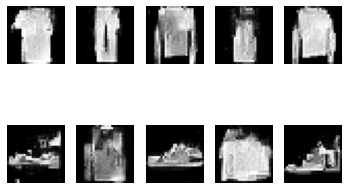

15801 [D loss: 0.691131, acc.: 55.47%] [G loss: 0.709492]
15802 [D loss: 0.691823, acc.: 51.56%] [G loss: 0.717614]
15803 [D loss: 0.691546, acc.: 58.20%] [G loss: 0.716827]
15804 [D loss: 0.691668, acc.: 50.00%] [G loss: 0.716512]
15805 [D loss: 0.694319, acc.: 50.39%] [G loss: 0.721432]
15806 [D loss: 0.691542, acc.: 50.39%] [G loss: 0.720190]
15807 [D loss: 0.691936, acc.: 55.47%] [G loss: 0.718845]
15808 [D loss: 0.691978, acc.: 57.81%] [G loss: 0.712292]
15809 [D loss: 0.694909, acc.: 49.22%] [G loss: 0.711591]
15810 [D loss: 0.691512, acc.: 50.39%] [G loss: 0.713842]
15811 [D loss: 0.692524, acc.: 53.91%] [G loss: 0.710007]
15812 [D loss: 0.693142, acc.: 54.30%] [G loss: 0.710097]
15813 [D loss: 0.694181, acc.: 48.05%] [G loss: 0.710689]
15814 [D loss: 0.690905, acc.: 53.91%] [G loss: 0.709332]
15815 [D loss: 0.693614, acc.: 57.03%] [G loss: 0.708086]
15816 [D loss: 0.694277, acc.: 50.78%] [G loss: 0.713225]
15817 [D loss: 0.694344, acc.: 53.12%] [G loss: 0.711610]
15818 [D loss:

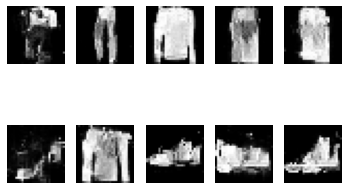

16001 [D loss: 0.675317, acc.: 60.55%] [G loss: 0.742004]
16002 [D loss: 0.674672, acc.: 67.19%] [G loss: 0.758411]
16003 [D loss: 0.676825, acc.: 66.41%] [G loss: 0.741777]
16004 [D loss: 0.676149, acc.: 67.19%] [G loss: 0.732053]
16005 [D loss: 0.681937, acc.: 61.72%] [G loss: 0.728287]
16006 [D loss: 0.687702, acc.: 60.16%] [G loss: 0.725325]
16007 [D loss: 0.687755, acc.: 60.16%] [G loss: 0.723106]
16008 [D loss: 0.688053, acc.: 59.38%] [G loss: 0.724242]
16009 [D loss: 0.689439, acc.: 59.38%] [G loss: 0.724677]
16010 [D loss: 0.686238, acc.: 57.03%] [G loss: 0.730178]
16011 [D loss: 0.694429, acc.: 49.61%] [G loss: 0.728994]
16012 [D loss: 0.691671, acc.: 53.12%] [G loss: 0.718285]
16013 [D loss: 0.698216, acc.: 47.27%] [G loss: 0.725136]
16014 [D loss: 0.692698, acc.: 54.69%] [G loss: 0.711731]
16015 [D loss: 0.697451, acc.: 44.92%] [G loss: 0.707066]
16016 [D loss: 0.700417, acc.: 41.80%] [G loss: 0.706769]
16017 [D loss: 0.699795, acc.: 44.53%] [G loss: 0.704547]
16018 [D loss:

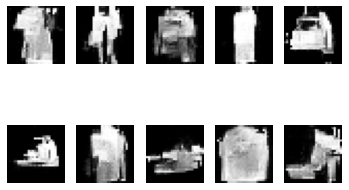

16201 [D loss: 0.697217, acc.: 52.73%] [G loss: 0.709602]
16202 [D loss: 0.693705, acc.: 55.47%] [G loss: 0.714471]
16203 [D loss: 0.687951, acc.: 60.16%] [G loss: 0.715684]
16204 [D loss: 0.685148, acc.: 64.84%] [G loss: 0.718918]
16205 [D loss: 0.693552, acc.: 56.64%] [G loss: 0.711227]
16206 [D loss: 0.689171, acc.: 59.77%] [G loss: 0.721102]
16207 [D loss: 0.689621, acc.: 61.33%] [G loss: 0.721714]
16208 [D loss: 0.690781, acc.: 61.72%] [G loss: 0.718842]
16209 [D loss: 0.690861, acc.: 63.67%] [G loss: 0.721050]
16210 [D loss: 0.693445, acc.: 60.55%] [G loss: 0.719026]
16211 [D loss: 0.692433, acc.: 60.16%] [G loss: 0.710092]
16212 [D loss: 0.693535, acc.: 59.38%] [G loss: 0.706020]
16213 [D loss: 0.684863, acc.: 62.89%] [G loss: 0.700700]
16214 [D loss: 0.699681, acc.: 47.66%] [G loss: 0.705581]
16215 [D loss: 0.695401, acc.: 53.52%] [G loss: 0.705082]
16216 [D loss: 0.697366, acc.: 48.83%] [G loss: 0.710904]
16217 [D loss: 0.692559, acc.: 56.64%] [G loss: 0.705502]
16218 [D loss:

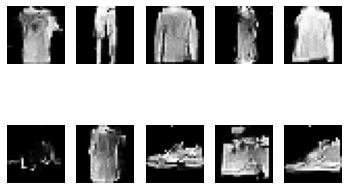

16401 [D loss: 0.690571, acc.: 51.95%] [G loss: 0.715328]
16402 [D loss: 0.690524, acc.: 52.34%] [G loss: 0.714213]
16403 [D loss: 0.690598, acc.: 51.17%] [G loss: 0.713665]
16404 [D loss: 0.692256, acc.: 57.03%] [G loss: 0.720010]
16405 [D loss: 0.690275, acc.: 51.56%] [G loss: 0.697233]
16406 [D loss: 0.689697, acc.: 52.73%] [G loss: 0.713871]
16407 [D loss: 0.688057, acc.: 55.08%] [G loss: 0.722984]
16408 [D loss: 0.691850, acc.: 50.00%] [G loss: 0.720240]
16409 [D loss: 0.687031, acc.: 55.08%] [G loss: 0.712698]
16410 [D loss: 0.690131, acc.: 52.34%] [G loss: 0.708662]
16411 [D loss: 0.689829, acc.: 50.39%] [G loss: 0.723267]
16412 [D loss: 0.686512, acc.: 53.52%] [G loss: 0.708014]
16413 [D loss: 0.686541, acc.: 50.39%] [G loss: 0.704535]
16414 [D loss: 0.689495, acc.: 49.61%] [G loss: 0.719470]
16415 [D loss: 0.687268, acc.: 50.00%] [G loss: 0.714072]
16416 [D loss: 0.692686, acc.: 42.58%] [G loss: 0.725059]
16417 [D loss: 0.684878, acc.: 49.22%] [G loss: 0.727520]
16418 [D loss:

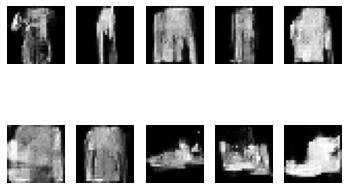

16601 [D loss: 0.696518, acc.: 44.53%] [G loss: 0.707571]
16602 [D loss: 0.693821, acc.: 47.27%] [G loss: 0.712624]
16603 [D loss: 0.695369, acc.: 47.27%] [G loss: 0.699654]
16604 [D loss: 0.695768, acc.: 44.92%] [G loss: 0.705317]
16605 [D loss: 0.695381, acc.: 46.48%] [G loss: 0.714688]
16606 [D loss: 0.699390, acc.: 41.80%] [G loss: 0.707374]
16607 [D loss: 0.693242, acc.: 51.56%] [G loss: 0.709804]
16608 [D loss: 0.692058, acc.: 45.70%] [G loss: 0.703779]
16609 [D loss: 0.689044, acc.: 50.78%] [G loss: 0.707453]
16610 [D loss: 0.694336, acc.: 44.14%] [G loss: 0.706378]
16611 [D loss: 0.700453, acc.: 41.02%] [G loss: 0.711726]
16612 [D loss: 0.704286, acc.: 38.28%] [G loss: 0.705069]
16613 [D loss: 0.699248, acc.: 40.62%] [G loss: 0.703284]
16614 [D loss: 0.696362, acc.: 45.70%] [G loss: 0.709740]
16615 [D loss: 0.696592, acc.: 45.70%] [G loss: 0.701221]
16616 [D loss: 0.689697, acc.: 48.83%] [G loss: 0.713590]
16617 [D loss: 0.698389, acc.: 45.70%] [G loss: 0.706477]
16618 [D loss:

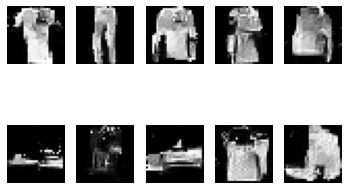

16801 [D loss: 0.683408, acc.: 57.03%] [G loss: 0.711180]
16802 [D loss: 0.686876, acc.: 51.56%] [G loss: 0.711211]
16803 [D loss: 0.686500, acc.: 55.47%] [G loss: 0.714380]
16804 [D loss: 0.686649, acc.: 55.86%] [G loss: 0.714220]
16805 [D loss: 0.682583, acc.: 57.81%] [G loss: 0.709141]
16806 [D loss: 0.681680, acc.: 53.52%] [G loss: 0.714485]
16807 [D loss: 0.685367, acc.: 49.61%] [G loss: 0.708921]
16808 [D loss: 0.689150, acc.: 51.95%] [G loss: 0.711666]
16809 [D loss: 0.682926, acc.: 52.34%] [G loss: 0.711332]
16810 [D loss: 0.685831, acc.: 53.12%] [G loss: 0.710601]
16811 [D loss: 0.682491, acc.: 54.30%] [G loss: 0.718058]
16812 [D loss: 0.687400, acc.: 54.30%] [G loss: 0.718861]
16813 [D loss: 0.686284, acc.: 47.66%] [G loss: 0.716213]
16814 [D loss: 0.679144, acc.: 54.69%] [G loss: 0.716898]
16815 [D loss: 0.683636, acc.: 56.25%] [G loss: 0.720872]
16816 [D loss: 0.680608, acc.: 53.12%] [G loss: 0.717310]
16817 [D loss: 0.681729, acc.: 55.47%] [G loss: 0.718922]
16818 [D loss:

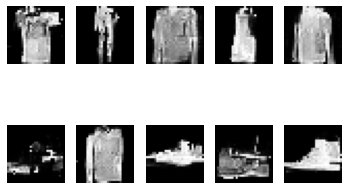

17001 [D loss: 0.697480, acc.: 41.80%] [G loss: 0.697650]
17002 [D loss: 0.693021, acc.: 50.39%] [G loss: 0.702424]
17003 [D loss: 0.695095, acc.: 46.09%] [G loss: 0.702626]
17004 [D loss: 0.699296, acc.: 39.06%] [G loss: 0.700829]
17005 [D loss: 0.695225, acc.: 45.70%] [G loss: 0.699390]
17006 [D loss: 0.698775, acc.: 43.36%] [G loss: 0.699506]
17007 [D loss: 0.696113, acc.: 48.44%] [G loss: 0.700888]
17008 [D loss: 0.693874, acc.: 51.56%] [G loss: 0.699684]
17009 [D loss: 0.695106, acc.: 48.44%] [G loss: 0.697265]
17010 [D loss: 0.696476, acc.: 47.27%] [G loss: 0.700476]
17011 [D loss: 0.694815, acc.: 48.05%] [G loss: 0.698951]
17012 [D loss: 0.693600, acc.: 51.95%] [G loss: 0.699847]
17013 [D loss: 0.694913, acc.: 51.56%] [G loss: 0.699643]
17014 [D loss: 0.693277, acc.: 57.81%] [G loss: 0.697447]
17015 [D loss: 0.695554, acc.: 51.95%] [G loss: 0.702681]
17016 [D loss: 0.693605, acc.: 52.73%] [G loss: 0.701668]
17017 [D loss: 0.693961, acc.: 51.17%] [G loss: 0.697408]
17018 [D loss:

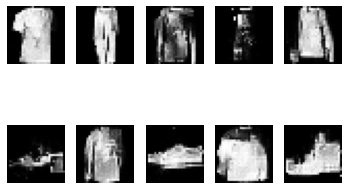

17201 [D loss: 0.705703, acc.: 41.41%] [G loss: 0.700104]
17202 [D loss: 0.703370, acc.: 41.02%] [G loss: 0.694854]
17203 [D loss: 0.704444, acc.: 42.97%] [G loss: 0.692619]
17204 [D loss: 0.708757, acc.: 39.84%] [G loss: 0.698244]
17205 [D loss: 0.702211, acc.: 41.02%] [G loss: 0.699849]
17206 [D loss: 0.703090, acc.: 44.14%] [G loss: 0.707966]
17207 [D loss: 0.701345, acc.: 44.14%] [G loss: 0.706063]
17208 [D loss: 0.702874, acc.: 40.62%] [G loss: 0.709302]
17209 [D loss: 0.702993, acc.: 44.53%] [G loss: 0.714081]
17210 [D loss: 0.696319, acc.: 43.75%] [G loss: 0.718074]
17211 [D loss: 0.699830, acc.: 46.09%] [G loss: 0.720493]
17212 [D loss: 0.697523, acc.: 47.66%] [G loss: 0.722266]
17213 [D loss: 0.695400, acc.: 51.95%] [G loss: 0.724440]
17214 [D loss: 0.696063, acc.: 47.66%] [G loss: 0.721067]
17215 [D loss: 0.699170, acc.: 46.88%] [G loss: 0.716257]
17216 [D loss: 0.697141, acc.: 49.22%] [G loss: 0.709368]
17217 [D loss: 0.703231, acc.: 43.36%] [G loss: 0.708195]
17218 [D loss:

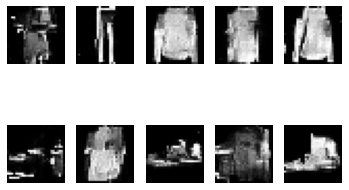

17401 [D loss: 0.698472, acc.: 42.19%] [G loss: 0.710190]
17402 [D loss: 0.699658, acc.: 44.92%] [G loss: 0.709036]
17403 [D loss: 0.700615, acc.: 41.80%] [G loss: 0.705291]
17404 [D loss: 0.693213, acc.: 45.70%] [G loss: 0.704534]
17405 [D loss: 0.696337, acc.: 44.92%] [G loss: 0.708397]
17406 [D loss: 0.697542, acc.: 47.66%] [G loss: 0.710353]
17407 [D loss: 0.699789, acc.: 44.14%] [G loss: 0.726106]
17408 [D loss: 0.699383, acc.: 48.05%] [G loss: 0.719103]
17409 [D loss: 0.697135, acc.: 47.66%] [G loss: 0.730882]
17410 [D loss: 0.697551, acc.: 49.22%] [G loss: 0.732554]
17411 [D loss: 0.694316, acc.: 51.17%] [G loss: 0.716076]
17412 [D loss: 0.697389, acc.: 48.05%] [G loss: 0.717581]
17413 [D loss: 0.692857, acc.: 54.69%] [G loss: 0.723027]
17414 [D loss: 0.693824, acc.: 50.78%] [G loss: 0.721042]
17415 [D loss: 0.703085, acc.: 43.75%] [G loss: 0.726264]
17416 [D loss: 0.696680, acc.: 48.83%] [G loss: 0.720151]
17417 [D loss: 0.700636, acc.: 41.41%] [G loss: 0.718868]
17418 [D loss:

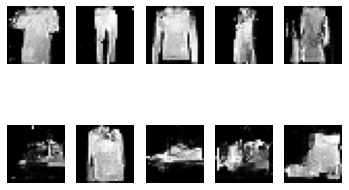

17601 [D loss: 0.692826, acc.: 44.53%] [G loss: 0.710140]
17602 [D loss: 0.695352, acc.: 43.75%] [G loss: 0.701518]
17603 [D loss: 0.698025, acc.: 43.36%] [G loss: 0.703399]
17604 [D loss: 0.693906, acc.: 46.48%] [G loss: 0.714256]
17605 [D loss: 0.694100, acc.: 42.97%] [G loss: 0.699969]
17606 [D loss: 0.698581, acc.: 36.33%] [G loss: 0.712341]
17607 [D loss: 0.696616, acc.: 38.28%] [G loss: 0.696765]
17608 [D loss: 0.697384, acc.: 40.62%] [G loss: 0.701185]
17609 [D loss: 0.694892, acc.: 43.75%] [G loss: 0.703431]
17610 [D loss: 0.697786, acc.: 39.84%] [G loss: 0.714871]
17611 [D loss: 0.698745, acc.: 38.28%] [G loss: 0.712409]
17612 [D loss: 0.695795, acc.: 44.92%] [G loss: 0.703441]
17613 [D loss: 0.698897, acc.: 41.80%] [G loss: 0.706581]
17614 [D loss: 0.698325, acc.: 45.70%] [G loss: 0.697214]
17615 [D loss: 0.698236, acc.: 48.44%] [G loss: 0.698576]
17616 [D loss: 0.692940, acc.: 47.66%] [G loss: 0.700674]
17617 [D loss: 0.698392, acc.: 42.19%] [G loss: 0.702429]
17618 [D loss:

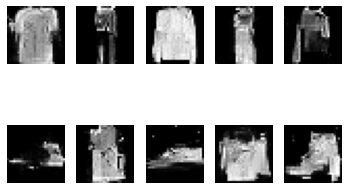

17801 [D loss: 0.693376, acc.: 53.52%] [G loss: 0.698300]
17802 [D loss: 0.695225, acc.: 49.61%] [G loss: 0.698486]
17803 [D loss: 0.693731, acc.: 51.95%] [G loss: 0.701686]
17804 [D loss: 0.698833, acc.: 51.17%] [G loss: 0.702727]
17805 [D loss: 0.688315, acc.: 52.73%] [G loss: 0.701080]
17806 [D loss: 0.693115, acc.: 46.48%] [G loss: 0.698434]
17807 [D loss: 0.692551, acc.: 51.17%] [G loss: 0.695333]
17808 [D loss: 0.694371, acc.: 43.75%] [G loss: 0.697087]
17809 [D loss: 0.694202, acc.: 48.05%] [G loss: 0.695845]
17810 [D loss: 0.693824, acc.: 48.44%] [G loss: 0.696172]
17811 [D loss: 0.689877, acc.: 53.12%] [G loss: 0.697875]
17812 [D loss: 0.690980, acc.: 51.95%] [G loss: 0.696301]
17813 [D loss: 0.695682, acc.: 45.31%] [G loss: 0.700086]
17814 [D loss: 0.692535, acc.: 47.66%] [G loss: 0.691626]
17815 [D loss: 0.693387, acc.: 47.66%] [G loss: 0.699763]
17816 [D loss: 0.693383, acc.: 47.66%] [G loss: 0.698877]
17817 [D loss: 0.694643, acc.: 44.14%] [G loss: 0.697995]
17818 [D loss:

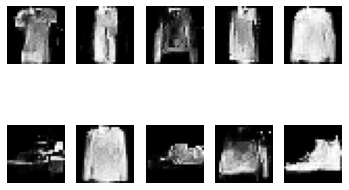

18001 [D loss: 0.702871, acc.: 41.02%] [G loss: 0.705858]
18002 [D loss: 0.697403, acc.: 43.75%] [G loss: 0.706635]
18003 [D loss: 0.699415, acc.: 43.36%] [G loss: 0.714828]
18004 [D loss: 0.695741, acc.: 50.39%] [G loss: 0.713666]
18005 [D loss: 0.693630, acc.: 44.53%] [G loss: 0.715931]
18006 [D loss: 0.701314, acc.: 44.14%] [G loss: 0.707324]
18007 [D loss: 0.694820, acc.: 47.27%] [G loss: 0.709658]
18008 [D loss: 0.694907, acc.: 49.22%] [G loss: 0.714187]
18009 [D loss: 0.693240, acc.: 54.30%] [G loss: 0.706065]
18010 [D loss: 0.695356, acc.: 46.88%] [G loss: 0.711427]
18011 [D loss: 0.691426, acc.: 54.69%] [G loss: 0.717524]
18012 [D loss: 0.695872, acc.: 51.17%] [G loss: 0.706239]
18013 [D loss: 0.690307, acc.: 54.30%] [G loss: 0.713165]
18014 [D loss: 0.692943, acc.: 53.12%] [G loss: 0.707134]
18015 [D loss: 0.691290, acc.: 52.73%] [G loss: 0.715572]
18016 [D loss: 0.695464, acc.: 50.78%] [G loss: 0.714917]
18017 [D loss: 0.695169, acc.: 50.39%] [G loss: 0.708191]
18018 [D loss:

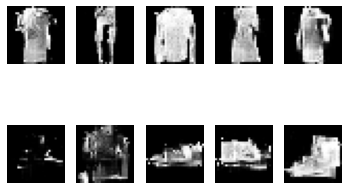

18201 [D loss: 0.676567, acc.: 59.38%] [G loss: 0.747779]
18202 [D loss: 0.674975, acc.: 62.50%] [G loss: 0.757619]
18203 [D loss: 0.683685, acc.: 56.25%] [G loss: 0.740116]
18204 [D loss: 0.672799, acc.: 66.41%] [G loss: 0.744354]
18205 [D loss: 0.673794, acc.: 60.55%] [G loss: 0.751853]
18206 [D loss: 0.669325, acc.: 66.02%] [G loss: 0.762745]
18207 [D loss: 0.668643, acc.: 67.58%] [G loss: 0.765028]
18208 [D loss: 0.663337, acc.: 66.02%] [G loss: 0.746897]
18209 [D loss: 0.673462, acc.: 63.28%] [G loss: 0.761422]
18210 [D loss: 0.661772, acc.: 65.23%] [G loss: 0.747252]
18211 [D loss: 0.669632, acc.: 62.89%] [G loss: 0.750855]
18212 [D loss: 0.673903, acc.: 63.28%] [G loss: 0.751136]
18213 [D loss: 0.668851, acc.: 63.67%] [G loss: 0.753655]
18214 [D loss: 0.683150, acc.: 58.20%] [G loss: 0.762757]
18215 [D loss: 0.677832, acc.: 56.64%] [G loss: 0.741130]
18216 [D loss: 0.679473, acc.: 53.12%] [G loss: 0.752071]
18217 [D loss: 0.674029, acc.: 57.03%] [G loss: 0.746485]
18218 [D loss:

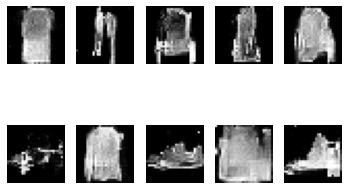

18401 [D loss: 0.685230, acc.: 57.03%] [G loss: 0.737908]
18402 [D loss: 0.685534, acc.: 55.08%] [G loss: 0.729165]
18403 [D loss: 0.688626, acc.: 50.00%] [G loss: 0.738983]
18404 [D loss: 0.687640, acc.: 51.56%] [G loss: 0.724231]
18405 [D loss: 0.693832, acc.: 47.66%] [G loss: 0.724726]
18406 [D loss: 0.691904, acc.: 50.39%] [G loss: 0.731463]
18407 [D loss: 0.692038, acc.: 49.22%] [G loss: 0.713926]
18408 [D loss: 0.683908, acc.: 55.08%] [G loss: 0.717907]
18409 [D loss: 0.691733, acc.: 48.05%] [G loss: 0.711702]
18410 [D loss: 0.684637, acc.: 51.95%] [G loss: 0.720038]
18411 [D loss: 0.683868, acc.: 51.95%] [G loss: 0.703593]
18412 [D loss: 0.678558, acc.: 56.25%] [G loss: 0.721675]
18413 [D loss: 0.693549, acc.: 48.44%] [G loss: 0.707929]
18414 [D loss: 0.688793, acc.: 47.66%] [G loss: 0.710160]
18415 [D loss: 0.685455, acc.: 53.52%] [G loss: 0.702935]
18416 [D loss: 0.690794, acc.: 54.30%] [G loss: 0.702407]
18417 [D loss: 0.692979, acc.: 50.78%] [G loss: 0.712813]
18418 [D loss:

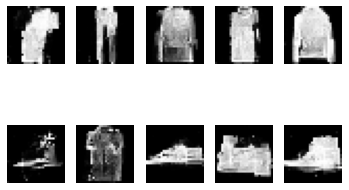

18601 [D loss: 0.698561, acc.: 48.44%] [G loss: 0.710810]
18602 [D loss: 0.690822, acc.: 53.91%] [G loss: 0.718674]
18603 [D loss: 0.698780, acc.: 48.44%] [G loss: 0.709195]
18604 [D loss: 0.695149, acc.: 45.31%] [G loss: 0.701269]
18605 [D loss: 0.695213, acc.: 50.39%] [G loss: 0.702768]
18606 [D loss: 0.695116, acc.: 51.56%] [G loss: 0.708688]
18607 [D loss: 0.691892, acc.: 53.12%] [G loss: 0.712681]
18608 [D loss: 0.702395, acc.: 46.09%] [G loss: 0.706978]
18609 [D loss: 0.697427, acc.: 48.05%] [G loss: 0.709621]
18610 [D loss: 0.689823, acc.: 51.17%] [G loss: 0.723221]
18611 [D loss: 0.692319, acc.: 48.44%] [G loss: 0.730964]
18612 [D loss: 0.685652, acc.: 52.73%] [G loss: 0.720499]
18613 [D loss: 0.687221, acc.: 50.39%] [G loss: 0.715655]
18614 [D loss: 0.685675, acc.: 57.03%] [G loss: 0.726044]
18615 [D loss: 0.690900, acc.: 52.73%] [G loss: 0.726432]
18616 [D loss: 0.686704, acc.: 55.86%] [G loss: 0.722295]
18617 [D loss: 0.679444, acc.: 56.25%] [G loss: 0.722492]
18618 [D loss:

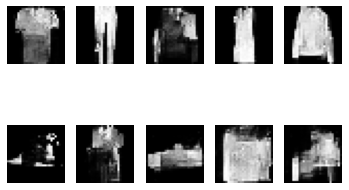

18801 [D loss: 0.704608, acc.: 46.09%] [G loss: 0.693819]
18802 [D loss: 0.698137, acc.: 48.05%] [G loss: 0.704790]
18803 [D loss: 0.700874, acc.: 49.61%] [G loss: 0.696619]
18804 [D loss: 0.705948, acc.: 48.44%] [G loss: 0.686175]
18805 [D loss: 0.705913, acc.: 48.05%] [G loss: 0.691549]
18806 [D loss: 0.707793, acc.: 51.17%] [G loss: 0.699790]
18807 [D loss: 0.703774, acc.: 49.22%] [G loss: 0.699585]
18808 [D loss: 0.697450, acc.: 55.47%] [G loss: 0.694241]
18809 [D loss: 0.707052, acc.: 50.78%] [G loss: 0.712072]
18810 [D loss: 0.696776, acc.: 53.12%] [G loss: 0.712797]
18811 [D loss: 0.697026, acc.: 50.39%] [G loss: 0.715586]
18812 [D loss: 0.694624, acc.: 50.78%] [G loss: 0.706440]
18813 [D loss: 0.702857, acc.: 50.00%] [G loss: 0.718971]
18814 [D loss: 0.697580, acc.: 48.44%] [G loss: 0.717425]
18815 [D loss: 0.691125, acc.: 50.00%] [G loss: 0.726014]
18816 [D loss: 0.695736, acc.: 47.66%] [G loss: 0.719073]
18817 [D loss: 0.693052, acc.: 46.09%] [G loss: 0.728297]
18818 [D loss:

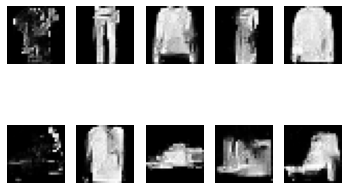

19001 [D loss: 0.681503, acc.: 55.08%] [G loss: 0.733501]
19002 [D loss: 0.684413, acc.: 49.22%] [G loss: 0.705002]
19003 [D loss: 0.696450, acc.: 40.62%] [G loss: 0.705520]
19004 [D loss: 0.698591, acc.: 44.14%] [G loss: 0.702061]
19005 [D loss: 0.698234, acc.: 45.70%] [G loss: 0.712842]
19006 [D loss: 0.684047, acc.: 55.47%] [G loss: 0.705643]
19007 [D loss: 0.697647, acc.: 49.22%] [G loss: 0.688449]
19008 [D loss: 0.693466, acc.: 54.69%] [G loss: 0.696032]
19009 [D loss: 0.705991, acc.: 47.66%] [G loss: 0.706179]
19010 [D loss: 0.708728, acc.: 44.53%] [G loss: 0.709789]
19011 [D loss: 0.698477, acc.: 49.22%] [G loss: 0.684637]
19012 [D loss: 0.707685, acc.: 43.75%] [G loss: 0.704632]
19013 [D loss: 0.703930, acc.: 42.58%] [G loss: 0.694474]
19014 [D loss: 0.699086, acc.: 46.88%] [G loss: 0.703013]
19015 [D loss: 0.701976, acc.: 46.09%] [G loss: 0.698351]
19016 [D loss: 0.702791, acc.: 47.66%] [G loss: 0.690538]
19017 [D loss: 0.702942, acc.: 43.75%] [G loss: 0.699705]
19018 [D loss:

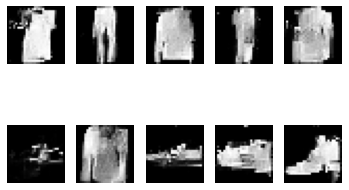

19201 [D loss: 0.688967, acc.: 50.39%] [G loss: 0.714810]
19202 [D loss: 0.686965, acc.: 54.30%] [G loss: 0.711031]
19203 [D loss: 0.690883, acc.: 52.34%] [G loss: 0.710005]
19204 [D loss: 0.688369, acc.: 51.56%] [G loss: 0.719818]
19205 [D loss: 0.691769, acc.: 51.56%] [G loss: 0.713875]
19206 [D loss: 0.689931, acc.: 50.78%] [G loss: 0.717234]
19207 [D loss: 0.692173, acc.: 50.00%] [G loss: 0.720750]
19208 [D loss: 0.687954, acc.: 52.73%] [G loss: 0.721063]
19209 [D loss: 0.685010, acc.: 56.25%] [G loss: 0.721141]
19210 [D loss: 0.681746, acc.: 55.08%] [G loss: 0.726163]
19211 [D loss: 0.688718, acc.: 54.69%] [G loss: 0.731573]
19212 [D loss: 0.688242, acc.: 49.61%] [G loss: 0.719500]
19213 [D loss: 0.684079, acc.: 55.08%] [G loss: 0.719440]
19214 [D loss: 0.685170, acc.: 54.30%] [G loss: 0.726888]
19215 [D loss: 0.686680, acc.: 49.61%] [G loss: 0.728177]
19216 [D loss: 0.686426, acc.: 51.17%] [G loss: 0.724186]
19217 [D loss: 0.684225, acc.: 53.12%] [G loss: 0.724877]
19218 [D loss:

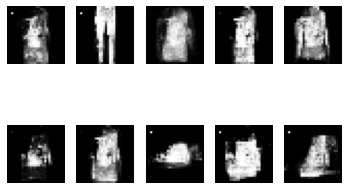

19401 [D loss: 0.720699, acc.: 46.88%] [G loss: 0.685740]
19402 [D loss: 0.742691, acc.: 43.36%] [G loss: 0.673194]
19403 [D loss: 0.734050, acc.: 39.45%] [G loss: 0.680218]
19404 [D loss: 0.729423, acc.: 33.20%] [G loss: 0.685917]
19405 [D loss: 0.727748, acc.: 36.72%] [G loss: 0.702155]
19406 [D loss: 0.707572, acc.: 47.66%] [G loss: 0.727202]
19407 [D loss: 0.691767, acc.: 58.20%] [G loss: 0.756375]
19408 [D loss: 0.671276, acc.: 67.97%] [G loss: 0.804672]
19409 [D loss: 0.653296, acc.: 71.09%] [G loss: 0.841606]
19410 [D loss: 0.633018, acc.: 72.27%] [G loss: 0.879553]
19411 [D loss: 0.628513, acc.: 72.66%] [G loss: 0.910813]
19412 [D loss: 0.637186, acc.: 69.53%] [G loss: 0.898061]
19413 [D loss: 0.630340, acc.: 66.41%] [G loss: 0.862870]
19414 [D loss: 0.654745, acc.: 60.55%] [G loss: 0.799290]
19415 [D loss: 0.672948, acc.: 52.73%] [G loss: 0.758709]
19416 [D loss: 0.704135, acc.: 51.95%] [G loss: 0.704076]
19417 [D loss: 0.727063, acc.: 48.83%] [G loss: 0.670557]
19418 [D loss:

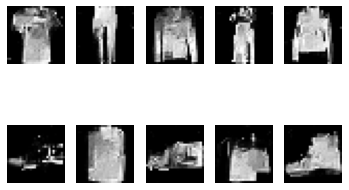

19601 [D loss: 0.678687, acc.: 62.50%] [G loss: 0.725431]
19602 [D loss: 0.678113, acc.: 63.67%] [G loss: 0.717005]
19603 [D loss: 0.681803, acc.: 64.84%] [G loss: 0.722765]
19604 [D loss: 0.680554, acc.: 61.72%] [G loss: 0.728458]
19605 [D loss: 0.677290, acc.: 60.16%] [G loss: 0.724987]
19606 [D loss: 0.677198, acc.: 62.11%] [G loss: 0.725336]
19607 [D loss: 0.681404, acc.: 58.20%] [G loss: 0.728781]
19608 [D loss: 0.674690, acc.: 62.89%] [G loss: 0.723296]
19609 [D loss: 0.674819, acc.: 60.16%] [G loss: 0.721130]
19610 [D loss: 0.679697, acc.: 53.91%] [G loss: 0.723928]
19611 [D loss: 0.678962, acc.: 56.64%] [G loss: 0.725030]
19612 [D loss: 0.683126, acc.: 47.27%] [G loss: 0.720724]
19613 [D loss: 0.678827, acc.: 53.52%] [G loss: 0.728561]
19614 [D loss: 0.679636, acc.: 55.86%] [G loss: 0.727531]
19615 [D loss: 0.680081, acc.: 53.52%] [G loss: 0.726586]
19616 [D loss: 0.679575, acc.: 55.08%] [G loss: 0.726982]
19617 [D loss: 0.678040, acc.: 51.95%] [G loss: 0.722540]
19618 [D loss:

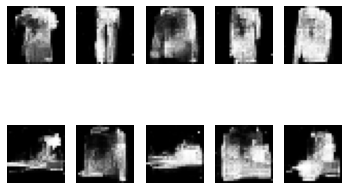

19801 [D loss: 0.696513, acc.: 51.17%] [G loss: 0.709929]
19802 [D loss: 0.698045, acc.: 48.83%] [G loss: 0.731743]
19803 [D loss: 0.717386, acc.: 39.45%] [G loss: 0.704274]
19804 [D loss: 0.726419, acc.: 35.16%] [G loss: 0.722679]
19805 [D loss: 0.714250, acc.: 41.02%] [G loss: 0.693168]
19806 [D loss: 0.722626, acc.: 36.72%] [G loss: 0.707186]
19807 [D loss: 0.711671, acc.: 38.28%] [G loss: 0.717526]
19808 [D loss: 0.707566, acc.: 43.75%] [G loss: 0.736714]
19809 [D loss: 0.692423, acc.: 50.00%] [G loss: 0.745085]
19810 [D loss: 0.682915, acc.: 57.42%] [G loss: 0.762949]
19811 [D loss: 0.679219, acc.: 61.72%] [G loss: 0.780891]
19812 [D loss: 0.665008, acc.: 67.97%] [G loss: 0.782055]
19813 [D loss: 0.662911, acc.: 66.41%] [G loss: 0.788255]
19814 [D loss: 0.657785, acc.: 68.36%] [G loss: 0.797807]
19815 [D loss: 0.665431, acc.: 60.55%] [G loss: 0.803464]
19816 [D loss: 0.666574, acc.: 57.42%] [G loss: 0.771798]
19817 [D loss: 0.672483, acc.: 56.64%] [G loss: 0.756049]
19818 [D loss:

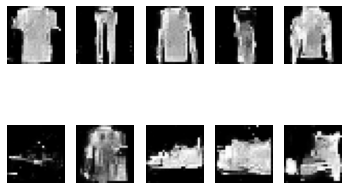

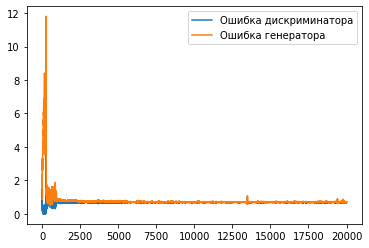

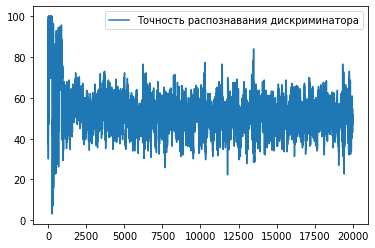

In [32]:
train_conditional(conditional_generator, conditional_discriminator, 20000) # Вызываем функцию train_conditional с параметрами: conditional_generator, conditional_discriminator, 20000 (20000 - количество эпох)

In [39]:
# conditional_generator.save_weights('/content/drive/MyDrive/Colab Notebooks/conditional_generator_1.h5')
conditional_generator.load_weights('/content/drive/MyDrive/Colab Notebooks/conditional_generator_1.h5')


In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [32]:
 
# import os
# import shutil 
# shutil.rmtree('/content/digits')

In [33]:
!unzip '/content/drive/MyDrive/Colab Notebooks/Базы/digits.zip'

Archive:  /content/drive/MyDrive/Colab Notebooks/Базы/digits.zip
   creating: digits/
  inflating: digits/0.jpg            
  inflating: digits/2.jpg            
  inflating: digits/3.jpg            
  inflating: digits/4.jpg            
  inflating: digits/5.jpg            
  inflating: digits/6.jpg            
  inflating: digits/7.jpg            
  inflating: digits/8.jpg            
  inflating: digits/9.jpg            


Соответствующие классы fashion_mnist: 
футболка брюки пуловер платье пальто сандали рубашка кросовки сумка ботильоны 

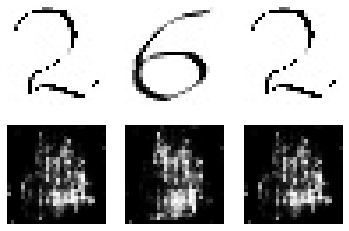

In [41]:
paint_pictures = []
for i in range(3):  
  # paint_pictures.append(image.load_img('digits/' + random.choice(os.listdir('digits/')) , target_size=(28, 28))
  paint_pictures.append(image.load_img('digits/' + random.choice(os.listdir('digits/')) , target_size=(28, 28), color_mode = "grayscale"))

print ("Соответствующие классы fashion_mnist: ")
for i in range(10):
  print(lbl_rus[i],end=' ')

plot_label (idx, conditional_generator, True)